In [1]:
import h5py
import numpy as np
import os
import matplotlib.pyplot as plt
import tensorflow as tf
from tensorflow.keras import layers, models, callbacks, regularizers
import matplotlib.pyplot as plt
from bm3d import bm3d_rgb, BM3DProfile
import sys
module_dir = "/global/u2/k/kberard/SCGSR/Research/Diamond/stock_models/bm3d-4.0.3/bm3d-4.0.3/examples" 
sys.path.insert(0, module_dir)
from experiment_funcs import get_experiment_noise, get_psnr, get_cropped_psnr
from PIL import Image
import math
import torch
import torch.nn as nn
import torch.optim as optim
from thop import profile
from einops import rearrange 
from einops.layers.torch import Rearrange, Reduce
from timm.models.layers import trunc_normal_, DropPath

module_dir_scu = "/global/u2/k/kberard/SCGSR/Research/Diamond/stock_models/SCUNet" 
sys.path.insert(0, module_dir_scu)
from models.network_scunet import SCUNet as SCUNet
from torch.utils.data import Dataset
from utils import utils_image as util
import joblib
from sklearn.preprocessing import MinMaxScaler

2026-02-25 14:59:30.906307: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:467] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1772060370.932926  523823 cuda_dnn.cc:8579] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1772060370.942276  523823 cuda_blas.cc:1407] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
W0000 00:00:1772060370.969792  523823 computation_placer.cc:177] computation placer already registered. Please check linkage and avoid linking the same target more than once.
W0000 00:00:1772060370.969811  523823 computation_placer.cc:177] computation placer already registered. Please check linkage and avoid linking the same target more than once.
W0000 00:00:1772060370.969815  523823 computation_placer.cc:177] computation placer alr

In [2]:
with h5py.File('/global/u2/k/kberard/SCGSR/Research/Diamond/Data/density_tot_ref.h5', 'r') as file:
    dft_d = file['density'][:]
with h5py.File('/pscratch/sd/k/kberard/SCGSR/Data/diamond_1x1x1_bfd/density_data/vmc_J2/density_tot_ref_mean.h5', 'r') as file:
    VMC_ref = file['density'][:]

In [3]:
def D_JS(p1,p2,tol=1e-16):
    p1= p1/np.sum(p1)
    p2=p2/np.sum(p2)
    pm = (p1+p2)/2
    p1_nonzero = np.abs(p1)>tol
    p2_nonzero = np.abs(p2)>tol
    p1  = np.abs(p1[p1_nonzero])
    pm1 = np.abs(pm[p1_nonzero])
    p2  = np.abs(p2[p2_nonzero])
    pm2 = np.abs(pm[p2_nonzero])
    d = .5*( (p1*np.log(p1/pm1)).sum() + (p2*np.log(p2/pm2)).sum() )
    d /= np.log(2) # normalize to max of 1
    return d

In [4]:
def encode_voxel_to_rgb(test_d, save_path='slice_scalers.npz'):
    """
    Normalize each XY slice independently and encode to RGB (repeated channels).
    Saves (min, max) for each slice for reconstruction.
    
    Returns:
        rgb_volume: (64, 64, 64, 3)
    """
    rgb_volume = np.zeros((64, 64, 64, 3), dtype=np.float32)
    mins = []
    maxs = []

    for i in range(64):
        slice_2d = test_d[i, :, :]
        s_min = float(slice_2d.min())
        s_max = float(slice_2d.max())

        if s_max == s_min:
            s_max = s_min + 1e-6  # Avoid divide-by-zero for flat slices

        normed = (slice_2d - s_min) / (s_max - s_min)
        rgb_volume[i, :, :, :] = np.stack([normed]*3, axis=-1)  # (64, 64, 3)

        mins.append(s_min)
        maxs.append(s_max)

    np.savez(save_path, mins=np.array(mins), maxs=np.array(maxs))
    return rgb_volume  # shape: (64, 64, 64, 3)


In [5]:
def decode_rgb_to_voxel(rgb_volume, save_path='slice_scalers.npz'):
    """
    Decode per-slice normalized RGB volume back into scalar 3D volume.
    Assumes all RGB channels are identical.
    
    Args:
        rgb_volume: shape (64, 64, 64, 3)
    """
    data = np.load(save_path)
    mins = data['mins']
    maxs = data['maxs']

    test_d = np.zeros((64, 64, 64), dtype=np.float32)

    for i in range(64):
        rgb_slice = rgb_volume[i]  # (64, 64, 3)
        gray = rgb_slice[:, :, 0]
        restored = gray * (maxs[i] - mins[i]) + mins[i]
        test_d[i] = restored

    return test_d


In [6]:
print("enc dec loaded")

enc dec loaded


In [7]:
#Transform density
def transform(density,density_ref,transform_type):
    dens = density
    dref  = density_ref
    ttype = transform_type
    if ttype=='value':
        dtrans = density
    elif ttype=='sqrt':
        dtrans = np.sqrt(np.abs(density))
    elif ttype=='log':
        dtrans  = np.log(np.abs(density))
    elif ttype=='residual_noise':
        dval  = dref
        dsqrt = np.sqrt(np.abs(dref))
        dtrans = (dens-dval)/dsqrt
    else:
        raise RuntimeError('bad transform type')
    return dtrans


def inverse_transform(density_trans,density_ref,transform_type):
    dref   = density_ref
    ttype  = transform_type
    dtrans = density_trans
    if ttype=='value':
        density = dtrans
    elif ttype=='sqrt':
        density = dtrans**2
    elif ttype=='log':
        density = np.log(np.abs(dtrans))
    elif ttype=='residual_noise':
        dval  = dref
        dsqrt = np.sqrt(np.abs(dref))
        density = dval + dsqrt*dtrans
    else:
        raise RuntimeError('bad transform type')
    return density


dft_path ='/global/u2/k/kberard/SCGSR/Research/Diamond/Data/density_tot_ref.h5'
with h5py.File(dft_path, 'r') as file:
    dft_d = file['density'][:]

In [8]:
############### scunet_Pretrained ###############

def scunet_pre_test_pipeline(test_d, ref_d):
    # Encode
    test_d = transform(test_d,dft_d,'residual_noise')

    test_rgb = encode_voxel_to_rgb(test_d)
    ref_rgb  = encode_voxel_to_rgb(ref_d)

    # Denoise each of 64 RGB slices
    denoised_rgb = np.zeros_like(test_rgb)
    # Load pretrained model
    model = SCUNet(in_nc=3, config=[4, 4, 4, 4, 4, 4, 4], dim=64)
    model_path = '/global/u2/k/kberard/SCGSR/Research/Diamond/stock_models/SCUNet/model_zoo/scunet_color_25.pth'  # Adjust if needed
    model.load_state_dict(torch.load(model_path, map_location='cpu'), strict=True)
    model.eval()
    model.to('cuda' if torch.cuda.is_available() else 'cpu')

    def denoise_with_scunet(rgb_image_np, model, device='cuda'):
        """
        Args:
            rgb_image_np: (H, W, 3), float32 or float64, values in [0,1]
            model: SCUNet model
            device: 'cuda' or 'cpu'
        
        Returns:
            Denoised image (H, W, 3), uint8
        """
        # Make sure image is float32 in [0,1]
        img = rgb_image_np.astype(np.float32)
        img_tensor = util.single2tensor4(img).to(device)
        with torch.no_grad():
            output_tensor = model(img_tensor)
        output_np = util.tensor2single(output_tensor)
        return np.clip(output_np.transpose(1, 2, 0), 0, 1)
    device = 'cuda' if torch.cuda.is_available() else 'cpu'

    

    for i in range(test_rgb.shape[0]):
        
        noisy_slice = test_rgb[i]

        #gray_input = noisy_slice[:, :, 0]  # just one channel
        #denoised_gray = bm3d(gray_input, sigma_psd=sigma)
        #denoised_rgb[i] = np.stack([denoised_gray] * 3, axis=-1)
        denoise =denoise_with_scunet(noisy_slice, model, device=device)
        denoised_rgb[i] = np.transpose(denoise, (0,2,1))
        

    ####

    # Reconstruct full 3D volume
    denoised_d = decode_rgb_to_voxel(denoised_rgb)
    denoised_d = inverse_transform(denoised_d,dft_d,'residual_noise')
    #denoised_d = np.mean(denoised_rgb,axis=3)
    #print(np.linalg.norm(denoised_d))
    #print("ref")

    #print(np.linalg.norm(ref_d))
    #print(np.linalg.norm(np.sum(np.mean(ref_rgb,axis=3),axis=0)))

    # --- Evaluation ---
    print("\n>>> Evaluation Metrics 2D")
    jsd_noisy_2d = D_JS(test_d,
        ref_d
    )
    jsd_denoised_2d = D_JS(
        denoised_d,ref_d
    )

    norm_noisy_2d = np.linalg.norm(test_d - ref_d)
    norm_denoised_2d = np.linalg.norm(denoised_d - ref_d)

    print(f"2-norm (noisy vs ref):     {norm_noisy_2d:.4f}")
    print(f"2-norm (denoised vs ref): {norm_denoised_2d:.4f}")
    print(f"JSD   (noisy vs ref):     {jsd_noisy_2d:.6f}")
    print(f"JSD   (denoised vs ref):  {jsd_denoised_2d:.6f}")

    ##########
    # --- Evaluation ---
    print("\n>>> Evaluation Metrics 3D")
    jsd_noisy = D_JS(test_d,
        ref_d
    )
    jsd_denoised = D_JS(
        denoised_d,ref_d
    )

    norm_noisy = np.linalg.norm(test_d - ref_d)
    norm_denoised = np.linalg.norm(denoised_d - ref_d)

    print(f"2-norm (noisy vs ref):     {norm_noisy:.4f}")
    print(f"2-norm (denoised vs ref): {norm_denoised:.4f}")
    print(f"JSD   (noisy vs ref):     {jsd_noisy:.6f}")
    print(f"JSD   (denoised vs ref):  {jsd_denoised:.6f}")
    #########

    # --- Plot example slices ---
    slice_idx = 32
    plt.figure(figsize=(12, 6))
    titles = ['Noisy', 'Denoised', 'Reference']
    data = [test_d[slice_idx], denoised_d[slice_idx], ref_d[slice_idx]]
    for i in range(3):
        plt.subplot(1, 3, i+1)
        plt.imshow(data[i], cmap='viridis')
        plt.title(f"{titles[i]} (z={slice_idx})")
        plt.axis('off')
    plt.tight_layout()
    plt.show()
    return(denoised_d,jsd_denoised_2d)


In [9]:
print("scunet pretrained loaded")

scunet pretrained loaded


In [10]:
############### scunet_Trained ###############

def scunet_trained_test_pipeline(test_d, ref_d):
    # Encode
    test_d = transform(test_d,dft_d,'residual_noise')
    test_rgb = encode_voxel_to_rgb(test_d)
    ref_rgb  = encode_voxel_to_rgb(ref_d)

    # Denoise each of 64 RGB slices
    denoised_rgb = np.zeros_like(test_rgb)
    
    torch.serialization.add_safe_globals([SCUNet])
    model = torch.load('/pscratch/sd/k/kberard/SCGSR/EDDA/Diamond/Image_Models/Scunet_trained_Models/4843960000000Blob_scunet_trained', weights_only=False, map_location=torch.device("cpu"))
    model.eval()

    def single2tensor4(img):
        """
        Convert HWC image [0,1] float32 to NCHW tensor
        """
        img_tensor = torch.from_numpy(np.transpose(img, (2, 0, 1))).float().unsqueeze(0)  # shape (1, 3, H, W)
        return img_tensor
    def tensor2single(tensor):
        """
        Convert NCHW or CHW tensor to HWC numpy array, clipped to [0,1]
        """
        tensor = tensor.squeeze().cpu().detach().numpy()
        if tensor.ndim == 3:
            img_np = np.transpose(tensor, (1, 2, 0))  # CHW -> HWC
        else:
            img_np = tensor  # in case it's grayscale
        return np.clip(img_np, 0, 1)


    def denoise_with_scunet(rgb_image_np, model, device='cpu'):
        """
        Denoise a single RGB image using SCUNet.
    
        Args:
            rgb_image_np: (H, W, 3), float32, values in [0,1]
            model: PyTorch SCUNet model
            device: 'cuda' or 'cpu'
    
        Returns:
            Denoised image (H, W, 3), float32 in [0,1]
        """
        img = rgb_image_np.astype(np.float32)
        
        # Ensure range is [0, 1]
        img = np.clip(img, 0, 1)
    
        img_tensor = single2tensor4(img).to(device)
    
        with torch.no_grad():
            output_tensor = model(img_tensor)
    
        output_np = tensor2single(output_tensor)
        return output_np

    device = 'cuda' if torch.cuda.is_available() else 'cpu'
    


    
    for i in range(test_rgb.shape[0]):
        noisy_slice = test_rgb[i]  # shape: (H, W, 3)
    
        denoised = denoise_with_scunet(noisy_slice, model, device=device)  # shape: (H, W, 3)
    
        if np.isnan(denoised).any():
            print(f"⚠️ NaNs detected in denoised slice {i}")
    
        denoised_rgb[i] = denoised



        

    ####

    # Reconstruct full 3D volume
    denoised_d = decode_rgb_to_voxel(denoised_rgb)
    denoised_d = inverse_transform(denoised_d,dft_d,'residual_noise')


    # --- Evaluation ---
    print("\n>>> Evaluation Metrics 2D")
    jsd_noisy_2d = D_JS(test_d,
       ref_d
    )
    jsd_denoised_2d = D_JS(
        denoised_d,ref_d
    )

    norm_noisy_2d = np.linalg.norm(test_d - ref_d)
    norm_denoised_2d = np.linalg.norm(denoised_d -ref_d)

    print(f"2-norm (noisy vs ref):     {norm_noisy_2d:.4f}")
    print(f"2-norm (denoised vs ref): {norm_denoised_2d:.4f}")
    print(f"JSD   (noisy vs ref):     {jsd_noisy_2d:.6f}")
    print(f"JSD   (denoised vs ref):  {jsd_denoised_2d:.6f}")

    ##########
    # --- Evaluation ---
    print("\n>>> Evaluation Metrics 3D")
    jsd_noisy = D_JS(test_d,
        ref_d
    )
    jsd_denoised = D_JS(
        denoised_d,ref_d
    )

    norm_noisy = np.linalg.norm(test_d - ref_d)
    norm_denoised = np.linalg.norm(denoised_d - ref_d)

    print(f"2-norm (noisy vs ref):     {norm_noisy:.4f}")
    print(f"2-norm (denoised vs ref): {norm_denoised:.4f}")
    print(f"JSD   (noisy vs ref):     {jsd_noisy:.6f}")
    print(f"JSD   (denoised vs ref):  {jsd_denoised:.6f}")
    #########

    # --- Plot example slices ---
    slice_idx = 32
    plt.figure(figsize=(12, 6))
    titles = ['Noisy', 'Denoised', 'Reference']
    data = [test_d[slice_idx], denoised_d[slice_idx], ref_d[slice_idx]]
    for i in range(3):
        plt.subplot(1, 3, i+1)
        plt.imshow(data[i], cmap='viridis')
        plt.title(f"{titles[i]} (z={slice_idx})")
        plt.axis('off')
    plt.tight_layout()
    plt.show()
    return(denoised_d,jsd_denoised_2d)


In [11]:
print("scunet trained loaded")

scunet trained loaded


In [12]:
import os

current_working_directory = os.getcwd()
print(current_working_directory)


/pscratch/sd/k/kberard/SCGSR/EDDA/Diamond/Image_Models/Image_Model_Run


In [13]:
############## scunet_TL ##################


def scunet_FT_test_pipeline(test_d, ref_d):
    # Set device first
    test_d = transform(test_d,dft_d,'residual_noise')
    device = 'cuda' if torch.cuda.is_available() else 'cpu'

    # Encode
    test_rgb = encode_voxel_to_rgb(test_d)
    ref_rgb  = encode_voxel_to_rgb(ref_d)

    # Denoise each of 64 RGB slices
    denoised_rgb = np.zeros_like(test_rgb)

    # Optional: only needed if loading full model with class definition
    torch.serialization.add_safe_globals([SCUNet])

    # Load model AFTER setting device
    model = torch.load('/pscratch/sd/k/kberard/SCGSR/EDDA/Diamond/Image_Models/Scunet_FT_Models/4843960000000Blob_scunet_FT', map_location='cpu', weights_only=False)
    model.eval()

    def single2tensor4(img):
        """
        Convert HWC image [0,1] float32 to NCHW tensor
        """
        img_tensor = torch.from_numpy(np.transpose(img, (2, 0, 1))).float().unsqueeze(0)  # shape (1, 3, H, W)
        return img_tensor
    def tensor2single(tensor):
        """
        Convert NCHW or CHW tensor to HWC numpy array, clipped to [0,1]
        """
        tensor = tensor.squeeze().cpu().detach().numpy()
        if tensor.ndim == 3:
            img_np = np.transpose(tensor, (1, 2, 0))  # CHW -> HWC
        else:
            img_np = tensor  # in case it's grayscale
        return np.clip(img_np, 0, 1)


    def denoise_with_scunet(rgb_image_np, model, device='cuda'):
        """
        Denoise a single RGB image using SCUNet.
    
        Args:
            rgb_image_np: (H, W, 3), float32, values in [0,1]
            model: PyTorch SCUNet model
            device: 'cuda' or 'cpu'
    
        Returns:
            Denoised image (H, W, 3), float32 in [0,1]
        """
        img = rgb_image_np.astype(np.float32)
        
        # Ensure range is [0, 1]
        img = np.clip(img, 0, 1)
    
        img_tensor = single2tensor4(img).to(device)
    
        with torch.no_grad():
            output_tensor = model(img_tensor)
    
        output_np = tensor2single(output_tensor)
        return output_np

    device = 'cuda' if torch.cuda.is_available() else 'cpu'
    


    
    for i in range(test_rgb.shape[0]):
        noisy_slice = test_rgb[i]  # shape: (H, W, 3)
    
        denoised = denoise_with_scunet(noisy_slice, model, device=device)  # shape: (H, W, 3)
    
        if np.isnan(denoised).any():
            print(f"⚠️ NaNs detected in denoised slice {i}")
    
        denoised_rgb[i] = denoised



        

    ####

    # Reconstruct full 3D volume
    denoised_d = decode_rgb_to_voxel(denoised_rgb)
    denoised_d = inverse_transform(denoised_d,dft_d,'residual_noise')
    
    # --- Evaluation ---
    print("\n>>> Evaluation Metrics 2D")
    jsd_noisy_2d = D_JS(test_d,
        ref_d
    )
    jsd_denoised_2d = D_JS(
        denoised_d,ref_d
    )

    norm_noisy_2d = np.linalg.norm(test_d - ref_d)
    norm_denoised_2d = np.linalg.norm(denoised_d - ref_d)

    print(f"2-norm (noisy vs ref):     {norm_noisy_2d:.4f}")
    print(f"2-norm (denoised vs ref): {norm_denoised_2d:.4f}")
    print(f"JSD   (noisy vs ref):     {jsd_noisy_2d:.6f}")
    print(f"JSD   (denoised vs ref):  {jsd_denoised_2d:.6f}")

    ##########
    # --- Evaluation ---
    print("\n>>> Evaluation Metrics 3D")
    jsd_noisy = D_JS(test_d,
        ref_d
    )
    jsd_denoised = D_JS(
        denoised_d,ref_d
    )

    norm_noisy = np.linalg.norm(test_d - ref_d)
    norm_denoised = np.linalg.norm(denoised_d - ref_d)

    print(f"2-norm (noisy vs ref):     {norm_noisy:.4f}")
    print(f"2-norm (denoised vs ref): {norm_denoised:.4f}")
    print(f"JSD   (noisy vs ref):     {jsd_noisy:.6f}")
    print(f"JSD   (denoised vs ref):  {jsd_denoised:.6f}")
    #########

    # --- Plot example slices ---
    slice_idx = 32
    plt.figure(figsize=(12, 6))
    titles = ['Noisy', 'Denoised', 'Reference']
    data = [test_d[slice_idx], denoised_d[slice_idx], ref_d[slice_idx]]
    for i in range(3):
        plt.subplot(1, 3, i+1)
        plt.imshow(data[i], cmap='viridis')
        plt.title(f"{titles[i]} (z={slice_idx})")
        plt.axis('off')
    plt.tight_layout()
    plt.show()
    return(denoised_d,jsd_denoised_2d)


In [14]:
print("scunet TL loaded")

scunet TL loaded


In [15]:
from keras.models import load_model
import keras

############# Nature #####################
import tensorflow as tf
@tf.keras.utils.register_keras_serializable()
class OnesLikeLayer(tf.keras.layers.Layer):
    def call(self, inputs):
        return tf.ones_like(inputs)
def ones_like_fn(a):
    return tf.ones_like(a)
# Now load the model
nature_mod = tf.keras.models.load_model(
    '/pscratch/sd/k/kberard/SCGSR/EDDA/Diamond/Image_Models/Nature_Models/4843960000000Blob_2d_Nature.keras',
    custom_objects={'ones_like_fn': ones_like_fn}
)

from keras.layers import Lambda

layer = Lambda(lambda x: x, output_shape=(64, 64, 3))
def Nature_test_pipeline(test_d, ref_d):
    test_d = transform(test_d,dft_d,'residual_noise')
    test_rgb = encode_voxel_to_rgb(test_d)
    denoised_rgb = CAE_mod.predict(test_rgb)
    ref_rgb  = encode_voxel_to_rgb(ref_d)
    print(denoised_rgb.shape,"x_test_shape")

    # Denoise each of 64 RGB slices
    #denoised_rgb = np.zeros_like(test_rgb)
    
    #denoised_rgb = nature_mod.predict(noisy_slice)  # shape: (H, W, 3)
    


    # Reconstruct full 3D volume
    denoised_d = decode_rgb_to_voxel(denoised_rgb)
    denoised_d = inverse_transform(denoised_d,dft_d,'residual_noise')


    # --- Evaluation ---
    print("\n>>> Evaluation Metrics 2D")
    jsd_noisy_2d = D_JS(test_d,
        ref_d
    )
    jsd_denoised_2d = D_JS(
        denoised_d,ref_d
    )

    norm_noisy_2d = np.linalg.norm(test_d - ref_d)
    norm_denoised_2d = np.linalg.norm(denoised_d - ref_d)

    print(f"2-norm (noisy vs ref):     {norm_noisy_2d:.4f}")
    print(f"2-norm (denoised vs ref): {norm_denoised_2d:.4f}")
    print(f"JSD   (noisy vs ref):     {jsd_noisy_2d:.6f}")
    print(f"JSD   (denoised vs ref):  {jsd_denoised_2d:.6f}")

    ##########
    # --- Evaluation ---
    print("\n>>> Evaluation Metrics 3D")
    jsd_noisy = D_JS(test_d,
        ref_d
    )
    jsd_denoised = D_JS(
        denoised_d,ref_d
    )

    norm_noisy = np.linalg.norm(test_d - ref_d)
    norm_denoised = np.linalg.norm(denoised_d - ref_d)

    print(f"2-norm (noisy vs ref):     {norm_noisy:.4f}")
    print(f"2-norm (denoised vs ref): {norm_denoised:.4f}")
    print(f"JSD   (noisy vs ref):     {jsd_noisy:.6f}")
    print(f"JSD   (denoised vs ref):  {jsd_denoised:.6f}")
    #########

    # --- Plot example slices ---
    slice_idx = 32
    plt.figure(figsize=(12, 6))
    titles = ['Noisy', 'Denoised', 'Reference']
    data = [test_d[slice_idx], denoised_d[slice_idx], ref_d[slice_idx]]
    for i in range(3):
        plt.subplot(1, 3, i+1)
        plt.imshow(data[i], cmap='viridis')
        plt.title(f"{titles[i]} (z={slice_idx})")
        plt.axis('off')
    plt.tight_layout()
    plt.show()
    return(denoised_d,jsd_denoised_2d)


I0000 00:00:1772060393.369932  523823 gpu_device.cc:2019] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 1780 MB memory:  -> device: 0, name: NVIDIA A100-PCIE-40GB, pci bus id: 0000:c3:00.0, compute capability: 8.0


In [16]:
print("natrure model loaded")

natrure model loaded


In [17]:
############### CAE_img_enc ###############
from keras.models import load_model
import keras
keras.config.enable_unsafe_deserialization()
CAE_mod = load_model('/pscratch/sd/k/kberard/SCGSR/EDDA/Diamond/Image_Models/CAE_img_Models/Blob_CAE_IMG_enc.keras')
from keras.layers import Lambda

def CAE_test_pipeline(test_d, ref_d):
    # Encode
    test_d = transform(test_d,dft_d,'residual_noise')
    test_rgb = encode_voxel_to_rgb(test_d)
    ref_rgb  = encode_voxel_to_rgb(ref_d)

    
    denoised_rgb = CAE_mod.predict(test_rgb)  # shape: (H, W, 3)
    



    # Reconstruct full 3D volume
    denoised_d = decode_rgb_to_voxel(denoised_rgb)
    denoised_d = inverse_transform(denoised_d,dft_d,'residual_noise')


    # --- Evaluation ---
    print("\n>>> Evaluation Metrics 2D")
    jsd_noisy_2d = D_JS(test_d,
        ref_d
    )
    jsd_denoised_2d = D_JS(
        denoised_d,ref_d
    )

    norm_noisy_2d = np.linalg.norm(test_d - ref_d)
    norm_denoised_2d = np.linalg.norm(denoised_d - ref_d)

    print(f"2-norm (noisy vs ref):     {norm_noisy_2d:.4f}")
    print(f"2-norm (denoised vs ref): {norm_denoised_2d:.4f}")
    print(f"JSD   (noisy vs ref):     {jsd_noisy_2d:.6f}")
    print(f"JSD   (denoised vs ref):  {jsd_denoised_2d:.6f}")

    ##########
    # --- Evaluation ---
    print("\n>>> Evaluation Metrics 3D")
    jsd_noisy = D_JS(test_d,
        ref_d
    )
    jsd_denoised = D_JS(
        denoised_d,ref_d
    )

    norm_noisy = np.linalg.norm(test_d - ref_d)
    norm_denoised = np.linalg.norm(denoised_d - ref_d)

    print(f"2-norm (noisy vs ref):     {norm_noisy:.4f}")
    print(f"2-norm (denoised vs ref): {norm_denoised:.4f}")
    print(f"JSD   (noisy vs ref):     {jsd_noisy:.6f}")
    print(f"JSD   (denoised vs ref):  {jsd_denoised:.6f}")
    #########

    # --- Plot example slices ---
    slice_idx = 32
    plt.figure(figsize=(12, 6))
    titles = ['Noisy', 'Denoised', 'Reference']
    data = [test_d[slice_idx], denoised_d[slice_idx], ref_d[slice_idx]]
    for i in range(3):
        plt.subplot(1, 3, i+1)
        plt.imshow(data[i], cmap='viridis')
        plt.title(f"{titles[i]} (z={slice_idx})")
        plt.axis('off')
    plt.tight_layout()
    plt.show()
    return(denoised_d,jsd_denoised_2d)
    


In [18]:
print("CAE img loaded")

CAE img loaded


In [19]:
from bm3d import bm3d
def bm3d_test_pipeline(test_d, ref_d):
    # Encode
    test_d = transform(test_d,dft_d,'residual_noise')
    test_rgb = encode_voxel_to_rgb(test_d)
    ref_rgb  = encode_voxel_to_rgb(ref_d)

    # Denoise each of 64 RGB slices
    denoised_rgb = np.zeros_like(test_rgb)
    N = 100
    sigma = np.sqrt(1.0 / N)
    print("here")
    print(test_rgb.shape)



    #######
    for i in range(64):
        noisy_slice = test_rgb[i]

        gray_input = noisy_slice[:, :, 0]  # just one channel
        denoised_gray = bm3d(gray_input, sigma_psd=sigma)
        denoised_rgb[i] = np.stack([denoised_gray] * 3, axis=-1)

    ####

    # Reconstruct full 3D volume
    denoised_d = decode_rgb_to_voxel(denoised_rgb)
    denoised_d = inverse_transform(denoised_d,dft_d,'residual_noise')


    # --- Evaluation ---
    print("\n>>> Evaluation Metrics 2D")
    jsd_noisy_2d = D_JS(test_d,
        ref_d
    )
    jsd_denoised_2d = D_JS(
        denoised_d,ref_d
    )

    norm_noisy_2d = np.linalg.norm(test_d - ref_d)
    norm_denoised_2d = np.linalg.norm(denoised_d - ref_d)

    print(f"2-norm (noisy vs ref):     {norm_noisy_2d:.4f}")
    print(f"2-norm (denoised vs ref): {norm_denoised_2d:.4f}")
    print(f"JSD   (noisy vs ref):     {jsd_noisy_2d:.6f}")
    print(f"JSD   (denoised vs ref):  {jsd_denoised_2d:.6f}")

    ##########
    # --- Evaluation ---
    print("\n>>> Evaluation Metrics 3D")
    jsd_noisy = D_JS(test_d,
        ref_d
    )
    jsd_denoised = D_JS(
        denoised_d,ref_d
    )

    norm_noisy = np.linalg.norm(test_d - ref_d)
    norm_denoised = np.linalg.norm(denoised_d - ref_d)

    print(f"2-norm (noisy vs ref):     {norm_noisy:.4f}")
    print(f"2-norm (denoised vs ref): {norm_denoised:.4f}")
    print(f"JSD   (noisy vs ref):     {jsd_noisy:.6f}")
    print(f"JSD   (denoised vs ref):  {jsd_denoised:.6f}")
    #########

    # --- Plot example slices ---
    slice_idx = 32
    plt.figure(figsize=(12, 6))
    titles = ['Noisy', 'Denoised', 'Reference']
    data = [test_d[slice_idx], denoised_d[slice_idx], ref_d[slice_idx]]
    for i in range(3):
        plt.subplot(1, 3, i+1)
        plt.imshow(data[i], cmap='viridis')
        plt.title(f"{titles[i]} (z={slice_idx})")
        plt.axis('off')
    plt.tight_layout()
    plt.show()
    return(denoised_d,jsd_denoised_2d)

In [20]:
print("BM3D Loaded")

BM3D Loaded


In [21]:
def run_denoising_pipeline(noisy_path, ref_path, model_name, output_file='denoised_blob_output.npy'):
    # convert h5 arrays 
    import h5py
    import numpy as np

    # Load data
    with h5py.File(ref_path, 'r') as file:
        ref_d = file['density'][:]
    with h5py.File(noisy_path, 'r') as file:
        test_d = file['density'][:]

    # Pick model pipeline
    if model_name == 'scunet_trained':
        denoised_density,jsd_denoised =scunet_trained_test_pipeline(test_d, ref_d)
    elif model_name == 'scunet_pre':
        denoised_density,jsd_denoised =scunet_pre_test_pipeline(test_d, ref_d)
    elif model_name == 'scunet_ft':
        denoised_density,jsd_denoised =scunet_FT_test_pipeline(test_d, ref_d)
    elif model_name == 'nature':
        denoised_density,jsd_denoised =Nature_test_pipeline(test_d, ref_d)
    elif model_name == 'CAE':
        denoised_density,jsd_denoised =CAE_test_pipeline(test_d, ref_d)
    elif model_name == 'CAE_3D':
        denoised_density,jsd_denoised =CAE_3D_test_pipeline(test_d, ref_d)
    elif model_name == 'bm3d':
        denoised_density,jsd_denoised =bm3d_test_pipeline(test_d, ref_d)
    else:
        raise ValueError(f"Unsupported model name: {model_name}")

    # Save denoised result
    #np.save(output_file, denoised_density)
    print(f"\n Denoised matrix saved to {output_file}")
    return(denoised_density,jsd_denoised)


Found 33 noisy files.

=== Running model: scunet_trained ===

>>> Evaluation Metrics 2D
2-norm (noisy vs ref):     5.2365
2-norm (denoised vs ref): 0.0006
JSD   (noisy vs ref):     52.063201
JSD   (denoised vs ref):  0.000112

>>> Evaluation Metrics 3D
2-norm (noisy vs ref):     5.2365
2-norm (denoised vs ref): 0.0006
JSD   (noisy vs ref):     52.063201
JSD   (denoised vs ref):  0.000112


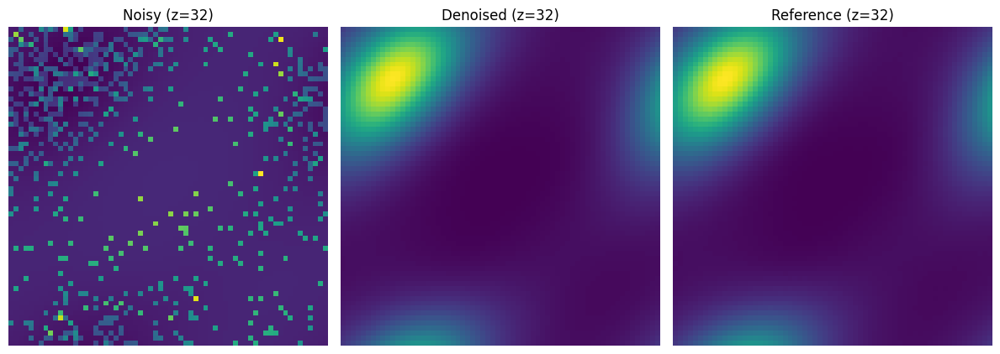


 Denoised matrix saved to /pscratch/sd/k/kberard/SCGSR/Data/diamond_1x1x1_bfd/density_data/vmc_J2/density_tot_vmc_mean_0000010240_scunet_trained_denoised.npy
Sample 10240 | scunet_trained JSD = 0.000112

>>> Evaluation Metrics 2D
2-norm (noisy vs ref):     3.7153
2-norm (denoised vs ref): 0.0006
JSD   (noisy vs ref):     38.646104
JSD   (denoised vs ref):  0.000109

>>> Evaluation Metrics 3D
2-norm (noisy vs ref):     3.7153
2-norm (denoised vs ref): 0.0006
JSD   (noisy vs ref):     38.646104
JSD   (denoised vs ref):  0.000109


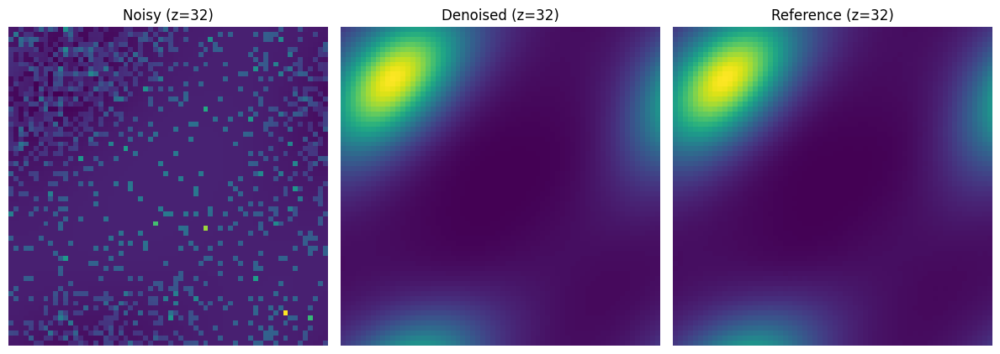


 Denoised matrix saved to /pscratch/sd/k/kberard/SCGSR/Data/diamond_1x1x1_bfd/density_data/vmc_J2/density_tot_vmc_mean_0000020480_scunet_trained_denoised.npy
Sample 20480 | scunet_trained JSD = 0.000109

>>> Evaluation Metrics 2D
2-norm (noisy vs ref):     2.6176
2-norm (denoised vs ref): 0.0006
JSD   (noisy vs ref):     34.109040
JSD   (denoised vs ref):  0.000105

>>> Evaluation Metrics 3D
2-norm (noisy vs ref):     2.6176
2-norm (denoised vs ref): 0.0006
JSD   (noisy vs ref):     34.109040
JSD   (denoised vs ref):  0.000105


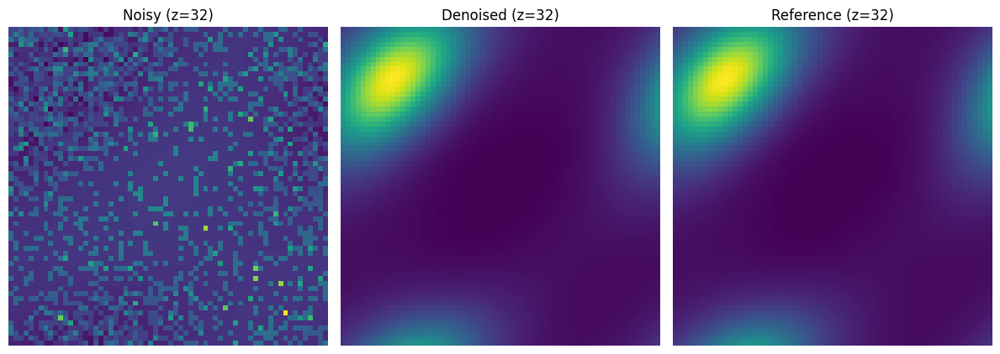


 Denoised matrix saved to /pscratch/sd/k/kberard/SCGSR/Data/diamond_1x1x1_bfd/density_data/vmc_J2/density_tot_vmc_mean_0000040960_scunet_trained_denoised.npy
Sample 40960 | scunet_trained JSD = 0.000105

>>> Evaluation Metrics 2D
2-norm (noisy vs ref):     1.8514
2-norm (denoised vs ref): 0.0006
JSD   (noisy vs ref):     24.002402
JSD   (denoised vs ref):  0.000102

>>> Evaluation Metrics 3D
2-norm (noisy vs ref):     1.8514
2-norm (denoised vs ref): 0.0006
JSD   (noisy vs ref):     24.002402
JSD   (denoised vs ref):  0.000102


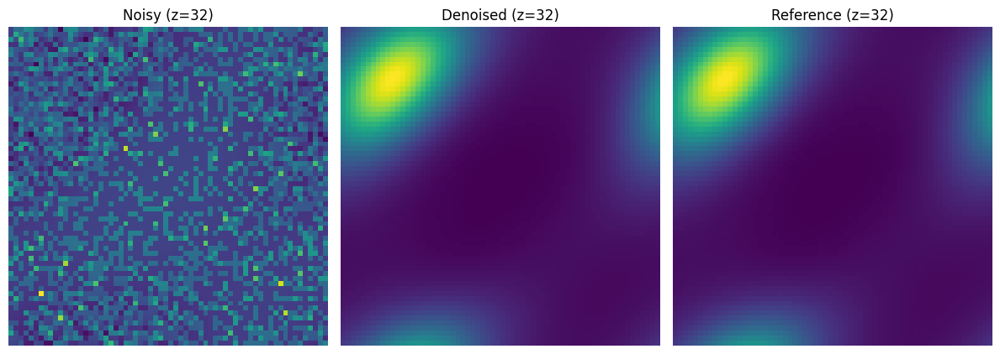


 Denoised matrix saved to /pscratch/sd/k/kberard/SCGSR/Data/diamond_1x1x1_bfd/density_data/vmc_J2/density_tot_vmc_mean_0000081920_scunet_trained_denoised.npy
Sample 81920 | scunet_trained JSD = 0.000102

>>> Evaluation Metrics 2D
2-norm (noisy vs ref):     1.3096
2-norm (denoised vs ref): 0.0006
JSD   (noisy vs ref):     19.183826
JSD   (denoised vs ref):  0.000099

>>> Evaluation Metrics 3D
2-norm (noisy vs ref):     1.3096
2-norm (denoised vs ref): 0.0006
JSD   (noisy vs ref):     19.183826
JSD   (denoised vs ref):  0.000099


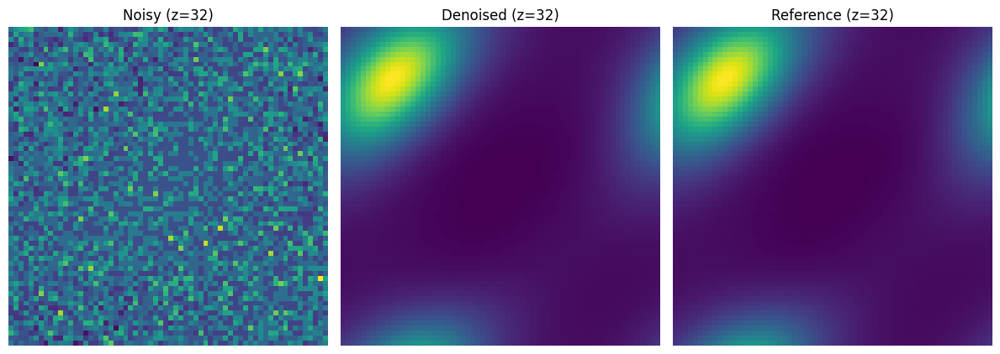


 Denoised matrix saved to /pscratch/sd/k/kberard/SCGSR/Data/diamond_1x1x1_bfd/density_data/vmc_J2/density_tot_vmc_mean_0000163840_scunet_trained_denoised.npy
Sample 163840 | scunet_trained JSD = 0.000099

>>> Evaluation Metrics 2D
2-norm (noisy vs ref):     0.9276
2-norm (denoised vs ref): 0.0006
JSD   (noisy vs ref):     13.825756
JSD   (denoised vs ref):  0.000098

>>> Evaluation Metrics 3D
2-norm (noisy vs ref):     0.9276
2-norm (denoised vs ref): 0.0006
JSD   (noisy vs ref):     13.825756
JSD   (denoised vs ref):  0.000098


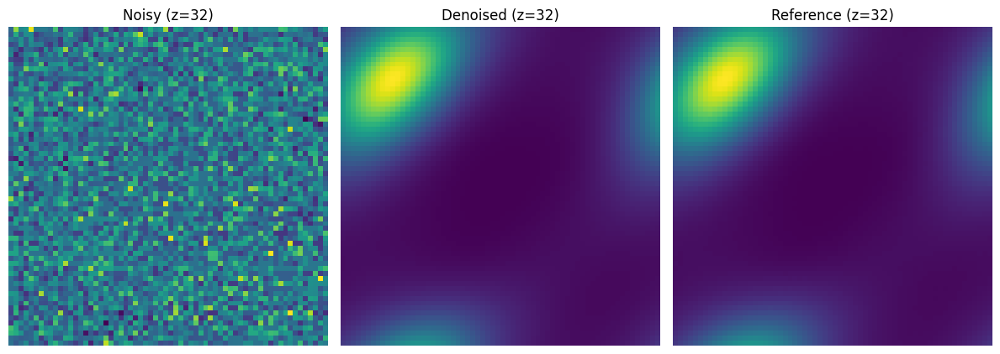


 Denoised matrix saved to /pscratch/sd/k/kberard/SCGSR/Data/diamond_1x1x1_bfd/density_data/vmc_J2/density_tot_vmc_mean_0000327680_scunet_trained_denoised.npy
Sample 327680 | scunet_trained JSD = 0.000098

>>> Evaluation Metrics 2D
2-norm (noisy vs ref):     0.8108
2-norm (denoised vs ref): 0.0006
JSD   (noisy vs ref):     11.998552
JSD   (denoised vs ref):  0.000098

>>> Evaluation Metrics 3D
2-norm (noisy vs ref):     0.8108
2-norm (denoised vs ref): 0.0006
JSD   (noisy vs ref):     11.998552
JSD   (denoised vs ref):  0.000098


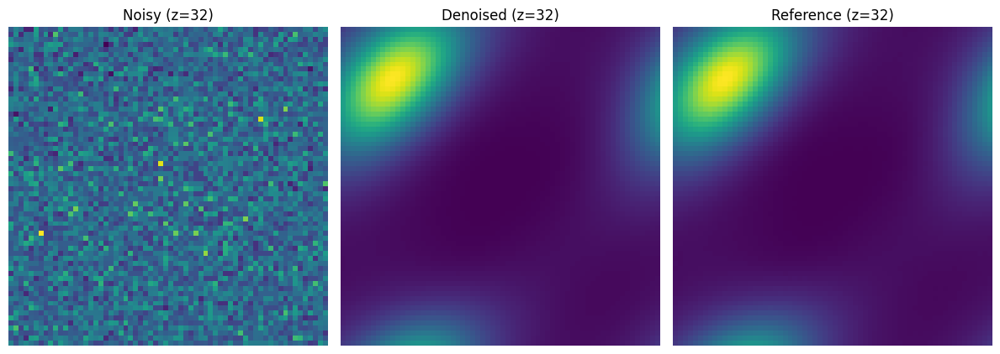


 Denoised matrix saved to /pscratch/sd/k/kberard/SCGSR/Data/diamond_1x1x1_bfd/density_data/vmc_J2/density_tot_vmc_mean_0000430080_scunet_trained_denoised.npy
Sample 430080 | scunet_trained JSD = 0.000098

>>> Evaluation Metrics 2D
2-norm (noisy vs ref):     0.6583
2-norm (denoised vs ref): 0.0006
JSD   (noisy vs ref):     9.441314
JSD   (denoised vs ref):  0.000097

>>> Evaluation Metrics 3D
2-norm (noisy vs ref):     0.6583
2-norm (denoised vs ref): 0.0006
JSD   (noisy vs ref):     9.441314
JSD   (denoised vs ref):  0.000097


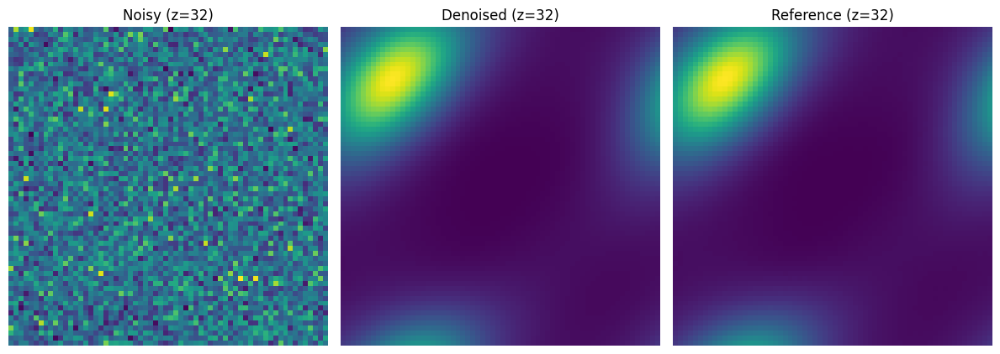


 Denoised matrix saved to /pscratch/sd/k/kberard/SCGSR/Data/diamond_1x1x1_bfd/density_data/vmc_J2/density_tot_vmc_mean_0000655360_scunet_trained_denoised.npy
Sample 655360 | scunet_trained JSD = 0.000097

>>> Evaluation Metrics 2D
2-norm (noisy vs ref):     0.5753
2-norm (denoised vs ref): 0.0006
JSD   (noisy vs ref):     8.264836
JSD   (denoised vs ref):  0.000097

>>> Evaluation Metrics 3D
2-norm (noisy vs ref):     0.5753
2-norm (denoised vs ref): 0.0006
JSD   (noisy vs ref):     8.264836
JSD   (denoised vs ref):  0.000097


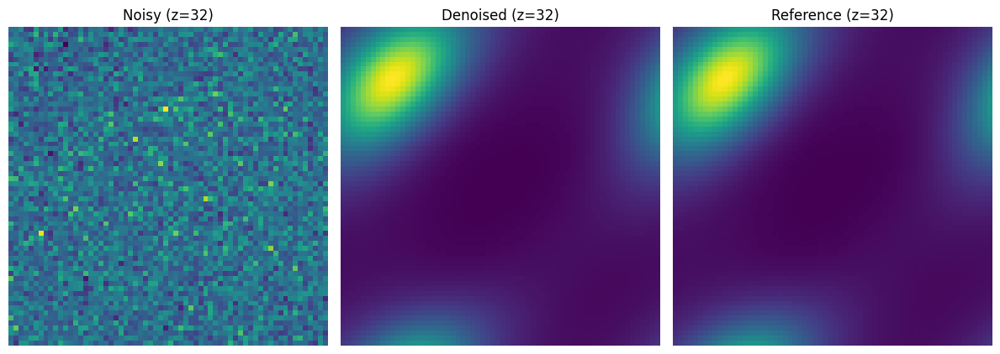


 Denoised matrix saved to /pscratch/sd/k/kberard/SCGSR/Data/diamond_1x1x1_bfd/density_data/vmc_J2/density_tot_vmc_mean_0000860160_scunet_trained_denoised.npy
Sample 860160 | scunet_trained JSD = 0.000097

>>> Evaluation Metrics 2D
2-norm (noisy vs ref):     0.4693
2-norm (denoised vs ref): 0.0006
JSD   (noisy vs ref):     6.710627
JSD   (denoised vs ref):  0.000096

>>> Evaluation Metrics 3D
2-norm (noisy vs ref):     0.4693
2-norm (denoised vs ref): 0.0006
JSD   (noisy vs ref):     6.710627
JSD   (denoised vs ref):  0.000096


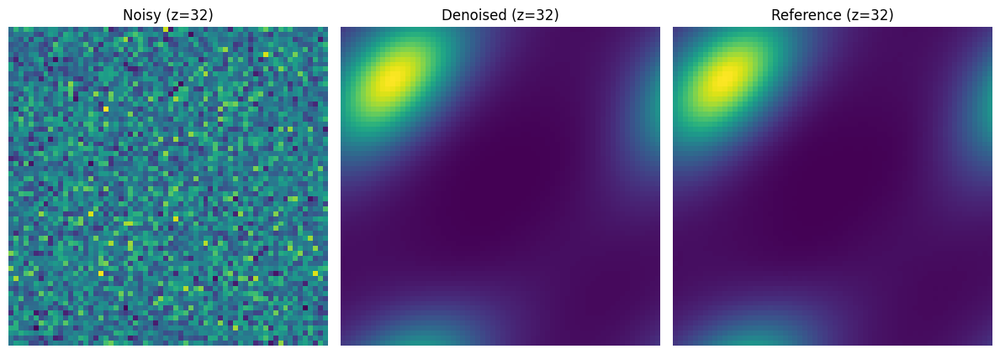


 Denoised matrix saved to /pscratch/sd/k/kberard/SCGSR/Data/diamond_1x1x1_bfd/density_data/vmc_J2/density_tot_vmc_mean_0001310720_scunet_trained_denoised.npy
Sample 1310720 | scunet_trained JSD = 0.000096

>>> Evaluation Metrics 2D
2-norm (noisy vs ref):     0.4100
2-norm (denoised vs ref): 0.0006
JSD   (noisy vs ref):     5.773285
JSD   (denoised vs ref):  0.000095

>>> Evaluation Metrics 3D
2-norm (noisy vs ref):     0.4100
2-norm (denoised vs ref): 0.0006
JSD   (noisy vs ref):     5.773285
JSD   (denoised vs ref):  0.000095


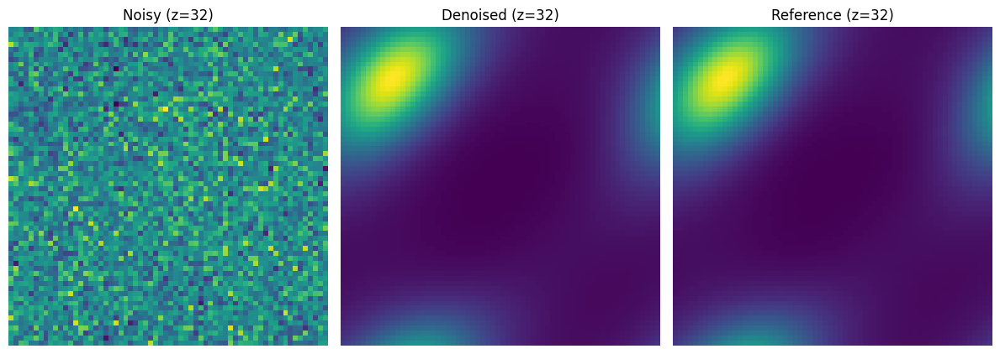


 Denoised matrix saved to /pscratch/sd/k/kberard/SCGSR/Data/diamond_1x1x1_bfd/density_data/vmc_J2/density_tot_vmc_mean_0001720320_scunet_trained_denoised.npy
Sample 1720320 | scunet_trained JSD = 0.000095

>>> Evaluation Metrics 2D
2-norm (noisy vs ref):     0.3366
2-norm (denoised vs ref): 0.0006
JSD   (noisy vs ref):     4.829274
JSD   (denoised vs ref):  0.000094

>>> Evaluation Metrics 3D
2-norm (noisy vs ref):     0.3366
2-norm (denoised vs ref): 0.0006
JSD   (noisy vs ref):     4.829274
JSD   (denoised vs ref):  0.000094


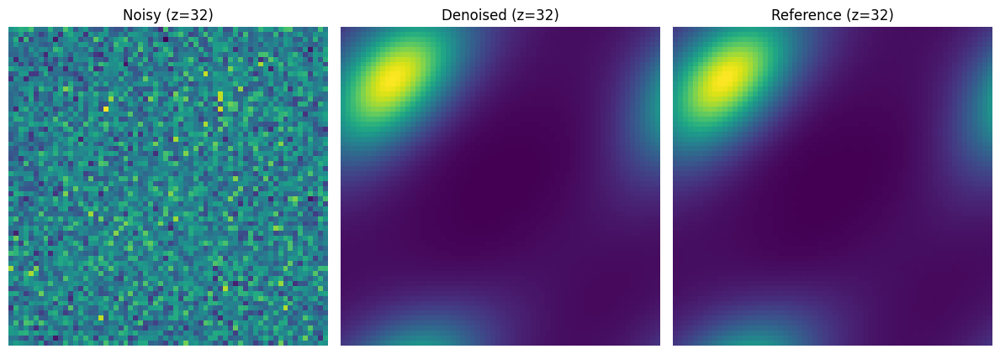


 Denoised matrix saved to /pscratch/sd/k/kberard/SCGSR/Data/diamond_1x1x1_bfd/density_data/vmc_J2/density_tot_vmc_mean_0002621440_scunet_trained_denoised.npy
Sample 2621440 | scunet_trained JSD = 0.000094

>>> Evaluation Metrics 2D
2-norm (noisy vs ref):     0.2957
2-norm (denoised vs ref): 0.0006
JSD   (noisy vs ref):     4.214717
JSD   (denoised vs ref):  0.000093

>>> Evaluation Metrics 3D
2-norm (noisy vs ref):     0.2957
2-norm (denoised vs ref): 0.0006
JSD   (noisy vs ref):     4.214717
JSD   (denoised vs ref):  0.000093


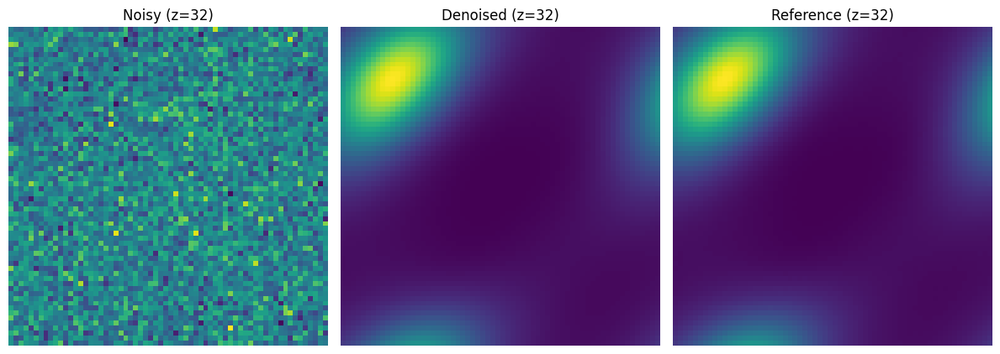


 Denoised matrix saved to /pscratch/sd/k/kberard/SCGSR/Data/diamond_1x1x1_bfd/density_data/vmc_J2/density_tot_vmc_mean_0003440640_scunet_trained_denoised.npy
Sample 3440640 | scunet_trained JSD = 0.000093

>>> Evaluation Metrics 2D
2-norm (noisy vs ref):     0.2466
2-norm (denoised vs ref): 0.0006
JSD   (noisy vs ref):     3.612919
JSD   (denoised vs ref):  0.000091

>>> Evaluation Metrics 3D
2-norm (noisy vs ref):     0.2466
2-norm (denoised vs ref): 0.0006
JSD   (noisy vs ref):     3.612919
JSD   (denoised vs ref):  0.000091


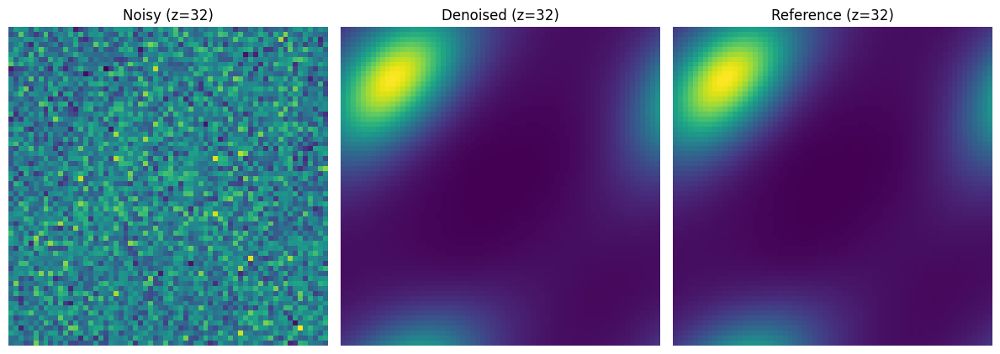


 Denoised matrix saved to /pscratch/sd/k/kberard/SCGSR/Data/diamond_1x1x1_bfd/density_data/vmc_J2/density_tot_vmc_mean_0005160960_scunet_trained_denoised.npy
Sample 5160960 | scunet_trained JSD = 0.000091

>>> Evaluation Metrics 2D
2-norm (noisy vs ref):     0.2450
2-norm (denoised vs ref): 0.0006
JSD   (noisy vs ref):     3.572269
JSD   (denoised vs ref):  0.000091

>>> Evaluation Metrics 3D
2-norm (noisy vs ref):     0.2450
2-norm (denoised vs ref): 0.0006
JSD   (noisy vs ref):     3.572269
JSD   (denoised vs ref):  0.000091


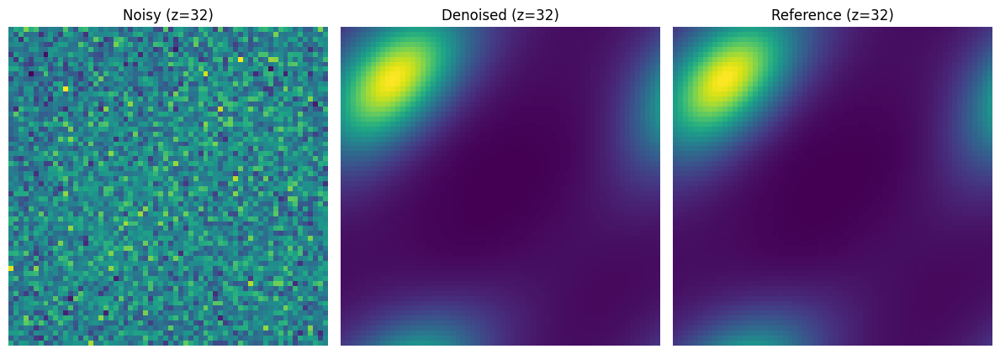


 Denoised matrix saved to /pscratch/sd/k/kberard/SCGSR/Data/diamond_1x1x1_bfd/density_data/vmc_J2/density_tot_vmc_mean_0005242880_scunet_trained_denoised.npy
Sample 5242880 | scunet_trained JSD = 0.000091

>>> Evaluation Metrics 2D
2-norm (noisy vs ref):     0.2177
2-norm (denoised vs ref): 0.0006
JSD   (noisy vs ref):     3.210400
JSD   (denoised vs ref):  0.000090

>>> Evaluation Metrics 3D
2-norm (noisy vs ref):     0.2177
2-norm (denoised vs ref): 0.0006
JSD   (noisy vs ref):     3.210400
JSD   (denoised vs ref):  0.000090


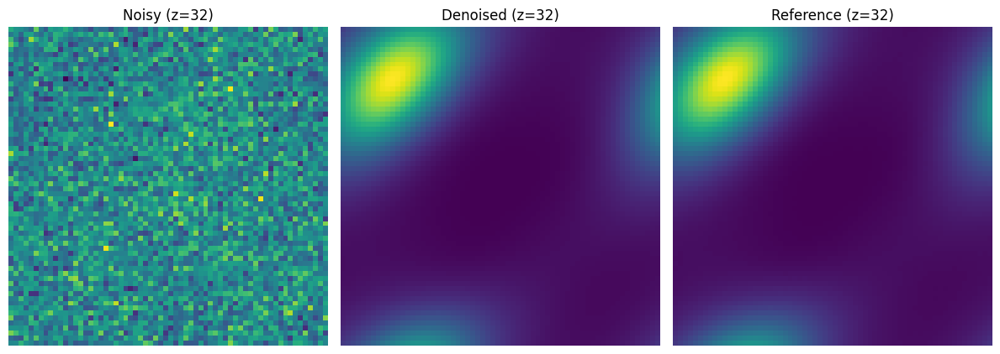


 Denoised matrix saved to /pscratch/sd/k/kberard/SCGSR/Data/diamond_1x1x1_bfd/density_data/vmc_J2/density_tot_vmc_mean_0006881280_scunet_trained_denoised.npy
Sample 6881280 | scunet_trained JSD = 0.000090

>>> Evaluation Metrics 2D
2-norm (noisy vs ref):     0.1835
2-norm (denoised vs ref): 0.0006
JSD   (noisy vs ref):     2.825540
JSD   (denoised vs ref):  0.000088

>>> Evaluation Metrics 3D
2-norm (noisy vs ref):     0.1835
2-norm (denoised vs ref): 0.0006
JSD   (noisy vs ref):     2.825540
JSD   (denoised vs ref):  0.000088


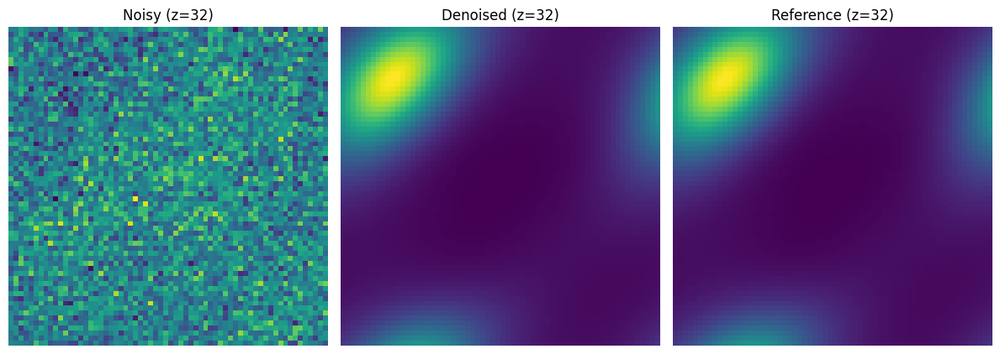


 Denoised matrix saved to /pscratch/sd/k/kberard/SCGSR/Data/diamond_1x1x1_bfd/density_data/vmc_J2/density_tot_vmc_mean_0010321920_scunet_trained_denoised.npy
Sample 10321920 | scunet_trained JSD = 0.000088

>>> Evaluation Metrics 2D
2-norm (noisy vs ref):     0.1826
2-norm (denoised vs ref): 0.0006
JSD   (noisy vs ref):     2.823653
JSD   (denoised vs ref):  0.000088

>>> Evaluation Metrics 3D
2-norm (noisy vs ref):     0.1826
2-norm (denoised vs ref): 0.0006
JSD   (noisy vs ref):     2.823653
JSD   (denoised vs ref):  0.000088


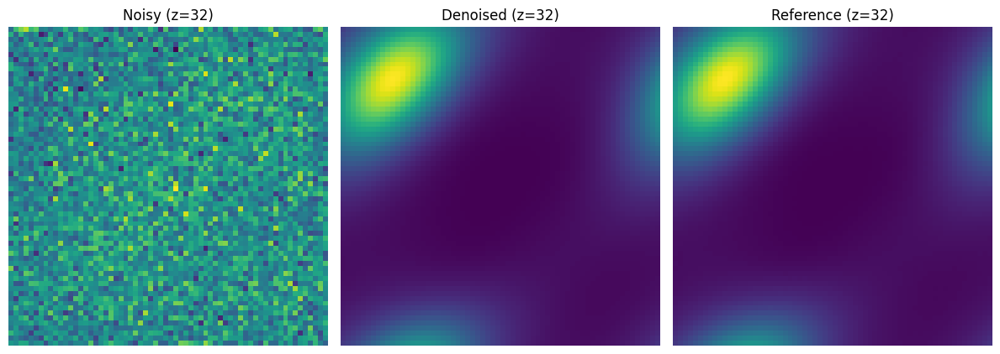


 Denoised matrix saved to /pscratch/sd/k/kberard/SCGSR/Data/diamond_1x1x1_bfd/density_data/vmc_J2/density_tot_vmc_mean_0010485760_scunet_trained_denoised.npy
Sample 10485760 | scunet_trained JSD = 0.000088

>>> Evaluation Metrics 2D
2-norm (noisy vs ref):     0.1643
2-norm (denoised vs ref): 0.0006
JSD   (noisy vs ref):     2.590050
JSD   (denoised vs ref):  0.000087

>>> Evaluation Metrics 3D
2-norm (noisy vs ref):     0.1643
2-norm (denoised vs ref): 0.0006
JSD   (noisy vs ref):     2.590050
JSD   (denoised vs ref):  0.000087


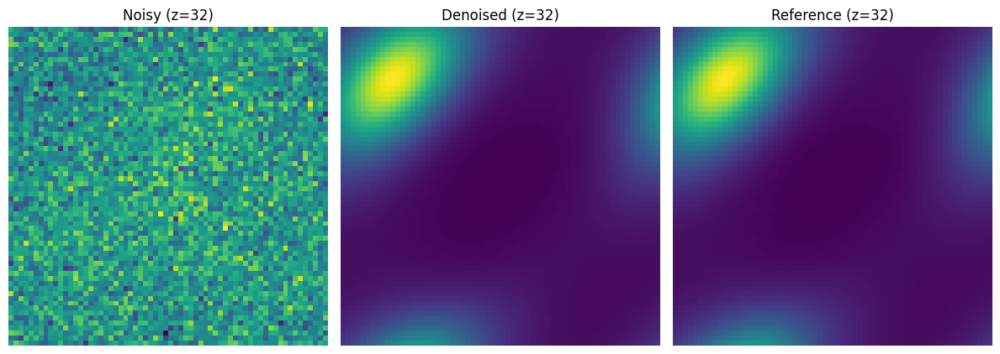


 Denoised matrix saved to /pscratch/sd/k/kberard/SCGSR/Data/diamond_1x1x1_bfd/density_data/vmc_J2/density_tot_vmc_mean_0013762560_scunet_trained_denoised.npy
Sample 13762560 | scunet_trained JSD = 0.000087

>>> Evaluation Metrics 2D
2-norm (noisy vs ref):     0.1421
2-norm (denoised vs ref): 0.0006
JSD   (noisy vs ref):     2.342830
JSD   (denoised vs ref):  0.000085

>>> Evaluation Metrics 3D
2-norm (noisy vs ref):     0.1421
2-norm (denoised vs ref): 0.0006
JSD   (noisy vs ref):     2.342830
JSD   (denoised vs ref):  0.000085


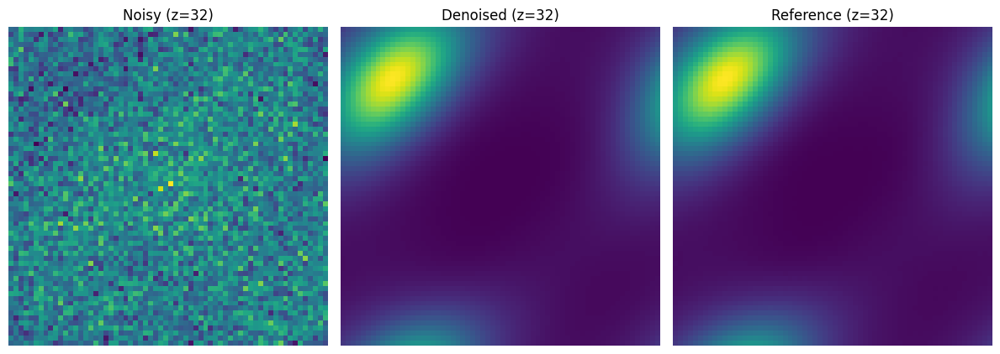


 Denoised matrix saved to /pscratch/sd/k/kberard/SCGSR/Data/diamond_1x1x1_bfd/density_data/vmc_J2/density_tot_vmc_mean_0020643840_scunet_trained_denoised.npy
Sample 20643840 | scunet_trained JSD = 0.000085

>>> Evaluation Metrics 2D
2-norm (noisy vs ref):     0.1298
2-norm (denoised vs ref): 0.0005
JSD   (noisy vs ref):     2.207554
JSD   (denoised vs ref):  0.000084

>>> Evaluation Metrics 3D
2-norm (noisy vs ref):     0.1298
2-norm (denoised vs ref): 0.0005
JSD   (noisy vs ref):     2.207554
JSD   (denoised vs ref):  0.000084


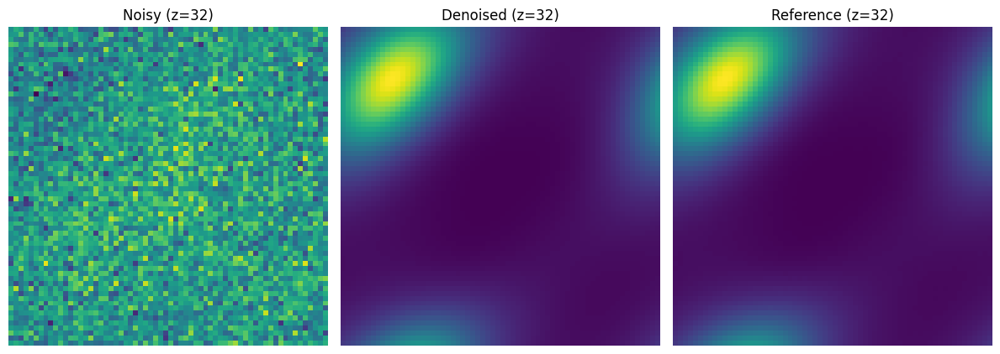


 Denoised matrix saved to /pscratch/sd/k/kberard/SCGSR/Data/diamond_1x1x1_bfd/density_data/vmc_J2/density_tot_vmc_mean_0027525120_scunet_trained_denoised.npy
Sample 27525120 | scunet_trained JSD = 0.000084

>>> Evaluation Metrics 2D
2-norm (noisy vs ref):     0.1159
2-norm (denoised vs ref): 0.0005
JSD   (noisy vs ref):     2.052071
JSD   (denoised vs ref):  0.000082

>>> Evaluation Metrics 3D
2-norm (noisy vs ref):     0.1159
2-norm (denoised vs ref): 0.0005
JSD   (noisy vs ref):     2.052071
JSD   (denoised vs ref):  0.000082


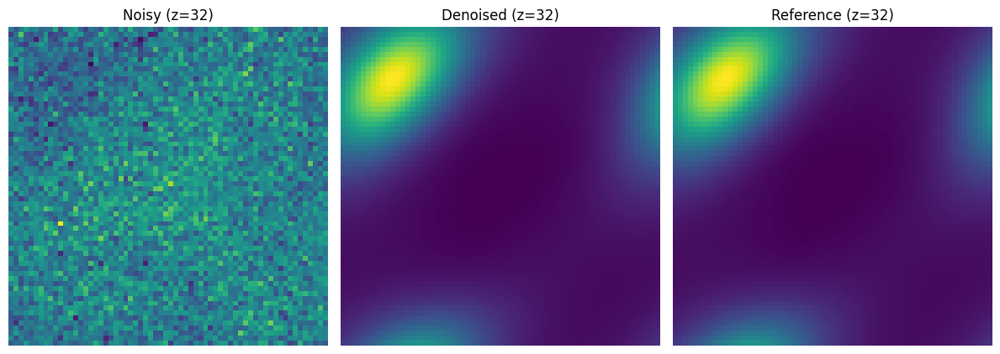


 Denoised matrix saved to /pscratch/sd/k/kberard/SCGSR/Data/diamond_1x1x1_bfd/density_data/vmc_J2/density_tot_vmc_mean_0041287680_scunet_trained_denoised.npy
Sample 41287680 | scunet_trained JSD = 0.000082

>>> Evaluation Metrics 2D
2-norm (noisy vs ref):     0.1086
2-norm (denoised vs ref): 0.0005
JSD   (noisy vs ref):     1.961343
JSD   (denoised vs ref):  0.000081

>>> Evaluation Metrics 3D
2-norm (noisy vs ref):     0.1086
2-norm (denoised vs ref): 0.0005
JSD   (noisy vs ref):     1.961343
JSD   (denoised vs ref):  0.000081


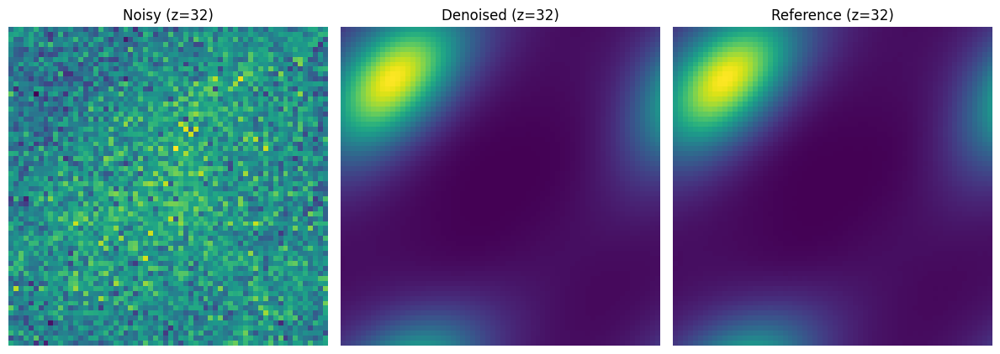


 Denoised matrix saved to /pscratch/sd/k/kberard/SCGSR/Data/diamond_1x1x1_bfd/density_data/vmc_J2/density_tot_vmc_mean_0055050240_scunet_trained_denoised.npy
Sample 55050240 | scunet_trained JSD = 0.000081

>>> Evaluation Metrics 2D
2-norm (noisy vs ref):     0.1004
2-norm (denoised vs ref): 0.0005
JSD   (noisy vs ref):     1.854723
JSD   (denoised vs ref):  0.000080

>>> Evaluation Metrics 3D
2-norm (noisy vs ref):     0.1004
2-norm (denoised vs ref): 0.0005
JSD   (noisy vs ref):     1.854723
JSD   (denoised vs ref):  0.000080


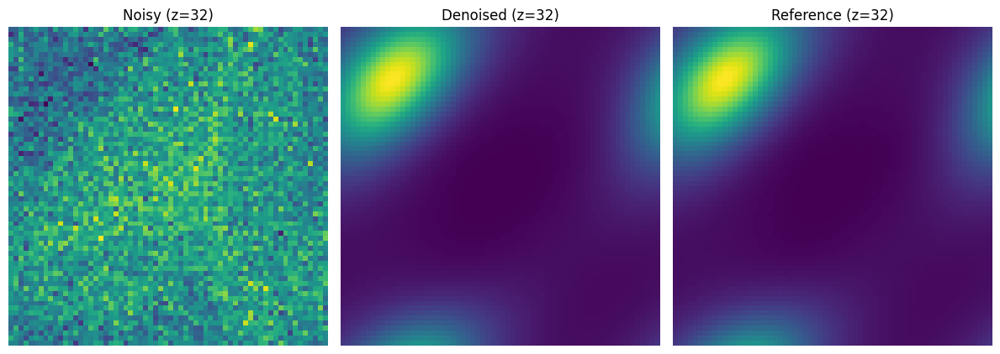


 Denoised matrix saved to /pscratch/sd/k/kberard/SCGSR/Data/diamond_1x1x1_bfd/density_data/vmc_J2/density_tot_vmc_mean_0082575360_scunet_trained_denoised.npy
Sample 82575360 | scunet_trained JSD = 0.000080

>>> Evaluation Metrics 2D
2-norm (noisy vs ref):     0.0961
2-norm (denoised vs ref): 0.0005
JSD   (noisy vs ref):     1.797909
JSD   (denoised vs ref):  0.000079

>>> Evaluation Metrics 3D
2-norm (noisy vs ref):     0.0961
2-norm (denoised vs ref): 0.0005
JSD   (noisy vs ref):     1.797909
JSD   (denoised vs ref):  0.000079


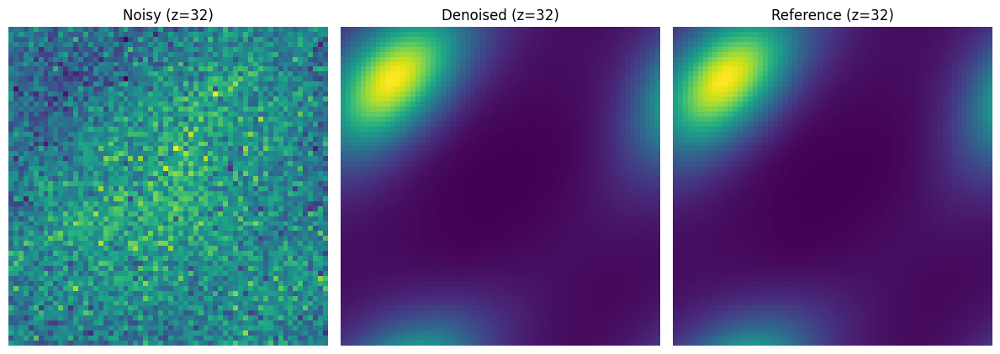


 Denoised matrix saved to /pscratch/sd/k/kberard/SCGSR/Data/diamond_1x1x1_bfd/density_data/vmc_J2/density_tot_vmc_mean_0110100480_scunet_trained_denoised.npy
Sample 110100480 | scunet_trained JSD = 0.000079

>>> Evaluation Metrics 2D
2-norm (noisy vs ref):     0.0914
2-norm (denoised vs ref): 0.0005
JSD   (noisy vs ref):     1.720404
JSD   (denoised vs ref):  0.000078

>>> Evaluation Metrics 3D
2-norm (noisy vs ref):     0.0914
2-norm (denoised vs ref): 0.0005
JSD   (noisy vs ref):     1.720404
JSD   (denoised vs ref):  0.000078


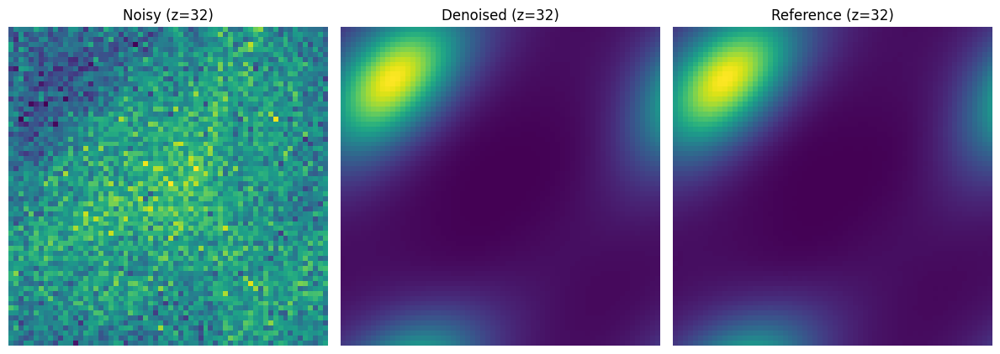


 Denoised matrix saved to /pscratch/sd/k/kberard/SCGSR/Data/diamond_1x1x1_bfd/density_data/vmc_J2/density_tot_vmc_mean_0165150720_scunet_trained_denoised.npy
Sample 165150720 | scunet_trained JSD = 0.000078

>>> Evaluation Metrics 2D
2-norm (noisy vs ref):     0.0891
2-norm (denoised vs ref): 0.0005
JSD   (noisy vs ref):     1.684438
JSD   (denoised vs ref):  0.000078

>>> Evaluation Metrics 3D
2-norm (noisy vs ref):     0.0891
2-norm (denoised vs ref): 0.0005
JSD   (noisy vs ref):     1.684438
JSD   (denoised vs ref):  0.000078


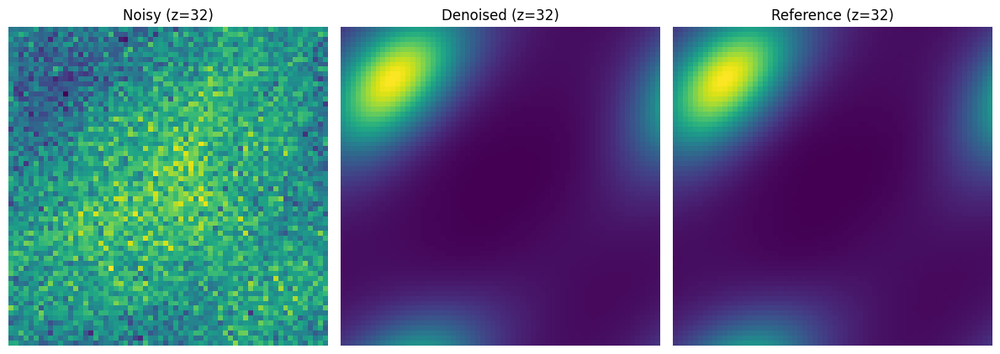


 Denoised matrix saved to /pscratch/sd/k/kberard/SCGSR/Data/diamond_1x1x1_bfd/density_data/vmc_J2/density_tot_vmc_mean_0220200960_scunet_trained_denoised.npy
Sample 220200960 | scunet_trained JSD = 0.000078

>>> Evaluation Metrics 2D
2-norm (noisy vs ref):     0.0867
2-norm (denoised vs ref): 0.0005
JSD   (noisy vs ref):     1.640221
JSD   (denoised vs ref):  0.000077

>>> Evaluation Metrics 3D
2-norm (noisy vs ref):     0.0867
2-norm (denoised vs ref): 0.0005
JSD   (noisy vs ref):     1.640221
JSD   (denoised vs ref):  0.000077


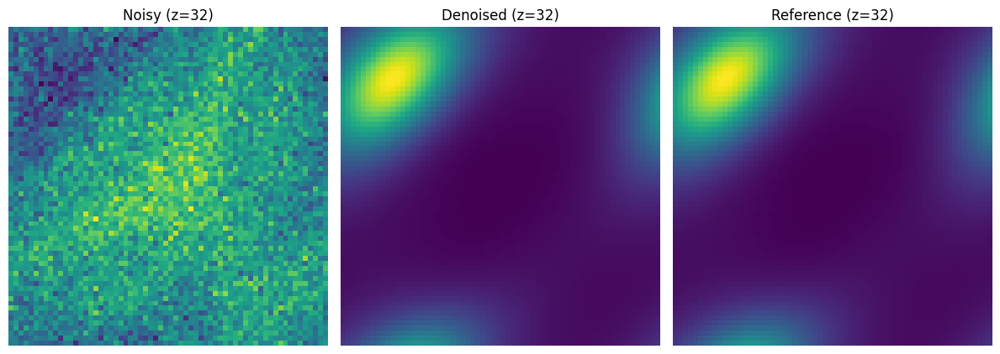


 Denoised matrix saved to /pscratch/sd/k/kberard/SCGSR/Data/diamond_1x1x1_bfd/density_data/vmc_J2/density_tot_vmc_mean_0330301440_scunet_trained_denoised.npy
Sample 330301440 | scunet_trained JSD = 0.000077

>>> Evaluation Metrics 2D
2-norm (noisy vs ref):     0.0855
2-norm (denoised vs ref): 0.0005
JSD   (noisy vs ref):     1.616228
JSD   (denoised vs ref):  0.000076

>>> Evaluation Metrics 3D
2-norm (noisy vs ref):     0.0855
2-norm (denoised vs ref): 0.0005
JSD   (noisy vs ref):     1.616228
JSD   (denoised vs ref):  0.000076


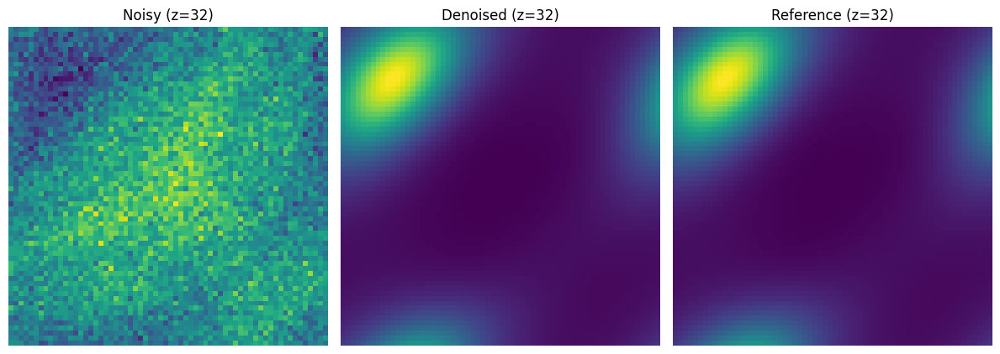


 Denoised matrix saved to /pscratch/sd/k/kberard/SCGSR/Data/diamond_1x1x1_bfd/density_data/vmc_J2/density_tot_vmc_mean_0440401920_scunet_trained_denoised.npy
Sample 440401920 | scunet_trained JSD = 0.000076

>>> Evaluation Metrics 2D
2-norm (noisy vs ref):     0.0843
2-norm (denoised vs ref): 0.0005
JSD   (noisy vs ref):     1.591536
JSD   (denoised vs ref):  0.000076

>>> Evaluation Metrics 3D
2-norm (noisy vs ref):     0.0843
2-norm (denoised vs ref): 0.0005
JSD   (noisy vs ref):     1.591536
JSD   (denoised vs ref):  0.000076


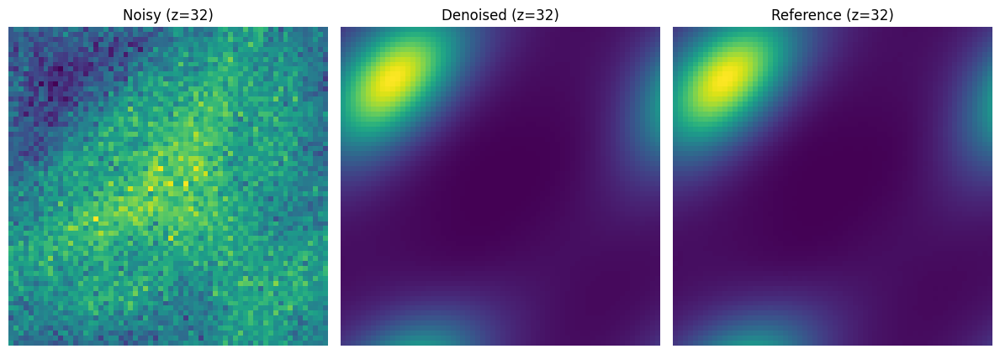


 Denoised matrix saved to /pscratch/sd/k/kberard/SCGSR/Data/diamond_1x1x1_bfd/density_data/vmc_J2/density_tot_vmc_mean_0660602880_scunet_trained_denoised.npy
Sample 660602880 | scunet_trained JSD = 0.000076

>>> Evaluation Metrics 2D
2-norm (noisy vs ref):     0.0830
2-norm (denoised vs ref): 0.0005
JSD   (noisy vs ref):     1.564715
JSD   (denoised vs ref):  0.000075

>>> Evaluation Metrics 3D
2-norm (noisy vs ref):     0.0830
2-norm (denoised vs ref): 0.0005
JSD   (noisy vs ref):     1.564715
JSD   (denoised vs ref):  0.000075


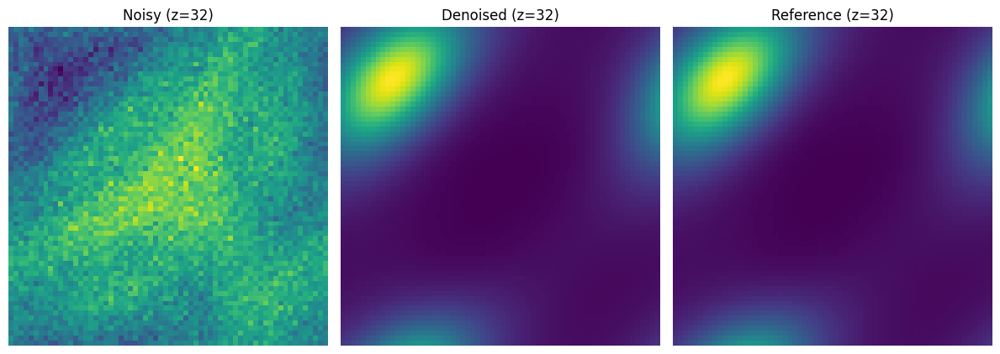


 Denoised matrix saved to /pscratch/sd/k/kberard/SCGSR/Data/diamond_1x1x1_bfd/density_data/vmc_J2/density_tot_vmc_mean_1321205760_scunet_trained_denoised.npy
Sample 1321205760 | scunet_trained JSD = 0.000075

>>> Evaluation Metrics 2D
2-norm (noisy vs ref):     0.0824
2-norm (denoised vs ref): 0.0005
JSD   (noisy vs ref):     1.554853
JSD   (denoised vs ref):  0.000074

>>> Evaluation Metrics 3D
2-norm (noisy vs ref):     0.0824
2-norm (denoised vs ref): 0.0005
JSD   (noisy vs ref):     1.554853
JSD   (denoised vs ref):  0.000074


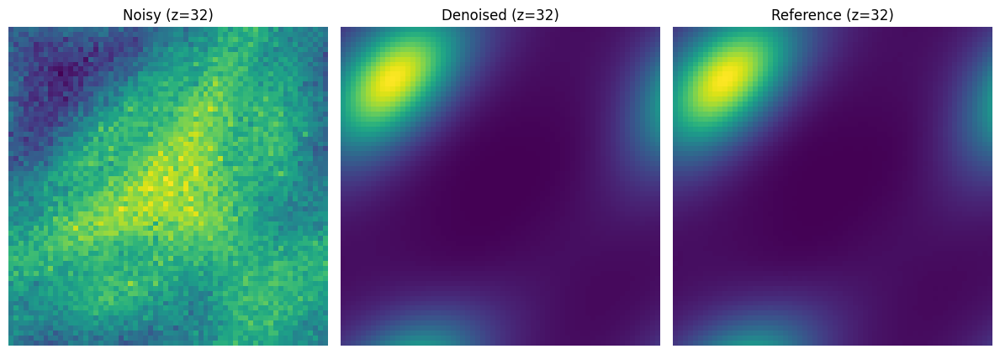


 Denoised matrix saved to /pscratch/sd/k/kberard/SCGSR/Data/diamond_1x1x1_bfd/density_data/vmc_J2/density_tot_vmc_mean_2642411520_scunet_trained_denoised.npy
Sample 2642411520 | scunet_trained JSD = 0.000074

>>> Evaluation Metrics 2D
2-norm (noisy vs ref):     0.0820
2-norm (denoised vs ref): 0.0005
JSD   (noisy vs ref):     1.549535
JSD   (denoised vs ref):  0.000073

>>> Evaluation Metrics 3D
2-norm (noisy vs ref):     0.0820
2-norm (denoised vs ref): 0.0005
JSD   (noisy vs ref):     1.549535
JSD   (denoised vs ref):  0.000073


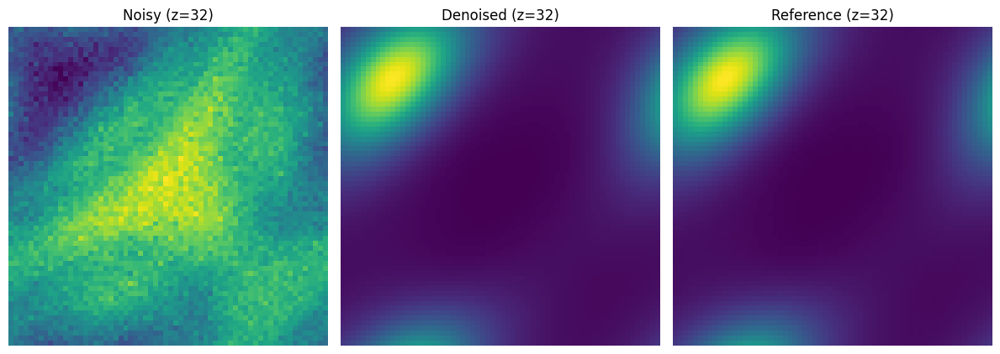


 Denoised matrix saved to /pscratch/sd/k/kberard/SCGSR/Data/diamond_1x1x1_bfd/density_data/vmc_J2/density_tot_vmc_mean_5284823040_scunet_trained_denoised.npy
Sample 5284823040 | scunet_trained JSD = 0.000073

=== Running model: scunet_pre ===
Block Initial Type: W, drop_path_rate:0.000000
Block Initial Type: SW, drop_path_rate:0.000000
Block Initial Type: W, drop_path_rate:0.000000
Block Initial Type: SW, drop_path_rate:0.000000
Block Initial Type: W, drop_path_rate:0.000000
Block Initial Type: SW, drop_path_rate:0.000000
Block Initial Type: W, drop_path_rate:0.000000
Block Initial Type: SW, drop_path_rate:0.000000
Block Initial Type: W, drop_path_rate:0.000000
Block Initial Type: SW, drop_path_rate:0.000000
Block Initial Type: W, drop_path_rate:0.000000
Block Initial Type: SW, drop_path_rate:0.000000
Block Initial Type: W, drop_path_rate:0.000000
Block Initial Type: SW, drop_path_rate:0.000000
Block Initial Type: W, drop_path_rate:0.000000
Block Initial Type: SW, drop_path_rate:0.000

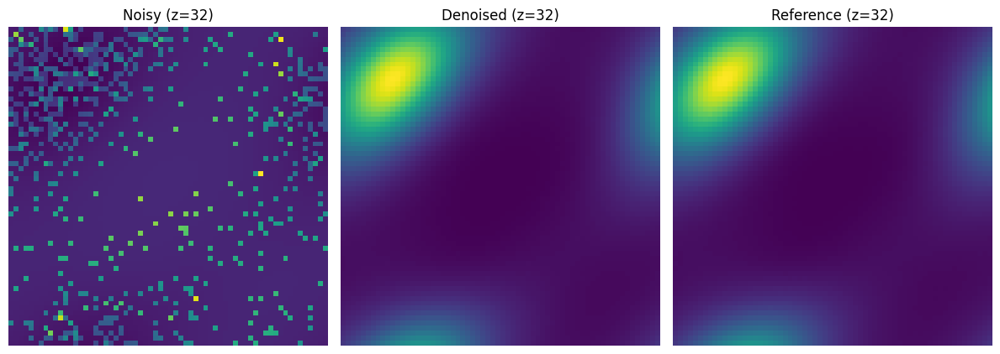


 Denoised matrix saved to /pscratch/sd/k/kberard/SCGSR/Data/diamond_1x1x1_bfd/density_data/vmc_J2/density_tot_vmc_mean_0000010240_scunet_pre_denoised.npy
Sample 10240 | scunet_pre JSD = 0.000120
Block Initial Type: W, drop_path_rate:0.000000
Block Initial Type: SW, drop_path_rate:0.000000
Block Initial Type: W, drop_path_rate:0.000000
Block Initial Type: SW, drop_path_rate:0.000000
Block Initial Type: W, drop_path_rate:0.000000
Block Initial Type: SW, drop_path_rate:0.000000
Block Initial Type: W, drop_path_rate:0.000000
Block Initial Type: SW, drop_path_rate:0.000000
Block Initial Type: W, drop_path_rate:0.000000
Block Initial Type: SW, drop_path_rate:0.000000
Block Initial Type: W, drop_path_rate:0.000000
Block Initial Type: SW, drop_path_rate:0.000000
Block Initial Type: W, drop_path_rate:0.000000
Block Initial Type: SW, drop_path_rate:0.000000
Block Initial Type: W, drop_path_rate:0.000000
Block Initial Type: SW, drop_path_rate:0.000000
Block Initial Type: W, drop_path_rate:0.0000

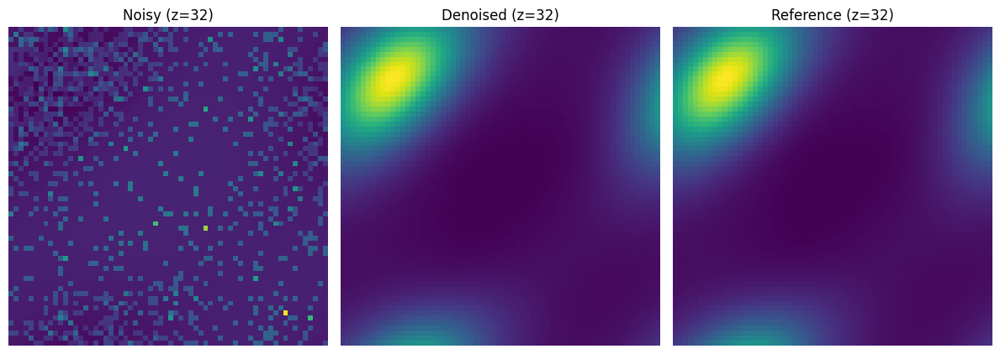


 Denoised matrix saved to /pscratch/sd/k/kberard/SCGSR/Data/diamond_1x1x1_bfd/density_data/vmc_J2/density_tot_vmc_mean_0000020480_scunet_pre_denoised.npy
Sample 20480 | scunet_pre JSD = 0.000117
Block Initial Type: W, drop_path_rate:0.000000
Block Initial Type: SW, drop_path_rate:0.000000
Block Initial Type: W, drop_path_rate:0.000000
Block Initial Type: SW, drop_path_rate:0.000000
Block Initial Type: W, drop_path_rate:0.000000
Block Initial Type: SW, drop_path_rate:0.000000
Block Initial Type: W, drop_path_rate:0.000000
Block Initial Type: SW, drop_path_rate:0.000000
Block Initial Type: W, drop_path_rate:0.000000
Block Initial Type: SW, drop_path_rate:0.000000
Block Initial Type: W, drop_path_rate:0.000000
Block Initial Type: SW, drop_path_rate:0.000000
Block Initial Type: W, drop_path_rate:0.000000
Block Initial Type: SW, drop_path_rate:0.000000
Block Initial Type: W, drop_path_rate:0.000000
Block Initial Type: SW, drop_path_rate:0.000000
Block Initial Type: W, drop_path_rate:0.0000

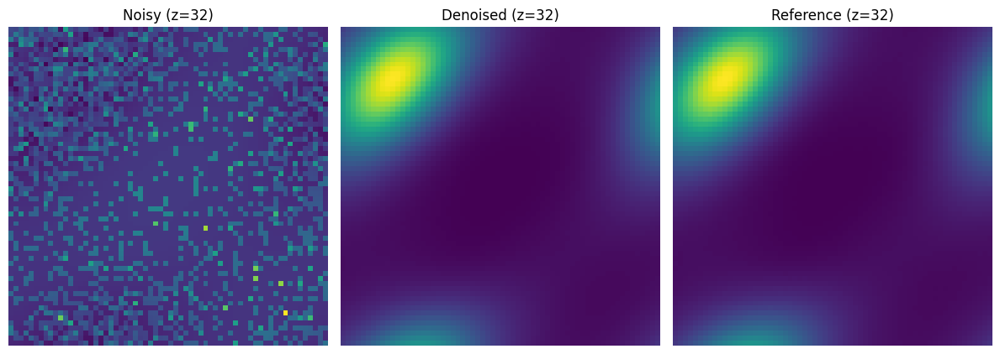


 Denoised matrix saved to /pscratch/sd/k/kberard/SCGSR/Data/diamond_1x1x1_bfd/density_data/vmc_J2/density_tot_vmc_mean_0000040960_scunet_pre_denoised.npy
Sample 40960 | scunet_pre JSD = 0.000114
Block Initial Type: W, drop_path_rate:0.000000
Block Initial Type: SW, drop_path_rate:0.000000
Block Initial Type: W, drop_path_rate:0.000000
Block Initial Type: SW, drop_path_rate:0.000000
Block Initial Type: W, drop_path_rate:0.000000
Block Initial Type: SW, drop_path_rate:0.000000
Block Initial Type: W, drop_path_rate:0.000000
Block Initial Type: SW, drop_path_rate:0.000000
Block Initial Type: W, drop_path_rate:0.000000
Block Initial Type: SW, drop_path_rate:0.000000
Block Initial Type: W, drop_path_rate:0.000000
Block Initial Type: SW, drop_path_rate:0.000000
Block Initial Type: W, drop_path_rate:0.000000
Block Initial Type: SW, drop_path_rate:0.000000
Block Initial Type: W, drop_path_rate:0.000000
Block Initial Type: SW, drop_path_rate:0.000000
Block Initial Type: W, drop_path_rate:0.0000

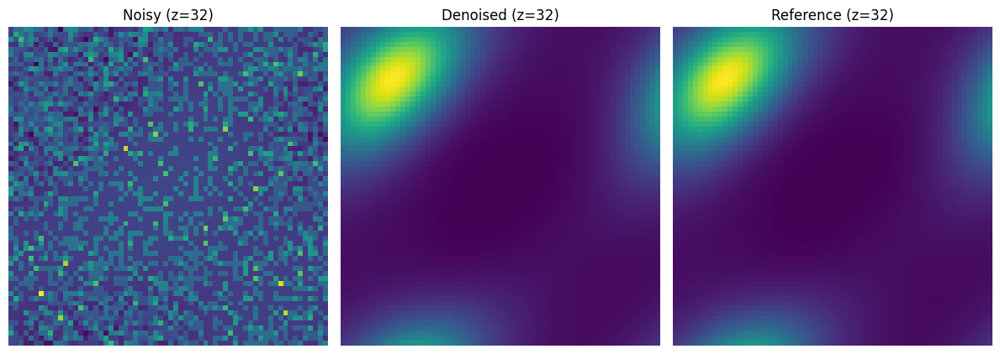


 Denoised matrix saved to /pscratch/sd/k/kberard/SCGSR/Data/diamond_1x1x1_bfd/density_data/vmc_J2/density_tot_vmc_mean_0000081920_scunet_pre_denoised.npy
Sample 81920 | scunet_pre JSD = 0.000111
Block Initial Type: W, drop_path_rate:0.000000
Block Initial Type: SW, drop_path_rate:0.000000
Block Initial Type: W, drop_path_rate:0.000000
Block Initial Type: SW, drop_path_rate:0.000000
Block Initial Type: W, drop_path_rate:0.000000
Block Initial Type: SW, drop_path_rate:0.000000
Block Initial Type: W, drop_path_rate:0.000000
Block Initial Type: SW, drop_path_rate:0.000000
Block Initial Type: W, drop_path_rate:0.000000
Block Initial Type: SW, drop_path_rate:0.000000
Block Initial Type: W, drop_path_rate:0.000000
Block Initial Type: SW, drop_path_rate:0.000000
Block Initial Type: W, drop_path_rate:0.000000
Block Initial Type: SW, drop_path_rate:0.000000
Block Initial Type: W, drop_path_rate:0.000000
Block Initial Type: SW, drop_path_rate:0.000000
Block Initial Type: W, drop_path_rate:0.0000

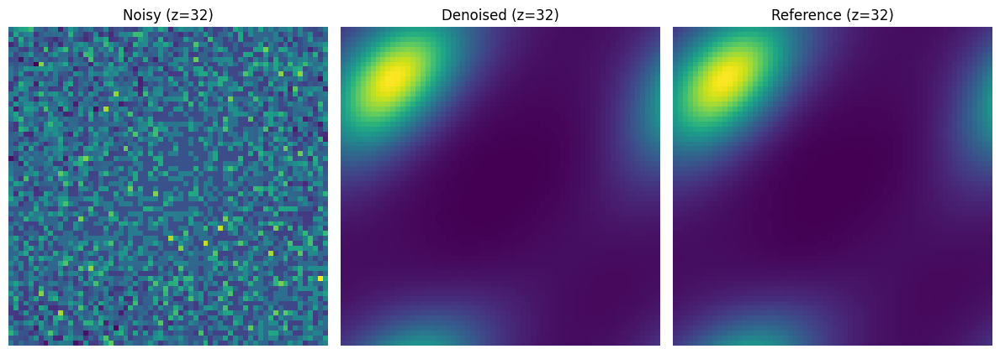


 Denoised matrix saved to /pscratch/sd/k/kberard/SCGSR/Data/diamond_1x1x1_bfd/density_data/vmc_J2/density_tot_vmc_mean_0000163840_scunet_pre_denoised.npy
Sample 163840 | scunet_pre JSD = 0.000108
Block Initial Type: W, drop_path_rate:0.000000
Block Initial Type: SW, drop_path_rate:0.000000
Block Initial Type: W, drop_path_rate:0.000000
Block Initial Type: SW, drop_path_rate:0.000000
Block Initial Type: W, drop_path_rate:0.000000
Block Initial Type: SW, drop_path_rate:0.000000
Block Initial Type: W, drop_path_rate:0.000000
Block Initial Type: SW, drop_path_rate:0.000000
Block Initial Type: W, drop_path_rate:0.000000
Block Initial Type: SW, drop_path_rate:0.000000
Block Initial Type: W, drop_path_rate:0.000000
Block Initial Type: SW, drop_path_rate:0.000000
Block Initial Type: W, drop_path_rate:0.000000
Block Initial Type: SW, drop_path_rate:0.000000
Block Initial Type: W, drop_path_rate:0.000000
Block Initial Type: SW, drop_path_rate:0.000000
Block Initial Type: W, drop_path_rate:0.000

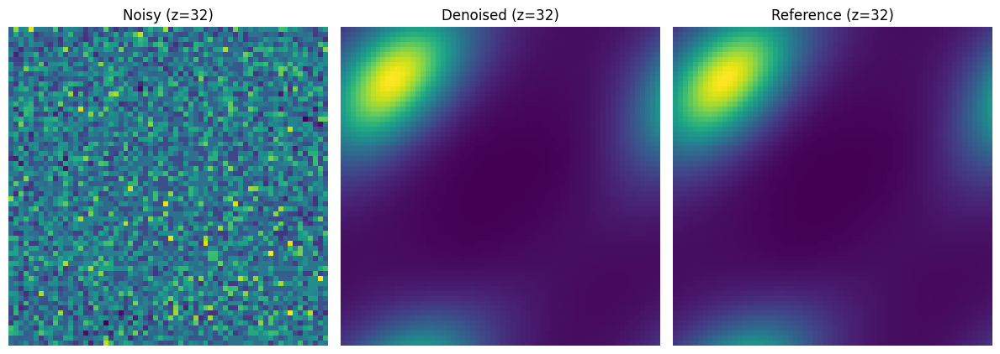


 Denoised matrix saved to /pscratch/sd/k/kberard/SCGSR/Data/diamond_1x1x1_bfd/density_data/vmc_J2/density_tot_vmc_mean_0000327680_scunet_pre_denoised.npy
Sample 327680 | scunet_pre JSD = 0.000106
Block Initial Type: W, drop_path_rate:0.000000
Block Initial Type: SW, drop_path_rate:0.000000
Block Initial Type: W, drop_path_rate:0.000000
Block Initial Type: SW, drop_path_rate:0.000000
Block Initial Type: W, drop_path_rate:0.000000
Block Initial Type: SW, drop_path_rate:0.000000
Block Initial Type: W, drop_path_rate:0.000000
Block Initial Type: SW, drop_path_rate:0.000000
Block Initial Type: W, drop_path_rate:0.000000
Block Initial Type: SW, drop_path_rate:0.000000
Block Initial Type: W, drop_path_rate:0.000000
Block Initial Type: SW, drop_path_rate:0.000000
Block Initial Type: W, drop_path_rate:0.000000
Block Initial Type: SW, drop_path_rate:0.000000
Block Initial Type: W, drop_path_rate:0.000000
Block Initial Type: SW, drop_path_rate:0.000000
Block Initial Type: W, drop_path_rate:0.000

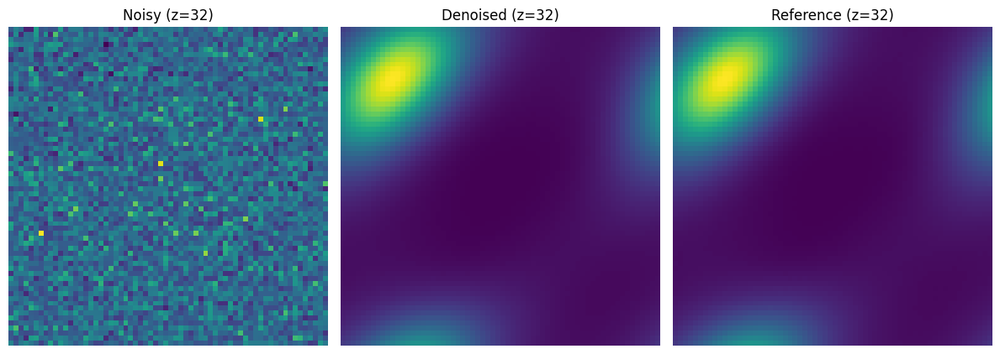


 Denoised matrix saved to /pscratch/sd/k/kberard/SCGSR/Data/diamond_1x1x1_bfd/density_data/vmc_J2/density_tot_vmc_mean_0000430080_scunet_pre_denoised.npy
Sample 430080 | scunet_pre JSD = 0.000105
Block Initial Type: W, drop_path_rate:0.000000
Block Initial Type: SW, drop_path_rate:0.000000
Block Initial Type: W, drop_path_rate:0.000000
Block Initial Type: SW, drop_path_rate:0.000000
Block Initial Type: W, drop_path_rate:0.000000
Block Initial Type: SW, drop_path_rate:0.000000
Block Initial Type: W, drop_path_rate:0.000000
Block Initial Type: SW, drop_path_rate:0.000000
Block Initial Type: W, drop_path_rate:0.000000
Block Initial Type: SW, drop_path_rate:0.000000
Block Initial Type: W, drop_path_rate:0.000000
Block Initial Type: SW, drop_path_rate:0.000000
Block Initial Type: W, drop_path_rate:0.000000
Block Initial Type: SW, drop_path_rate:0.000000
Block Initial Type: W, drop_path_rate:0.000000
Block Initial Type: SW, drop_path_rate:0.000000
Block Initial Type: W, drop_path_rate:0.000

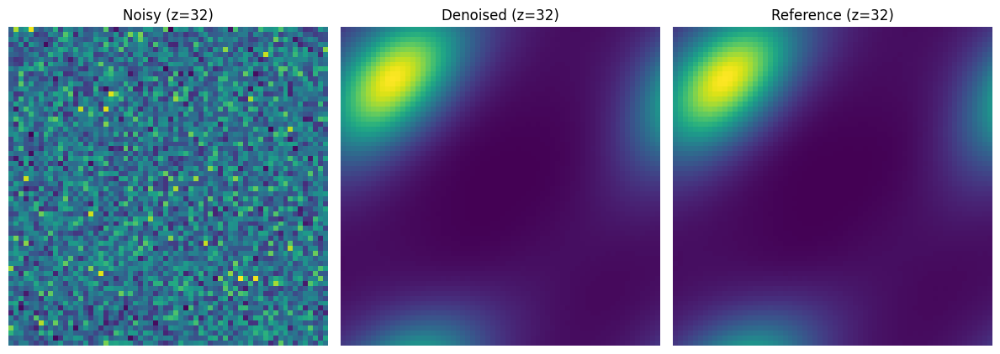


 Denoised matrix saved to /pscratch/sd/k/kberard/SCGSR/Data/diamond_1x1x1_bfd/density_data/vmc_J2/density_tot_vmc_mean_0000655360_scunet_pre_denoised.npy
Sample 655360 | scunet_pre JSD = 0.000104
Block Initial Type: W, drop_path_rate:0.000000
Block Initial Type: SW, drop_path_rate:0.000000
Block Initial Type: W, drop_path_rate:0.000000
Block Initial Type: SW, drop_path_rate:0.000000
Block Initial Type: W, drop_path_rate:0.000000
Block Initial Type: SW, drop_path_rate:0.000000
Block Initial Type: W, drop_path_rate:0.000000
Block Initial Type: SW, drop_path_rate:0.000000
Block Initial Type: W, drop_path_rate:0.000000
Block Initial Type: SW, drop_path_rate:0.000000
Block Initial Type: W, drop_path_rate:0.000000
Block Initial Type: SW, drop_path_rate:0.000000
Block Initial Type: W, drop_path_rate:0.000000
Block Initial Type: SW, drop_path_rate:0.000000
Block Initial Type: W, drop_path_rate:0.000000
Block Initial Type: SW, drop_path_rate:0.000000
Block Initial Type: W, drop_path_rate:0.000

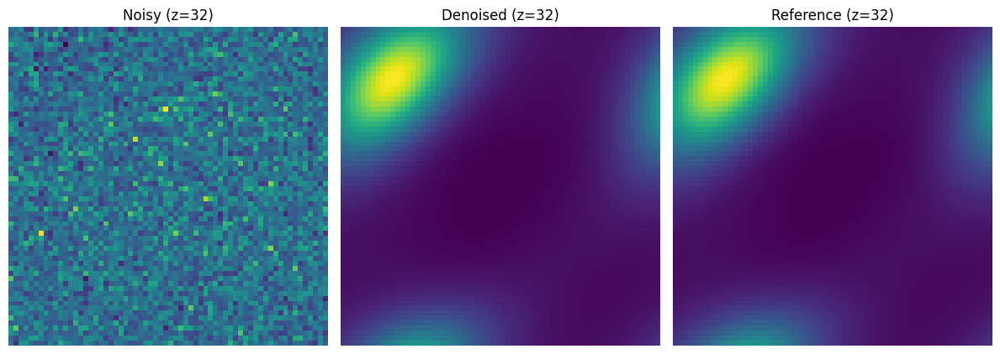


 Denoised matrix saved to /pscratch/sd/k/kberard/SCGSR/Data/diamond_1x1x1_bfd/density_data/vmc_J2/density_tot_vmc_mean_0000860160_scunet_pre_denoised.npy
Sample 860160 | scunet_pre JSD = 0.000103
Block Initial Type: W, drop_path_rate:0.000000
Block Initial Type: SW, drop_path_rate:0.000000
Block Initial Type: W, drop_path_rate:0.000000
Block Initial Type: SW, drop_path_rate:0.000000
Block Initial Type: W, drop_path_rate:0.000000
Block Initial Type: SW, drop_path_rate:0.000000
Block Initial Type: W, drop_path_rate:0.000000
Block Initial Type: SW, drop_path_rate:0.000000
Block Initial Type: W, drop_path_rate:0.000000
Block Initial Type: SW, drop_path_rate:0.000000
Block Initial Type: W, drop_path_rate:0.000000
Block Initial Type: SW, drop_path_rate:0.000000
Block Initial Type: W, drop_path_rate:0.000000
Block Initial Type: SW, drop_path_rate:0.000000
Block Initial Type: W, drop_path_rate:0.000000
Block Initial Type: SW, drop_path_rate:0.000000
Block Initial Type: W, drop_path_rate:0.000

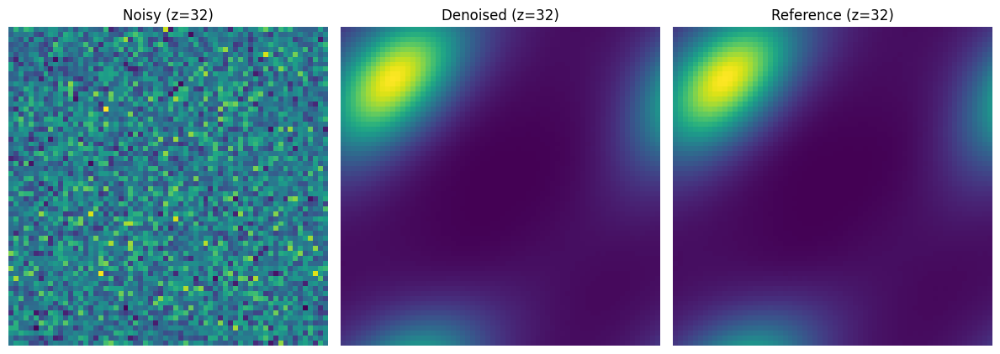


 Denoised matrix saved to /pscratch/sd/k/kberard/SCGSR/Data/diamond_1x1x1_bfd/density_data/vmc_J2/density_tot_vmc_mean_0001310720_scunet_pre_denoised.npy
Sample 1310720 | scunet_pre JSD = 0.000102
Block Initial Type: W, drop_path_rate:0.000000
Block Initial Type: SW, drop_path_rate:0.000000
Block Initial Type: W, drop_path_rate:0.000000
Block Initial Type: SW, drop_path_rate:0.000000
Block Initial Type: W, drop_path_rate:0.000000
Block Initial Type: SW, drop_path_rate:0.000000
Block Initial Type: W, drop_path_rate:0.000000
Block Initial Type: SW, drop_path_rate:0.000000
Block Initial Type: W, drop_path_rate:0.000000
Block Initial Type: SW, drop_path_rate:0.000000
Block Initial Type: W, drop_path_rate:0.000000
Block Initial Type: SW, drop_path_rate:0.000000
Block Initial Type: W, drop_path_rate:0.000000
Block Initial Type: SW, drop_path_rate:0.000000
Block Initial Type: W, drop_path_rate:0.000000
Block Initial Type: SW, drop_path_rate:0.000000
Block Initial Type: W, drop_path_rate:0.00

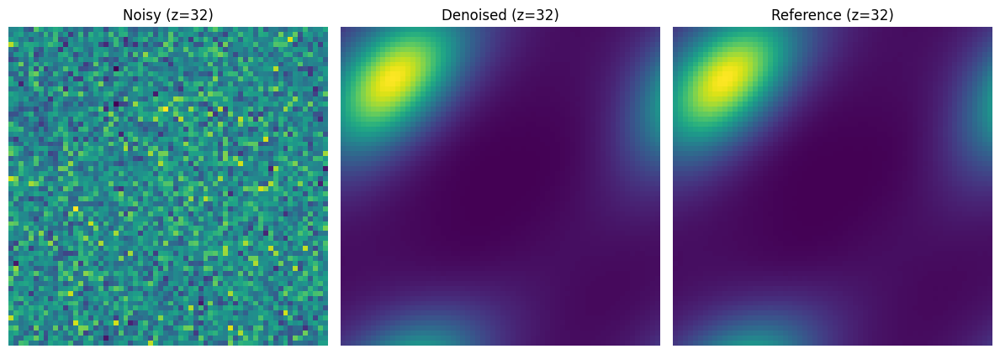


 Denoised matrix saved to /pscratch/sd/k/kberard/SCGSR/Data/diamond_1x1x1_bfd/density_data/vmc_J2/density_tot_vmc_mean_0001720320_scunet_pre_denoised.npy
Sample 1720320 | scunet_pre JSD = 0.000101
Block Initial Type: W, drop_path_rate:0.000000
Block Initial Type: SW, drop_path_rate:0.000000
Block Initial Type: W, drop_path_rate:0.000000
Block Initial Type: SW, drop_path_rate:0.000000
Block Initial Type: W, drop_path_rate:0.000000
Block Initial Type: SW, drop_path_rate:0.000000
Block Initial Type: W, drop_path_rate:0.000000
Block Initial Type: SW, drop_path_rate:0.000000
Block Initial Type: W, drop_path_rate:0.000000
Block Initial Type: SW, drop_path_rate:0.000000
Block Initial Type: W, drop_path_rate:0.000000
Block Initial Type: SW, drop_path_rate:0.000000
Block Initial Type: W, drop_path_rate:0.000000
Block Initial Type: SW, drop_path_rate:0.000000
Block Initial Type: W, drop_path_rate:0.000000
Block Initial Type: SW, drop_path_rate:0.000000
Block Initial Type: W, drop_path_rate:0.00

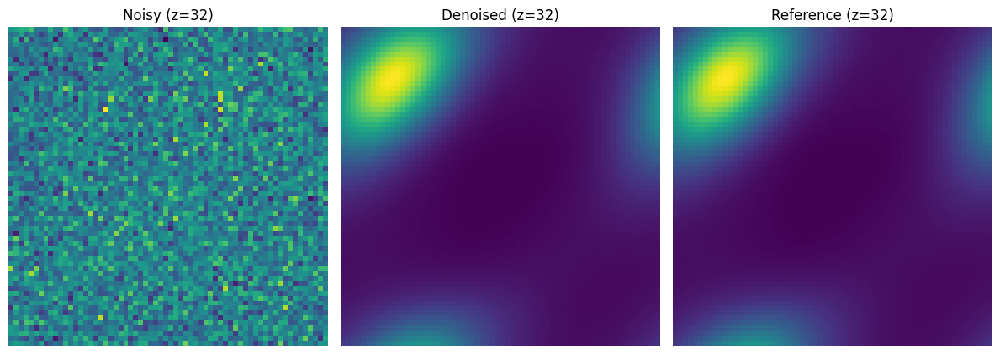


 Denoised matrix saved to /pscratch/sd/k/kberard/SCGSR/Data/diamond_1x1x1_bfd/density_data/vmc_J2/density_tot_vmc_mean_0002621440_scunet_pre_denoised.npy
Sample 2621440 | scunet_pre JSD = 0.000101
Block Initial Type: W, drop_path_rate:0.000000
Block Initial Type: SW, drop_path_rate:0.000000
Block Initial Type: W, drop_path_rate:0.000000
Block Initial Type: SW, drop_path_rate:0.000000
Block Initial Type: W, drop_path_rate:0.000000
Block Initial Type: SW, drop_path_rate:0.000000
Block Initial Type: W, drop_path_rate:0.000000
Block Initial Type: SW, drop_path_rate:0.000000
Block Initial Type: W, drop_path_rate:0.000000
Block Initial Type: SW, drop_path_rate:0.000000
Block Initial Type: W, drop_path_rate:0.000000
Block Initial Type: SW, drop_path_rate:0.000000
Block Initial Type: W, drop_path_rate:0.000000
Block Initial Type: SW, drop_path_rate:0.000000
Block Initial Type: W, drop_path_rate:0.000000
Block Initial Type: SW, drop_path_rate:0.000000
Block Initial Type: W, drop_path_rate:0.00

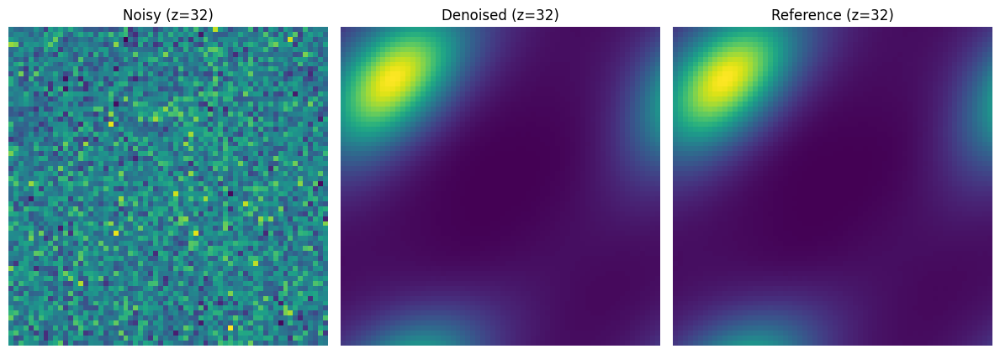


 Denoised matrix saved to /pscratch/sd/k/kberard/SCGSR/Data/diamond_1x1x1_bfd/density_data/vmc_J2/density_tot_vmc_mean_0003440640_scunet_pre_denoised.npy
Sample 3440640 | scunet_pre JSD = 0.000099
Block Initial Type: W, drop_path_rate:0.000000
Block Initial Type: SW, drop_path_rate:0.000000
Block Initial Type: W, drop_path_rate:0.000000
Block Initial Type: SW, drop_path_rate:0.000000
Block Initial Type: W, drop_path_rate:0.000000
Block Initial Type: SW, drop_path_rate:0.000000
Block Initial Type: W, drop_path_rate:0.000000
Block Initial Type: SW, drop_path_rate:0.000000
Block Initial Type: W, drop_path_rate:0.000000
Block Initial Type: SW, drop_path_rate:0.000000
Block Initial Type: W, drop_path_rate:0.000000
Block Initial Type: SW, drop_path_rate:0.000000
Block Initial Type: W, drop_path_rate:0.000000
Block Initial Type: SW, drop_path_rate:0.000000
Block Initial Type: W, drop_path_rate:0.000000
Block Initial Type: SW, drop_path_rate:0.000000
Block Initial Type: W, drop_path_rate:0.00

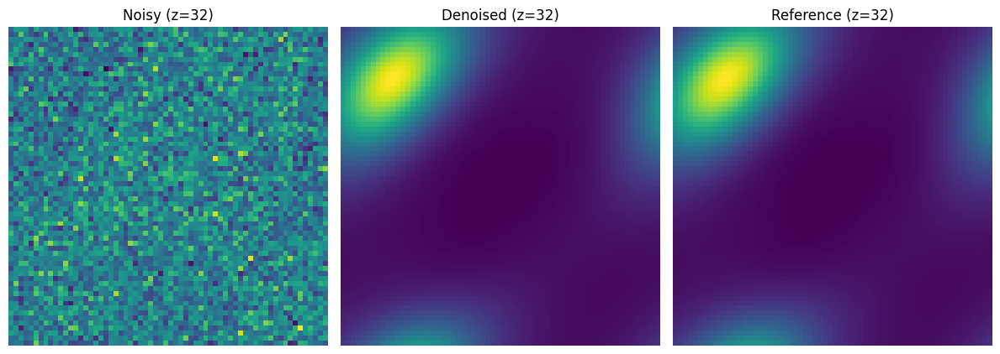


 Denoised matrix saved to /pscratch/sd/k/kberard/SCGSR/Data/diamond_1x1x1_bfd/density_data/vmc_J2/density_tot_vmc_mean_0005160960_scunet_pre_denoised.npy
Sample 5160960 | scunet_pre JSD = 0.000099
Block Initial Type: W, drop_path_rate:0.000000
Block Initial Type: SW, drop_path_rate:0.000000
Block Initial Type: W, drop_path_rate:0.000000
Block Initial Type: SW, drop_path_rate:0.000000
Block Initial Type: W, drop_path_rate:0.000000
Block Initial Type: SW, drop_path_rate:0.000000
Block Initial Type: W, drop_path_rate:0.000000
Block Initial Type: SW, drop_path_rate:0.000000
Block Initial Type: W, drop_path_rate:0.000000
Block Initial Type: SW, drop_path_rate:0.000000
Block Initial Type: W, drop_path_rate:0.000000
Block Initial Type: SW, drop_path_rate:0.000000
Block Initial Type: W, drop_path_rate:0.000000
Block Initial Type: SW, drop_path_rate:0.000000
Block Initial Type: W, drop_path_rate:0.000000
Block Initial Type: SW, drop_path_rate:0.000000
Block Initial Type: W, drop_path_rate:0.00

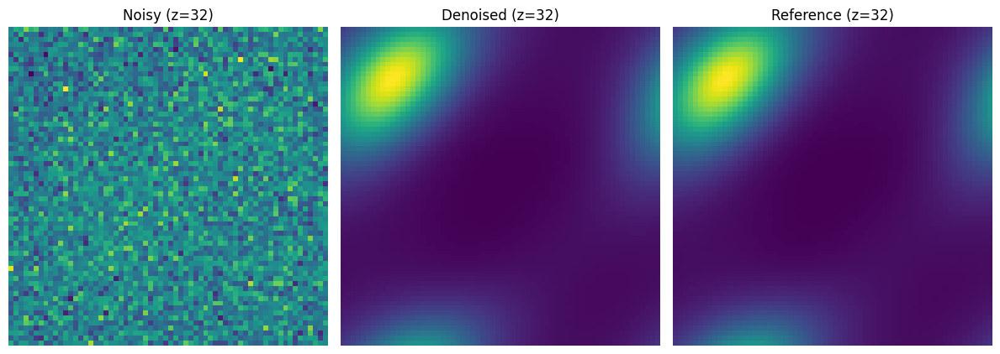


 Denoised matrix saved to /pscratch/sd/k/kberard/SCGSR/Data/diamond_1x1x1_bfd/density_data/vmc_J2/density_tot_vmc_mean_0005242880_scunet_pre_denoised.npy
Sample 5242880 | scunet_pre JSD = 0.000098
Block Initial Type: W, drop_path_rate:0.000000
Block Initial Type: SW, drop_path_rate:0.000000
Block Initial Type: W, drop_path_rate:0.000000
Block Initial Type: SW, drop_path_rate:0.000000
Block Initial Type: W, drop_path_rate:0.000000
Block Initial Type: SW, drop_path_rate:0.000000
Block Initial Type: W, drop_path_rate:0.000000
Block Initial Type: SW, drop_path_rate:0.000000
Block Initial Type: W, drop_path_rate:0.000000
Block Initial Type: SW, drop_path_rate:0.000000
Block Initial Type: W, drop_path_rate:0.000000
Block Initial Type: SW, drop_path_rate:0.000000
Block Initial Type: W, drop_path_rate:0.000000
Block Initial Type: SW, drop_path_rate:0.000000
Block Initial Type: W, drop_path_rate:0.000000
Block Initial Type: SW, drop_path_rate:0.000000
Block Initial Type: W, drop_path_rate:0.00

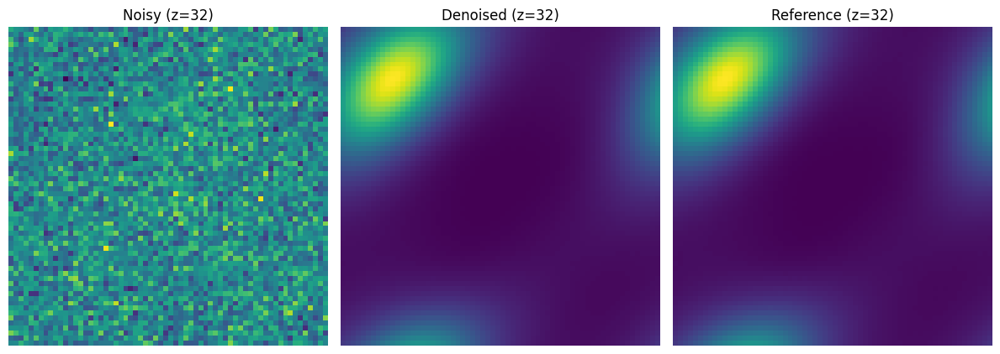


 Denoised matrix saved to /pscratch/sd/k/kberard/SCGSR/Data/diamond_1x1x1_bfd/density_data/vmc_J2/density_tot_vmc_mean_0006881280_scunet_pre_denoised.npy
Sample 6881280 | scunet_pre JSD = 0.000097
Block Initial Type: W, drop_path_rate:0.000000
Block Initial Type: SW, drop_path_rate:0.000000
Block Initial Type: W, drop_path_rate:0.000000
Block Initial Type: SW, drop_path_rate:0.000000
Block Initial Type: W, drop_path_rate:0.000000
Block Initial Type: SW, drop_path_rate:0.000000
Block Initial Type: W, drop_path_rate:0.000000
Block Initial Type: SW, drop_path_rate:0.000000
Block Initial Type: W, drop_path_rate:0.000000
Block Initial Type: SW, drop_path_rate:0.000000
Block Initial Type: W, drop_path_rate:0.000000
Block Initial Type: SW, drop_path_rate:0.000000
Block Initial Type: W, drop_path_rate:0.000000
Block Initial Type: SW, drop_path_rate:0.000000
Block Initial Type: W, drop_path_rate:0.000000
Block Initial Type: SW, drop_path_rate:0.000000
Block Initial Type: W, drop_path_rate:0.00

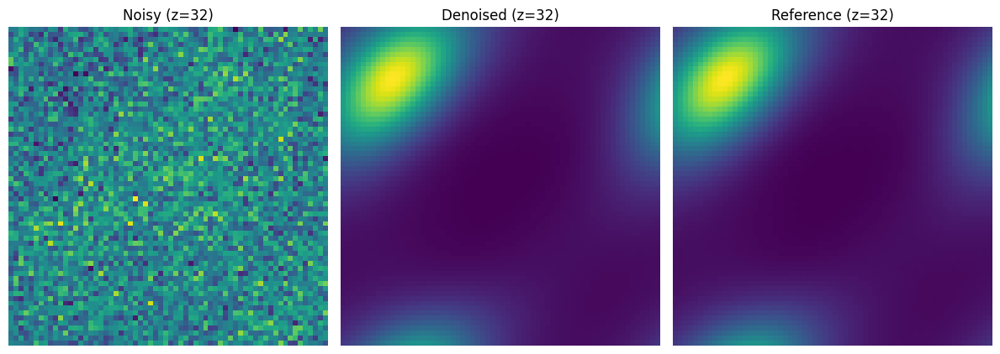


 Denoised matrix saved to /pscratch/sd/k/kberard/SCGSR/Data/diamond_1x1x1_bfd/density_data/vmc_J2/density_tot_vmc_mean_0010321920_scunet_pre_denoised.npy
Sample 10321920 | scunet_pre JSD = 0.000096
Block Initial Type: W, drop_path_rate:0.000000
Block Initial Type: SW, drop_path_rate:0.000000
Block Initial Type: W, drop_path_rate:0.000000
Block Initial Type: SW, drop_path_rate:0.000000
Block Initial Type: W, drop_path_rate:0.000000
Block Initial Type: SW, drop_path_rate:0.000000
Block Initial Type: W, drop_path_rate:0.000000
Block Initial Type: SW, drop_path_rate:0.000000
Block Initial Type: W, drop_path_rate:0.000000
Block Initial Type: SW, drop_path_rate:0.000000
Block Initial Type: W, drop_path_rate:0.000000
Block Initial Type: SW, drop_path_rate:0.000000
Block Initial Type: W, drop_path_rate:0.000000
Block Initial Type: SW, drop_path_rate:0.000000
Block Initial Type: W, drop_path_rate:0.000000
Block Initial Type: SW, drop_path_rate:0.000000
Block Initial Type: W, drop_path_rate:0.0

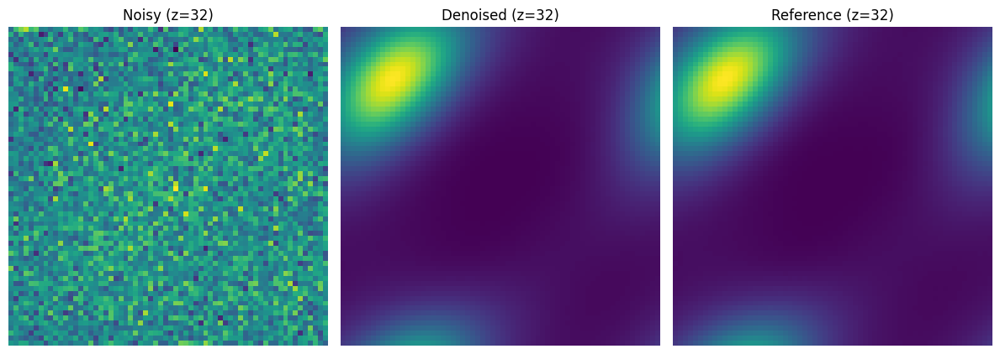


 Denoised matrix saved to /pscratch/sd/k/kberard/SCGSR/Data/diamond_1x1x1_bfd/density_data/vmc_J2/density_tot_vmc_mean_0010485760_scunet_pre_denoised.npy
Sample 10485760 | scunet_pre JSD = 0.000096
Block Initial Type: W, drop_path_rate:0.000000
Block Initial Type: SW, drop_path_rate:0.000000
Block Initial Type: W, drop_path_rate:0.000000
Block Initial Type: SW, drop_path_rate:0.000000
Block Initial Type: W, drop_path_rate:0.000000
Block Initial Type: SW, drop_path_rate:0.000000
Block Initial Type: W, drop_path_rate:0.000000
Block Initial Type: SW, drop_path_rate:0.000000
Block Initial Type: W, drop_path_rate:0.000000
Block Initial Type: SW, drop_path_rate:0.000000
Block Initial Type: W, drop_path_rate:0.000000
Block Initial Type: SW, drop_path_rate:0.000000
Block Initial Type: W, drop_path_rate:0.000000
Block Initial Type: SW, drop_path_rate:0.000000
Block Initial Type: W, drop_path_rate:0.000000
Block Initial Type: SW, drop_path_rate:0.000000
Block Initial Type: W, drop_path_rate:0.0

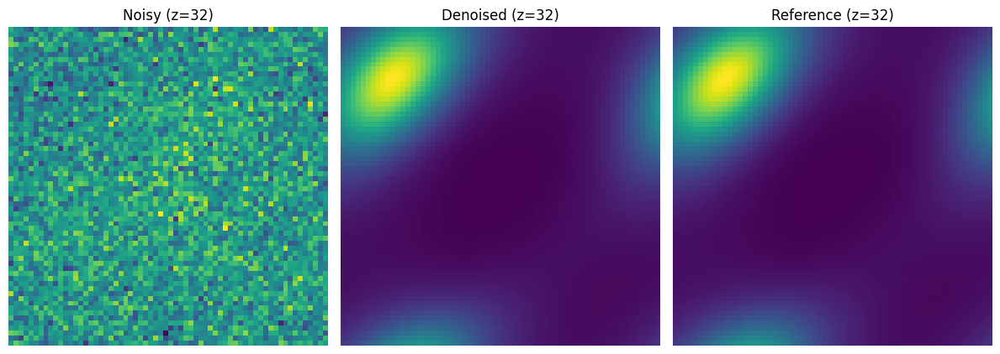


 Denoised matrix saved to /pscratch/sd/k/kberard/SCGSR/Data/diamond_1x1x1_bfd/density_data/vmc_J2/density_tot_vmc_mean_0013762560_scunet_pre_denoised.npy
Sample 13762560 | scunet_pre JSD = 0.000095
Block Initial Type: W, drop_path_rate:0.000000
Block Initial Type: SW, drop_path_rate:0.000000
Block Initial Type: W, drop_path_rate:0.000000
Block Initial Type: SW, drop_path_rate:0.000000
Block Initial Type: W, drop_path_rate:0.000000
Block Initial Type: SW, drop_path_rate:0.000000
Block Initial Type: W, drop_path_rate:0.000000
Block Initial Type: SW, drop_path_rate:0.000000
Block Initial Type: W, drop_path_rate:0.000000
Block Initial Type: SW, drop_path_rate:0.000000
Block Initial Type: W, drop_path_rate:0.000000
Block Initial Type: SW, drop_path_rate:0.000000
Block Initial Type: W, drop_path_rate:0.000000
Block Initial Type: SW, drop_path_rate:0.000000
Block Initial Type: W, drop_path_rate:0.000000
Block Initial Type: SW, drop_path_rate:0.000000
Block Initial Type: W, drop_path_rate:0.0

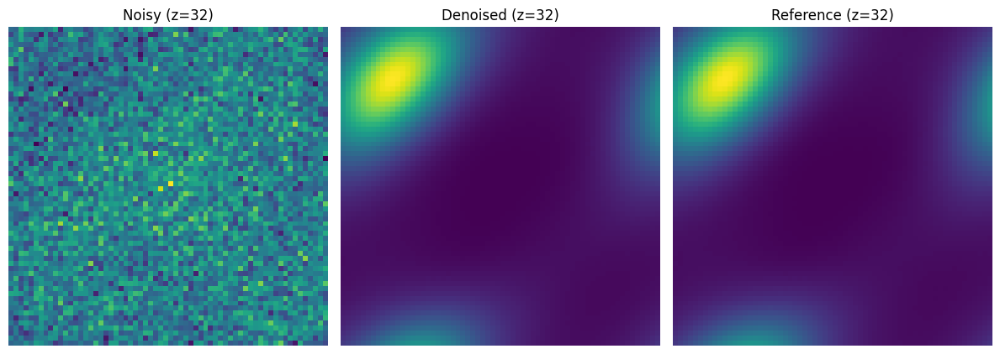


 Denoised matrix saved to /pscratch/sd/k/kberard/SCGSR/Data/diamond_1x1x1_bfd/density_data/vmc_J2/density_tot_vmc_mean_0020643840_scunet_pre_denoised.npy
Sample 20643840 | scunet_pre JSD = 0.000094
Block Initial Type: W, drop_path_rate:0.000000
Block Initial Type: SW, drop_path_rate:0.000000
Block Initial Type: W, drop_path_rate:0.000000
Block Initial Type: SW, drop_path_rate:0.000000
Block Initial Type: W, drop_path_rate:0.000000
Block Initial Type: SW, drop_path_rate:0.000000
Block Initial Type: W, drop_path_rate:0.000000
Block Initial Type: SW, drop_path_rate:0.000000
Block Initial Type: W, drop_path_rate:0.000000
Block Initial Type: SW, drop_path_rate:0.000000
Block Initial Type: W, drop_path_rate:0.000000
Block Initial Type: SW, drop_path_rate:0.000000
Block Initial Type: W, drop_path_rate:0.000000
Block Initial Type: SW, drop_path_rate:0.000000
Block Initial Type: W, drop_path_rate:0.000000
Block Initial Type: SW, drop_path_rate:0.000000
Block Initial Type: W, drop_path_rate:0.0

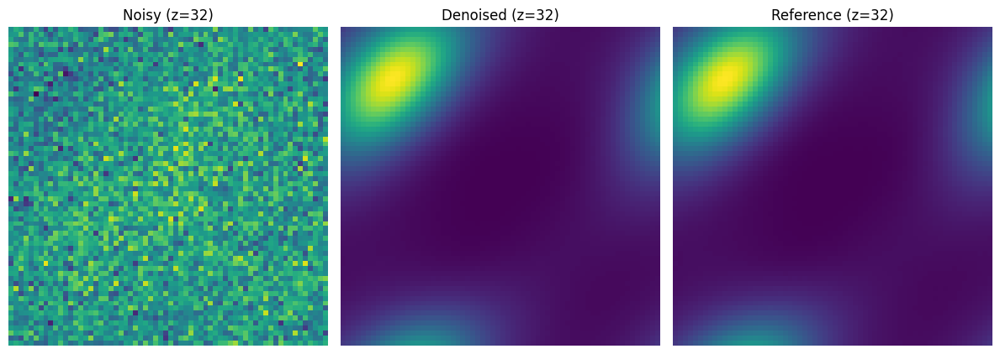


 Denoised matrix saved to /pscratch/sd/k/kberard/SCGSR/Data/diamond_1x1x1_bfd/density_data/vmc_J2/density_tot_vmc_mean_0027525120_scunet_pre_denoised.npy
Sample 27525120 | scunet_pre JSD = 0.000092
Block Initial Type: W, drop_path_rate:0.000000
Block Initial Type: SW, drop_path_rate:0.000000
Block Initial Type: W, drop_path_rate:0.000000
Block Initial Type: SW, drop_path_rate:0.000000
Block Initial Type: W, drop_path_rate:0.000000
Block Initial Type: SW, drop_path_rate:0.000000
Block Initial Type: W, drop_path_rate:0.000000
Block Initial Type: SW, drop_path_rate:0.000000
Block Initial Type: W, drop_path_rate:0.000000
Block Initial Type: SW, drop_path_rate:0.000000
Block Initial Type: W, drop_path_rate:0.000000
Block Initial Type: SW, drop_path_rate:0.000000
Block Initial Type: W, drop_path_rate:0.000000
Block Initial Type: SW, drop_path_rate:0.000000
Block Initial Type: W, drop_path_rate:0.000000
Block Initial Type: SW, drop_path_rate:0.000000
Block Initial Type: W, drop_path_rate:0.0

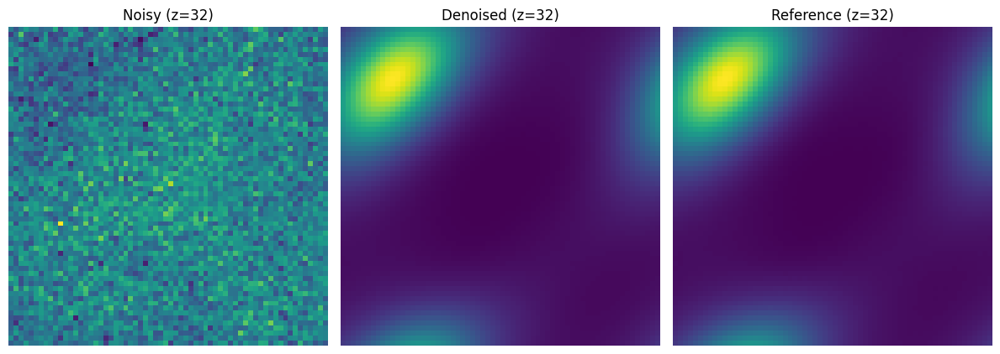


 Denoised matrix saved to /pscratch/sd/k/kberard/SCGSR/Data/diamond_1x1x1_bfd/density_data/vmc_J2/density_tot_vmc_mean_0041287680_scunet_pre_denoised.npy
Sample 41287680 | scunet_pre JSD = 0.000091
Block Initial Type: W, drop_path_rate:0.000000
Block Initial Type: SW, drop_path_rate:0.000000
Block Initial Type: W, drop_path_rate:0.000000
Block Initial Type: SW, drop_path_rate:0.000000
Block Initial Type: W, drop_path_rate:0.000000
Block Initial Type: SW, drop_path_rate:0.000000
Block Initial Type: W, drop_path_rate:0.000000
Block Initial Type: SW, drop_path_rate:0.000000
Block Initial Type: W, drop_path_rate:0.000000
Block Initial Type: SW, drop_path_rate:0.000000
Block Initial Type: W, drop_path_rate:0.000000
Block Initial Type: SW, drop_path_rate:0.000000
Block Initial Type: W, drop_path_rate:0.000000
Block Initial Type: SW, drop_path_rate:0.000000
Block Initial Type: W, drop_path_rate:0.000000
Block Initial Type: SW, drop_path_rate:0.000000
Block Initial Type: W, drop_path_rate:0.0

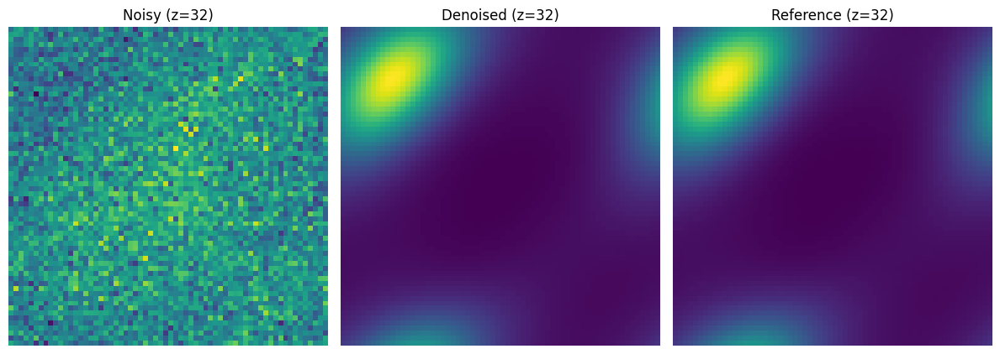


 Denoised matrix saved to /pscratch/sd/k/kberard/SCGSR/Data/diamond_1x1x1_bfd/density_data/vmc_J2/density_tot_vmc_mean_0055050240_scunet_pre_denoised.npy
Sample 55050240 | scunet_pre JSD = 0.000090
Block Initial Type: W, drop_path_rate:0.000000
Block Initial Type: SW, drop_path_rate:0.000000
Block Initial Type: W, drop_path_rate:0.000000
Block Initial Type: SW, drop_path_rate:0.000000
Block Initial Type: W, drop_path_rate:0.000000
Block Initial Type: SW, drop_path_rate:0.000000
Block Initial Type: W, drop_path_rate:0.000000
Block Initial Type: SW, drop_path_rate:0.000000
Block Initial Type: W, drop_path_rate:0.000000
Block Initial Type: SW, drop_path_rate:0.000000
Block Initial Type: W, drop_path_rate:0.000000
Block Initial Type: SW, drop_path_rate:0.000000
Block Initial Type: W, drop_path_rate:0.000000
Block Initial Type: SW, drop_path_rate:0.000000
Block Initial Type: W, drop_path_rate:0.000000
Block Initial Type: SW, drop_path_rate:0.000000
Block Initial Type: W, drop_path_rate:0.0

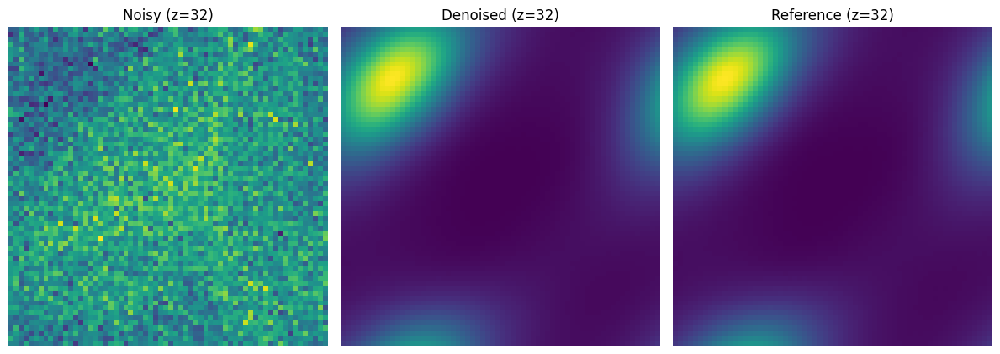


 Denoised matrix saved to /pscratch/sd/k/kberard/SCGSR/Data/diamond_1x1x1_bfd/density_data/vmc_J2/density_tot_vmc_mean_0082575360_scunet_pre_denoised.npy
Sample 82575360 | scunet_pre JSD = 0.000088
Block Initial Type: W, drop_path_rate:0.000000
Block Initial Type: SW, drop_path_rate:0.000000
Block Initial Type: W, drop_path_rate:0.000000
Block Initial Type: SW, drop_path_rate:0.000000
Block Initial Type: W, drop_path_rate:0.000000
Block Initial Type: SW, drop_path_rate:0.000000
Block Initial Type: W, drop_path_rate:0.000000
Block Initial Type: SW, drop_path_rate:0.000000
Block Initial Type: W, drop_path_rate:0.000000
Block Initial Type: SW, drop_path_rate:0.000000
Block Initial Type: W, drop_path_rate:0.000000
Block Initial Type: SW, drop_path_rate:0.000000
Block Initial Type: W, drop_path_rate:0.000000
Block Initial Type: SW, drop_path_rate:0.000000
Block Initial Type: W, drop_path_rate:0.000000
Block Initial Type: SW, drop_path_rate:0.000000
Block Initial Type: W, drop_path_rate:0.0

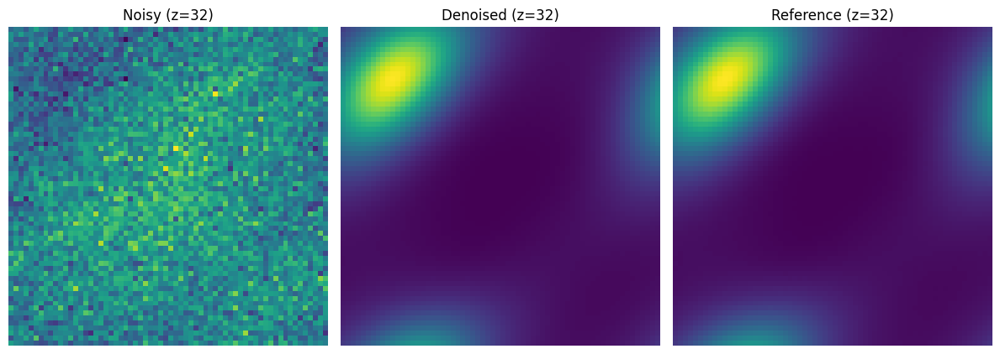


 Denoised matrix saved to /pscratch/sd/k/kberard/SCGSR/Data/diamond_1x1x1_bfd/density_data/vmc_J2/density_tot_vmc_mean_0110100480_scunet_pre_denoised.npy
Sample 110100480 | scunet_pre JSD = 0.000087
Block Initial Type: W, drop_path_rate:0.000000
Block Initial Type: SW, drop_path_rate:0.000000
Block Initial Type: W, drop_path_rate:0.000000
Block Initial Type: SW, drop_path_rate:0.000000
Block Initial Type: W, drop_path_rate:0.000000
Block Initial Type: SW, drop_path_rate:0.000000
Block Initial Type: W, drop_path_rate:0.000000
Block Initial Type: SW, drop_path_rate:0.000000
Block Initial Type: W, drop_path_rate:0.000000
Block Initial Type: SW, drop_path_rate:0.000000
Block Initial Type: W, drop_path_rate:0.000000
Block Initial Type: SW, drop_path_rate:0.000000
Block Initial Type: W, drop_path_rate:0.000000
Block Initial Type: SW, drop_path_rate:0.000000
Block Initial Type: W, drop_path_rate:0.000000
Block Initial Type: SW, drop_path_rate:0.000000
Block Initial Type: W, drop_path_rate:0.

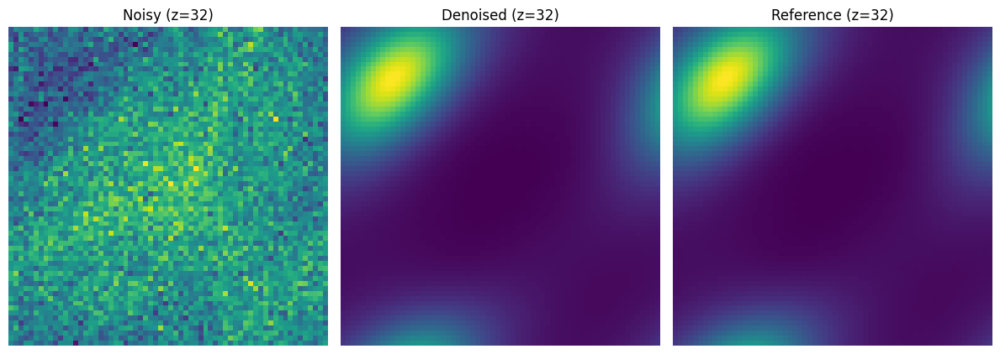


 Denoised matrix saved to /pscratch/sd/k/kberard/SCGSR/Data/diamond_1x1x1_bfd/density_data/vmc_J2/density_tot_vmc_mean_0165150720_scunet_pre_denoised.npy
Sample 165150720 | scunet_pre JSD = 0.000085
Block Initial Type: W, drop_path_rate:0.000000
Block Initial Type: SW, drop_path_rate:0.000000
Block Initial Type: W, drop_path_rate:0.000000
Block Initial Type: SW, drop_path_rate:0.000000
Block Initial Type: W, drop_path_rate:0.000000
Block Initial Type: SW, drop_path_rate:0.000000
Block Initial Type: W, drop_path_rate:0.000000
Block Initial Type: SW, drop_path_rate:0.000000
Block Initial Type: W, drop_path_rate:0.000000
Block Initial Type: SW, drop_path_rate:0.000000
Block Initial Type: W, drop_path_rate:0.000000
Block Initial Type: SW, drop_path_rate:0.000000
Block Initial Type: W, drop_path_rate:0.000000
Block Initial Type: SW, drop_path_rate:0.000000
Block Initial Type: W, drop_path_rate:0.000000
Block Initial Type: SW, drop_path_rate:0.000000
Block Initial Type: W, drop_path_rate:0.

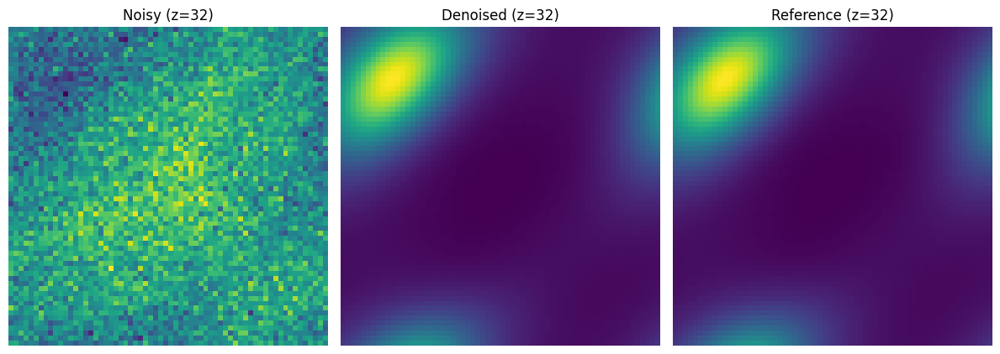


 Denoised matrix saved to /pscratch/sd/k/kberard/SCGSR/Data/diamond_1x1x1_bfd/density_data/vmc_J2/density_tot_vmc_mean_0220200960_scunet_pre_denoised.npy
Sample 220200960 | scunet_pre JSD = 0.000084
Block Initial Type: W, drop_path_rate:0.000000
Block Initial Type: SW, drop_path_rate:0.000000
Block Initial Type: W, drop_path_rate:0.000000
Block Initial Type: SW, drop_path_rate:0.000000
Block Initial Type: W, drop_path_rate:0.000000
Block Initial Type: SW, drop_path_rate:0.000000
Block Initial Type: W, drop_path_rate:0.000000
Block Initial Type: SW, drop_path_rate:0.000000
Block Initial Type: W, drop_path_rate:0.000000
Block Initial Type: SW, drop_path_rate:0.000000
Block Initial Type: W, drop_path_rate:0.000000
Block Initial Type: SW, drop_path_rate:0.000000
Block Initial Type: W, drop_path_rate:0.000000
Block Initial Type: SW, drop_path_rate:0.000000
Block Initial Type: W, drop_path_rate:0.000000
Block Initial Type: SW, drop_path_rate:0.000000
Block Initial Type: W, drop_path_rate:0.

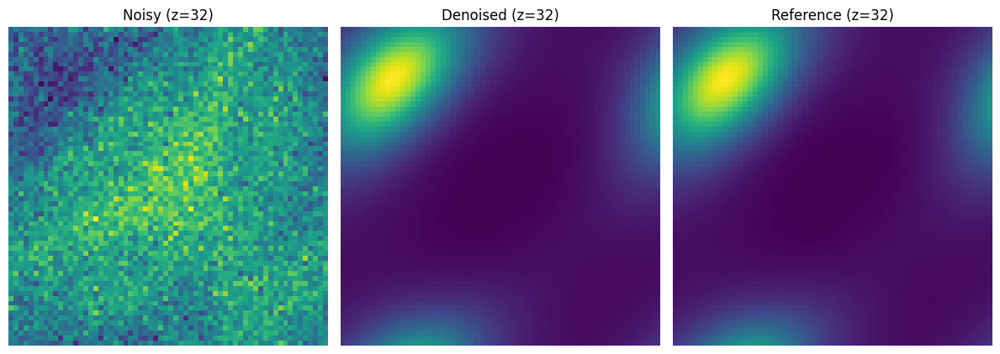


 Denoised matrix saved to /pscratch/sd/k/kberard/SCGSR/Data/diamond_1x1x1_bfd/density_data/vmc_J2/density_tot_vmc_mean_0330301440_scunet_pre_denoised.npy
Sample 330301440 | scunet_pre JSD = 0.000082
Block Initial Type: W, drop_path_rate:0.000000
Block Initial Type: SW, drop_path_rate:0.000000
Block Initial Type: W, drop_path_rate:0.000000
Block Initial Type: SW, drop_path_rate:0.000000
Block Initial Type: W, drop_path_rate:0.000000
Block Initial Type: SW, drop_path_rate:0.000000
Block Initial Type: W, drop_path_rate:0.000000
Block Initial Type: SW, drop_path_rate:0.000000
Block Initial Type: W, drop_path_rate:0.000000
Block Initial Type: SW, drop_path_rate:0.000000
Block Initial Type: W, drop_path_rate:0.000000
Block Initial Type: SW, drop_path_rate:0.000000
Block Initial Type: W, drop_path_rate:0.000000
Block Initial Type: SW, drop_path_rate:0.000000
Block Initial Type: W, drop_path_rate:0.000000
Block Initial Type: SW, drop_path_rate:0.000000
Block Initial Type: W, drop_path_rate:0.

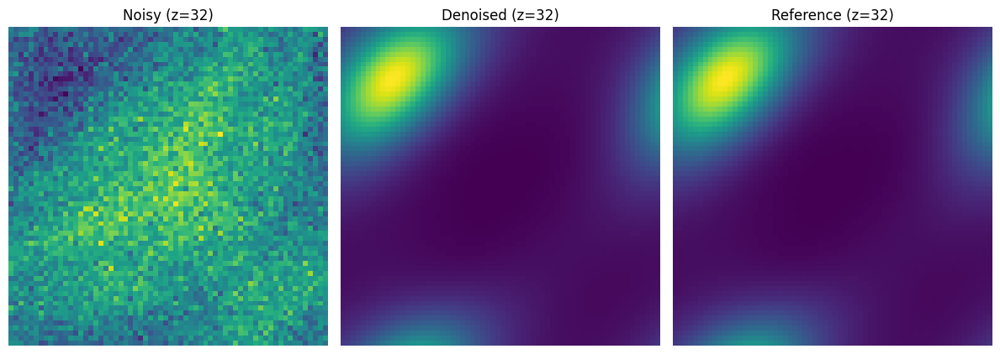


 Denoised matrix saved to /pscratch/sd/k/kberard/SCGSR/Data/diamond_1x1x1_bfd/density_data/vmc_J2/density_tot_vmc_mean_0440401920_scunet_pre_denoised.npy
Sample 440401920 | scunet_pre JSD = 0.000081
Block Initial Type: W, drop_path_rate:0.000000
Block Initial Type: SW, drop_path_rate:0.000000
Block Initial Type: W, drop_path_rate:0.000000
Block Initial Type: SW, drop_path_rate:0.000000
Block Initial Type: W, drop_path_rate:0.000000
Block Initial Type: SW, drop_path_rate:0.000000
Block Initial Type: W, drop_path_rate:0.000000
Block Initial Type: SW, drop_path_rate:0.000000
Block Initial Type: W, drop_path_rate:0.000000
Block Initial Type: SW, drop_path_rate:0.000000
Block Initial Type: W, drop_path_rate:0.000000
Block Initial Type: SW, drop_path_rate:0.000000
Block Initial Type: W, drop_path_rate:0.000000
Block Initial Type: SW, drop_path_rate:0.000000
Block Initial Type: W, drop_path_rate:0.000000
Block Initial Type: SW, drop_path_rate:0.000000
Block Initial Type: W, drop_path_rate:0.

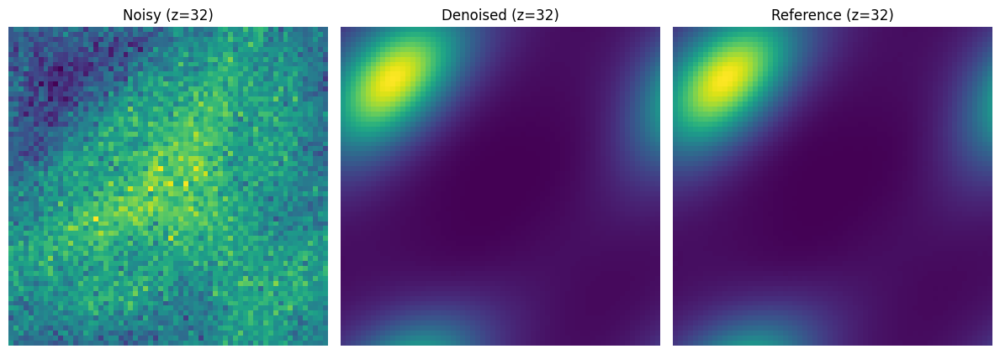


 Denoised matrix saved to /pscratch/sd/k/kberard/SCGSR/Data/diamond_1x1x1_bfd/density_data/vmc_J2/density_tot_vmc_mean_0660602880_scunet_pre_denoised.npy
Sample 660602880 | scunet_pre JSD = 0.000080
Block Initial Type: W, drop_path_rate:0.000000
Block Initial Type: SW, drop_path_rate:0.000000
Block Initial Type: W, drop_path_rate:0.000000
Block Initial Type: SW, drop_path_rate:0.000000
Block Initial Type: W, drop_path_rate:0.000000
Block Initial Type: SW, drop_path_rate:0.000000
Block Initial Type: W, drop_path_rate:0.000000
Block Initial Type: SW, drop_path_rate:0.000000
Block Initial Type: W, drop_path_rate:0.000000
Block Initial Type: SW, drop_path_rate:0.000000
Block Initial Type: W, drop_path_rate:0.000000
Block Initial Type: SW, drop_path_rate:0.000000
Block Initial Type: W, drop_path_rate:0.000000
Block Initial Type: SW, drop_path_rate:0.000000
Block Initial Type: W, drop_path_rate:0.000000
Block Initial Type: SW, drop_path_rate:0.000000
Block Initial Type: W, drop_path_rate:0.

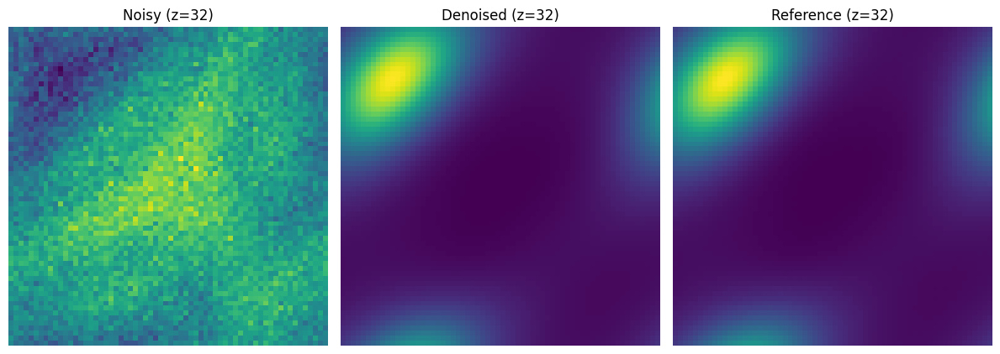


 Denoised matrix saved to /pscratch/sd/k/kberard/SCGSR/Data/diamond_1x1x1_bfd/density_data/vmc_J2/density_tot_vmc_mean_1321205760_scunet_pre_denoised.npy
Sample 1321205760 | scunet_pre JSD = 0.000078
Block Initial Type: W, drop_path_rate:0.000000
Block Initial Type: SW, drop_path_rate:0.000000
Block Initial Type: W, drop_path_rate:0.000000
Block Initial Type: SW, drop_path_rate:0.000000
Block Initial Type: W, drop_path_rate:0.000000
Block Initial Type: SW, drop_path_rate:0.000000
Block Initial Type: W, drop_path_rate:0.000000
Block Initial Type: SW, drop_path_rate:0.000000
Block Initial Type: W, drop_path_rate:0.000000
Block Initial Type: SW, drop_path_rate:0.000000
Block Initial Type: W, drop_path_rate:0.000000
Block Initial Type: SW, drop_path_rate:0.000000
Block Initial Type: W, drop_path_rate:0.000000
Block Initial Type: SW, drop_path_rate:0.000000
Block Initial Type: W, drop_path_rate:0.000000
Block Initial Type: SW, drop_path_rate:0.000000
Block Initial Type: W, drop_path_rate:0

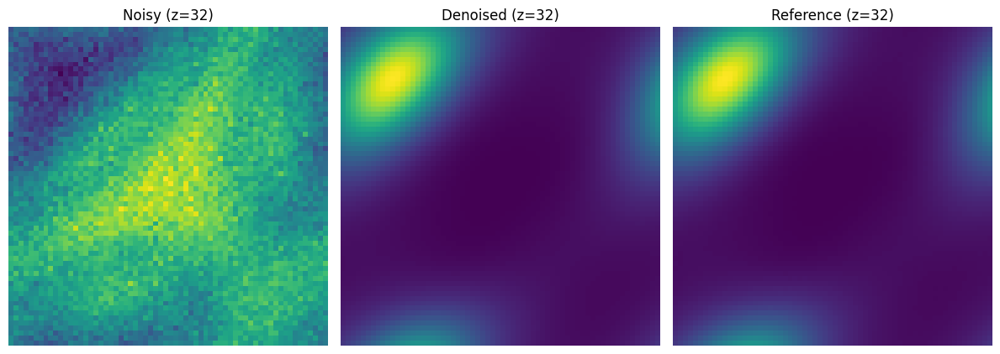


 Denoised matrix saved to /pscratch/sd/k/kberard/SCGSR/Data/diamond_1x1x1_bfd/density_data/vmc_J2/density_tot_vmc_mean_2642411520_scunet_pre_denoised.npy
Sample 2642411520 | scunet_pre JSD = 0.000077
Block Initial Type: W, drop_path_rate:0.000000
Block Initial Type: SW, drop_path_rate:0.000000
Block Initial Type: W, drop_path_rate:0.000000
Block Initial Type: SW, drop_path_rate:0.000000
Block Initial Type: W, drop_path_rate:0.000000
Block Initial Type: SW, drop_path_rate:0.000000
Block Initial Type: W, drop_path_rate:0.000000
Block Initial Type: SW, drop_path_rate:0.000000
Block Initial Type: W, drop_path_rate:0.000000
Block Initial Type: SW, drop_path_rate:0.000000
Block Initial Type: W, drop_path_rate:0.000000
Block Initial Type: SW, drop_path_rate:0.000000
Block Initial Type: W, drop_path_rate:0.000000
Block Initial Type: SW, drop_path_rate:0.000000
Block Initial Type: W, drop_path_rate:0.000000
Block Initial Type: SW, drop_path_rate:0.000000
Block Initial Type: W, drop_path_rate:0

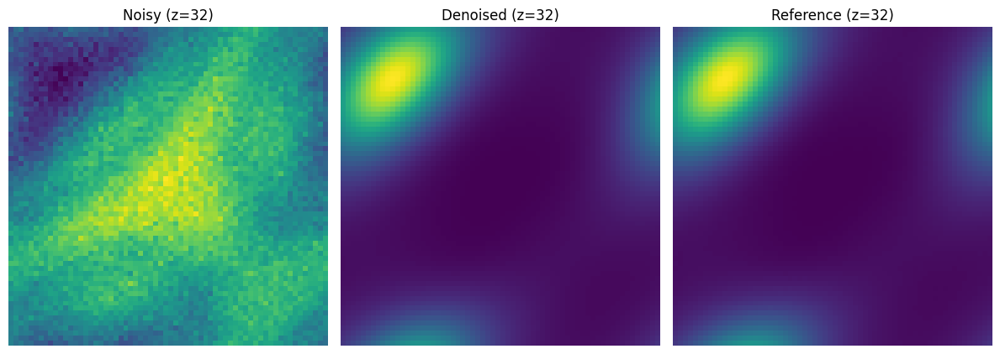


 Denoised matrix saved to /pscratch/sd/k/kberard/SCGSR/Data/diamond_1x1x1_bfd/density_data/vmc_J2/density_tot_vmc_mean_5284823040_scunet_pre_denoised.npy
Sample 5284823040 | scunet_pre JSD = 0.000076

=== Running model: scunet_ft ===

>>> Evaluation Metrics 2D
2-norm (noisy vs ref):     5.2365
2-norm (denoised vs ref): 0.0006
JSD   (noisy vs ref):     52.063201
JSD   (denoised vs ref):  0.000113

>>> Evaluation Metrics 3D
2-norm (noisy vs ref):     5.2365
2-norm (denoised vs ref): 0.0006
JSD   (noisy vs ref):     52.063201
JSD   (denoised vs ref):  0.000113


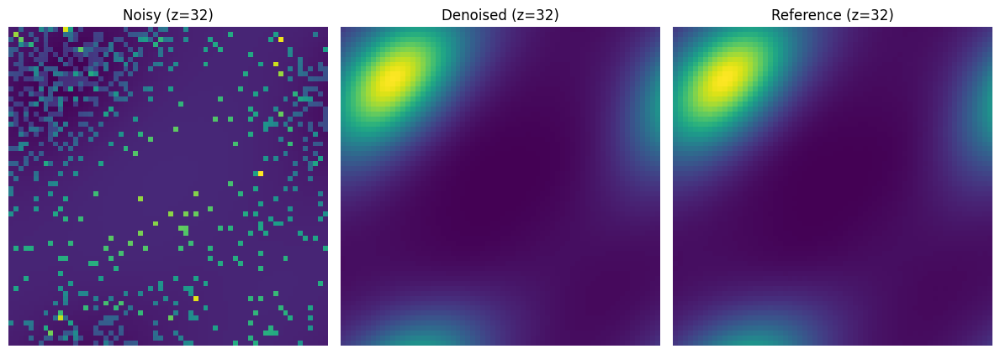


 Denoised matrix saved to /pscratch/sd/k/kberard/SCGSR/Data/diamond_1x1x1_bfd/density_data/vmc_J2/density_tot_vmc_mean_0000010240_scunet_ft_denoised.npy
Sample 10240 | scunet_ft JSD = 0.000113

>>> Evaluation Metrics 2D
2-norm (noisy vs ref):     3.7153
2-norm (denoised vs ref): 0.0006
JSD   (noisy vs ref):     38.646104
JSD   (denoised vs ref):  0.000110

>>> Evaluation Metrics 3D
2-norm (noisy vs ref):     3.7153
2-norm (denoised vs ref): 0.0006
JSD   (noisy vs ref):     38.646104
JSD   (denoised vs ref):  0.000110


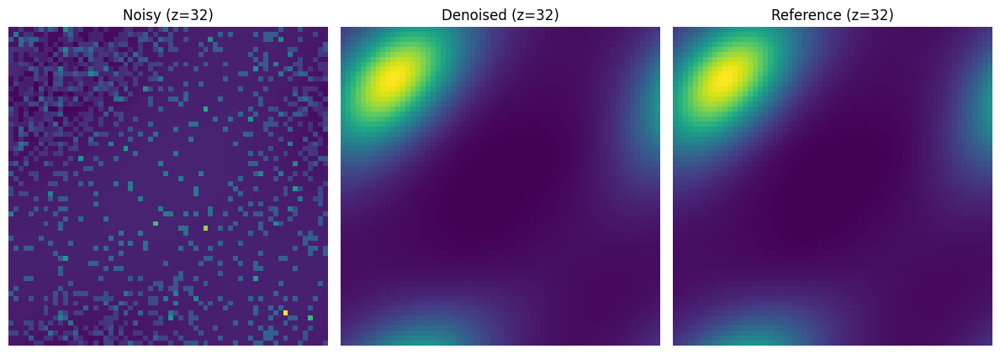


 Denoised matrix saved to /pscratch/sd/k/kberard/SCGSR/Data/diamond_1x1x1_bfd/density_data/vmc_J2/density_tot_vmc_mean_0000020480_scunet_ft_denoised.npy
Sample 20480 | scunet_ft JSD = 0.000110

>>> Evaluation Metrics 2D
2-norm (noisy vs ref):     2.6176
2-norm (denoised vs ref): 0.0006
JSD   (noisy vs ref):     34.109040
JSD   (denoised vs ref):  0.000107

>>> Evaluation Metrics 3D
2-norm (noisy vs ref):     2.6176
2-norm (denoised vs ref): 0.0006
JSD   (noisy vs ref):     34.109040
JSD   (denoised vs ref):  0.000107


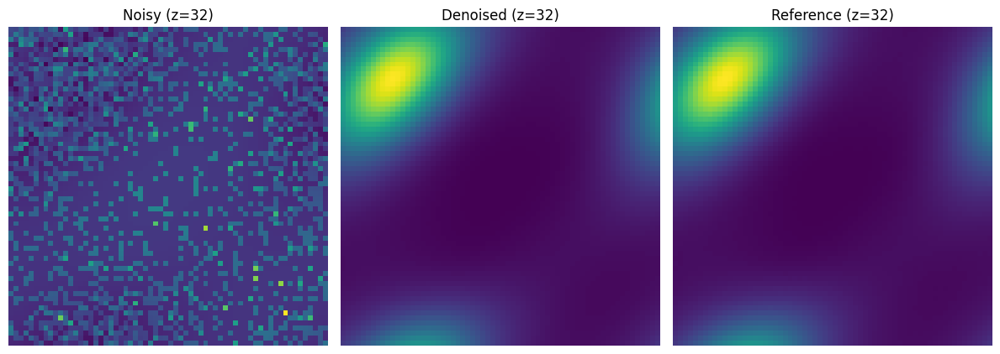


 Denoised matrix saved to /pscratch/sd/k/kberard/SCGSR/Data/diamond_1x1x1_bfd/density_data/vmc_J2/density_tot_vmc_mean_0000040960_scunet_ft_denoised.npy
Sample 40960 | scunet_ft JSD = 0.000107

>>> Evaluation Metrics 2D
2-norm (noisy vs ref):     1.8514
2-norm (denoised vs ref): 0.0006
JSD   (noisy vs ref):     24.002402
JSD   (denoised vs ref):  0.000103

>>> Evaluation Metrics 3D
2-norm (noisy vs ref):     1.8514
2-norm (denoised vs ref): 0.0006
JSD   (noisy vs ref):     24.002402
JSD   (denoised vs ref):  0.000103


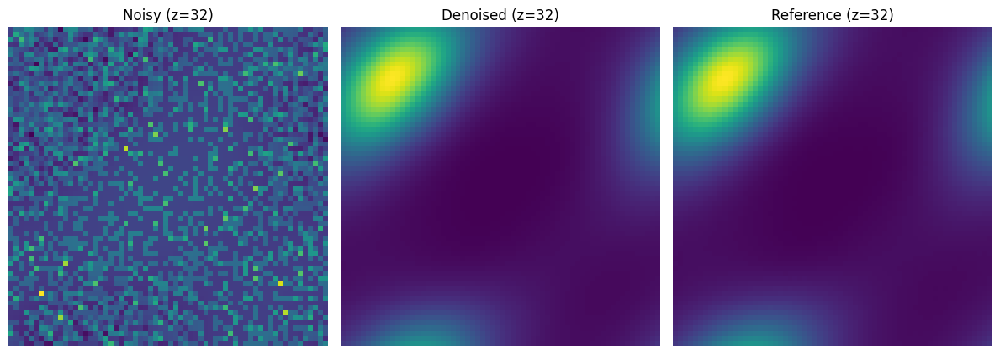


 Denoised matrix saved to /pscratch/sd/k/kberard/SCGSR/Data/diamond_1x1x1_bfd/density_data/vmc_J2/density_tot_vmc_mean_0000081920_scunet_ft_denoised.npy
Sample 81920 | scunet_ft JSD = 0.000103

>>> Evaluation Metrics 2D
2-norm (noisy vs ref):     1.3096
2-norm (denoised vs ref): 0.0006
JSD   (noisy vs ref):     19.183826
JSD   (denoised vs ref):  0.000101

>>> Evaluation Metrics 3D
2-norm (noisy vs ref):     1.3096
2-norm (denoised vs ref): 0.0006
JSD   (noisy vs ref):     19.183826
JSD   (denoised vs ref):  0.000101


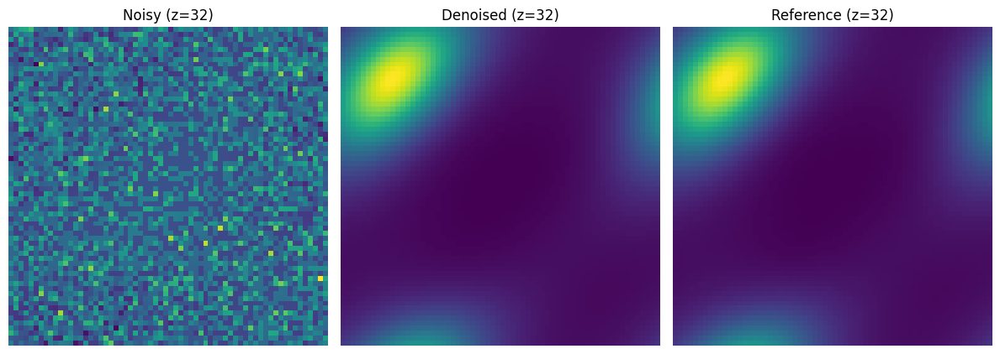


 Denoised matrix saved to /pscratch/sd/k/kberard/SCGSR/Data/diamond_1x1x1_bfd/density_data/vmc_J2/density_tot_vmc_mean_0000163840_scunet_ft_denoised.npy
Sample 163840 | scunet_ft JSD = 0.000101

>>> Evaluation Metrics 2D
2-norm (noisy vs ref):     0.9276
2-norm (denoised vs ref): 0.0006
JSD   (noisy vs ref):     13.825756
JSD   (denoised vs ref):  0.000099

>>> Evaluation Metrics 3D
2-norm (noisy vs ref):     0.9276
2-norm (denoised vs ref): 0.0006
JSD   (noisy vs ref):     13.825756
JSD   (denoised vs ref):  0.000099


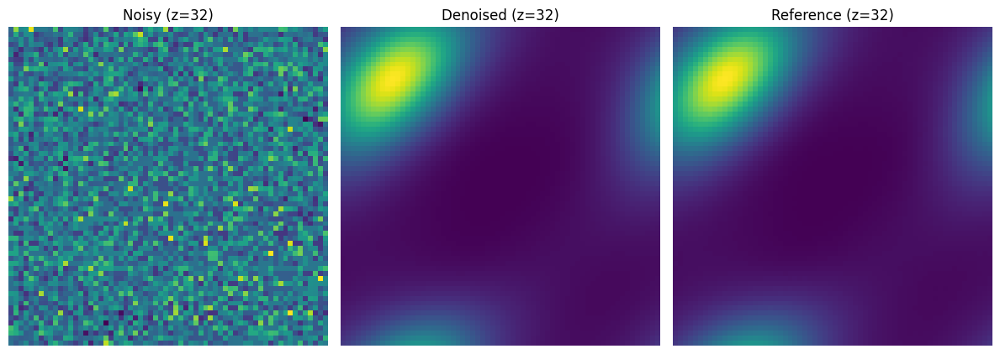


 Denoised matrix saved to /pscratch/sd/k/kberard/SCGSR/Data/diamond_1x1x1_bfd/density_data/vmc_J2/density_tot_vmc_mean_0000327680_scunet_ft_denoised.npy
Sample 327680 | scunet_ft JSD = 0.000099

>>> Evaluation Metrics 2D
2-norm (noisy vs ref):     0.8108
2-norm (denoised vs ref): 0.0006
JSD   (noisy vs ref):     11.998552
JSD   (denoised vs ref):  0.000099

>>> Evaluation Metrics 3D
2-norm (noisy vs ref):     0.8108
2-norm (denoised vs ref): 0.0006
JSD   (noisy vs ref):     11.998552
JSD   (denoised vs ref):  0.000099


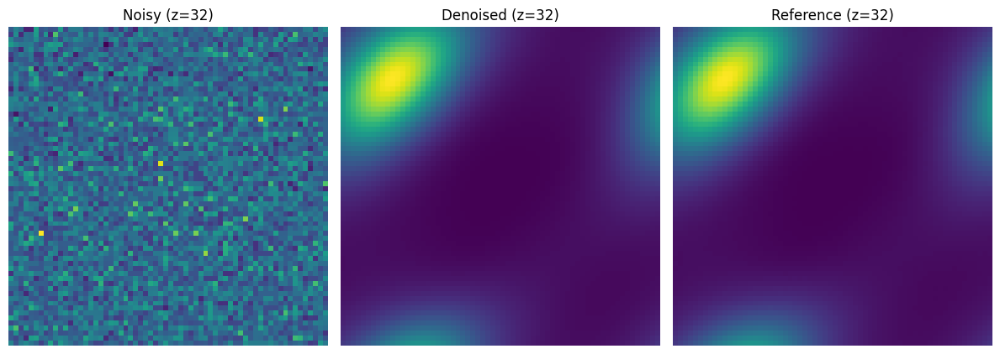


 Denoised matrix saved to /pscratch/sd/k/kberard/SCGSR/Data/diamond_1x1x1_bfd/density_data/vmc_J2/density_tot_vmc_mean_0000430080_scunet_ft_denoised.npy
Sample 430080 | scunet_ft JSD = 0.000099

>>> Evaluation Metrics 2D
2-norm (noisy vs ref):     0.6583
2-norm (denoised vs ref): 0.0006
JSD   (noisy vs ref):     9.441314
JSD   (denoised vs ref):  0.000098

>>> Evaluation Metrics 3D
2-norm (noisy vs ref):     0.6583
2-norm (denoised vs ref): 0.0006
JSD   (noisy vs ref):     9.441314
JSD   (denoised vs ref):  0.000098


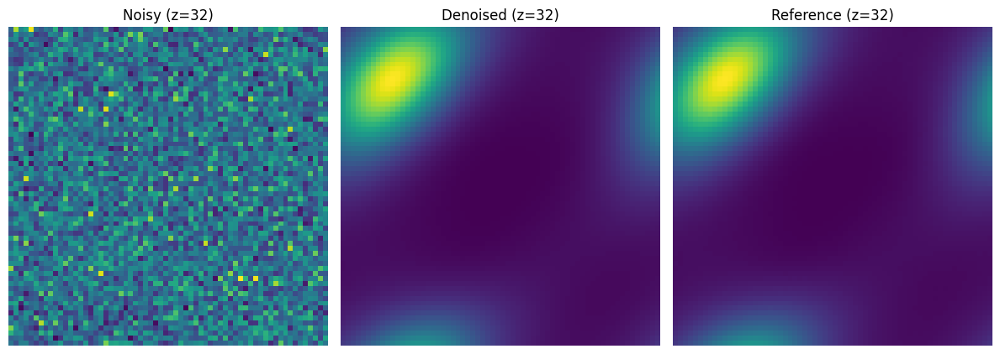


 Denoised matrix saved to /pscratch/sd/k/kberard/SCGSR/Data/diamond_1x1x1_bfd/density_data/vmc_J2/density_tot_vmc_mean_0000655360_scunet_ft_denoised.npy
Sample 655360 | scunet_ft JSD = 0.000098

>>> Evaluation Metrics 2D
2-norm (noisy vs ref):     0.5753
2-norm (denoised vs ref): 0.0006
JSD   (noisy vs ref):     8.264836
JSD   (denoised vs ref):  0.000097

>>> Evaluation Metrics 3D
2-norm (noisy vs ref):     0.5753
2-norm (denoised vs ref): 0.0006
JSD   (noisy vs ref):     8.264836
JSD   (denoised vs ref):  0.000097


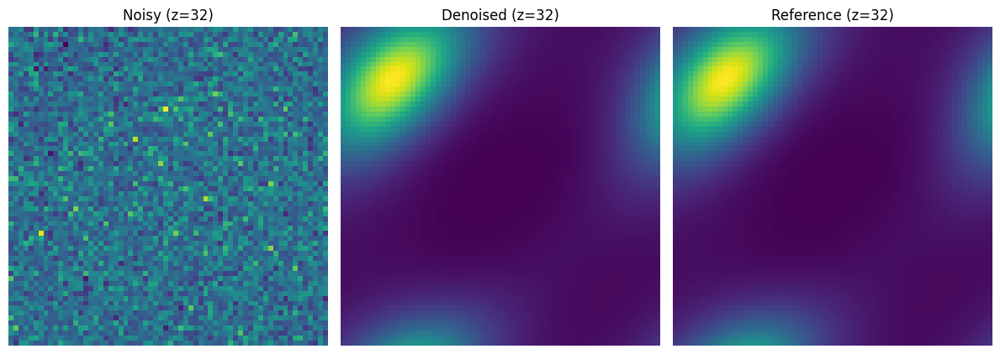


 Denoised matrix saved to /pscratch/sd/k/kberard/SCGSR/Data/diamond_1x1x1_bfd/density_data/vmc_J2/density_tot_vmc_mean_0000860160_scunet_ft_denoised.npy
Sample 860160 | scunet_ft JSD = 0.000097

>>> Evaluation Metrics 2D
2-norm (noisy vs ref):     0.4693
2-norm (denoised vs ref): 0.0006
JSD   (noisy vs ref):     6.710627
JSD   (denoised vs ref):  0.000096

>>> Evaluation Metrics 3D
2-norm (noisy vs ref):     0.4693
2-norm (denoised vs ref): 0.0006
JSD   (noisy vs ref):     6.710627
JSD   (denoised vs ref):  0.000096


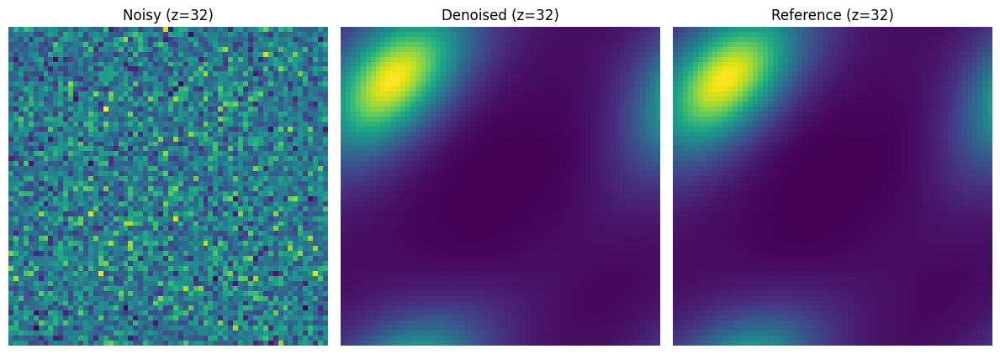


 Denoised matrix saved to /pscratch/sd/k/kberard/SCGSR/Data/diamond_1x1x1_bfd/density_data/vmc_J2/density_tot_vmc_mean_0001310720_scunet_ft_denoised.npy
Sample 1310720 | scunet_ft JSD = 0.000096

>>> Evaluation Metrics 2D
2-norm (noisy vs ref):     0.4100
2-norm (denoised vs ref): 0.0006
JSD   (noisy vs ref):     5.773285
JSD   (denoised vs ref):  0.000096

>>> Evaluation Metrics 3D
2-norm (noisy vs ref):     0.4100
2-norm (denoised vs ref): 0.0006
JSD   (noisy vs ref):     5.773285
JSD   (denoised vs ref):  0.000096


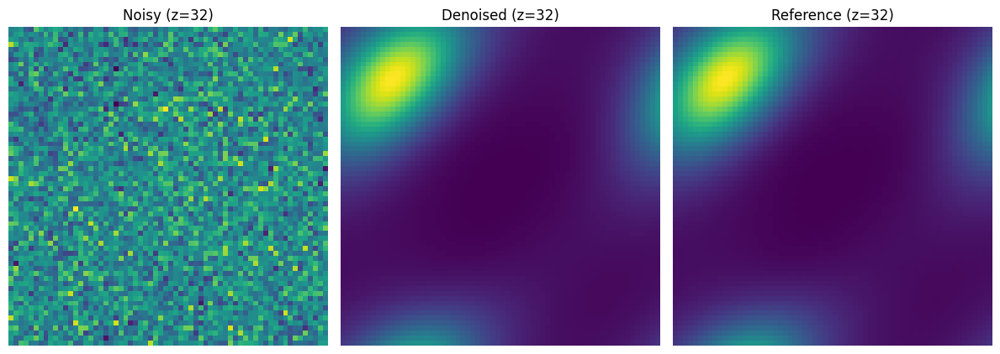


 Denoised matrix saved to /pscratch/sd/k/kberard/SCGSR/Data/diamond_1x1x1_bfd/density_data/vmc_J2/density_tot_vmc_mean_0001720320_scunet_ft_denoised.npy
Sample 1720320 | scunet_ft JSD = 0.000096

>>> Evaluation Metrics 2D
2-norm (noisy vs ref):     0.3366
2-norm (denoised vs ref): 0.0006
JSD   (noisy vs ref):     4.829274
JSD   (denoised vs ref):  0.000094

>>> Evaluation Metrics 3D
2-norm (noisy vs ref):     0.3366
2-norm (denoised vs ref): 0.0006
JSD   (noisy vs ref):     4.829274
JSD   (denoised vs ref):  0.000094


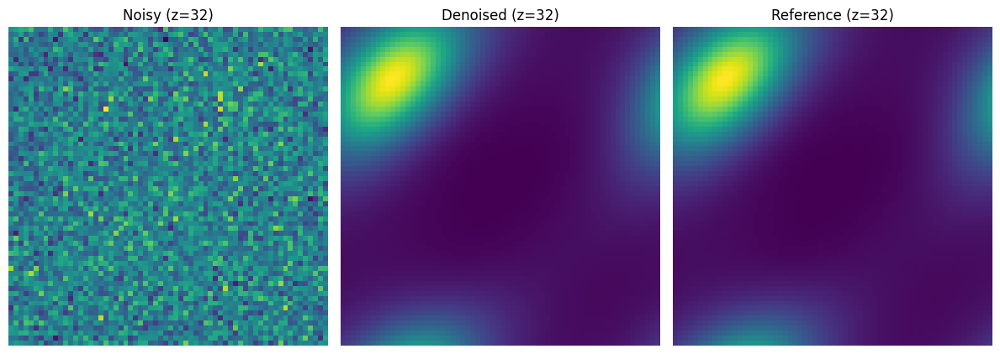


 Denoised matrix saved to /pscratch/sd/k/kberard/SCGSR/Data/diamond_1x1x1_bfd/density_data/vmc_J2/density_tot_vmc_mean_0002621440_scunet_ft_denoised.npy
Sample 2621440 | scunet_ft JSD = 0.000094

>>> Evaluation Metrics 2D
2-norm (noisy vs ref):     0.2957
2-norm (denoised vs ref): 0.0006
JSD   (noisy vs ref):     4.214717
JSD   (denoised vs ref):  0.000093

>>> Evaluation Metrics 3D
2-norm (noisy vs ref):     0.2957
2-norm (denoised vs ref): 0.0006
JSD   (noisy vs ref):     4.214717
JSD   (denoised vs ref):  0.000093


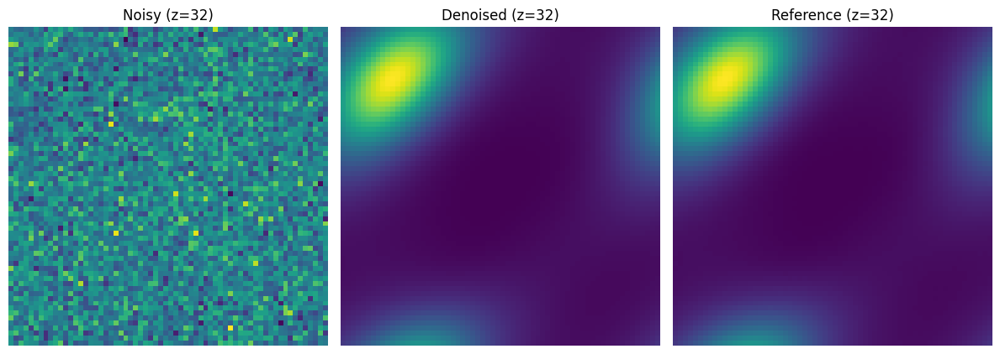


 Denoised matrix saved to /pscratch/sd/k/kberard/SCGSR/Data/diamond_1x1x1_bfd/density_data/vmc_J2/density_tot_vmc_mean_0003440640_scunet_ft_denoised.npy
Sample 3440640 | scunet_ft JSD = 0.000093

>>> Evaluation Metrics 2D
2-norm (noisy vs ref):     0.2466
2-norm (denoised vs ref): 0.0006
JSD   (noisy vs ref):     3.612919
JSD   (denoised vs ref):  0.000092

>>> Evaluation Metrics 3D
2-norm (noisy vs ref):     0.2466
2-norm (denoised vs ref): 0.0006
JSD   (noisy vs ref):     3.612919
JSD   (denoised vs ref):  0.000092


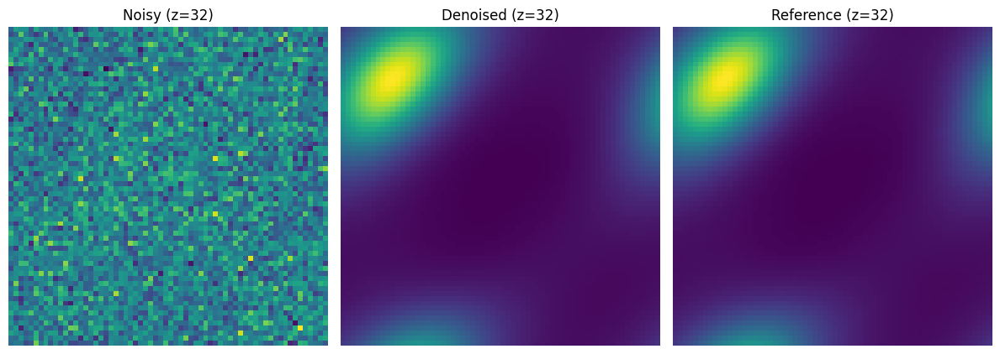


 Denoised matrix saved to /pscratch/sd/k/kberard/SCGSR/Data/diamond_1x1x1_bfd/density_data/vmc_J2/density_tot_vmc_mean_0005160960_scunet_ft_denoised.npy
Sample 5160960 | scunet_ft JSD = 0.000092

>>> Evaluation Metrics 2D
2-norm (noisy vs ref):     0.2450
2-norm (denoised vs ref): 0.0006
JSD   (noisy vs ref):     3.572269
JSD   (denoised vs ref):  0.000092

>>> Evaluation Metrics 3D
2-norm (noisy vs ref):     0.2450
2-norm (denoised vs ref): 0.0006
JSD   (noisy vs ref):     3.572269
JSD   (denoised vs ref):  0.000092


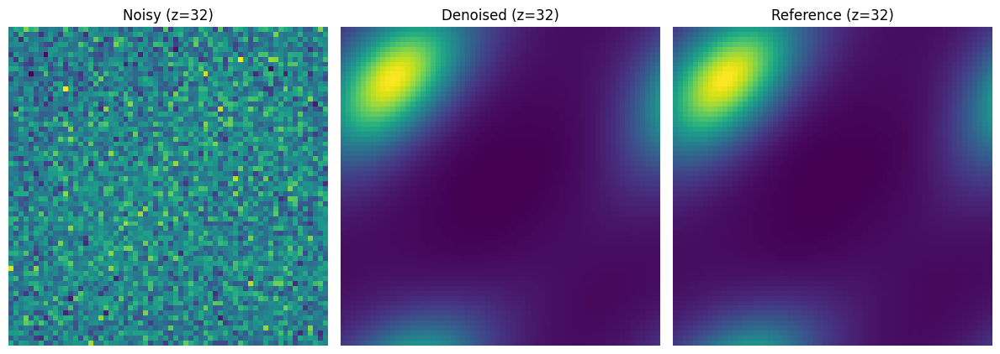


 Denoised matrix saved to /pscratch/sd/k/kberard/SCGSR/Data/diamond_1x1x1_bfd/density_data/vmc_J2/density_tot_vmc_mean_0005242880_scunet_ft_denoised.npy
Sample 5242880 | scunet_ft JSD = 0.000092

>>> Evaluation Metrics 2D
2-norm (noisy vs ref):     0.2177
2-norm (denoised vs ref): 0.0006
JSD   (noisy vs ref):     3.210400
JSD   (denoised vs ref):  0.000091

>>> Evaluation Metrics 3D
2-norm (noisy vs ref):     0.2177
2-norm (denoised vs ref): 0.0006
JSD   (noisy vs ref):     3.210400
JSD   (denoised vs ref):  0.000091


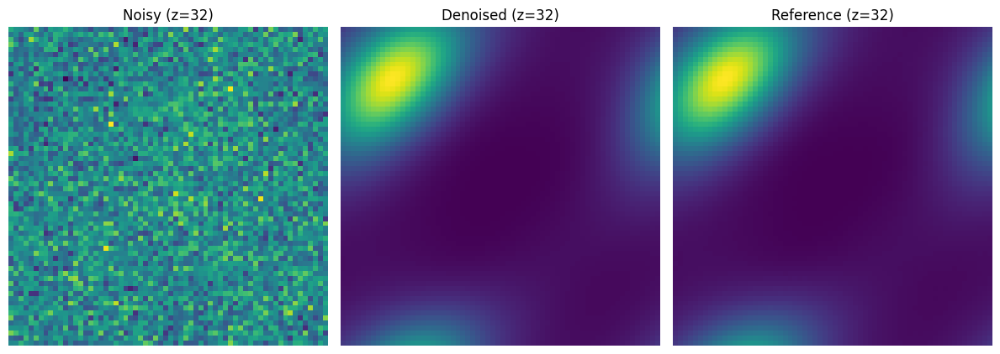


 Denoised matrix saved to /pscratch/sd/k/kberard/SCGSR/Data/diamond_1x1x1_bfd/density_data/vmc_J2/density_tot_vmc_mean_0006881280_scunet_ft_denoised.npy
Sample 6881280 | scunet_ft JSD = 0.000091

>>> Evaluation Metrics 2D
2-norm (noisy vs ref):     0.1835
2-norm (denoised vs ref): 0.0006
JSD   (noisy vs ref):     2.825540
JSD   (denoised vs ref):  0.000089

>>> Evaluation Metrics 3D
2-norm (noisy vs ref):     0.1835
2-norm (denoised vs ref): 0.0006
JSD   (noisy vs ref):     2.825540
JSD   (denoised vs ref):  0.000089


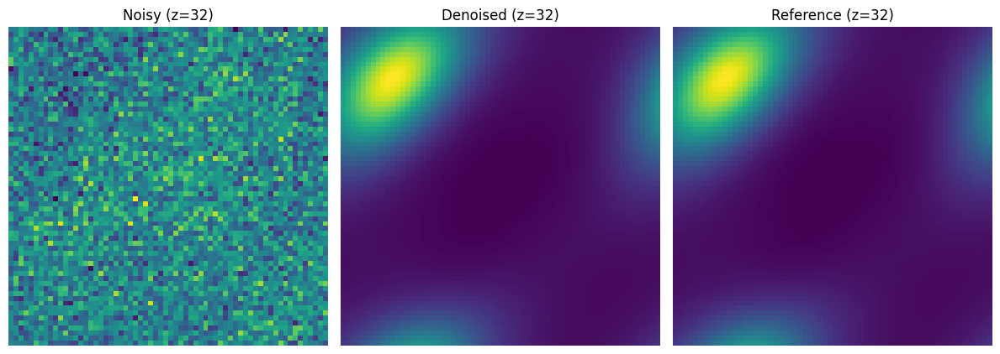


 Denoised matrix saved to /pscratch/sd/k/kberard/SCGSR/Data/diamond_1x1x1_bfd/density_data/vmc_J2/density_tot_vmc_mean_0010321920_scunet_ft_denoised.npy
Sample 10321920 | scunet_ft JSD = 0.000089

>>> Evaluation Metrics 2D
2-norm (noisy vs ref):     0.1826
2-norm (denoised vs ref): 0.0006
JSD   (noisy vs ref):     2.823653
JSD   (denoised vs ref):  0.000089

>>> Evaluation Metrics 3D
2-norm (noisy vs ref):     0.1826
2-norm (denoised vs ref): 0.0006
JSD   (noisy vs ref):     2.823653
JSD   (denoised vs ref):  0.000089


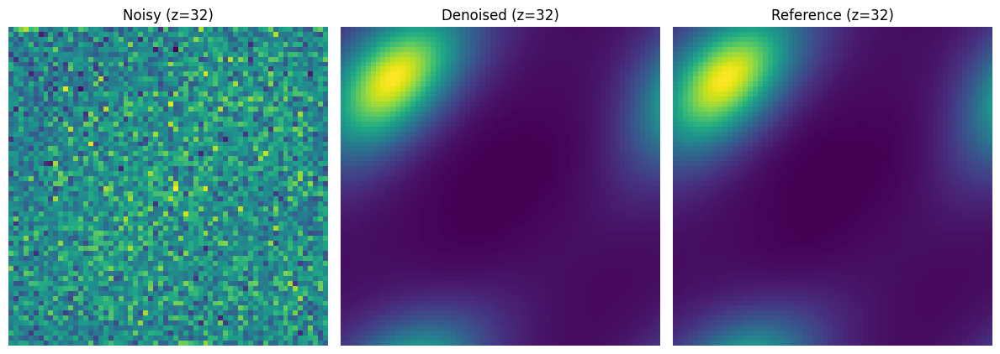


 Denoised matrix saved to /pscratch/sd/k/kberard/SCGSR/Data/diamond_1x1x1_bfd/density_data/vmc_J2/density_tot_vmc_mean_0010485760_scunet_ft_denoised.npy
Sample 10485760 | scunet_ft JSD = 0.000089

>>> Evaluation Metrics 2D
2-norm (noisy vs ref):     0.1643
2-norm (denoised vs ref): 0.0006
JSD   (noisy vs ref):     2.590050
JSD   (denoised vs ref):  0.000088

>>> Evaluation Metrics 3D
2-norm (noisy vs ref):     0.1643
2-norm (denoised vs ref): 0.0006
JSD   (noisy vs ref):     2.590050
JSD   (denoised vs ref):  0.000088


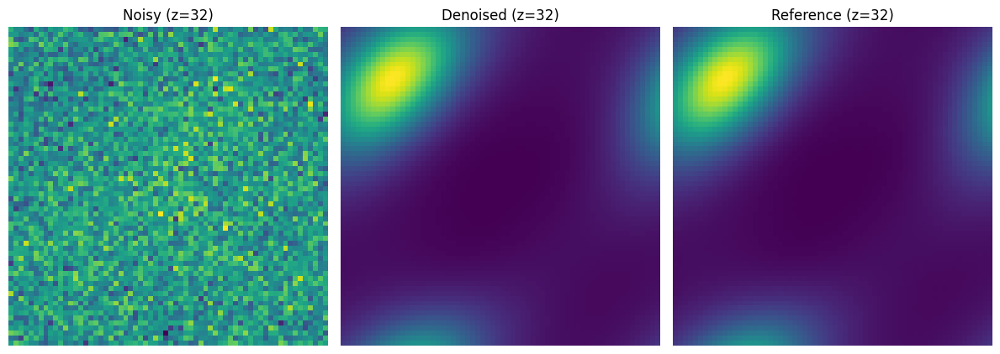


 Denoised matrix saved to /pscratch/sd/k/kberard/SCGSR/Data/diamond_1x1x1_bfd/density_data/vmc_J2/density_tot_vmc_mean_0013762560_scunet_ft_denoised.npy
Sample 13762560 | scunet_ft JSD = 0.000088

>>> Evaluation Metrics 2D
2-norm (noisy vs ref):     0.1421
2-norm (denoised vs ref): 0.0006
JSD   (noisy vs ref):     2.342830
JSD   (denoised vs ref):  0.000086

>>> Evaluation Metrics 3D
2-norm (noisy vs ref):     0.1421
2-norm (denoised vs ref): 0.0006
JSD   (noisy vs ref):     2.342830
JSD   (denoised vs ref):  0.000086


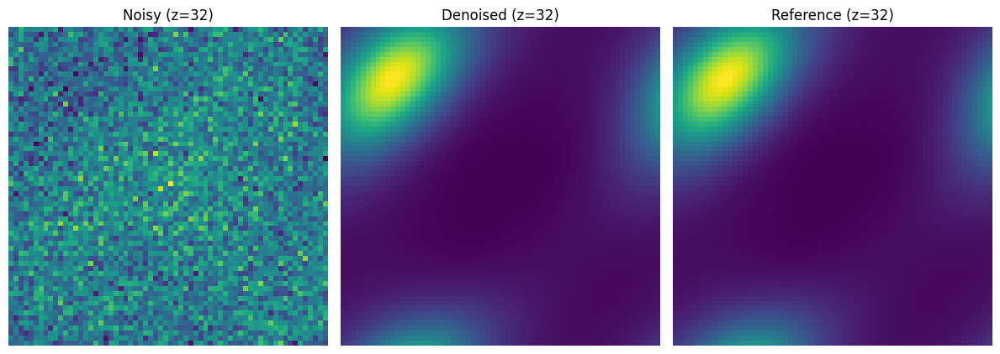


 Denoised matrix saved to /pscratch/sd/k/kberard/SCGSR/Data/diamond_1x1x1_bfd/density_data/vmc_J2/density_tot_vmc_mean_0020643840_scunet_ft_denoised.npy
Sample 20643840 | scunet_ft JSD = 0.000086

>>> Evaluation Metrics 2D
2-norm (noisy vs ref):     0.1298
2-norm (denoised vs ref): 0.0005
JSD   (noisy vs ref):     2.207554
JSD   (denoised vs ref):  0.000085

>>> Evaluation Metrics 3D
2-norm (noisy vs ref):     0.1298
2-norm (denoised vs ref): 0.0005
JSD   (noisy vs ref):     2.207554
JSD   (denoised vs ref):  0.000085


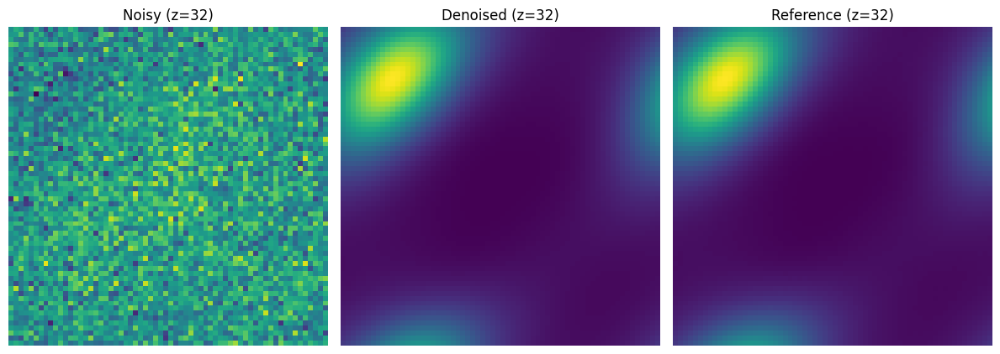


 Denoised matrix saved to /pscratch/sd/k/kberard/SCGSR/Data/diamond_1x1x1_bfd/density_data/vmc_J2/density_tot_vmc_mean_0027525120_scunet_ft_denoised.npy
Sample 27525120 | scunet_ft JSD = 0.000085

>>> Evaluation Metrics 2D
2-norm (noisy vs ref):     0.1159
2-norm (denoised vs ref): 0.0005
JSD   (noisy vs ref):     2.052071
JSD   (denoised vs ref):  0.000084

>>> Evaluation Metrics 3D
2-norm (noisy vs ref):     0.1159
2-norm (denoised vs ref): 0.0005
JSD   (noisy vs ref):     2.052071
JSD   (denoised vs ref):  0.000084


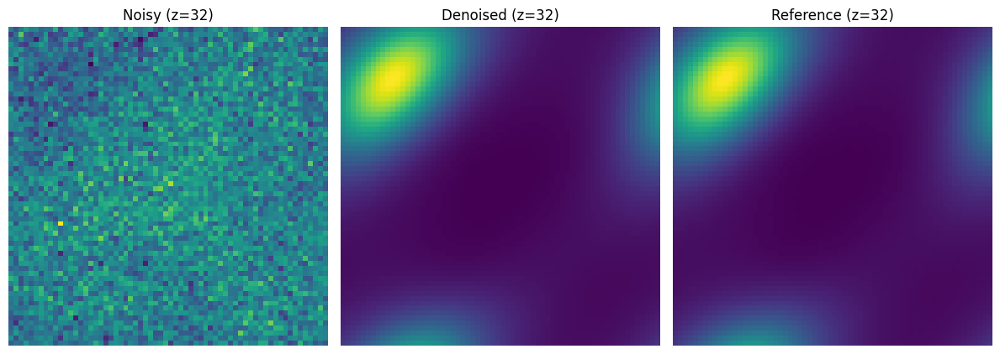


 Denoised matrix saved to /pscratch/sd/k/kberard/SCGSR/Data/diamond_1x1x1_bfd/density_data/vmc_J2/density_tot_vmc_mean_0041287680_scunet_ft_denoised.npy
Sample 41287680 | scunet_ft JSD = 0.000084

>>> Evaluation Metrics 2D
2-norm (noisy vs ref):     0.1086
2-norm (denoised vs ref): 0.0005
JSD   (noisy vs ref):     1.961343
JSD   (denoised vs ref):  0.000082

>>> Evaluation Metrics 3D
2-norm (noisy vs ref):     0.1086
2-norm (denoised vs ref): 0.0005
JSD   (noisy vs ref):     1.961343
JSD   (denoised vs ref):  0.000082


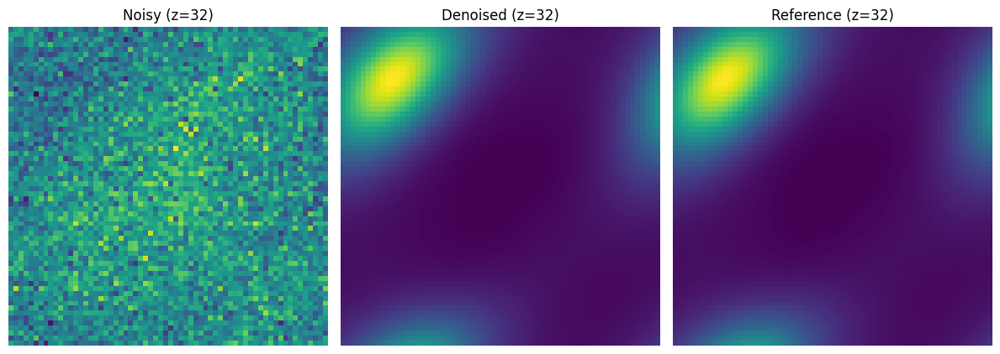


 Denoised matrix saved to /pscratch/sd/k/kberard/SCGSR/Data/diamond_1x1x1_bfd/density_data/vmc_J2/density_tot_vmc_mean_0055050240_scunet_ft_denoised.npy
Sample 55050240 | scunet_ft JSD = 0.000082

>>> Evaluation Metrics 2D
2-norm (noisy vs ref):     0.1004
2-norm (denoised vs ref): 0.0005
JSD   (noisy vs ref):     1.854723
JSD   (denoised vs ref):  0.000081

>>> Evaluation Metrics 3D
2-norm (noisy vs ref):     0.1004
2-norm (denoised vs ref): 0.0005
JSD   (noisy vs ref):     1.854723
JSD   (denoised vs ref):  0.000081


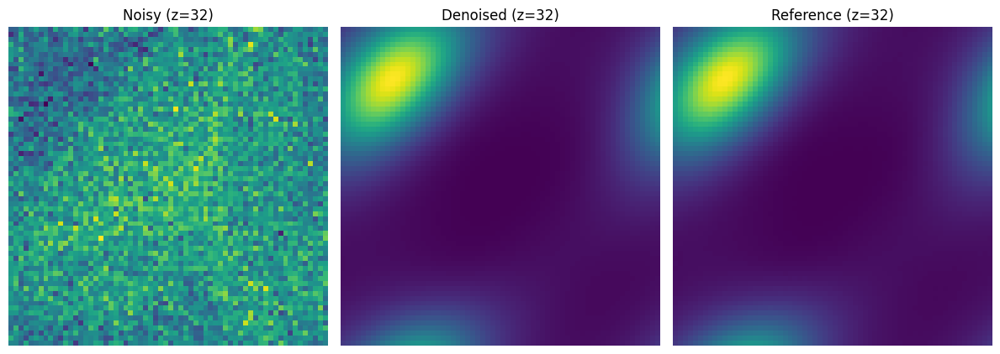


 Denoised matrix saved to /pscratch/sd/k/kberard/SCGSR/Data/diamond_1x1x1_bfd/density_data/vmc_J2/density_tot_vmc_mean_0082575360_scunet_ft_denoised.npy
Sample 82575360 | scunet_ft JSD = 0.000081

>>> Evaluation Metrics 2D
2-norm (noisy vs ref):     0.0961
2-norm (denoised vs ref): 0.0005
JSD   (noisy vs ref):     1.797909
JSD   (denoised vs ref):  0.000080

>>> Evaluation Metrics 3D
2-norm (noisy vs ref):     0.0961
2-norm (denoised vs ref): 0.0005
JSD   (noisy vs ref):     1.797909
JSD   (denoised vs ref):  0.000080


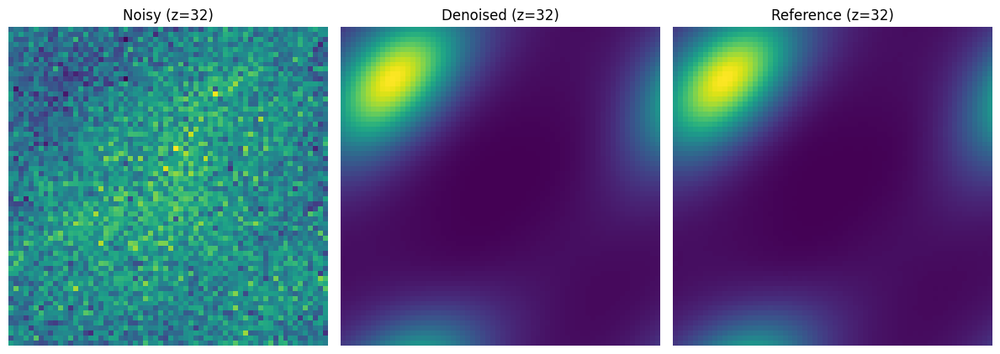


 Denoised matrix saved to /pscratch/sd/k/kberard/SCGSR/Data/diamond_1x1x1_bfd/density_data/vmc_J2/density_tot_vmc_mean_0110100480_scunet_ft_denoised.npy
Sample 110100480 | scunet_ft JSD = 0.000080

>>> Evaluation Metrics 2D
2-norm (noisy vs ref):     0.0914
2-norm (denoised vs ref): 0.0005
JSD   (noisy vs ref):     1.720404
JSD   (denoised vs ref):  0.000079

>>> Evaluation Metrics 3D
2-norm (noisy vs ref):     0.0914
2-norm (denoised vs ref): 0.0005
JSD   (noisy vs ref):     1.720404
JSD   (denoised vs ref):  0.000079


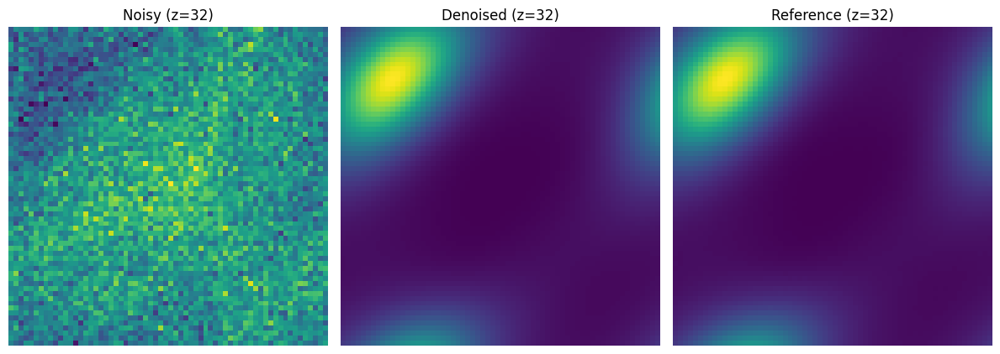


 Denoised matrix saved to /pscratch/sd/k/kberard/SCGSR/Data/diamond_1x1x1_bfd/density_data/vmc_J2/density_tot_vmc_mean_0165150720_scunet_ft_denoised.npy
Sample 165150720 | scunet_ft JSD = 0.000079

>>> Evaluation Metrics 2D
2-norm (noisy vs ref):     0.0891
2-norm (denoised vs ref): 0.0005
JSD   (noisy vs ref):     1.684438
JSD   (denoised vs ref):  0.000078

>>> Evaluation Metrics 3D
2-norm (noisy vs ref):     0.0891
2-norm (denoised vs ref): 0.0005
JSD   (noisy vs ref):     1.684438
JSD   (denoised vs ref):  0.000078


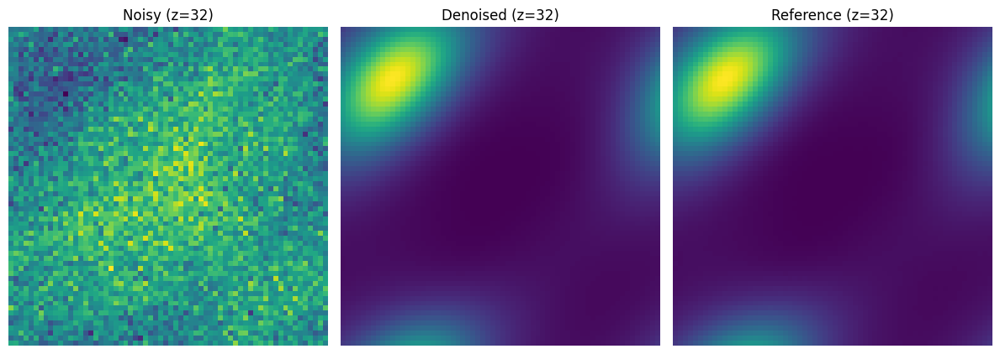


 Denoised matrix saved to /pscratch/sd/k/kberard/SCGSR/Data/diamond_1x1x1_bfd/density_data/vmc_J2/density_tot_vmc_mean_0220200960_scunet_ft_denoised.npy
Sample 220200960 | scunet_ft JSD = 0.000078

>>> Evaluation Metrics 2D
2-norm (noisy vs ref):     0.0867
2-norm (denoised vs ref): 0.0005
JSD   (noisy vs ref):     1.640221
JSD   (denoised vs ref):  0.000077

>>> Evaluation Metrics 3D
2-norm (noisy vs ref):     0.0867
2-norm (denoised vs ref): 0.0005
JSD   (noisy vs ref):     1.640221
JSD   (denoised vs ref):  0.000077


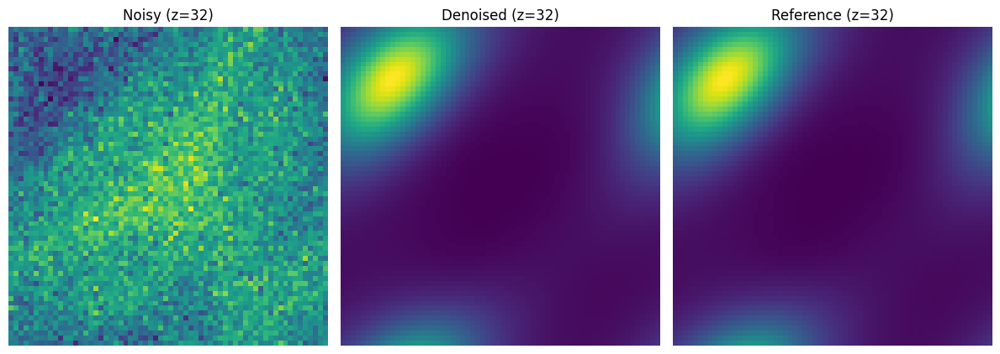


 Denoised matrix saved to /pscratch/sd/k/kberard/SCGSR/Data/diamond_1x1x1_bfd/density_data/vmc_J2/density_tot_vmc_mean_0330301440_scunet_ft_denoised.npy
Sample 330301440 | scunet_ft JSD = 0.000077

>>> Evaluation Metrics 2D
2-norm (noisy vs ref):     0.0855
2-norm (denoised vs ref): 0.0005
JSD   (noisy vs ref):     1.616228
JSD   (denoised vs ref):  0.000077

>>> Evaluation Metrics 3D
2-norm (noisy vs ref):     0.0855
2-norm (denoised vs ref): 0.0005
JSD   (noisy vs ref):     1.616228
JSD   (denoised vs ref):  0.000077


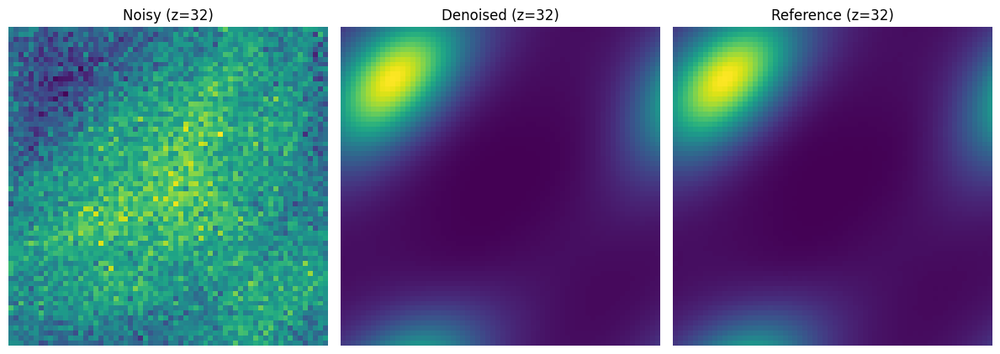


 Denoised matrix saved to /pscratch/sd/k/kberard/SCGSR/Data/diamond_1x1x1_bfd/density_data/vmc_J2/density_tot_vmc_mean_0440401920_scunet_ft_denoised.npy
Sample 440401920 | scunet_ft JSD = 0.000077

>>> Evaluation Metrics 2D
2-norm (noisy vs ref):     0.0843
2-norm (denoised vs ref): 0.0005
JSD   (noisy vs ref):     1.591536
JSD   (denoised vs ref):  0.000076

>>> Evaluation Metrics 3D
2-norm (noisy vs ref):     0.0843
2-norm (denoised vs ref): 0.0005
JSD   (noisy vs ref):     1.591536
JSD   (denoised vs ref):  0.000076


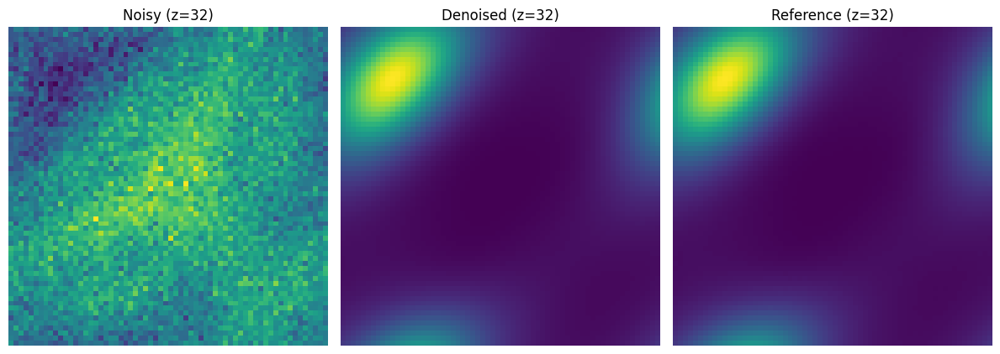


 Denoised matrix saved to /pscratch/sd/k/kberard/SCGSR/Data/diamond_1x1x1_bfd/density_data/vmc_J2/density_tot_vmc_mean_0660602880_scunet_ft_denoised.npy
Sample 660602880 | scunet_ft JSD = 0.000076

>>> Evaluation Metrics 2D
2-norm (noisy vs ref):     0.0830
2-norm (denoised vs ref): 0.0005
JSD   (noisy vs ref):     1.564715
JSD   (denoised vs ref):  0.000075

>>> Evaluation Metrics 3D
2-norm (noisy vs ref):     0.0830
2-norm (denoised vs ref): 0.0005
JSD   (noisy vs ref):     1.564715
JSD   (denoised vs ref):  0.000075


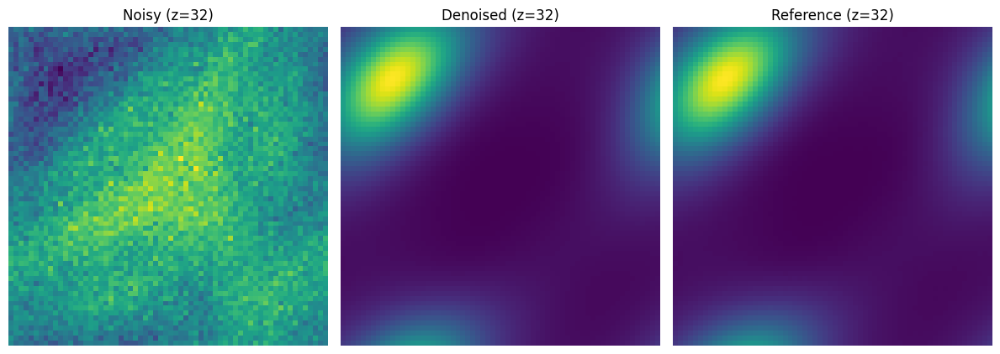


 Denoised matrix saved to /pscratch/sd/k/kberard/SCGSR/Data/diamond_1x1x1_bfd/density_data/vmc_J2/density_tot_vmc_mean_1321205760_scunet_ft_denoised.npy
Sample 1321205760 | scunet_ft JSD = 0.000075

>>> Evaluation Metrics 2D
2-norm (noisy vs ref):     0.0824
2-norm (denoised vs ref): 0.0005
JSD   (noisy vs ref):     1.554853
JSD   (denoised vs ref):  0.000074

>>> Evaluation Metrics 3D
2-norm (noisy vs ref):     0.0824
2-norm (denoised vs ref): 0.0005
JSD   (noisy vs ref):     1.554853
JSD   (denoised vs ref):  0.000074


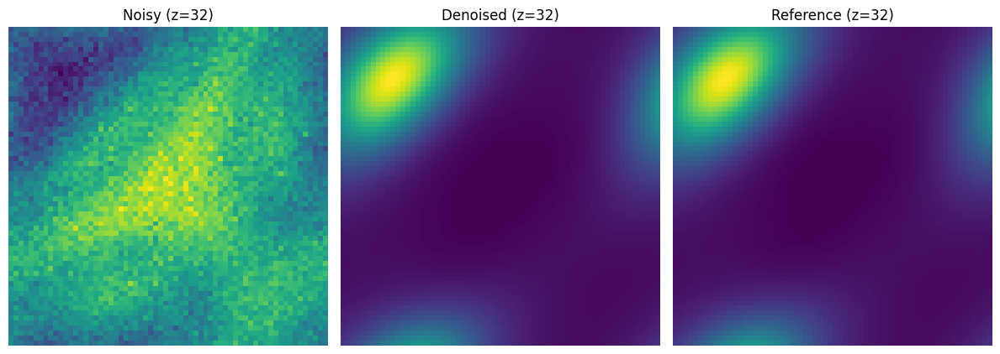


 Denoised matrix saved to /pscratch/sd/k/kberard/SCGSR/Data/diamond_1x1x1_bfd/density_data/vmc_J2/density_tot_vmc_mean_2642411520_scunet_ft_denoised.npy
Sample 2642411520 | scunet_ft JSD = 0.000074

>>> Evaluation Metrics 2D
2-norm (noisy vs ref):     0.0820
2-norm (denoised vs ref): 0.0005
JSD   (noisy vs ref):     1.549535
JSD   (denoised vs ref):  0.000074

>>> Evaluation Metrics 3D
2-norm (noisy vs ref):     0.0820
2-norm (denoised vs ref): 0.0005
JSD   (noisy vs ref):     1.549535
JSD   (denoised vs ref):  0.000074


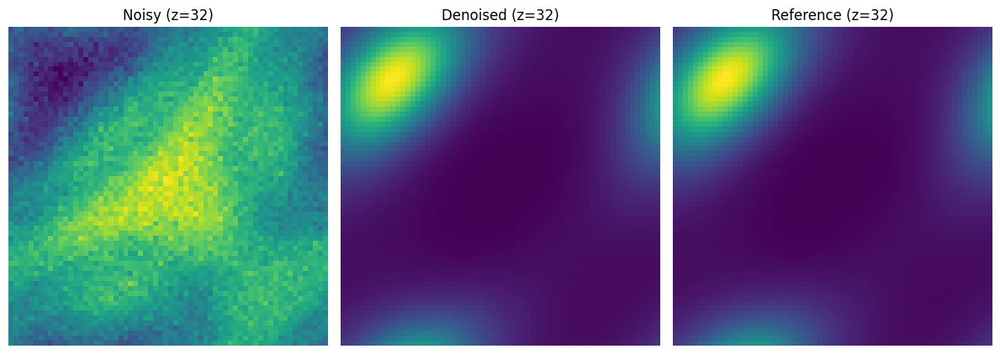


 Denoised matrix saved to /pscratch/sd/k/kberard/SCGSR/Data/diamond_1x1x1_bfd/density_data/vmc_J2/density_tot_vmc_mean_5284823040_scunet_ft_denoised.npy
Sample 5284823040 | scunet_ft JSD = 0.000074

=== Running model: nature ===


I0000 00:00:1772061282.391854  524843 service.cc:152] XLA service 0x7fdc08007140 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
I0000 00:00:1772061282.392635  524843 service.cc:160]   StreamExecutor device (0): NVIDIA A100-PCIE-40GB, Compute Capability 8.0
2026-02-25 15:14:42.483518: I tensorflow/compiler/mlir/tensorflow/utils/dump_mlir_util.cc:269] disabling MLIR crash reproducer, set env var `MLIR_CRASH_REPRODUCER_DIRECTORY` to enable.
I0000 00:00:1772061282.675327  524843 cuda_dnn.cc:529] Loaded cuDNN version 90300


2/2 ━━━━━━━━━━━━━━━━━━━━ 14s 62ms/step


I0000 00:00:1772061295.867576  524843 device_compiler.h:188] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


(64, 64, 64, 3) x_test_shape

>>> Evaluation Metrics 2D
2-norm (noisy vs ref):     5.2365
2-norm (denoised vs ref): 0.0006
JSD   (noisy vs ref):     52.063201
JSD   (denoised vs ref):  0.000107

>>> Evaluation Metrics 3D
2-norm (noisy vs ref):     5.2365
2-norm (denoised vs ref): 0.0006
JSD   (noisy vs ref):     52.063201
JSD   (denoised vs ref):  0.000107


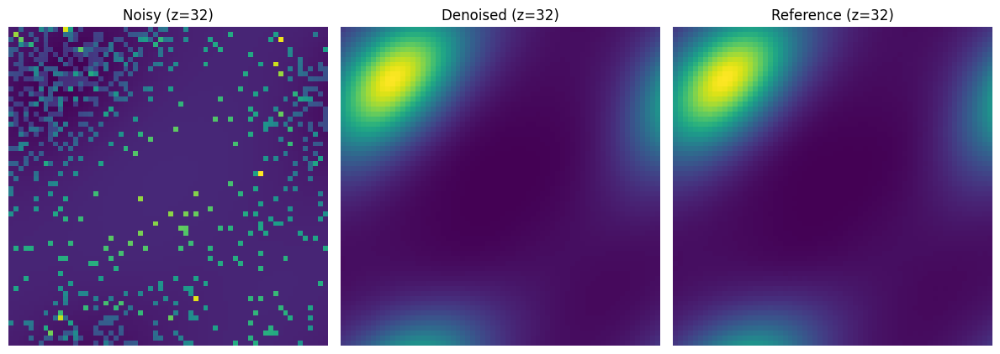


 Denoised matrix saved to /pscratch/sd/k/kberard/SCGSR/Data/diamond_1x1x1_bfd/density_data/vmc_J2/density_tot_vmc_mean_0000010240_nature_denoised.npy
Sample 10240 | nature JSD = 0.000107
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
(64, 64, 64, 3) x_test_shape

>>> Evaluation Metrics 2D
2-norm (noisy vs ref):     3.7153
2-norm (denoised vs ref): 0.0006
JSD   (noisy vs ref):     38.646104
JSD   (denoised vs ref):  0.000106

>>> Evaluation Metrics 3D
2-norm (noisy vs ref):     3.7153
2-norm (denoised vs ref): 0.0006
JSD   (noisy vs ref):     38.646104
JSD   (denoised vs ref):  0.000106


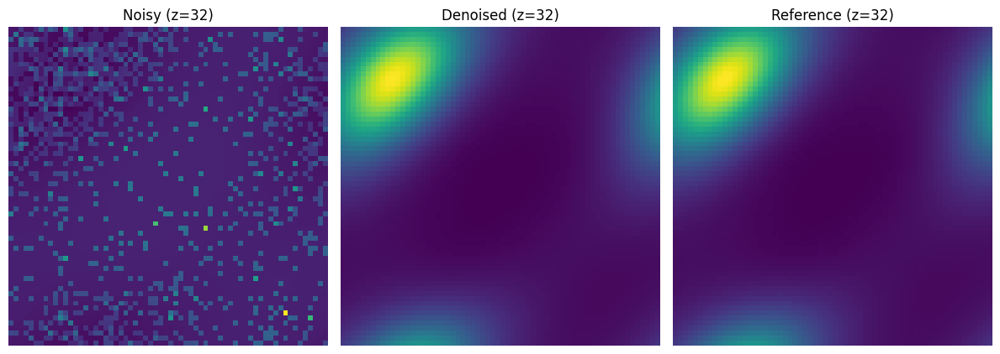


 Denoised matrix saved to /pscratch/sd/k/kberard/SCGSR/Data/diamond_1x1x1_bfd/density_data/vmc_J2/density_tot_vmc_mean_0000020480_nature_denoised.npy
Sample 20480 | nature JSD = 0.000106
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
(64, 64, 64, 3) x_test_shape

>>> Evaluation Metrics 2D
2-norm (noisy vs ref):     2.6176
2-norm (denoised vs ref): 0.0006
JSD   (noisy vs ref):     34.109040
JSD   (denoised vs ref):  0.000106

>>> Evaluation Metrics 3D
2-norm (noisy vs ref):     2.6176
2-norm (denoised vs ref): 0.0006
JSD   (noisy vs ref):     34.109040
JSD   (denoised vs ref):  0.000106


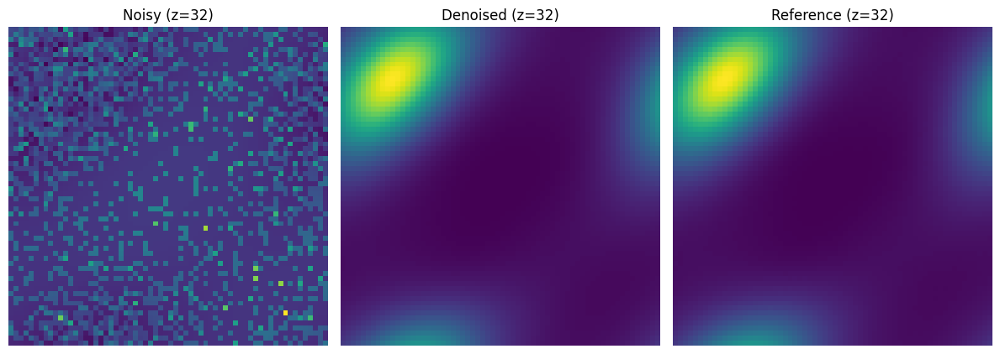


 Denoised matrix saved to /pscratch/sd/k/kberard/SCGSR/Data/diamond_1x1x1_bfd/density_data/vmc_J2/density_tot_vmc_mean_0000040960_nature_denoised.npy
Sample 40960 | nature JSD = 0.000106
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
(64, 64, 64, 3) x_test_shape

>>> Evaluation Metrics 2D
2-norm (noisy vs ref):     1.8514
2-norm (denoised vs ref): 0.0006
JSD   (noisy vs ref):     24.002402
JSD   (denoised vs ref):  0.000105

>>> Evaluation Metrics 3D
2-norm (noisy vs ref):     1.8514
2-norm (denoised vs ref): 0.0006
JSD   (noisy vs ref):     24.002402
JSD   (denoised vs ref):  0.000105


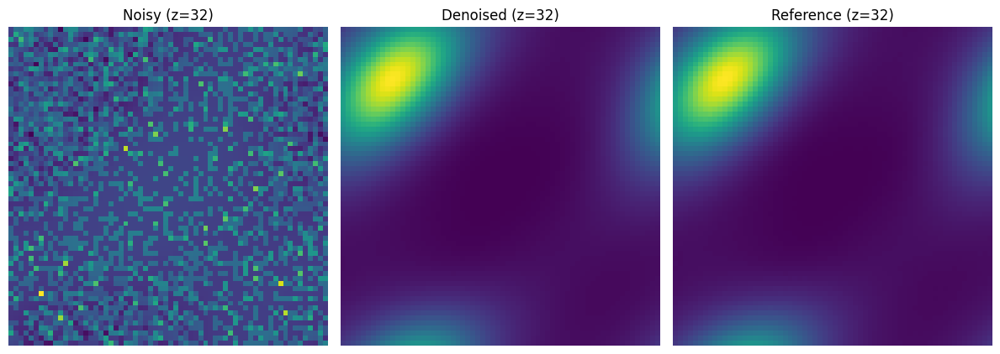


 Denoised matrix saved to /pscratch/sd/k/kberard/SCGSR/Data/diamond_1x1x1_bfd/density_data/vmc_J2/density_tot_vmc_mean_0000081920_nature_denoised.npy
Sample 81920 | nature JSD = 0.000105
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
(64, 64, 64, 3) x_test_shape

>>> Evaluation Metrics 2D
2-norm (noisy vs ref):     1.3096
2-norm (denoised vs ref): 0.0006
JSD   (noisy vs ref):     19.183826
JSD   (denoised vs ref):  0.000104

>>> Evaluation Metrics 3D
2-norm (noisy vs ref):     1.3096
2-norm (denoised vs ref): 0.0006
JSD   (noisy vs ref):     19.183826
JSD   (denoised vs ref):  0.000104


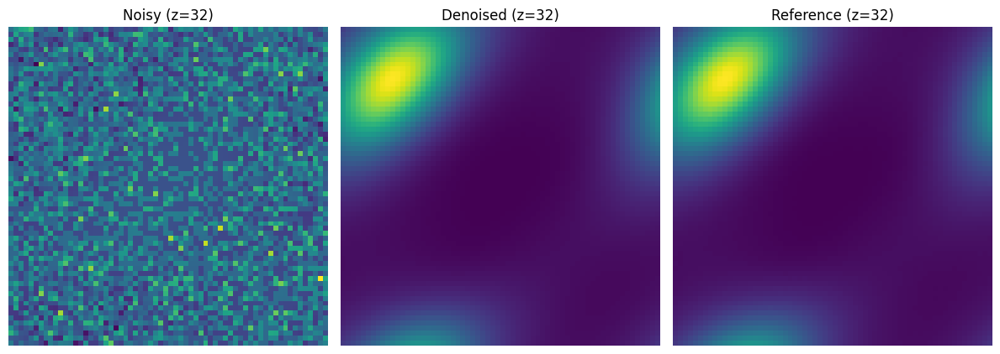


 Denoised matrix saved to /pscratch/sd/k/kberard/SCGSR/Data/diamond_1x1x1_bfd/density_data/vmc_J2/density_tot_vmc_mean_0000163840_nature_denoised.npy
Sample 163840 | nature JSD = 0.000104
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
(64, 64, 64, 3) x_test_shape

>>> Evaluation Metrics 2D
2-norm (noisy vs ref):     0.9276
2-norm (denoised vs ref): 0.0006
JSD   (noisy vs ref):     13.825756
JSD   (denoised vs ref):  0.000102

>>> Evaluation Metrics 3D
2-norm (noisy vs ref):     0.9276
2-norm (denoised vs ref): 0.0006
JSD   (noisy vs ref):     13.825756
JSD   (denoised vs ref):  0.000102


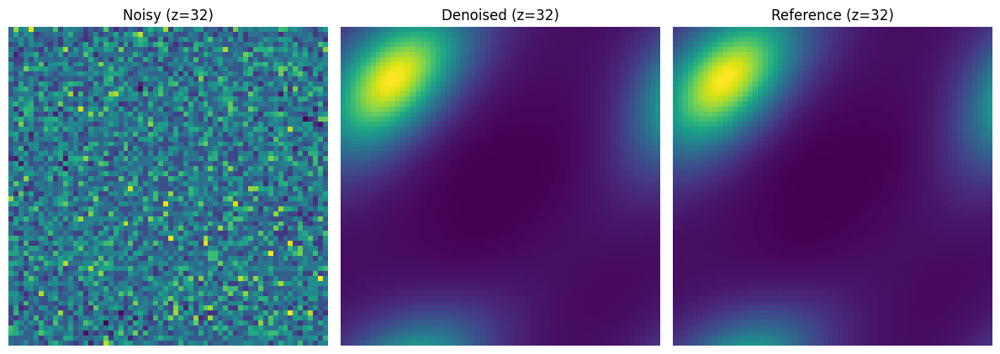


 Denoised matrix saved to /pscratch/sd/k/kberard/SCGSR/Data/diamond_1x1x1_bfd/density_data/vmc_J2/density_tot_vmc_mean_0000327680_nature_denoised.npy
Sample 327680 | nature JSD = 0.000102
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
(64, 64, 64, 3) x_test_shape

>>> Evaluation Metrics 2D
2-norm (noisy vs ref):     0.8108
2-norm (denoised vs ref): 0.0006
JSD   (noisy vs ref):     11.998552
JSD   (denoised vs ref):  0.000102

>>> Evaluation Metrics 3D
2-norm (noisy vs ref):     0.8108
2-norm (denoised vs ref): 0.0006
JSD   (noisy vs ref):     11.998552
JSD   (denoised vs ref):  0.000102


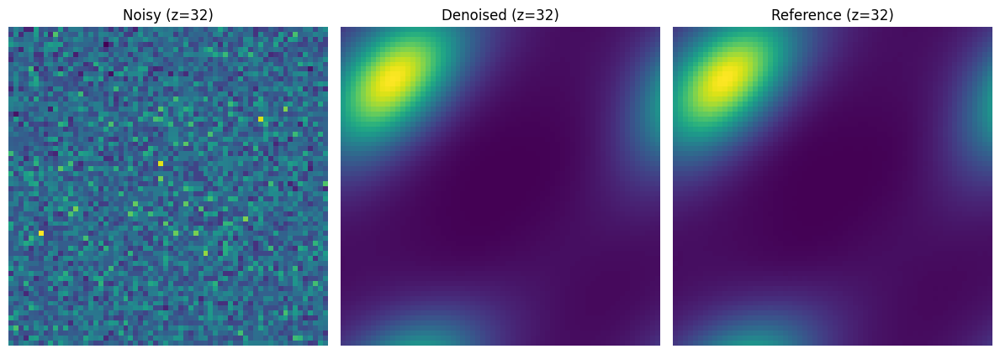


 Denoised matrix saved to /pscratch/sd/k/kberard/SCGSR/Data/diamond_1x1x1_bfd/density_data/vmc_J2/density_tot_vmc_mean_0000430080_nature_denoised.npy
Sample 430080 | nature JSD = 0.000102
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
(64, 64, 64, 3) x_test_shape

>>> Evaluation Metrics 2D
2-norm (noisy vs ref):     0.6583
2-norm (denoised vs ref): 0.0006
JSD   (noisy vs ref):     9.441314
JSD   (denoised vs ref):  0.000101

>>> Evaluation Metrics 3D
2-norm (noisy vs ref):     0.6583
2-norm (denoised vs ref): 0.0006
JSD   (noisy vs ref):     9.441314
JSD   (denoised vs ref):  0.000101


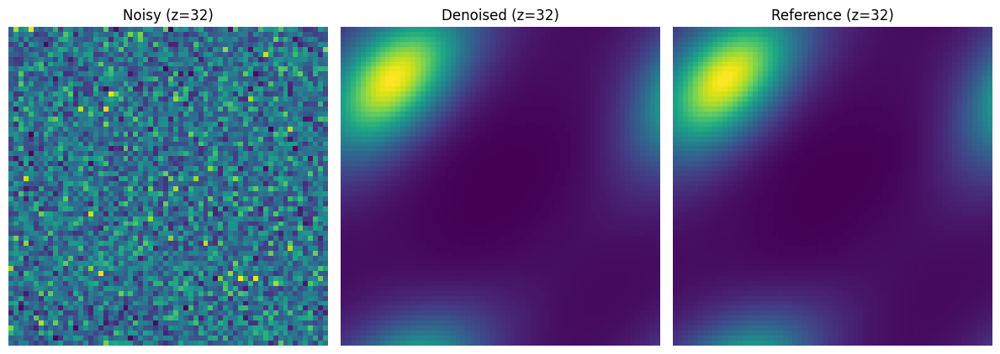


 Denoised matrix saved to /pscratch/sd/k/kberard/SCGSR/Data/diamond_1x1x1_bfd/density_data/vmc_J2/density_tot_vmc_mean_0000655360_nature_denoised.npy
Sample 655360 | nature JSD = 0.000101
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
(64, 64, 64, 3) x_test_shape

>>> Evaluation Metrics 2D
2-norm (noisy vs ref):     0.5753
2-norm (denoised vs ref): 0.0006
JSD   (noisy vs ref):     8.264836
JSD   (denoised vs ref):  0.000101

>>> Evaluation Metrics 3D
2-norm (noisy vs ref):     0.5753
2-norm (denoised vs ref): 0.0006
JSD   (noisy vs ref):     8.264836
JSD   (denoised vs ref):  0.000101


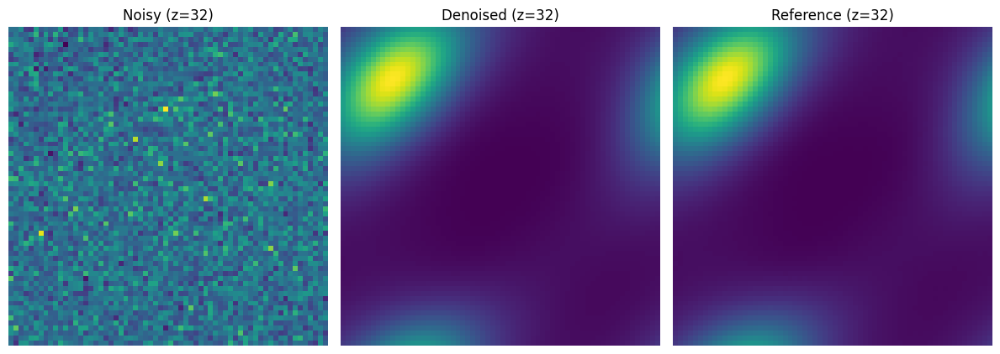


 Denoised matrix saved to /pscratch/sd/k/kberard/SCGSR/Data/diamond_1x1x1_bfd/density_data/vmc_J2/density_tot_vmc_mean_0000860160_nature_denoised.npy
Sample 860160 | nature JSD = 0.000101
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
(64, 64, 64, 3) x_test_shape

>>> Evaluation Metrics 2D
2-norm (noisy vs ref):     0.4693
2-norm (denoised vs ref): 0.0006
JSD   (noisy vs ref):     6.710627
JSD   (denoised vs ref):  0.000100

>>> Evaluation Metrics 3D
2-norm (noisy vs ref):     0.4693
2-norm (denoised vs ref): 0.0006
JSD   (noisy vs ref):     6.710627
JSD   (denoised vs ref):  0.000100


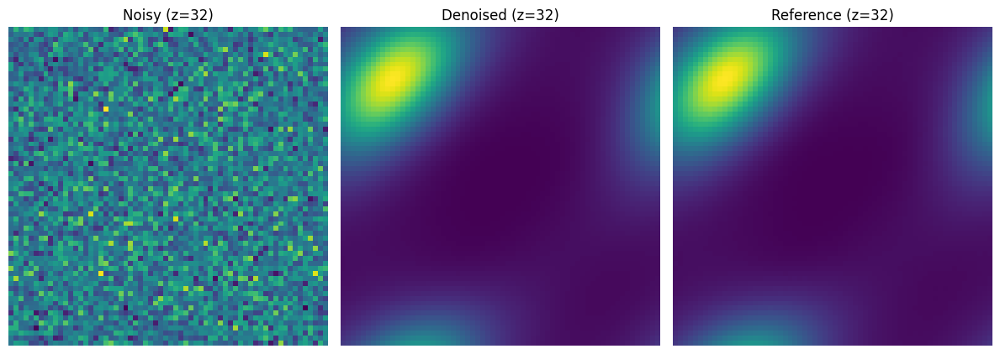


 Denoised matrix saved to /pscratch/sd/k/kberard/SCGSR/Data/diamond_1x1x1_bfd/density_data/vmc_J2/density_tot_vmc_mean_0001310720_nature_denoised.npy
Sample 1310720 | nature JSD = 0.000100
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step
(64, 64, 64, 3) x_test_shape

>>> Evaluation Metrics 2D
2-norm (noisy vs ref):     0.4100
2-norm (denoised vs ref): 0.0006
JSD   (noisy vs ref):     5.773285
JSD   (denoised vs ref):  0.000099

>>> Evaluation Metrics 3D
2-norm (noisy vs ref):     0.4100
2-norm (denoised vs ref): 0.0006
JSD   (noisy vs ref):     5.773285
JSD   (denoised vs ref):  0.000099


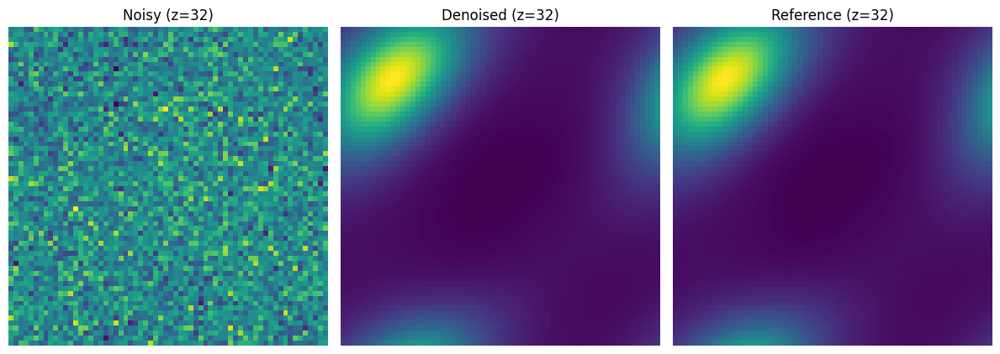


 Denoised matrix saved to /pscratch/sd/k/kberard/SCGSR/Data/diamond_1x1x1_bfd/density_data/vmc_J2/density_tot_vmc_mean_0001720320_nature_denoised.npy
Sample 1720320 | nature JSD = 0.000099
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
(64, 64, 64, 3) x_test_shape

>>> Evaluation Metrics 2D
2-norm (noisy vs ref):     0.3366
2-norm (denoised vs ref): 0.0006
JSD   (noisy vs ref):     4.829274
JSD   (denoised vs ref):  0.000098

>>> Evaluation Metrics 3D
2-norm (noisy vs ref):     0.3366
2-norm (denoised vs ref): 0.0006
JSD   (noisy vs ref):     4.829274
JSD   (denoised vs ref):  0.000098


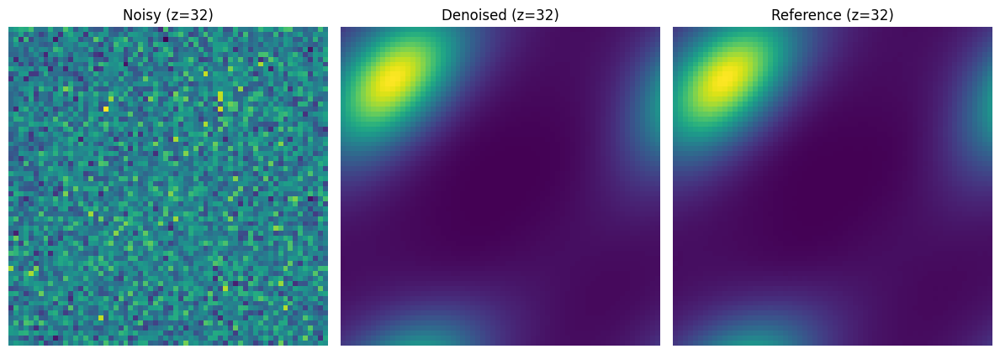


 Denoised matrix saved to /pscratch/sd/k/kberard/SCGSR/Data/diamond_1x1x1_bfd/density_data/vmc_J2/density_tot_vmc_mean_0002621440_nature_denoised.npy
Sample 2621440 | nature JSD = 0.000098
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
(64, 64, 64, 3) x_test_shape

>>> Evaluation Metrics 2D
2-norm (noisy vs ref):     0.2957
2-norm (denoised vs ref): 0.0006
JSD   (noisy vs ref):     4.214717
JSD   (denoised vs ref):  0.000097

>>> Evaluation Metrics 3D
2-norm (noisy vs ref):     0.2957
2-norm (denoised vs ref): 0.0006
JSD   (noisy vs ref):     4.214717
JSD   (denoised vs ref):  0.000097


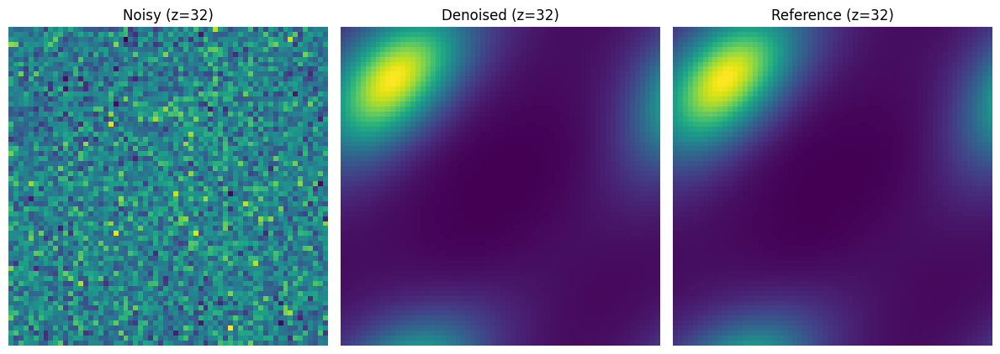


 Denoised matrix saved to /pscratch/sd/k/kberard/SCGSR/Data/diamond_1x1x1_bfd/density_data/vmc_J2/density_tot_vmc_mean_0003440640_nature_denoised.npy
Sample 3440640 | nature JSD = 0.000097
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step
(64, 64, 64, 3) x_test_shape

>>> Evaluation Metrics 2D
2-norm (noisy vs ref):     0.2466
2-norm (denoised vs ref): 0.0006
JSD   (noisy vs ref):     3.612919
JSD   (denoised vs ref):  0.000097

>>> Evaluation Metrics 3D
2-norm (noisy vs ref):     0.2466
2-norm (denoised vs ref): 0.0006
JSD   (noisy vs ref):     3.612919
JSD   (denoised vs ref):  0.000097


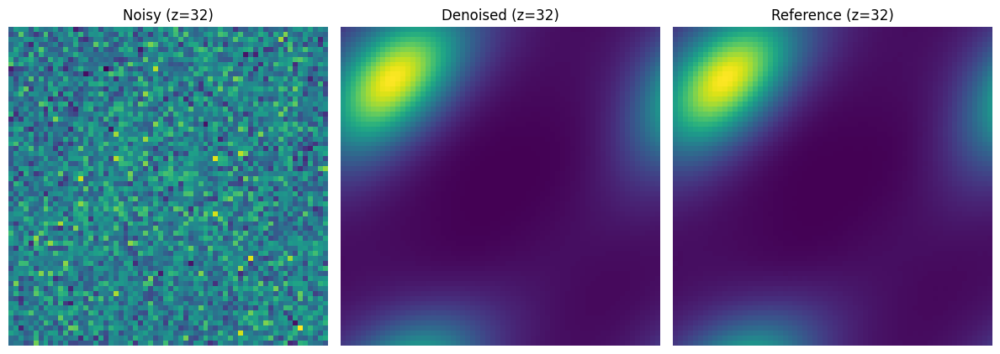


 Denoised matrix saved to /pscratch/sd/k/kberard/SCGSR/Data/diamond_1x1x1_bfd/density_data/vmc_J2/density_tot_vmc_mean_0005160960_nature_denoised.npy
Sample 5160960 | nature JSD = 0.000097
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step
(64, 64, 64, 3) x_test_shape

>>> Evaluation Metrics 2D
2-norm (noisy vs ref):     0.2450
2-norm (denoised vs ref): 0.0006
JSD   (noisy vs ref):     3.572269
JSD   (denoised vs ref):  0.000096

>>> Evaluation Metrics 3D
2-norm (noisy vs ref):     0.2450
2-norm (denoised vs ref): 0.0006
JSD   (noisy vs ref):     3.572269
JSD   (denoised vs ref):  0.000096


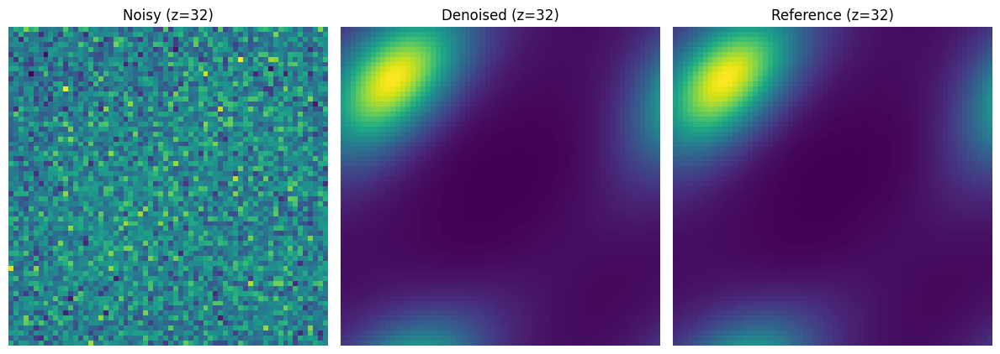


 Denoised matrix saved to /pscratch/sd/k/kberard/SCGSR/Data/diamond_1x1x1_bfd/density_data/vmc_J2/density_tot_vmc_mean_0005242880_nature_denoised.npy
Sample 5242880 | nature JSD = 0.000096
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
(64, 64, 64, 3) x_test_shape

>>> Evaluation Metrics 2D
2-norm (noisy vs ref):     0.2177
2-norm (denoised vs ref): 0.0006
JSD   (noisy vs ref):     3.210400
JSD   (denoised vs ref):  0.000096

>>> Evaluation Metrics 3D
2-norm (noisy vs ref):     0.2177
2-norm (denoised vs ref): 0.0006
JSD   (noisy vs ref):     3.210400
JSD   (denoised vs ref):  0.000096


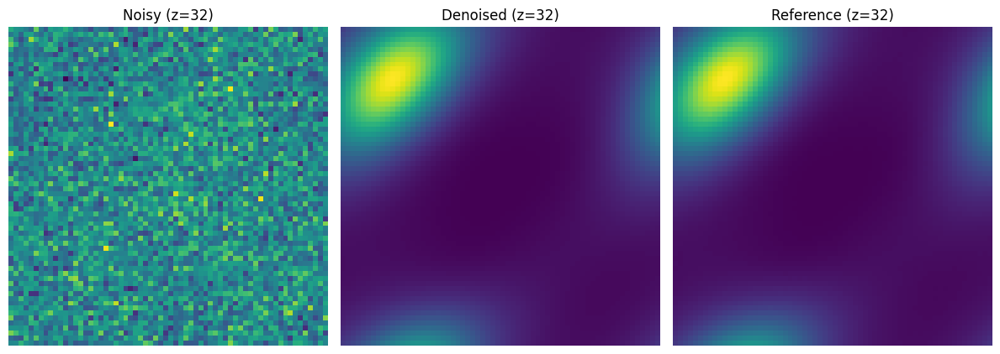


 Denoised matrix saved to /pscratch/sd/k/kberard/SCGSR/Data/diamond_1x1x1_bfd/density_data/vmc_J2/density_tot_vmc_mean_0006881280_nature_denoised.npy
Sample 6881280 | nature JSD = 0.000096
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
(64, 64, 64, 3) x_test_shape

>>> Evaluation Metrics 2D
2-norm (noisy vs ref):     0.1835
2-norm (denoised vs ref): 0.0006
JSD   (noisy vs ref):     2.825540
JSD   (denoised vs ref):  0.000094

>>> Evaluation Metrics 3D
2-norm (noisy vs ref):     0.1835
2-norm (denoised vs ref): 0.0006
JSD   (noisy vs ref):     2.825540
JSD   (denoised vs ref):  0.000094


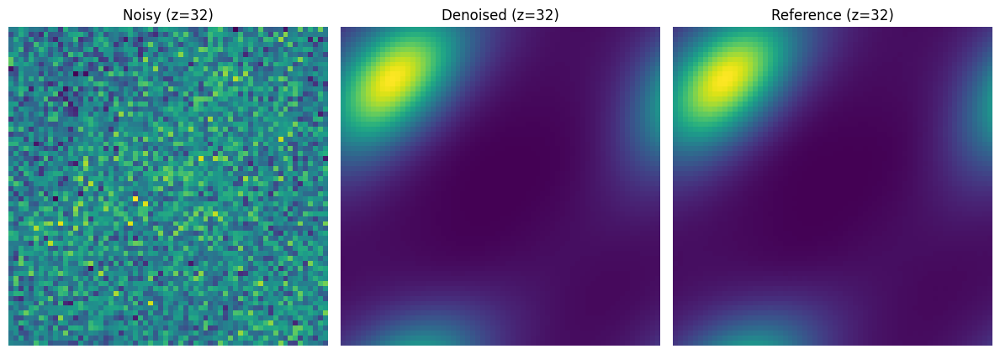


 Denoised matrix saved to /pscratch/sd/k/kberard/SCGSR/Data/diamond_1x1x1_bfd/density_data/vmc_J2/density_tot_vmc_mean_0010321920_nature_denoised.npy
Sample 10321920 | nature JSD = 0.000094
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step
(64, 64, 64, 3) x_test_shape

>>> Evaluation Metrics 2D
2-norm (noisy vs ref):     0.1826
2-norm (denoised vs ref): 0.0006
JSD   (noisy vs ref):     2.823653
JSD   (denoised vs ref):  0.000094

>>> Evaluation Metrics 3D
2-norm (noisy vs ref):     0.1826
2-norm (denoised vs ref): 0.0006
JSD   (noisy vs ref):     2.823653
JSD   (denoised vs ref):  0.000094


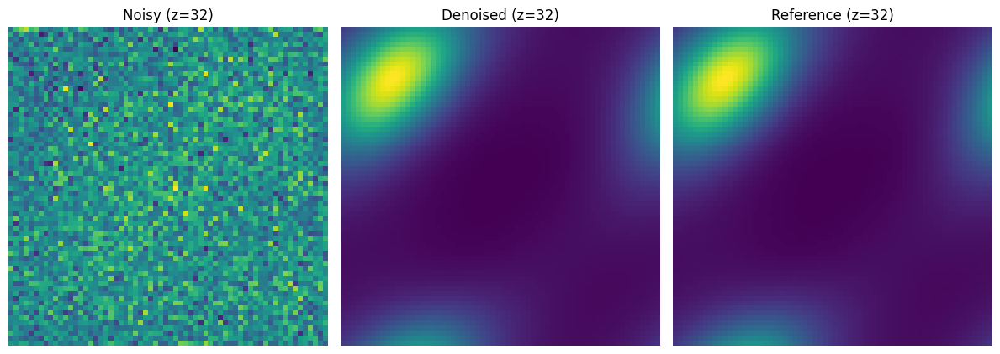


 Denoised matrix saved to /pscratch/sd/k/kberard/SCGSR/Data/diamond_1x1x1_bfd/density_data/vmc_J2/density_tot_vmc_mean_0010485760_nature_denoised.npy
Sample 10485760 | nature JSD = 0.000094
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
(64, 64, 64, 3) x_test_shape

>>> Evaluation Metrics 2D
2-norm (noisy vs ref):     0.1643
2-norm (denoised vs ref): 0.0006
JSD   (noisy vs ref):     2.590050
JSD   (denoised vs ref):  0.000093

>>> Evaluation Metrics 3D
2-norm (noisy vs ref):     0.1643
2-norm (denoised vs ref): 0.0006
JSD   (noisy vs ref):     2.590050
JSD   (denoised vs ref):  0.000093


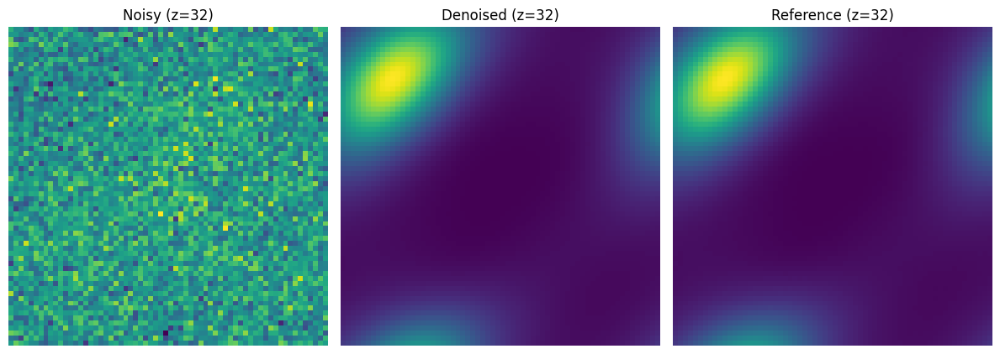


 Denoised matrix saved to /pscratch/sd/k/kberard/SCGSR/Data/diamond_1x1x1_bfd/density_data/vmc_J2/density_tot_vmc_mean_0013762560_nature_denoised.npy
Sample 13762560 | nature JSD = 0.000093
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step
(64, 64, 64, 3) x_test_shape

>>> Evaluation Metrics 2D
2-norm (noisy vs ref):     0.1421
2-norm (denoised vs ref): 0.0006
JSD   (noisy vs ref):     2.342830
JSD   (denoised vs ref):  0.000092

>>> Evaluation Metrics 3D
2-norm (noisy vs ref):     0.1421
2-norm (denoised vs ref): 0.0006
JSD   (noisy vs ref):     2.342830
JSD   (denoised vs ref):  0.000092


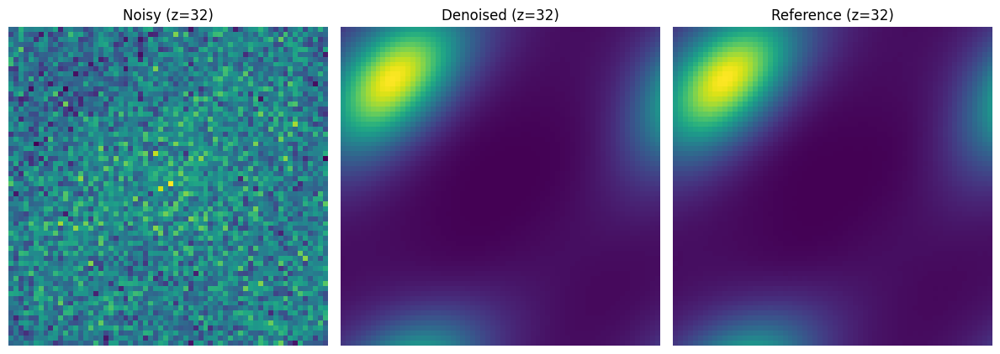


 Denoised matrix saved to /pscratch/sd/k/kberard/SCGSR/Data/diamond_1x1x1_bfd/density_data/vmc_J2/density_tot_vmc_mean_0020643840_nature_denoised.npy
Sample 20643840 | nature JSD = 0.000092
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
(64, 64, 64, 3) x_test_shape

>>> Evaluation Metrics 2D
2-norm (noisy vs ref):     0.1298
2-norm (denoised vs ref): 0.0006
JSD   (noisy vs ref):     2.207554
JSD   (denoised vs ref):  0.000091

>>> Evaluation Metrics 3D
2-norm (noisy vs ref):     0.1298
2-norm (denoised vs ref): 0.0006
JSD   (noisy vs ref):     2.207554
JSD   (denoised vs ref):  0.000091


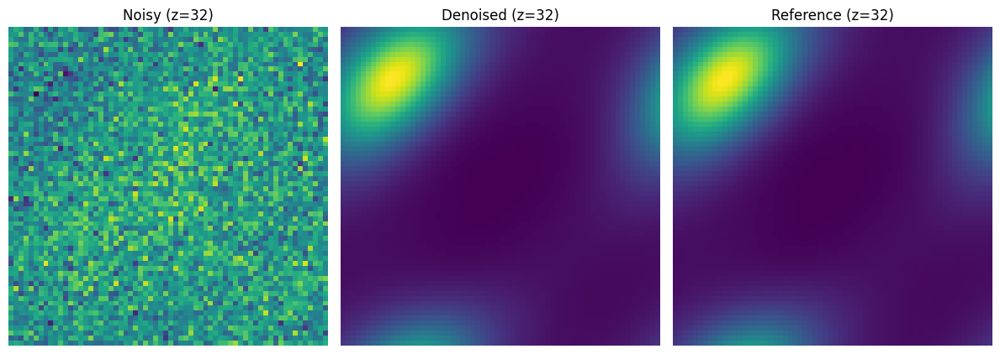


 Denoised matrix saved to /pscratch/sd/k/kberard/SCGSR/Data/diamond_1x1x1_bfd/density_data/vmc_J2/density_tot_vmc_mean_0027525120_nature_denoised.npy
Sample 27525120 | nature JSD = 0.000091
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
(64, 64, 64, 3) x_test_shape

>>> Evaluation Metrics 2D
2-norm (noisy vs ref):     0.1159
2-norm (denoised vs ref): 0.0006
JSD   (noisy vs ref):     2.052071
JSD   (denoised vs ref):  0.000090

>>> Evaluation Metrics 3D
2-norm (noisy vs ref):     0.1159
2-norm (denoised vs ref): 0.0006
JSD   (noisy vs ref):     2.052071
JSD   (denoised vs ref):  0.000090


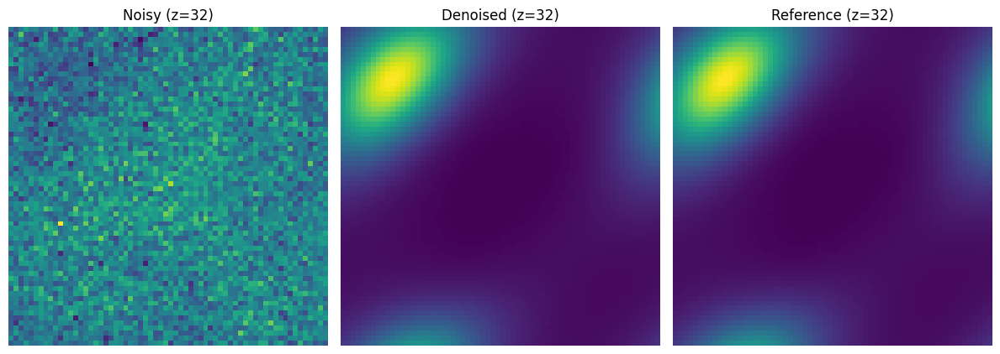


 Denoised matrix saved to /pscratch/sd/k/kberard/SCGSR/Data/diamond_1x1x1_bfd/density_data/vmc_J2/density_tot_vmc_mean_0041287680_nature_denoised.npy
Sample 41287680 | nature JSD = 0.000090
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
(64, 64, 64, 3) x_test_shape

>>> Evaluation Metrics 2D
2-norm (noisy vs ref):     0.1086
2-norm (denoised vs ref): 0.0006
JSD   (noisy vs ref):     1.961343
JSD   (denoised vs ref):  0.000089

>>> Evaluation Metrics 3D
2-norm (noisy vs ref):     0.1086
2-norm (denoised vs ref): 0.0006
JSD   (noisy vs ref):     1.961343
JSD   (denoised vs ref):  0.000089


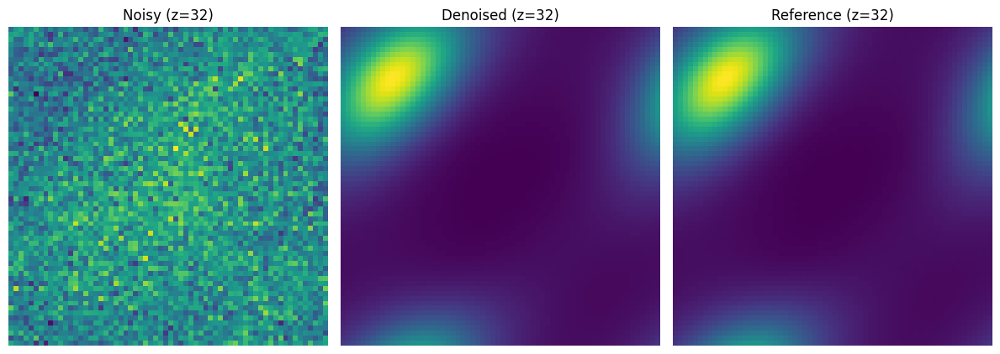


 Denoised matrix saved to /pscratch/sd/k/kberard/SCGSR/Data/diamond_1x1x1_bfd/density_data/vmc_J2/density_tot_vmc_mean_0055050240_nature_denoised.npy
Sample 55050240 | nature JSD = 0.000089
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
(64, 64, 64, 3) x_test_shape

>>> Evaluation Metrics 2D
2-norm (noisy vs ref):     0.1004
2-norm (denoised vs ref): 0.0006
JSD   (noisy vs ref):     1.854723
JSD   (denoised vs ref):  0.000088

>>> Evaluation Metrics 3D
2-norm (noisy vs ref):     0.1004
2-norm (denoised vs ref): 0.0006
JSD   (noisy vs ref):     1.854723
JSD   (denoised vs ref):  0.000088


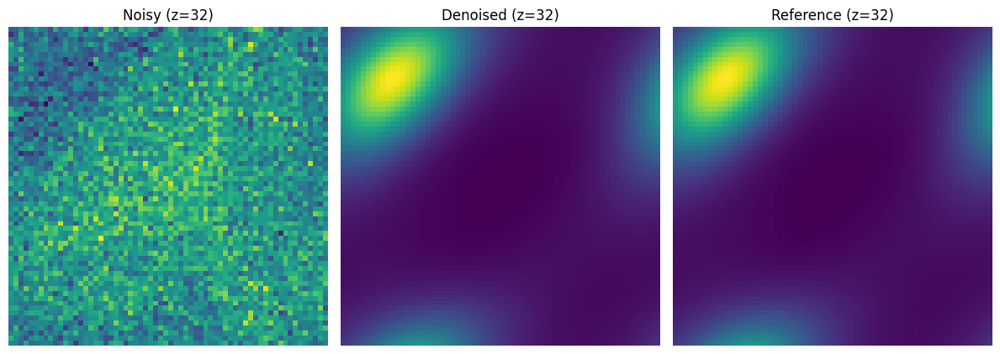


 Denoised matrix saved to /pscratch/sd/k/kberard/SCGSR/Data/diamond_1x1x1_bfd/density_data/vmc_J2/density_tot_vmc_mean_0082575360_nature_denoised.npy
Sample 82575360 | nature JSD = 0.000088
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
(64, 64, 64, 3) x_test_shape

>>> Evaluation Metrics 2D
2-norm (noisy vs ref):     0.0961
2-norm (denoised vs ref): 0.0005
JSD   (noisy vs ref):     1.797909
JSD   (denoised vs ref):  0.000087

>>> Evaluation Metrics 3D
2-norm (noisy vs ref):     0.0961
2-norm (denoised vs ref): 0.0005
JSD   (noisy vs ref):     1.797909
JSD   (denoised vs ref):  0.000087


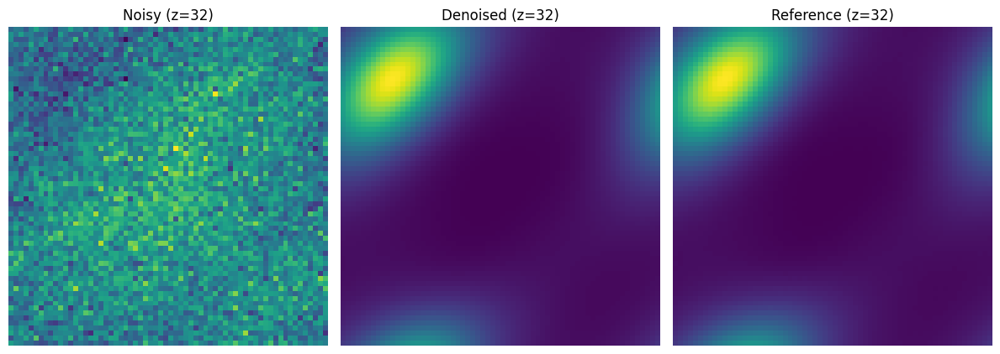


 Denoised matrix saved to /pscratch/sd/k/kberard/SCGSR/Data/diamond_1x1x1_bfd/density_data/vmc_J2/density_tot_vmc_mean_0110100480_nature_denoised.npy
Sample 110100480 | nature JSD = 0.000087
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
(64, 64, 64, 3) x_test_shape

>>> Evaluation Metrics 2D
2-norm (noisy vs ref):     0.0914
2-norm (denoised vs ref): 0.0005
JSD   (noisy vs ref):     1.720404
JSD   (denoised vs ref):  0.000086

>>> Evaluation Metrics 3D
2-norm (noisy vs ref):     0.0914
2-norm (denoised vs ref): 0.0005
JSD   (noisy vs ref):     1.720404
JSD   (denoised vs ref):  0.000086


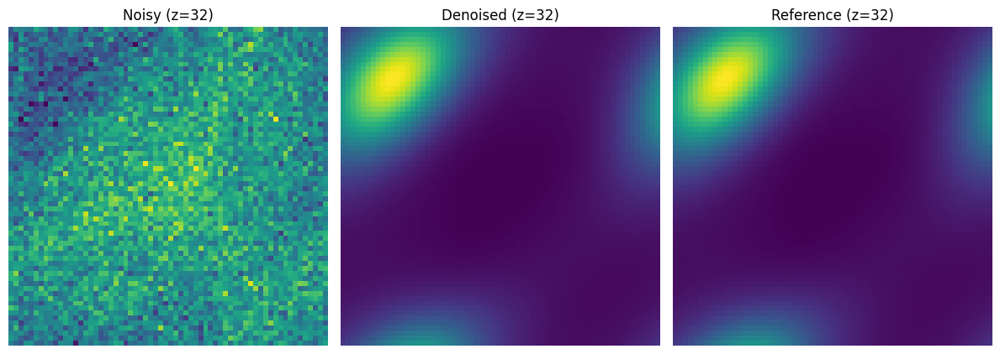


 Denoised matrix saved to /pscratch/sd/k/kberard/SCGSR/Data/diamond_1x1x1_bfd/density_data/vmc_J2/density_tot_vmc_mean_0165150720_nature_denoised.npy
Sample 165150720 | nature JSD = 0.000086
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
(64, 64, 64, 3) x_test_shape

>>> Evaluation Metrics 2D
2-norm (noisy vs ref):     0.0891
2-norm (denoised vs ref): 0.0005
JSD   (noisy vs ref):     1.684438
JSD   (denoised vs ref):  0.000085

>>> Evaluation Metrics 3D
2-norm (noisy vs ref):     0.0891
2-norm (denoised vs ref): 0.0005
JSD   (noisy vs ref):     1.684438
JSD   (denoised vs ref):  0.000085


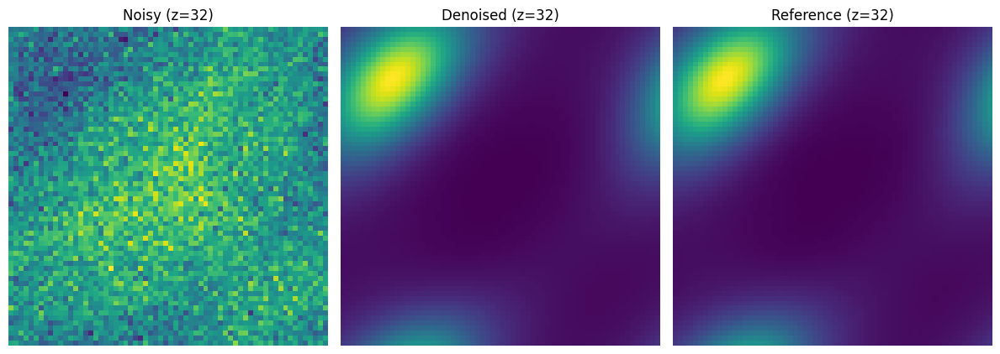


 Denoised matrix saved to /pscratch/sd/k/kberard/SCGSR/Data/diamond_1x1x1_bfd/density_data/vmc_J2/density_tot_vmc_mean_0220200960_nature_denoised.npy
Sample 220200960 | nature JSD = 0.000085
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
(64, 64, 64, 3) x_test_shape

>>> Evaluation Metrics 2D
2-norm (noisy vs ref):     0.0867
2-norm (denoised vs ref): 0.0005
JSD   (noisy vs ref):     1.640221
JSD   (denoised vs ref):  0.000084

>>> Evaluation Metrics 3D
2-norm (noisy vs ref):     0.0867
2-norm (denoised vs ref): 0.0005
JSD   (noisy vs ref):     1.640221
JSD   (denoised vs ref):  0.000084


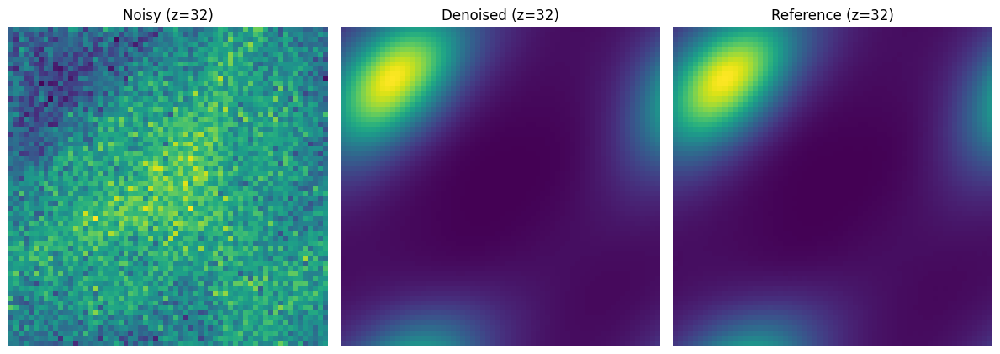


 Denoised matrix saved to /pscratch/sd/k/kberard/SCGSR/Data/diamond_1x1x1_bfd/density_data/vmc_J2/density_tot_vmc_mean_0330301440_nature_denoised.npy
Sample 330301440 | nature JSD = 0.000084
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step 
(64, 64, 64, 3) x_test_shape

>>> Evaluation Metrics 2D
2-norm (noisy vs ref):     0.0855
2-norm (denoised vs ref): 0.0005
JSD   (noisy vs ref):     1.616228
JSD   (denoised vs ref):  0.000084

>>> Evaluation Metrics 3D
2-norm (noisy vs ref):     0.0855
2-norm (denoised vs ref): 0.0005
JSD   (noisy vs ref):     1.616228
JSD   (denoised vs ref):  0.000084


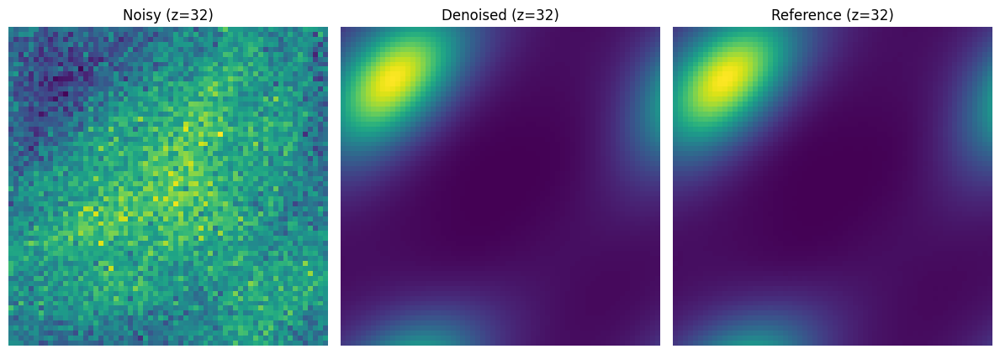


 Denoised matrix saved to /pscratch/sd/k/kberard/SCGSR/Data/diamond_1x1x1_bfd/density_data/vmc_J2/density_tot_vmc_mean_0440401920_nature_denoised.npy
Sample 440401920 | nature JSD = 0.000084
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 90ms/step
(64, 64, 64, 3) x_test_shape

>>> Evaluation Metrics 2D
2-norm (noisy vs ref):     0.0843
2-norm (denoised vs ref): 0.0005
JSD   (noisy vs ref):     1.591536
JSD   (denoised vs ref):  0.000083

>>> Evaluation Metrics 3D
2-norm (noisy vs ref):     0.0843
2-norm (denoised vs ref): 0.0005
JSD   (noisy vs ref):     1.591536
JSD   (denoised vs ref):  0.000083


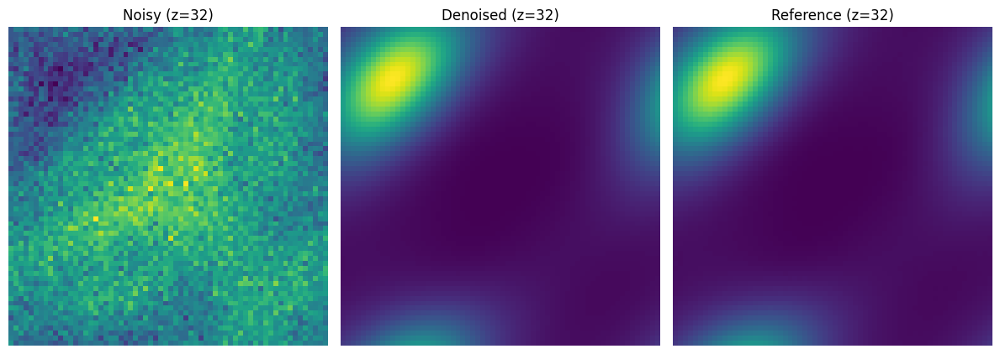


 Denoised matrix saved to /pscratch/sd/k/kberard/SCGSR/Data/diamond_1x1x1_bfd/density_data/vmc_J2/density_tot_vmc_mean_0660602880_nature_denoised.npy
Sample 660602880 | nature JSD = 0.000083
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
(64, 64, 64, 3) x_test_shape

>>> Evaluation Metrics 2D
2-norm (noisy vs ref):     0.0830
2-norm (denoised vs ref): 0.0005
JSD   (noisy vs ref):     1.564715
JSD   (denoised vs ref):  0.000082

>>> Evaluation Metrics 3D
2-norm (noisy vs ref):     0.0830
2-norm (denoised vs ref): 0.0005
JSD   (noisy vs ref):     1.564715
JSD   (denoised vs ref):  0.000082


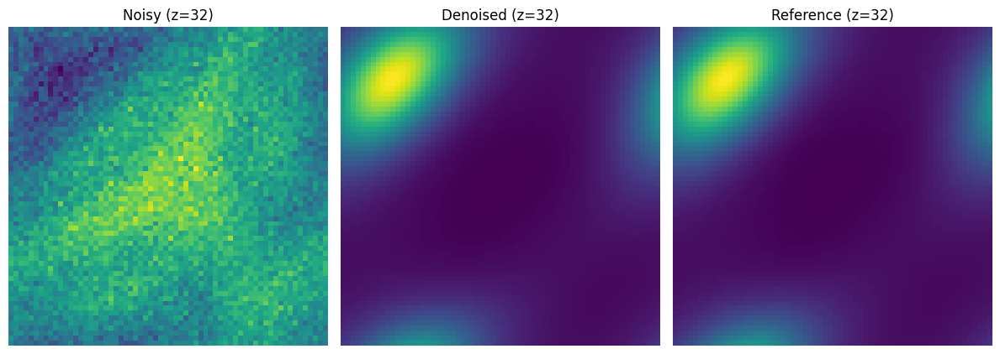


 Denoised matrix saved to /pscratch/sd/k/kberard/SCGSR/Data/diamond_1x1x1_bfd/density_data/vmc_J2/density_tot_vmc_mean_1321205760_nature_denoised.npy
Sample 1321205760 | nature JSD = 0.000082
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
(64, 64, 64, 3) x_test_shape

>>> Evaluation Metrics 2D
2-norm (noisy vs ref):     0.0824
2-norm (denoised vs ref): 0.0005
JSD   (noisy vs ref):     1.554853
JSD   (denoised vs ref):  0.000082

>>> Evaluation Metrics 3D
2-norm (noisy vs ref):     0.0824
2-norm (denoised vs ref): 0.0005
JSD   (noisy vs ref):     1.554853
JSD   (denoised vs ref):  0.000082


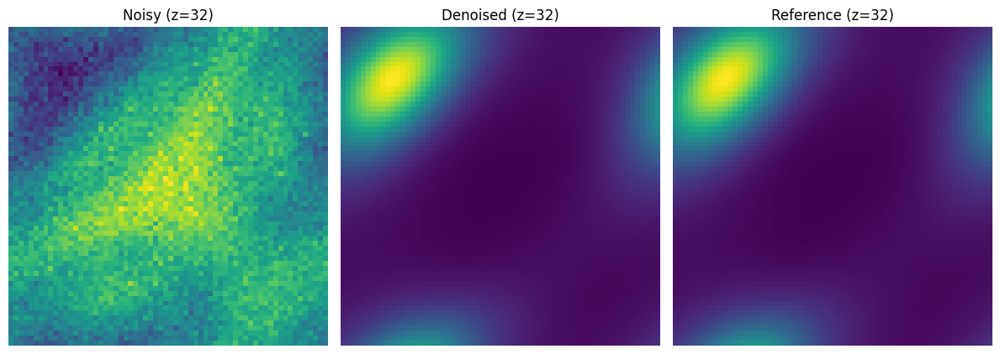


 Denoised matrix saved to /pscratch/sd/k/kberard/SCGSR/Data/diamond_1x1x1_bfd/density_data/vmc_J2/density_tot_vmc_mean_2642411520_nature_denoised.npy
Sample 2642411520 | nature JSD = 0.000082
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
(64, 64, 64, 3) x_test_shape

>>> Evaluation Metrics 2D
2-norm (noisy vs ref):     0.0820
2-norm (denoised vs ref): 0.0005
JSD   (noisy vs ref):     1.549535
JSD   (denoised vs ref):  0.000082

>>> Evaluation Metrics 3D
2-norm (noisy vs ref):     0.0820
2-norm (denoised vs ref): 0.0005
JSD   (noisy vs ref):     1.549535
JSD   (denoised vs ref):  0.000082


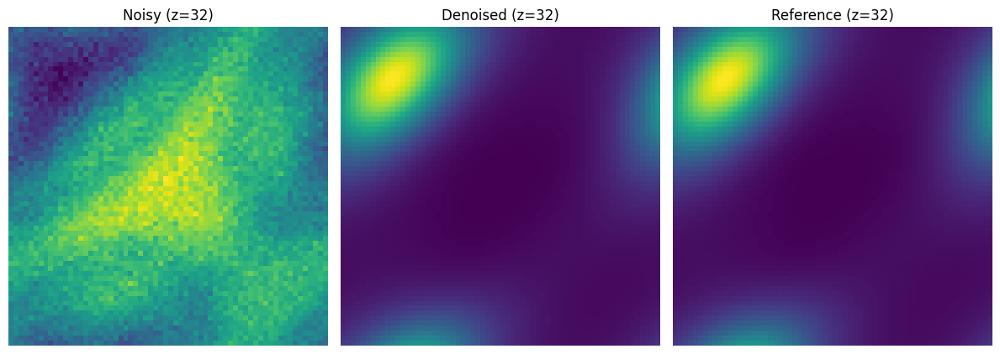


 Denoised matrix saved to /pscratch/sd/k/kberard/SCGSR/Data/diamond_1x1x1_bfd/density_data/vmc_J2/density_tot_vmc_mean_5284823040_nature_denoised.npy
Sample 5284823040 | nature JSD = 0.000082

=== Running model: CAE ===
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step

>>> Evaluation Metrics 2D
2-norm (noisy vs ref):     5.2365
2-norm (denoised vs ref): 0.0006
JSD   (noisy vs ref):     52.063201
JSD   (denoised vs ref):  0.000107

>>> Evaluation Metrics 3D
2-norm (noisy vs ref):     5.2365
2-norm (denoised vs ref): 0.0006
JSD   (noisy vs ref):     52.063201
JSD   (denoised vs ref):  0.000107


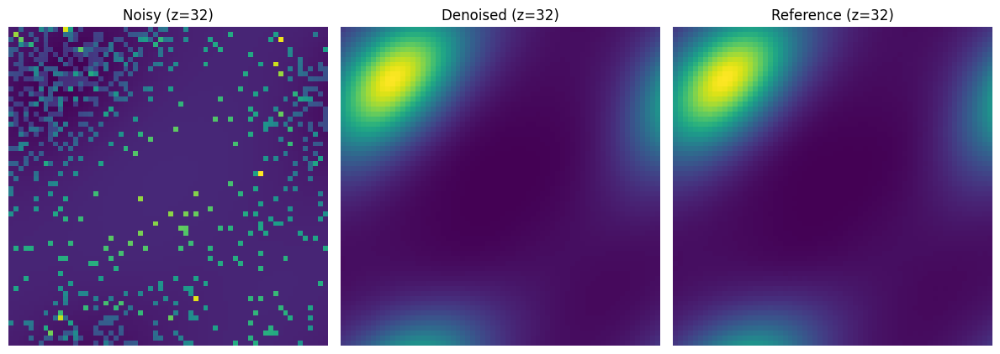


 Denoised matrix saved to /pscratch/sd/k/kberard/SCGSR/Data/diamond_1x1x1_bfd/density_data/vmc_J2/density_tot_vmc_mean_0000010240_CAE_denoised.npy
Sample 10240 | CAE JSD = 0.000107
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step

>>> Evaluation Metrics 2D
2-norm (noisy vs ref):     3.7153
2-norm (denoised vs ref): 0.0006
JSD   (noisy vs ref):     38.646104
JSD   (denoised vs ref):  0.000106

>>> Evaluation Metrics 3D
2-norm (noisy vs ref):     3.7153
2-norm (denoised vs ref): 0.0006
JSD   (noisy vs ref):     38.646104
JSD   (denoised vs ref):  0.000106


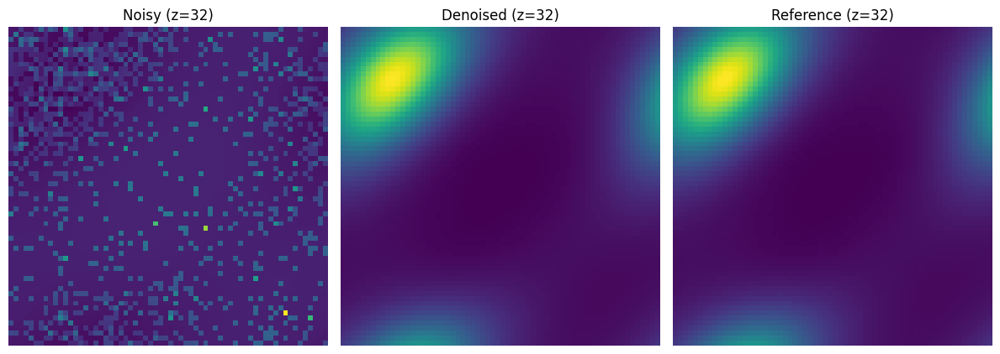


 Denoised matrix saved to /pscratch/sd/k/kberard/SCGSR/Data/diamond_1x1x1_bfd/density_data/vmc_J2/density_tot_vmc_mean_0000020480_CAE_denoised.npy
Sample 20480 | CAE JSD = 0.000106
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step

>>> Evaluation Metrics 2D
2-norm (noisy vs ref):     2.6176
2-norm (denoised vs ref): 0.0006
JSD   (noisy vs ref):     34.109040
JSD   (denoised vs ref):  0.000106

>>> Evaluation Metrics 3D
2-norm (noisy vs ref):     2.6176
2-norm (denoised vs ref): 0.0006
JSD   (noisy vs ref):     34.109040
JSD   (denoised vs ref):  0.000106


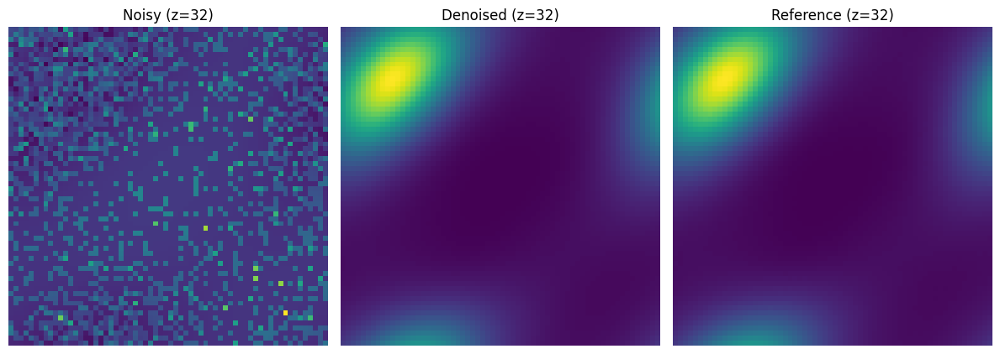


 Denoised matrix saved to /pscratch/sd/k/kberard/SCGSR/Data/diamond_1x1x1_bfd/density_data/vmc_J2/density_tot_vmc_mean_0000040960_CAE_denoised.npy
Sample 40960 | CAE JSD = 0.000106
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step

>>> Evaluation Metrics 2D
2-norm (noisy vs ref):     1.8514
2-norm (denoised vs ref): 0.0006
JSD   (noisy vs ref):     24.002402
JSD   (denoised vs ref):  0.000105

>>> Evaluation Metrics 3D
2-norm (noisy vs ref):     1.8514
2-norm (denoised vs ref): 0.0006
JSD   (noisy vs ref):     24.002402
JSD   (denoised vs ref):  0.000105


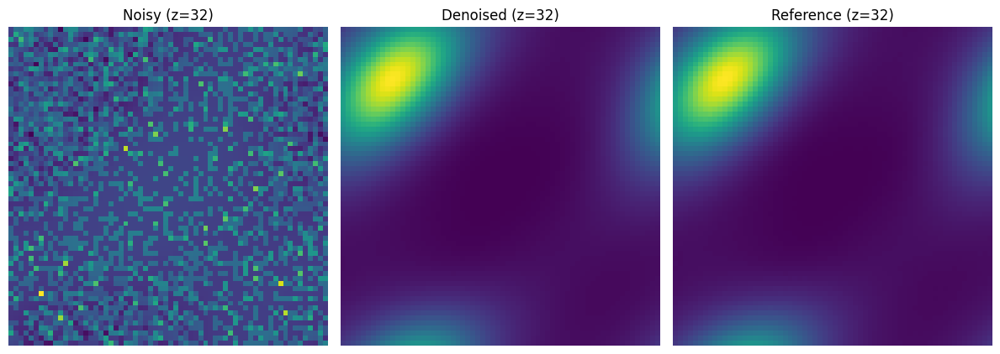


 Denoised matrix saved to /pscratch/sd/k/kberard/SCGSR/Data/diamond_1x1x1_bfd/density_data/vmc_J2/density_tot_vmc_mean_0000081920_CAE_denoised.npy
Sample 81920 | CAE JSD = 0.000105
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step

>>> Evaluation Metrics 2D
2-norm (noisy vs ref):     1.3096
2-norm (denoised vs ref): 0.0006
JSD   (noisy vs ref):     19.183826
JSD   (denoised vs ref):  0.000104

>>> Evaluation Metrics 3D
2-norm (noisy vs ref):     1.3096
2-norm (denoised vs ref): 0.0006
JSD   (noisy vs ref):     19.183826
JSD   (denoised vs ref):  0.000104


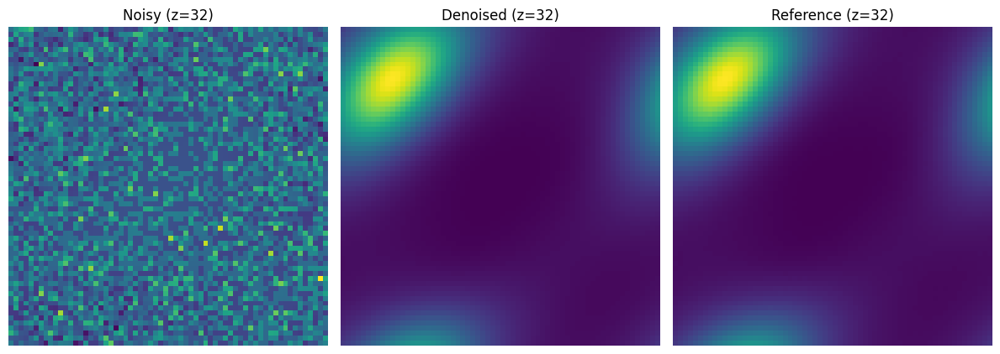


 Denoised matrix saved to /pscratch/sd/k/kberard/SCGSR/Data/diamond_1x1x1_bfd/density_data/vmc_J2/density_tot_vmc_mean_0000163840_CAE_denoised.npy
Sample 163840 | CAE JSD = 0.000104
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step

>>> Evaluation Metrics 2D
2-norm (noisy vs ref):     0.9276
2-norm (denoised vs ref): 0.0006
JSD   (noisy vs ref):     13.825756
JSD   (denoised vs ref):  0.000102

>>> Evaluation Metrics 3D
2-norm (noisy vs ref):     0.9276
2-norm (denoised vs ref): 0.0006
JSD   (noisy vs ref):     13.825756
JSD   (denoised vs ref):  0.000102


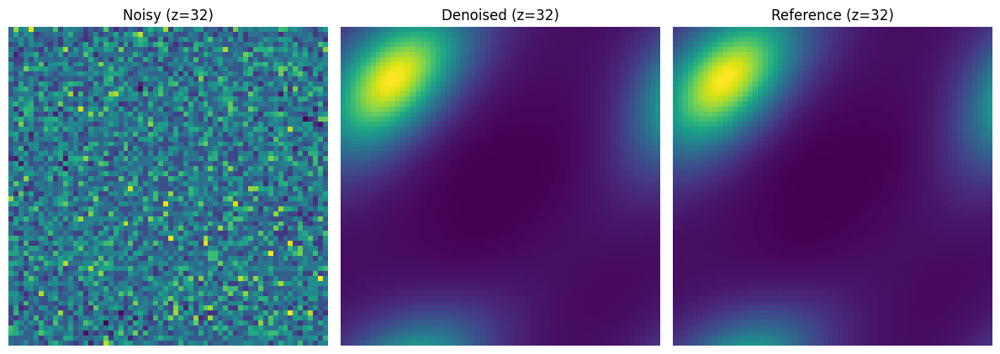


 Denoised matrix saved to /pscratch/sd/k/kberard/SCGSR/Data/diamond_1x1x1_bfd/density_data/vmc_J2/density_tot_vmc_mean_0000327680_CAE_denoised.npy
Sample 327680 | CAE JSD = 0.000102
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step

>>> Evaluation Metrics 2D
2-norm (noisy vs ref):     0.8108
2-norm (denoised vs ref): 0.0006
JSD   (noisy vs ref):     11.998552
JSD   (denoised vs ref):  0.000102

>>> Evaluation Metrics 3D
2-norm (noisy vs ref):     0.8108
2-norm (denoised vs ref): 0.0006
JSD   (noisy vs ref):     11.998552
JSD   (denoised vs ref):  0.000102


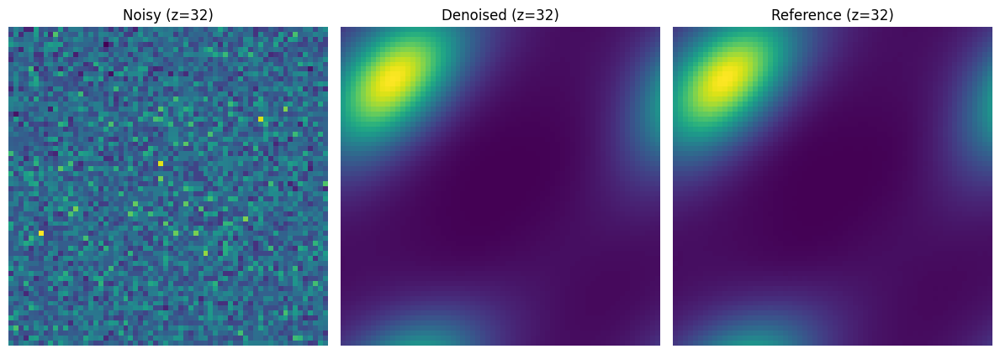


 Denoised matrix saved to /pscratch/sd/k/kberard/SCGSR/Data/diamond_1x1x1_bfd/density_data/vmc_J2/density_tot_vmc_mean_0000430080_CAE_denoised.npy
Sample 430080 | CAE JSD = 0.000102
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step

>>> Evaluation Metrics 2D
2-norm (noisy vs ref):     0.6583
2-norm (denoised vs ref): 0.0006
JSD   (noisy vs ref):     9.441314
JSD   (denoised vs ref):  0.000101

>>> Evaluation Metrics 3D
2-norm (noisy vs ref):     0.6583
2-norm (denoised vs ref): 0.0006
JSD   (noisy vs ref):     9.441314
JSD   (denoised vs ref):  0.000101


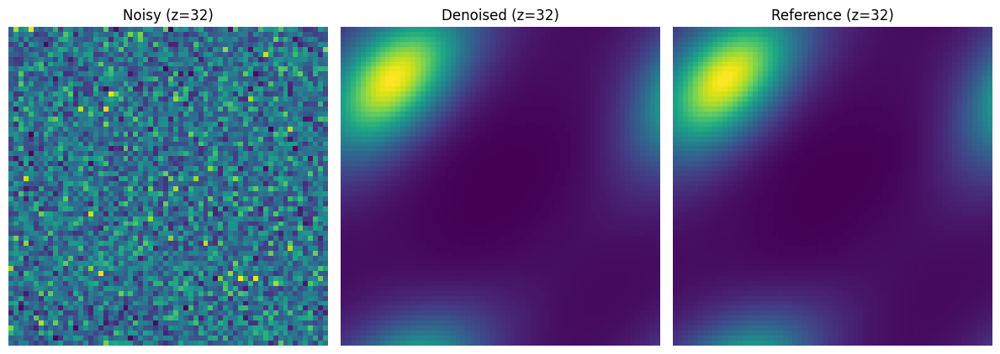


 Denoised matrix saved to /pscratch/sd/k/kberard/SCGSR/Data/diamond_1x1x1_bfd/density_data/vmc_J2/density_tot_vmc_mean_0000655360_CAE_denoised.npy
Sample 655360 | CAE JSD = 0.000101
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step

>>> Evaluation Metrics 2D
2-norm (noisy vs ref):     0.5753
2-norm (denoised vs ref): 0.0006
JSD   (noisy vs ref):     8.264836
JSD   (denoised vs ref):  0.000101

>>> Evaluation Metrics 3D
2-norm (noisy vs ref):     0.5753
2-norm (denoised vs ref): 0.0006
JSD   (noisy vs ref):     8.264836
JSD   (denoised vs ref):  0.000101


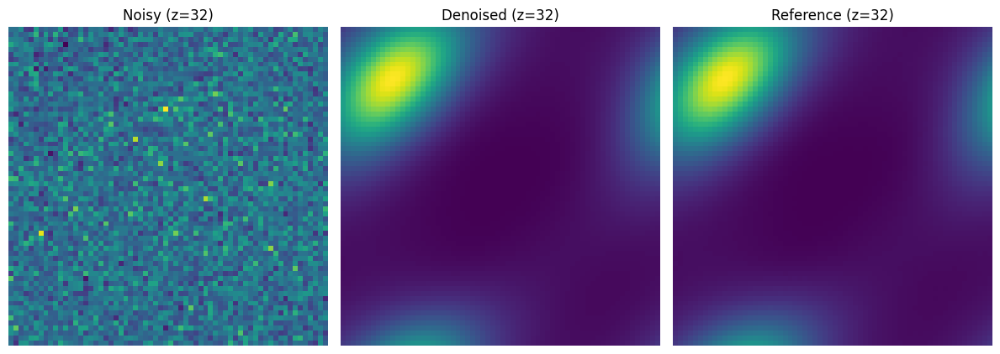


 Denoised matrix saved to /pscratch/sd/k/kberard/SCGSR/Data/diamond_1x1x1_bfd/density_data/vmc_J2/density_tot_vmc_mean_0000860160_CAE_denoised.npy
Sample 860160 | CAE JSD = 0.000101
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step

>>> Evaluation Metrics 2D
2-norm (noisy vs ref):     0.4693
2-norm (denoised vs ref): 0.0006
JSD   (noisy vs ref):     6.710627
JSD   (denoised vs ref):  0.000100

>>> Evaluation Metrics 3D
2-norm (noisy vs ref):     0.4693
2-norm (denoised vs ref): 0.0006
JSD   (noisy vs ref):     6.710627
JSD   (denoised vs ref):  0.000100


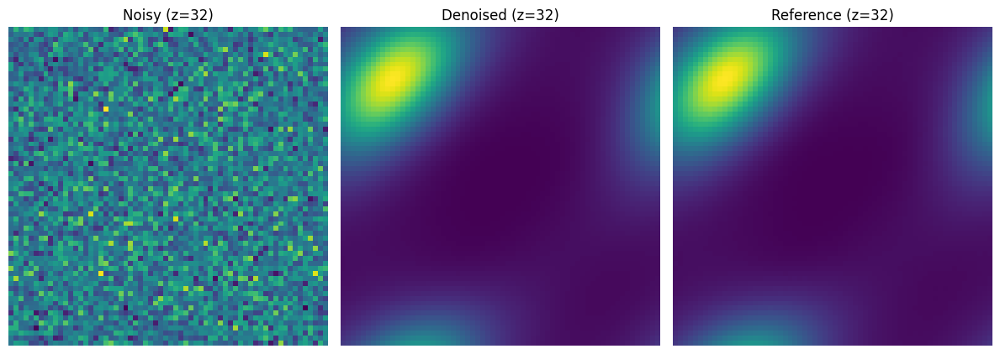


 Denoised matrix saved to /pscratch/sd/k/kberard/SCGSR/Data/diamond_1x1x1_bfd/density_data/vmc_J2/density_tot_vmc_mean_0001310720_CAE_denoised.npy
Sample 1310720 | CAE JSD = 0.000100
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step

>>> Evaluation Metrics 2D
2-norm (noisy vs ref):     0.4100
2-norm (denoised vs ref): 0.0006
JSD   (noisy vs ref):     5.773285
JSD   (denoised vs ref):  0.000099

>>> Evaluation Metrics 3D
2-norm (noisy vs ref):     0.4100
2-norm (denoised vs ref): 0.0006
JSD   (noisy vs ref):     5.773285
JSD   (denoised vs ref):  0.000099


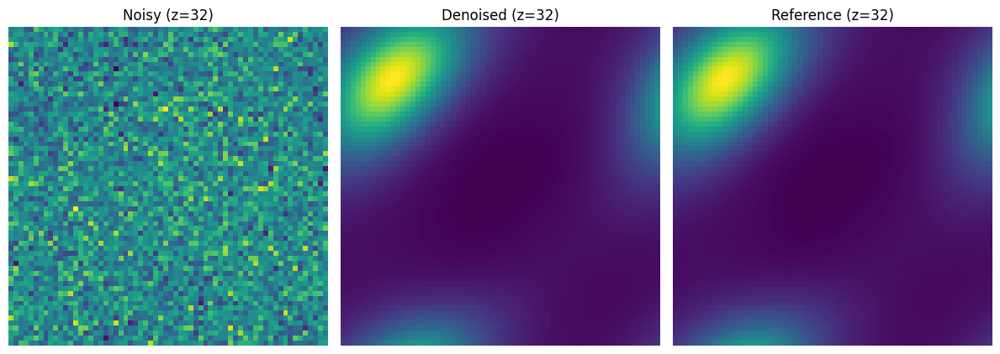


 Denoised matrix saved to /pscratch/sd/k/kberard/SCGSR/Data/diamond_1x1x1_bfd/density_data/vmc_J2/density_tot_vmc_mean_0001720320_CAE_denoised.npy
Sample 1720320 | CAE JSD = 0.000099
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step

>>> Evaluation Metrics 2D
2-norm (noisy vs ref):     0.3366
2-norm (denoised vs ref): 0.0006
JSD   (noisy vs ref):     4.829274
JSD   (denoised vs ref):  0.000098

>>> Evaluation Metrics 3D
2-norm (noisy vs ref):     0.3366
2-norm (denoised vs ref): 0.0006
JSD   (noisy vs ref):     4.829274
JSD   (denoised vs ref):  0.000098


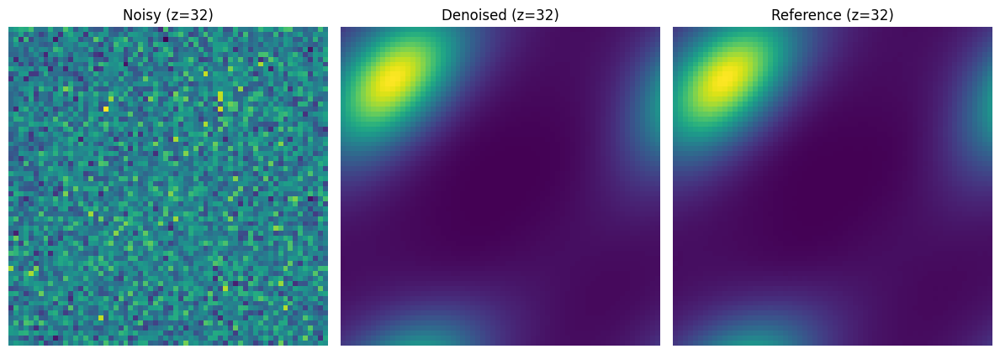


 Denoised matrix saved to /pscratch/sd/k/kberard/SCGSR/Data/diamond_1x1x1_bfd/density_data/vmc_J2/density_tot_vmc_mean_0002621440_CAE_denoised.npy
Sample 2621440 | CAE JSD = 0.000098
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step

>>> Evaluation Metrics 2D
2-norm (noisy vs ref):     0.2957
2-norm (denoised vs ref): 0.0006
JSD   (noisy vs ref):     4.214717
JSD   (denoised vs ref):  0.000097

>>> Evaluation Metrics 3D
2-norm (noisy vs ref):     0.2957
2-norm (denoised vs ref): 0.0006
JSD   (noisy vs ref):     4.214717
JSD   (denoised vs ref):  0.000097


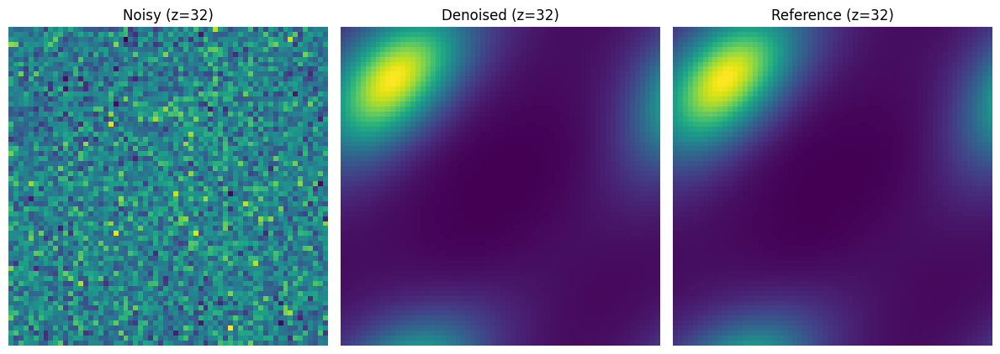


 Denoised matrix saved to /pscratch/sd/k/kberard/SCGSR/Data/diamond_1x1x1_bfd/density_data/vmc_J2/density_tot_vmc_mean_0003440640_CAE_denoised.npy
Sample 3440640 | CAE JSD = 0.000097
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step

>>> Evaluation Metrics 2D
2-norm (noisy vs ref):     0.2466
2-norm (denoised vs ref): 0.0006
JSD   (noisy vs ref):     3.612919
JSD   (denoised vs ref):  0.000097

>>> Evaluation Metrics 3D
2-norm (noisy vs ref):     0.2466
2-norm (denoised vs ref): 0.0006
JSD   (noisy vs ref):     3.612919
JSD   (denoised vs ref):  0.000097


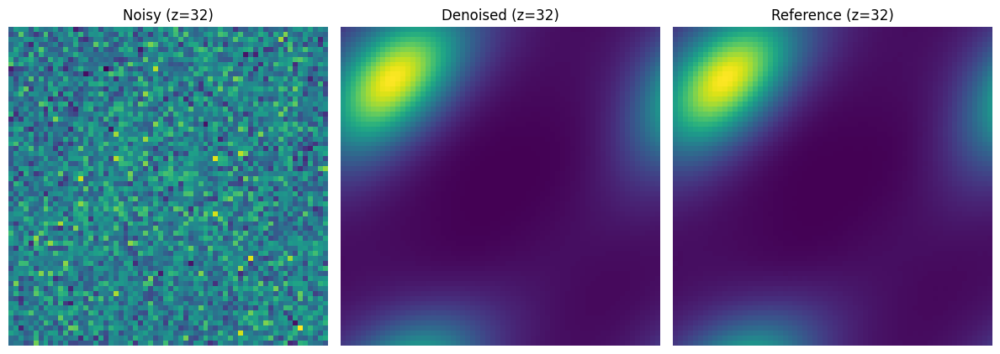


 Denoised matrix saved to /pscratch/sd/k/kberard/SCGSR/Data/diamond_1x1x1_bfd/density_data/vmc_J2/density_tot_vmc_mean_0005160960_CAE_denoised.npy
Sample 5160960 | CAE JSD = 0.000097
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step

>>> Evaluation Metrics 2D
2-norm (noisy vs ref):     0.2450
2-norm (denoised vs ref): 0.0006
JSD   (noisy vs ref):     3.572269
JSD   (denoised vs ref):  0.000096

>>> Evaluation Metrics 3D
2-norm (noisy vs ref):     0.2450
2-norm (denoised vs ref): 0.0006
JSD   (noisy vs ref):     3.572269
JSD   (denoised vs ref):  0.000096


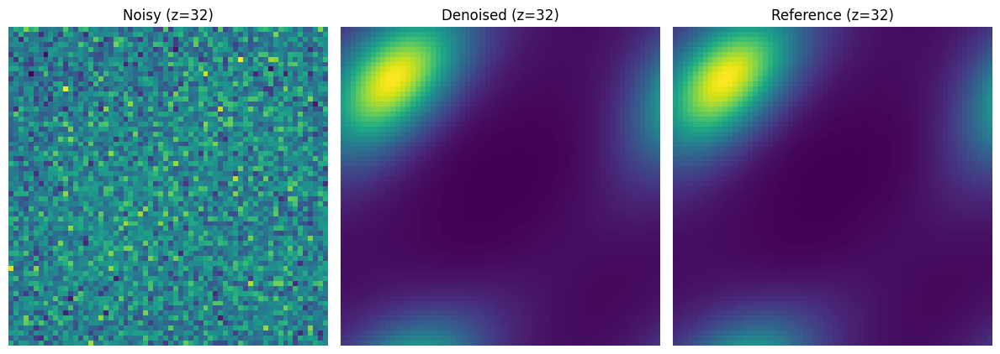


 Denoised matrix saved to /pscratch/sd/k/kberard/SCGSR/Data/diamond_1x1x1_bfd/density_data/vmc_J2/density_tot_vmc_mean_0005242880_CAE_denoised.npy
Sample 5242880 | CAE JSD = 0.000096
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step

>>> Evaluation Metrics 2D
2-norm (noisy vs ref):     0.2177
2-norm (denoised vs ref): 0.0006
JSD   (noisy vs ref):     3.210400
JSD   (denoised vs ref):  0.000096

>>> Evaluation Metrics 3D
2-norm (noisy vs ref):     0.2177
2-norm (denoised vs ref): 0.0006
JSD   (noisy vs ref):     3.210400
JSD   (denoised vs ref):  0.000096


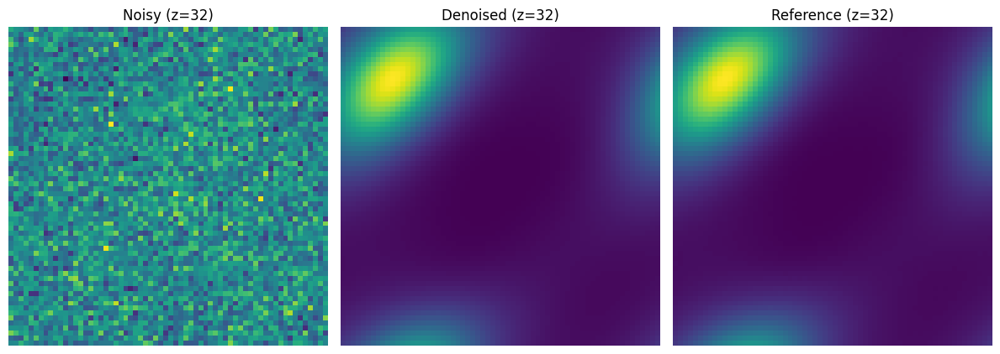


 Denoised matrix saved to /pscratch/sd/k/kberard/SCGSR/Data/diamond_1x1x1_bfd/density_data/vmc_J2/density_tot_vmc_mean_0006881280_CAE_denoised.npy
Sample 6881280 | CAE JSD = 0.000096
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step

>>> Evaluation Metrics 2D
2-norm (noisy vs ref):     0.1835
2-norm (denoised vs ref): 0.0006
JSD   (noisy vs ref):     2.825540
JSD   (denoised vs ref):  0.000094

>>> Evaluation Metrics 3D
2-norm (noisy vs ref):     0.1835
2-norm (denoised vs ref): 0.0006
JSD   (noisy vs ref):     2.825540
JSD   (denoised vs ref):  0.000094


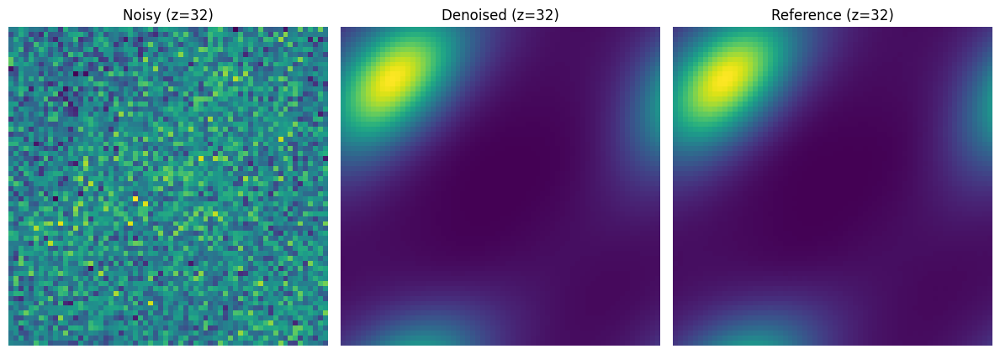


 Denoised matrix saved to /pscratch/sd/k/kberard/SCGSR/Data/diamond_1x1x1_bfd/density_data/vmc_J2/density_tot_vmc_mean_0010321920_CAE_denoised.npy
Sample 10321920 | CAE JSD = 0.000094
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step

>>> Evaluation Metrics 2D
2-norm (noisy vs ref):     0.1826
2-norm (denoised vs ref): 0.0006
JSD   (noisy vs ref):     2.823653
JSD   (denoised vs ref):  0.000094

>>> Evaluation Metrics 3D
2-norm (noisy vs ref):     0.1826
2-norm (denoised vs ref): 0.0006
JSD   (noisy vs ref):     2.823653
JSD   (denoised vs ref):  0.000094


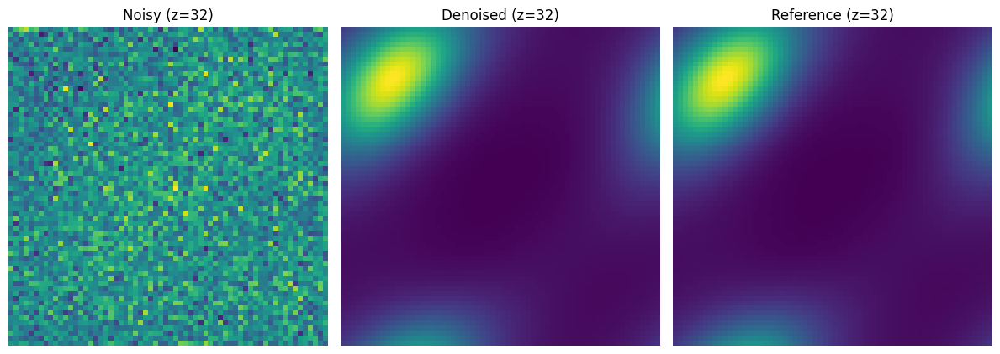


 Denoised matrix saved to /pscratch/sd/k/kberard/SCGSR/Data/diamond_1x1x1_bfd/density_data/vmc_J2/density_tot_vmc_mean_0010485760_CAE_denoised.npy
Sample 10485760 | CAE JSD = 0.000094
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step

>>> Evaluation Metrics 2D
2-norm (noisy vs ref):     0.1643
2-norm (denoised vs ref): 0.0006
JSD   (noisy vs ref):     2.590050
JSD   (denoised vs ref):  0.000093

>>> Evaluation Metrics 3D
2-norm (noisy vs ref):     0.1643
2-norm (denoised vs ref): 0.0006
JSD   (noisy vs ref):     2.590050
JSD   (denoised vs ref):  0.000093


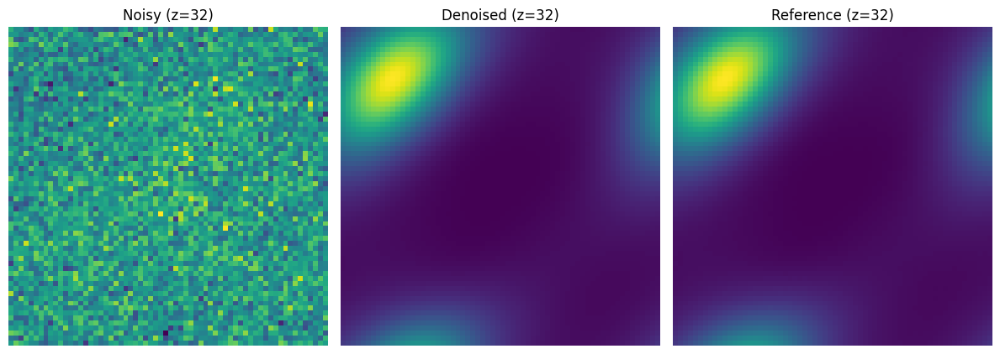


 Denoised matrix saved to /pscratch/sd/k/kberard/SCGSR/Data/diamond_1x1x1_bfd/density_data/vmc_J2/density_tot_vmc_mean_0013762560_CAE_denoised.npy
Sample 13762560 | CAE JSD = 0.000093
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step

>>> Evaluation Metrics 2D
2-norm (noisy vs ref):     0.1421
2-norm (denoised vs ref): 0.0006
JSD   (noisy vs ref):     2.342830
JSD   (denoised vs ref):  0.000092

>>> Evaluation Metrics 3D
2-norm (noisy vs ref):     0.1421
2-norm (denoised vs ref): 0.0006
JSD   (noisy vs ref):     2.342830
JSD   (denoised vs ref):  0.000092


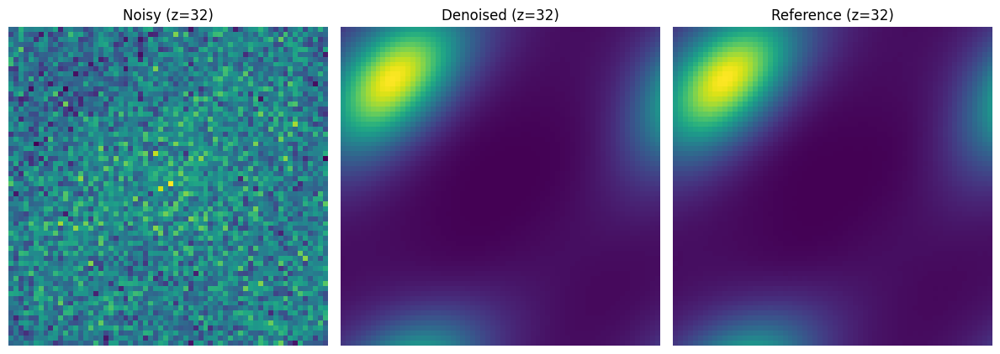


 Denoised matrix saved to /pscratch/sd/k/kberard/SCGSR/Data/diamond_1x1x1_bfd/density_data/vmc_J2/density_tot_vmc_mean_0020643840_CAE_denoised.npy
Sample 20643840 | CAE JSD = 0.000092
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step

>>> Evaluation Metrics 2D
2-norm (noisy vs ref):     0.1298
2-norm (denoised vs ref): 0.0006
JSD   (noisy vs ref):     2.207554
JSD   (denoised vs ref):  0.000091

>>> Evaluation Metrics 3D
2-norm (noisy vs ref):     0.1298
2-norm (denoised vs ref): 0.0006
JSD   (noisy vs ref):     2.207554
JSD   (denoised vs ref):  0.000091


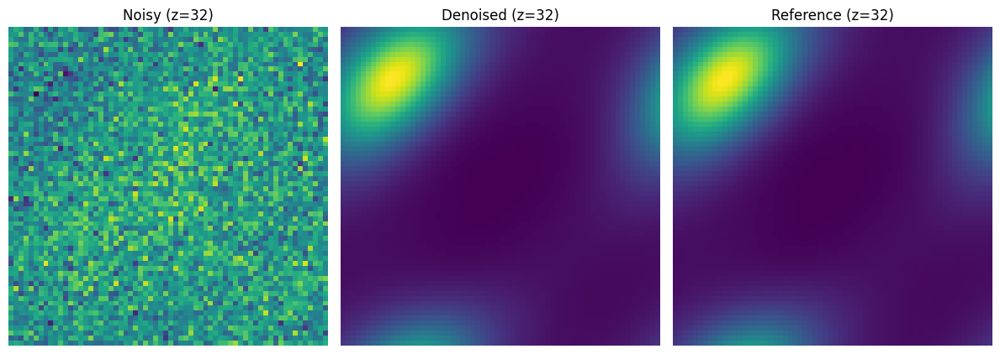


 Denoised matrix saved to /pscratch/sd/k/kberard/SCGSR/Data/diamond_1x1x1_bfd/density_data/vmc_J2/density_tot_vmc_mean_0027525120_CAE_denoised.npy
Sample 27525120 | CAE JSD = 0.000091
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step

>>> Evaluation Metrics 2D
2-norm (noisy vs ref):     0.1159
2-norm (denoised vs ref): 0.0006
JSD   (noisy vs ref):     2.052071
JSD   (denoised vs ref):  0.000090

>>> Evaluation Metrics 3D
2-norm (noisy vs ref):     0.1159
2-norm (denoised vs ref): 0.0006
JSD   (noisy vs ref):     2.052071
JSD   (denoised vs ref):  0.000090


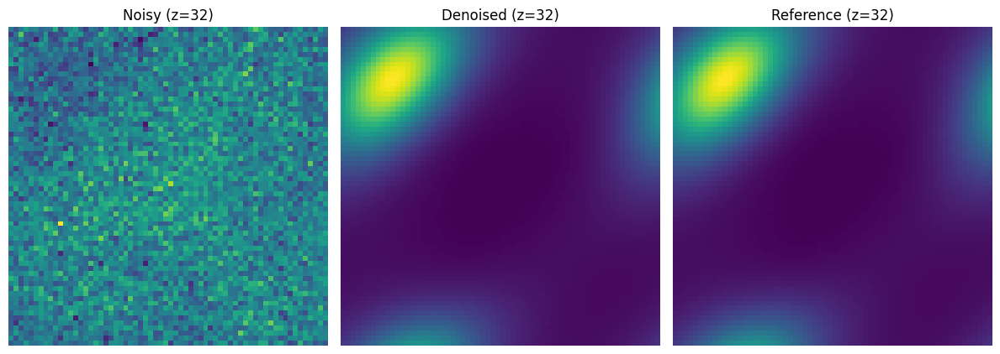


 Denoised matrix saved to /pscratch/sd/k/kberard/SCGSR/Data/diamond_1x1x1_bfd/density_data/vmc_J2/density_tot_vmc_mean_0041287680_CAE_denoised.npy
Sample 41287680 | CAE JSD = 0.000090
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step

>>> Evaluation Metrics 2D
2-norm (noisy vs ref):     0.1086
2-norm (denoised vs ref): 0.0006
JSD   (noisy vs ref):     1.961343
JSD   (denoised vs ref):  0.000089

>>> Evaluation Metrics 3D
2-norm (noisy vs ref):     0.1086
2-norm (denoised vs ref): 0.0006
JSD   (noisy vs ref):     1.961343
JSD   (denoised vs ref):  0.000089


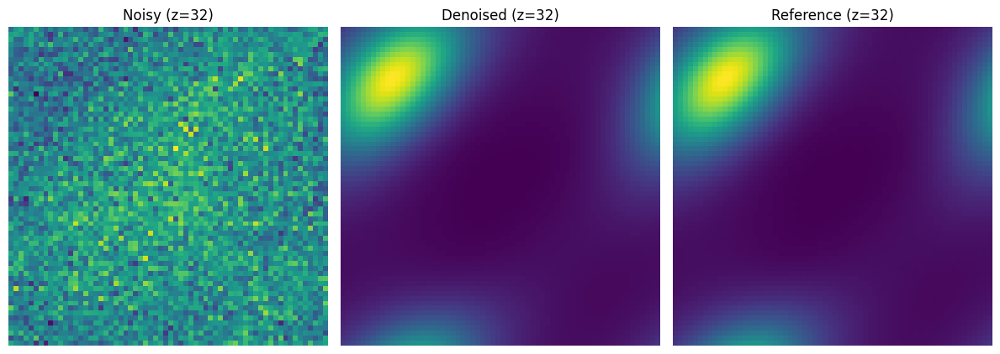


 Denoised matrix saved to /pscratch/sd/k/kberard/SCGSR/Data/diamond_1x1x1_bfd/density_data/vmc_J2/density_tot_vmc_mean_0055050240_CAE_denoised.npy
Sample 55050240 | CAE JSD = 0.000089
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step

>>> Evaluation Metrics 2D
2-norm (noisy vs ref):     0.1004
2-norm (denoised vs ref): 0.0006
JSD   (noisy vs ref):     1.854723
JSD   (denoised vs ref):  0.000088

>>> Evaluation Metrics 3D
2-norm (noisy vs ref):     0.1004
2-norm (denoised vs ref): 0.0006
JSD   (noisy vs ref):     1.854723
JSD   (denoised vs ref):  0.000088


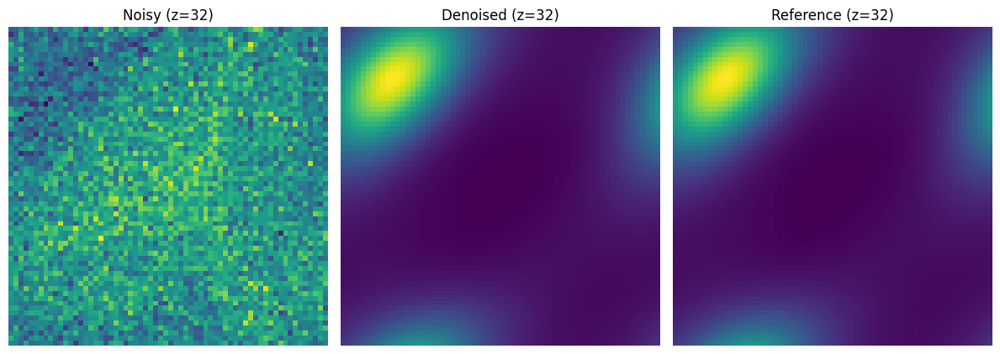


 Denoised matrix saved to /pscratch/sd/k/kberard/SCGSR/Data/diamond_1x1x1_bfd/density_data/vmc_J2/density_tot_vmc_mean_0082575360_CAE_denoised.npy
Sample 82575360 | CAE JSD = 0.000088
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step

>>> Evaluation Metrics 2D
2-norm (noisy vs ref):     0.0961
2-norm (denoised vs ref): 0.0005
JSD   (noisy vs ref):     1.797909
JSD   (denoised vs ref):  0.000087

>>> Evaluation Metrics 3D
2-norm (noisy vs ref):     0.0961
2-norm (denoised vs ref): 0.0005
JSD   (noisy vs ref):     1.797909
JSD   (denoised vs ref):  0.000087


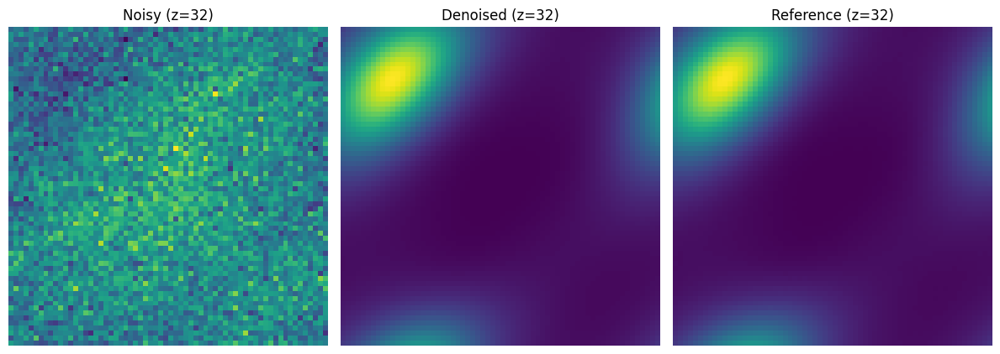


 Denoised matrix saved to /pscratch/sd/k/kberard/SCGSR/Data/diamond_1x1x1_bfd/density_data/vmc_J2/density_tot_vmc_mean_0110100480_CAE_denoised.npy
Sample 110100480 | CAE JSD = 0.000087
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step

>>> Evaluation Metrics 2D
2-norm (noisy vs ref):     0.0914
2-norm (denoised vs ref): 0.0005
JSD   (noisy vs ref):     1.720404
JSD   (denoised vs ref):  0.000086

>>> Evaluation Metrics 3D
2-norm (noisy vs ref):     0.0914
2-norm (denoised vs ref): 0.0005
JSD   (noisy vs ref):     1.720404
JSD   (denoised vs ref):  0.000086


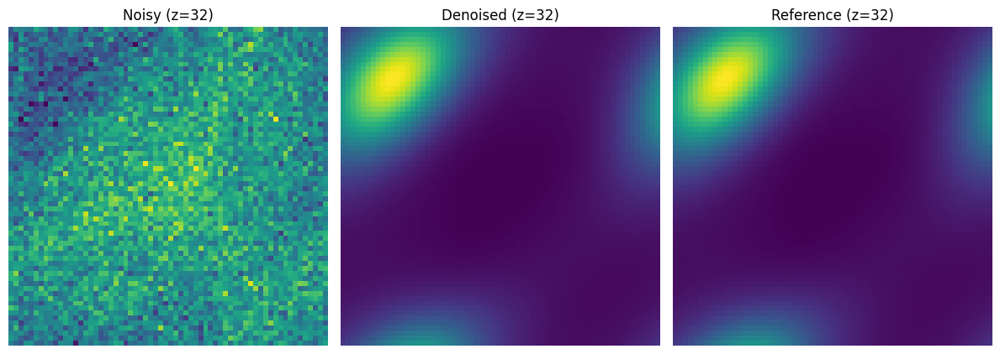


 Denoised matrix saved to /pscratch/sd/k/kberard/SCGSR/Data/diamond_1x1x1_bfd/density_data/vmc_J2/density_tot_vmc_mean_0165150720_CAE_denoised.npy
Sample 165150720 | CAE JSD = 0.000086
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step

>>> Evaluation Metrics 2D
2-norm (noisy vs ref):     0.0891
2-norm (denoised vs ref): 0.0005
JSD   (noisy vs ref):     1.684438
JSD   (denoised vs ref):  0.000085

>>> Evaluation Metrics 3D
2-norm (noisy vs ref):     0.0891
2-norm (denoised vs ref): 0.0005
JSD   (noisy vs ref):     1.684438
JSD   (denoised vs ref):  0.000085


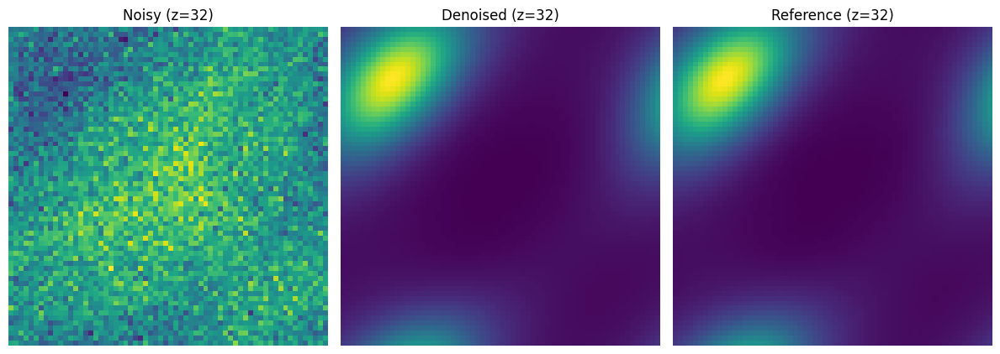


 Denoised matrix saved to /pscratch/sd/k/kberard/SCGSR/Data/diamond_1x1x1_bfd/density_data/vmc_J2/density_tot_vmc_mean_0220200960_CAE_denoised.npy
Sample 220200960 | CAE JSD = 0.000085
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step

>>> Evaluation Metrics 2D
2-norm (noisy vs ref):     0.0867
2-norm (denoised vs ref): 0.0005
JSD   (noisy vs ref):     1.640221
JSD   (denoised vs ref):  0.000084

>>> Evaluation Metrics 3D
2-norm (noisy vs ref):     0.0867
2-norm (denoised vs ref): 0.0005
JSD   (noisy vs ref):     1.640221
JSD   (denoised vs ref):  0.000084


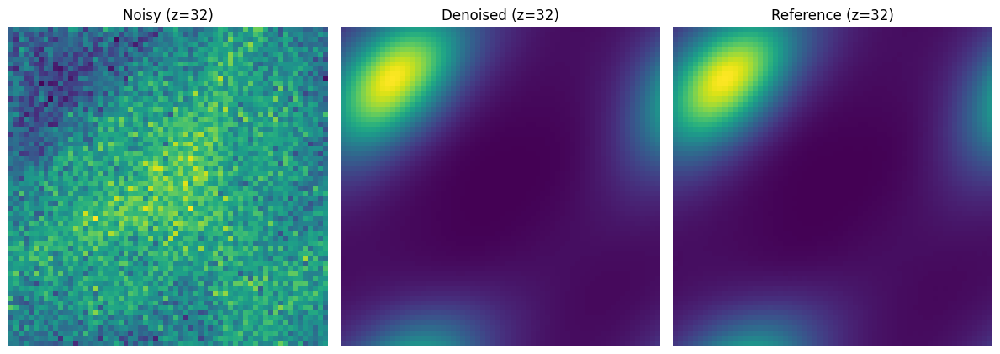


 Denoised matrix saved to /pscratch/sd/k/kberard/SCGSR/Data/diamond_1x1x1_bfd/density_data/vmc_J2/density_tot_vmc_mean_0330301440_CAE_denoised.npy
Sample 330301440 | CAE JSD = 0.000084
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step

>>> Evaluation Metrics 2D
2-norm (noisy vs ref):     0.0855
2-norm (denoised vs ref): 0.0005
JSD   (noisy vs ref):     1.616228
JSD   (denoised vs ref):  0.000084

>>> Evaluation Metrics 3D
2-norm (noisy vs ref):     0.0855
2-norm (denoised vs ref): 0.0005
JSD   (noisy vs ref):     1.616228
JSD   (denoised vs ref):  0.000084


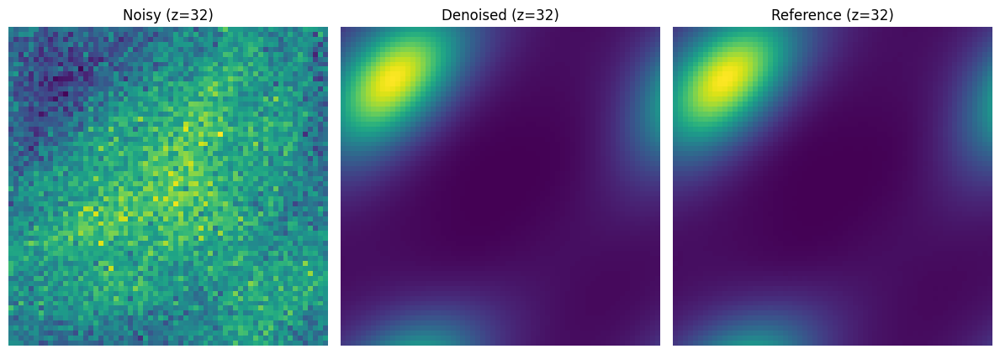


 Denoised matrix saved to /pscratch/sd/k/kberard/SCGSR/Data/diamond_1x1x1_bfd/density_data/vmc_J2/density_tot_vmc_mean_0440401920_CAE_denoised.npy
Sample 440401920 | CAE JSD = 0.000084
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step

>>> Evaluation Metrics 2D
2-norm (noisy vs ref):     0.0843
2-norm (denoised vs ref): 0.0005
JSD   (noisy vs ref):     1.591536
JSD   (denoised vs ref):  0.000083

>>> Evaluation Metrics 3D
2-norm (noisy vs ref):     0.0843
2-norm (denoised vs ref): 0.0005
JSD   (noisy vs ref):     1.591536
JSD   (denoised vs ref):  0.000083


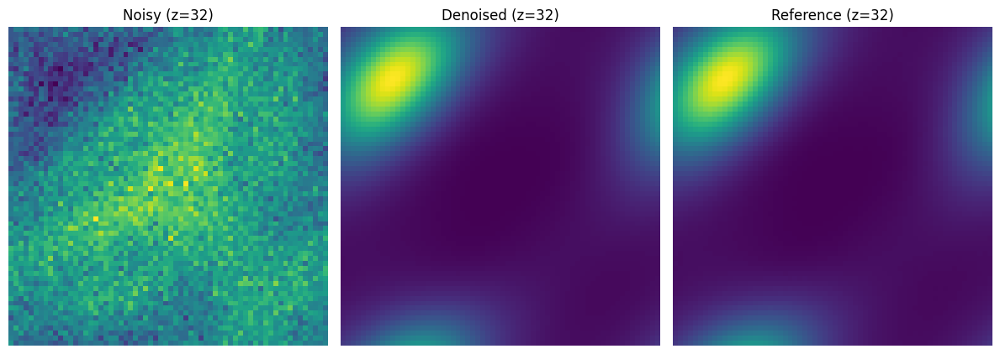


 Denoised matrix saved to /pscratch/sd/k/kberard/SCGSR/Data/diamond_1x1x1_bfd/density_data/vmc_J2/density_tot_vmc_mean_0660602880_CAE_denoised.npy
Sample 660602880 | CAE JSD = 0.000083
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step

>>> Evaluation Metrics 2D
2-norm (noisy vs ref):     0.0830
2-norm (denoised vs ref): 0.0005
JSD   (noisy vs ref):     1.564715
JSD   (denoised vs ref):  0.000082

>>> Evaluation Metrics 3D
2-norm (noisy vs ref):     0.0830
2-norm (denoised vs ref): 0.0005
JSD   (noisy vs ref):     1.564715
JSD   (denoised vs ref):  0.000082


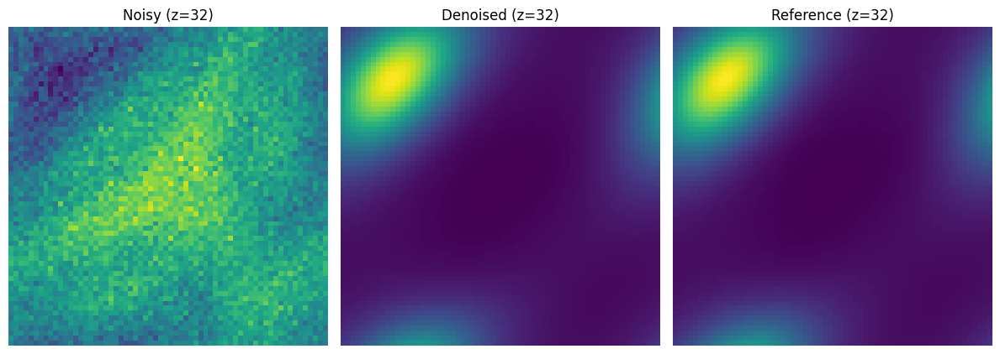


 Denoised matrix saved to /pscratch/sd/k/kberard/SCGSR/Data/diamond_1x1x1_bfd/density_data/vmc_J2/density_tot_vmc_mean_1321205760_CAE_denoised.npy
Sample 1321205760 | CAE JSD = 0.000082
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step

>>> Evaluation Metrics 2D
2-norm (noisy vs ref):     0.0824
2-norm (denoised vs ref): 0.0005
JSD   (noisy vs ref):     1.554853
JSD   (denoised vs ref):  0.000082

>>> Evaluation Metrics 3D
2-norm (noisy vs ref):     0.0824
2-norm (denoised vs ref): 0.0005
JSD   (noisy vs ref):     1.554853
JSD   (denoised vs ref):  0.000082


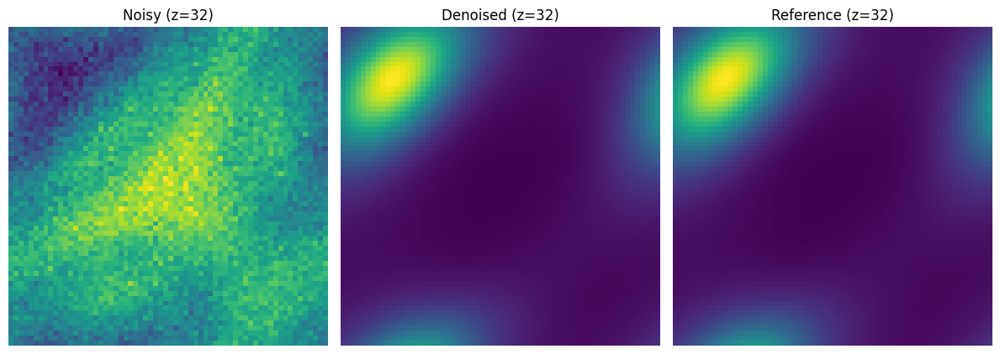


 Denoised matrix saved to /pscratch/sd/k/kberard/SCGSR/Data/diamond_1x1x1_bfd/density_data/vmc_J2/density_tot_vmc_mean_2642411520_CAE_denoised.npy
Sample 2642411520 | CAE JSD = 0.000082
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step

>>> Evaluation Metrics 2D
2-norm (noisy vs ref):     0.0820
2-norm (denoised vs ref): 0.0005
JSD   (noisy vs ref):     1.549535
JSD   (denoised vs ref):  0.000082

>>> Evaluation Metrics 3D
2-norm (noisy vs ref):     0.0820
2-norm (denoised vs ref): 0.0005
JSD   (noisy vs ref):     1.549535
JSD   (denoised vs ref):  0.000082


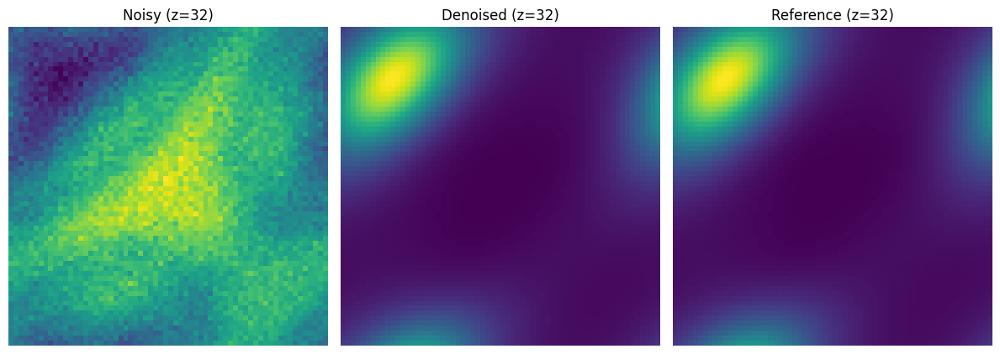


 Denoised matrix saved to /pscratch/sd/k/kberard/SCGSR/Data/diamond_1x1x1_bfd/density_data/vmc_J2/density_tot_vmc_mean_5284823040_CAE_denoised.npy
Sample 5284823040 | CAE JSD = 0.000082

=== Running model: bm3d ===
here
(64, 64, 64, 3)

>>> Evaluation Metrics 2D
2-norm (noisy vs ref):     5.2365
2-norm (denoised vs ref): 0.0005
JSD   (noisy vs ref):     52.063201
JSD   (denoised vs ref):  0.000120

>>> Evaluation Metrics 3D
2-norm (noisy vs ref):     5.2365
2-norm (denoised vs ref): 0.0005
JSD   (noisy vs ref):     52.063201
JSD   (denoised vs ref):  0.000120


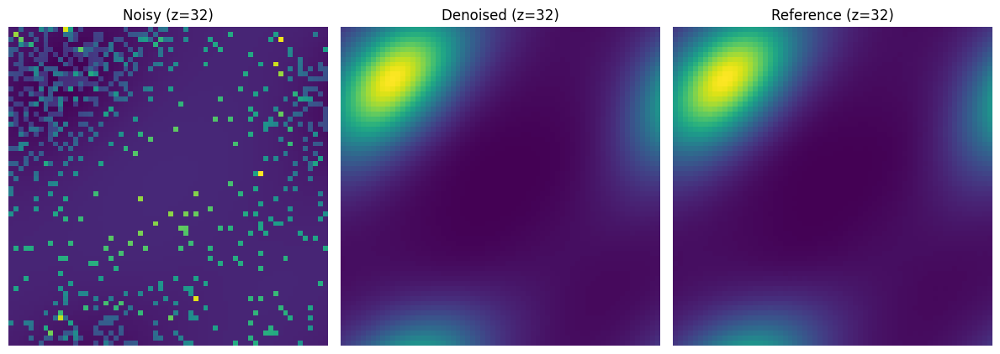


 Denoised matrix saved to /pscratch/sd/k/kberard/SCGSR/Data/diamond_1x1x1_bfd/density_data/vmc_J2/density_tot_vmc_mean_0000010240_bm3d_denoised.npy
Sample 10240 | bm3d JSD = 0.000120
here
(64, 64, 64, 3)

>>> Evaluation Metrics 2D
2-norm (noisy vs ref):     3.7153
2-norm (denoised vs ref): 0.0005
JSD   (noisy vs ref):     38.646104
JSD   (denoised vs ref):  0.000117

>>> Evaluation Metrics 3D
2-norm (noisy vs ref):     3.7153
2-norm (denoised vs ref): 0.0005
JSD   (noisy vs ref):     38.646104
JSD   (denoised vs ref):  0.000117


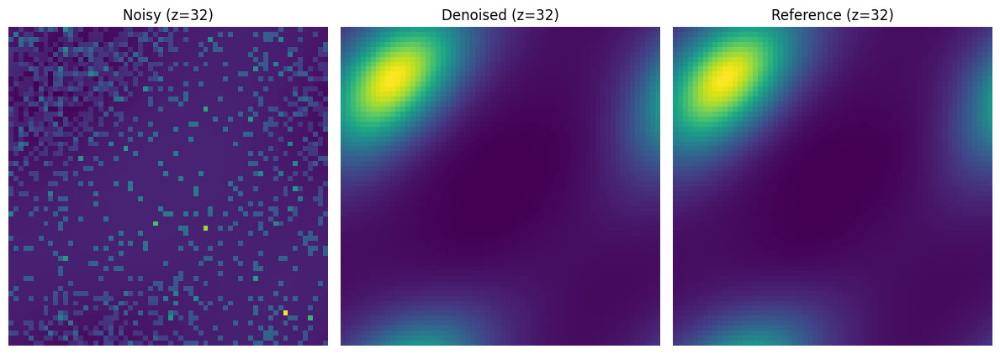


 Denoised matrix saved to /pscratch/sd/k/kberard/SCGSR/Data/diamond_1x1x1_bfd/density_data/vmc_J2/density_tot_vmc_mean_0000020480_bm3d_denoised.npy
Sample 20480 | bm3d JSD = 0.000117
here
(64, 64, 64, 3)

>>> Evaluation Metrics 2D
2-norm (noisy vs ref):     2.6176
2-norm (denoised vs ref): 0.0006
JSD   (noisy vs ref):     34.109040
JSD   (denoised vs ref):  0.000114

>>> Evaluation Metrics 3D
2-norm (noisy vs ref):     2.6176
2-norm (denoised vs ref): 0.0006
JSD   (noisy vs ref):     34.109040
JSD   (denoised vs ref):  0.000114


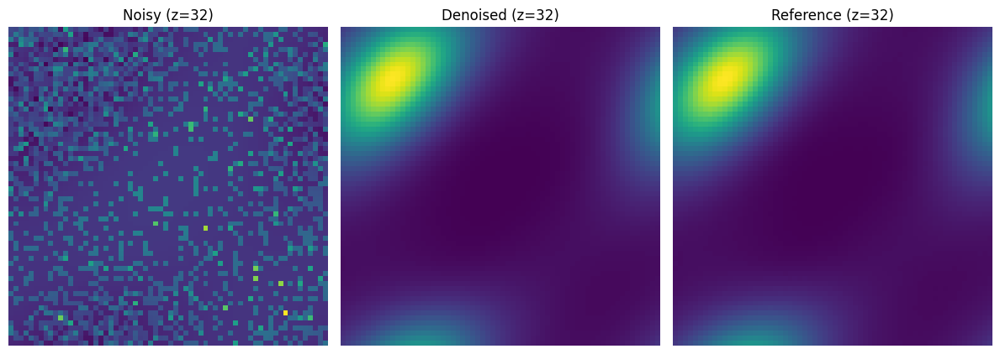


 Denoised matrix saved to /pscratch/sd/k/kberard/SCGSR/Data/diamond_1x1x1_bfd/density_data/vmc_J2/density_tot_vmc_mean_0000040960_bm3d_denoised.npy
Sample 40960 | bm3d JSD = 0.000114
here
(64, 64, 64, 3)

>>> Evaluation Metrics 2D
2-norm (noisy vs ref):     1.8514
2-norm (denoised vs ref): 0.0006
JSD   (noisy vs ref):     24.002402
JSD   (denoised vs ref):  0.000111

>>> Evaluation Metrics 3D
2-norm (noisy vs ref):     1.8514
2-norm (denoised vs ref): 0.0006
JSD   (noisy vs ref):     24.002402
JSD   (denoised vs ref):  0.000111


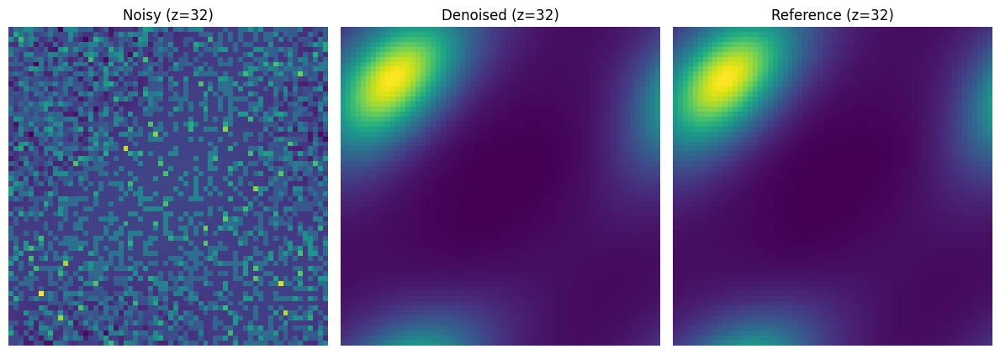


 Denoised matrix saved to /pscratch/sd/k/kberard/SCGSR/Data/diamond_1x1x1_bfd/density_data/vmc_J2/density_tot_vmc_mean_0000081920_bm3d_denoised.npy
Sample 81920 | bm3d JSD = 0.000111
here
(64, 64, 64, 3)

>>> Evaluation Metrics 2D
2-norm (noisy vs ref):     1.3096
2-norm (denoised vs ref): 0.0006
JSD   (noisy vs ref):     19.183826
JSD   (denoised vs ref):  0.000108

>>> Evaluation Metrics 3D
2-norm (noisy vs ref):     1.3096
2-norm (denoised vs ref): 0.0006
JSD   (noisy vs ref):     19.183826
JSD   (denoised vs ref):  0.000108


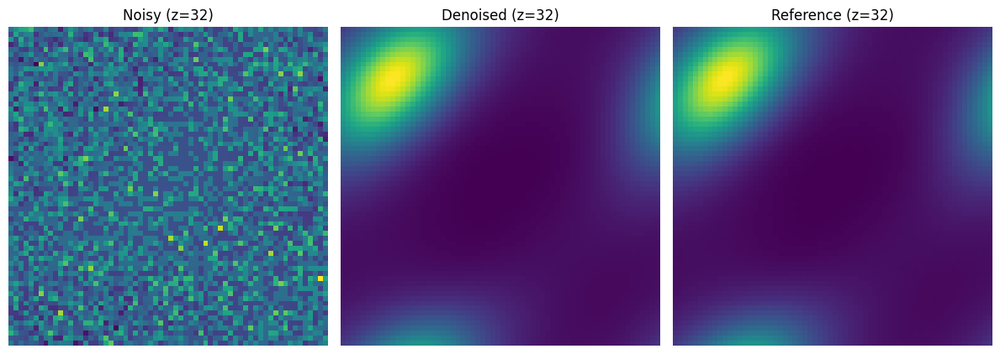


 Denoised matrix saved to /pscratch/sd/k/kberard/SCGSR/Data/diamond_1x1x1_bfd/density_data/vmc_J2/density_tot_vmc_mean_0000163840_bm3d_denoised.npy
Sample 163840 | bm3d JSD = 0.000108
here
(64, 64, 64, 3)

>>> Evaluation Metrics 2D
2-norm (noisy vs ref):     0.9276
2-norm (denoised vs ref): 0.0006
JSD   (noisy vs ref):     13.825756
JSD   (denoised vs ref):  0.000105

>>> Evaluation Metrics 3D
2-norm (noisy vs ref):     0.9276
2-norm (denoised vs ref): 0.0006
JSD   (noisy vs ref):     13.825756
JSD   (denoised vs ref):  0.000105


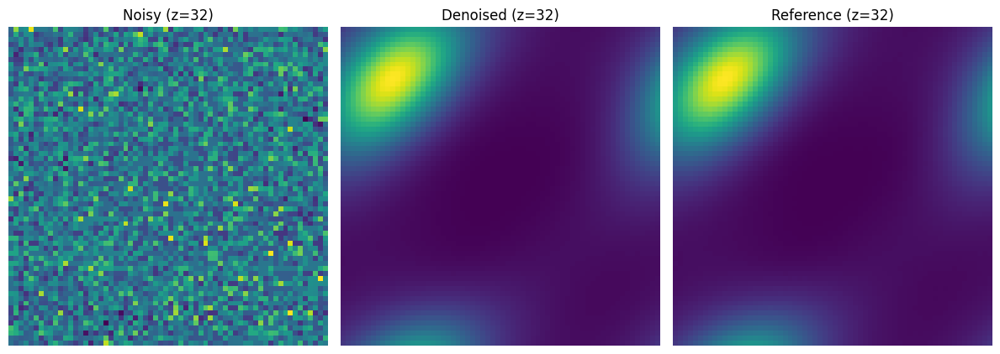


 Denoised matrix saved to /pscratch/sd/k/kberard/SCGSR/Data/diamond_1x1x1_bfd/density_data/vmc_J2/density_tot_vmc_mean_0000327680_bm3d_denoised.npy
Sample 327680 | bm3d JSD = 0.000105
here
(64, 64, 64, 3)

>>> Evaluation Metrics 2D
2-norm (noisy vs ref):     0.8108
2-norm (denoised vs ref): 0.0006
JSD   (noisy vs ref):     11.998552
JSD   (denoised vs ref):  0.000105

>>> Evaluation Metrics 3D
2-norm (noisy vs ref):     0.8108
2-norm (denoised vs ref): 0.0006
JSD   (noisy vs ref):     11.998552
JSD   (denoised vs ref):  0.000105


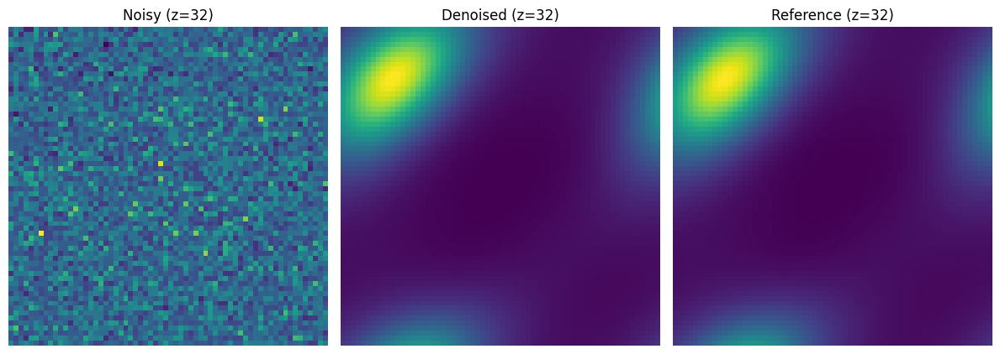


 Denoised matrix saved to /pscratch/sd/k/kberard/SCGSR/Data/diamond_1x1x1_bfd/density_data/vmc_J2/density_tot_vmc_mean_0000430080_bm3d_denoised.npy
Sample 430080 | bm3d JSD = 0.000105
here
(64, 64, 64, 3)

>>> Evaluation Metrics 2D
2-norm (noisy vs ref):     0.6583
2-norm (denoised vs ref): 0.0006
JSD   (noisy vs ref):     9.441314
JSD   (denoised vs ref):  0.000104

>>> Evaluation Metrics 3D
2-norm (noisy vs ref):     0.6583
2-norm (denoised vs ref): 0.0006
JSD   (noisy vs ref):     9.441314
JSD   (denoised vs ref):  0.000104


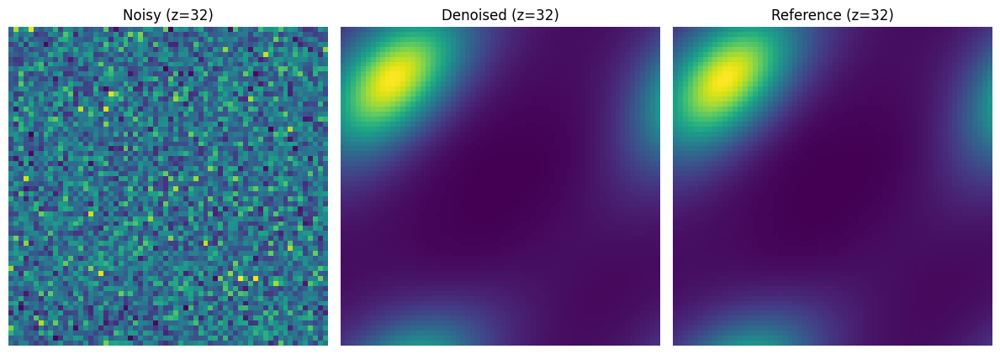


 Denoised matrix saved to /pscratch/sd/k/kberard/SCGSR/Data/diamond_1x1x1_bfd/density_data/vmc_J2/density_tot_vmc_mean_0000655360_bm3d_denoised.npy
Sample 655360 | bm3d JSD = 0.000104
here
(64, 64, 64, 3)

>>> Evaluation Metrics 2D
2-norm (noisy vs ref):     0.5753
2-norm (denoised vs ref): 0.0006
JSD   (noisy vs ref):     8.264836
JSD   (denoised vs ref):  0.000103

>>> Evaluation Metrics 3D
2-norm (noisy vs ref):     0.5753
2-norm (denoised vs ref): 0.0006
JSD   (noisy vs ref):     8.264836
JSD   (denoised vs ref):  0.000103


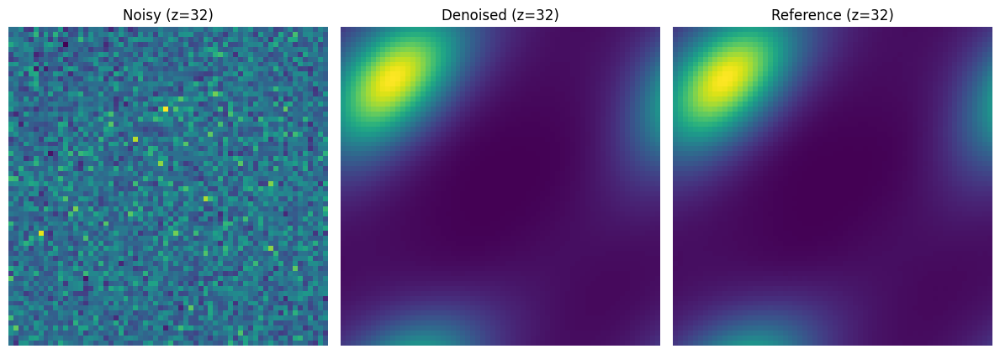


 Denoised matrix saved to /pscratch/sd/k/kberard/SCGSR/Data/diamond_1x1x1_bfd/density_data/vmc_J2/density_tot_vmc_mean_0000860160_bm3d_denoised.npy
Sample 860160 | bm3d JSD = 0.000103
here
(64, 64, 64, 3)

>>> Evaluation Metrics 2D
2-norm (noisy vs ref):     0.4693
2-norm (denoised vs ref): 0.0006
JSD   (noisy vs ref):     6.710627
JSD   (denoised vs ref):  0.000102

>>> Evaluation Metrics 3D
2-norm (noisy vs ref):     0.4693
2-norm (denoised vs ref): 0.0006
JSD   (noisy vs ref):     6.710627
JSD   (denoised vs ref):  0.000102


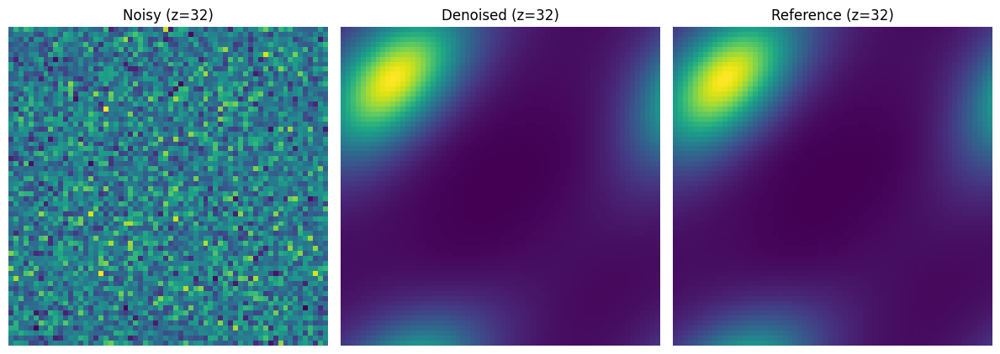


 Denoised matrix saved to /pscratch/sd/k/kberard/SCGSR/Data/diamond_1x1x1_bfd/density_data/vmc_J2/density_tot_vmc_mean_0001310720_bm3d_denoised.npy
Sample 1310720 | bm3d JSD = 0.000102
here
(64, 64, 64, 3)

>>> Evaluation Metrics 2D
2-norm (noisy vs ref):     0.4100
2-norm (denoised vs ref): 0.0006
JSD   (noisy vs ref):     5.773285
JSD   (denoised vs ref):  0.000101

>>> Evaluation Metrics 3D
2-norm (noisy vs ref):     0.4100
2-norm (denoised vs ref): 0.0006
JSD   (noisy vs ref):     5.773285
JSD   (denoised vs ref):  0.000101


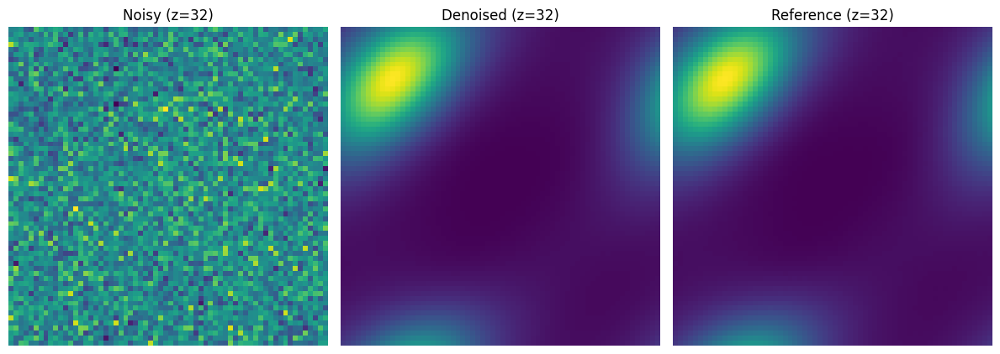


 Denoised matrix saved to /pscratch/sd/k/kberard/SCGSR/Data/diamond_1x1x1_bfd/density_data/vmc_J2/density_tot_vmc_mean_0001720320_bm3d_denoised.npy
Sample 1720320 | bm3d JSD = 0.000101
here
(64, 64, 64, 3)

>>> Evaluation Metrics 2D
2-norm (noisy vs ref):     0.3366
2-norm (denoised vs ref): 0.0006
JSD   (noisy vs ref):     4.829274
JSD   (denoised vs ref):  0.000100

>>> Evaluation Metrics 3D
2-norm (noisy vs ref):     0.3366
2-norm (denoised vs ref): 0.0006
JSD   (noisy vs ref):     4.829274
JSD   (denoised vs ref):  0.000100


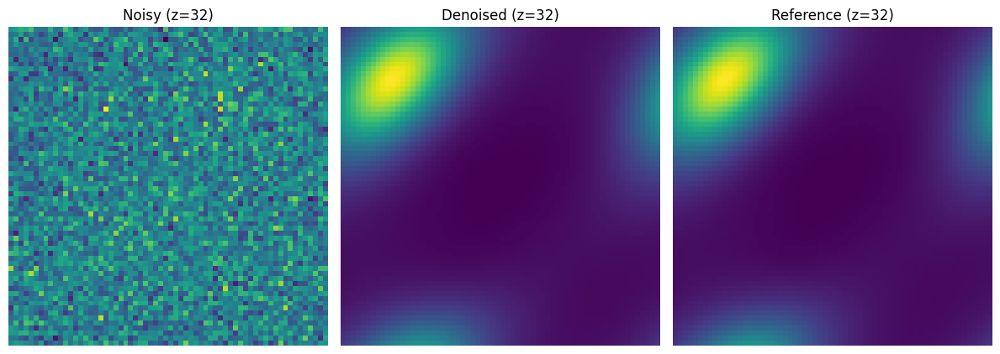


 Denoised matrix saved to /pscratch/sd/k/kberard/SCGSR/Data/diamond_1x1x1_bfd/density_data/vmc_J2/density_tot_vmc_mean_0002621440_bm3d_denoised.npy
Sample 2621440 | bm3d JSD = 0.000100
here
(64, 64, 64, 3)

>>> Evaluation Metrics 2D
2-norm (noisy vs ref):     0.2957
2-norm (denoised vs ref): 0.0006
JSD   (noisy vs ref):     4.214717
JSD   (denoised vs ref):  0.000099

>>> Evaluation Metrics 3D
2-norm (noisy vs ref):     0.2957
2-norm (denoised vs ref): 0.0006
JSD   (noisy vs ref):     4.214717
JSD   (denoised vs ref):  0.000099


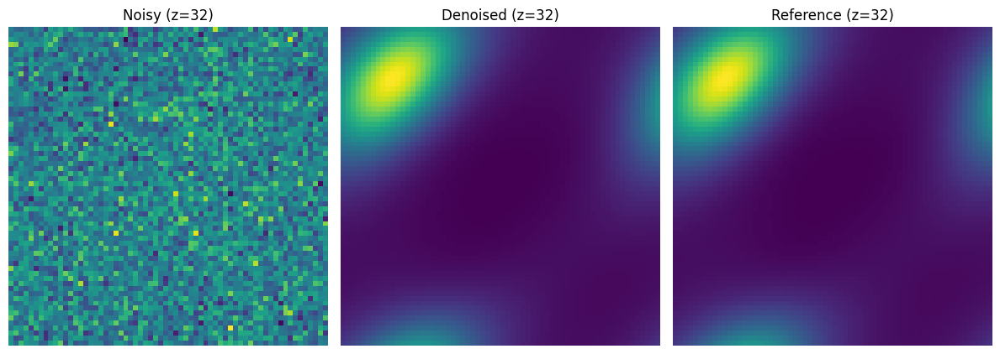


 Denoised matrix saved to /pscratch/sd/k/kberard/SCGSR/Data/diamond_1x1x1_bfd/density_data/vmc_J2/density_tot_vmc_mean_0003440640_bm3d_denoised.npy
Sample 3440640 | bm3d JSD = 0.000099
here
(64, 64, 64, 3)

>>> Evaluation Metrics 2D
2-norm (noisy vs ref):     0.2466
2-norm (denoised vs ref): 0.0006
JSD   (noisy vs ref):     3.612919
JSD   (denoised vs ref):  0.000098

>>> Evaluation Metrics 3D
2-norm (noisy vs ref):     0.2466
2-norm (denoised vs ref): 0.0006
JSD   (noisy vs ref):     3.612919
JSD   (denoised vs ref):  0.000098


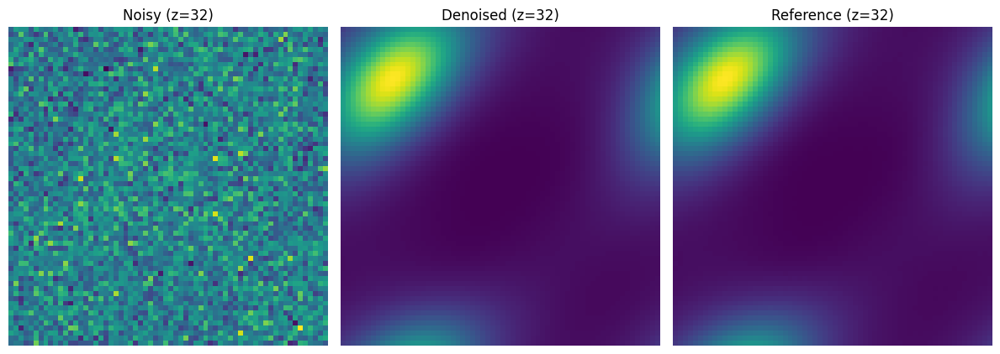


 Denoised matrix saved to /pscratch/sd/k/kberard/SCGSR/Data/diamond_1x1x1_bfd/density_data/vmc_J2/density_tot_vmc_mean_0005160960_bm3d_denoised.npy
Sample 5160960 | bm3d JSD = 0.000098
here
(64, 64, 64, 3)

>>> Evaluation Metrics 2D
2-norm (noisy vs ref):     0.2450
2-norm (denoised vs ref): 0.0006
JSD   (noisy vs ref):     3.572269
JSD   (denoised vs ref):  0.000098

>>> Evaluation Metrics 3D
2-norm (noisy vs ref):     0.2450
2-norm (denoised vs ref): 0.0006
JSD   (noisy vs ref):     3.572269
JSD   (denoised vs ref):  0.000098


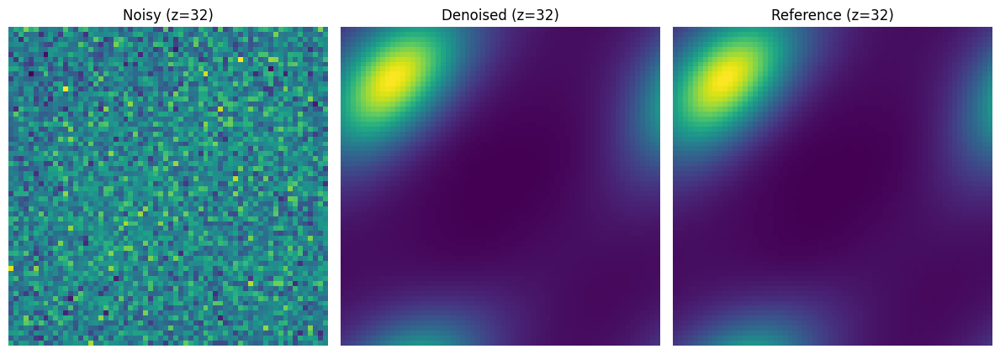


 Denoised matrix saved to /pscratch/sd/k/kberard/SCGSR/Data/diamond_1x1x1_bfd/density_data/vmc_J2/density_tot_vmc_mean_0005242880_bm3d_denoised.npy
Sample 5242880 | bm3d JSD = 0.000098
here
(64, 64, 64, 3)

>>> Evaluation Metrics 2D
2-norm (noisy vs ref):     0.2177
2-norm (denoised vs ref): 0.0006
JSD   (noisy vs ref):     3.210400
JSD   (denoised vs ref):  0.000097

>>> Evaluation Metrics 3D
2-norm (noisy vs ref):     0.2177
2-norm (denoised vs ref): 0.0006
JSD   (noisy vs ref):     3.210400
JSD   (denoised vs ref):  0.000097


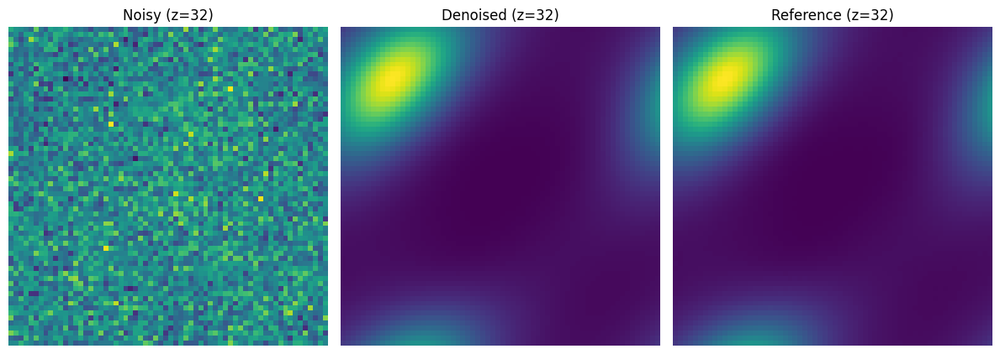


 Denoised matrix saved to /pscratch/sd/k/kberard/SCGSR/Data/diamond_1x1x1_bfd/density_data/vmc_J2/density_tot_vmc_mean_0006881280_bm3d_denoised.npy
Sample 6881280 | bm3d JSD = 0.000097
here
(64, 64, 64, 3)

>>> Evaluation Metrics 2D
2-norm (noisy vs ref):     0.1835
2-norm (denoised vs ref): 0.0006
JSD   (noisy vs ref):     2.825540
JSD   (denoised vs ref):  0.000095

>>> Evaluation Metrics 3D
2-norm (noisy vs ref):     0.1835
2-norm (denoised vs ref): 0.0006
JSD   (noisy vs ref):     2.825540
JSD   (denoised vs ref):  0.000095


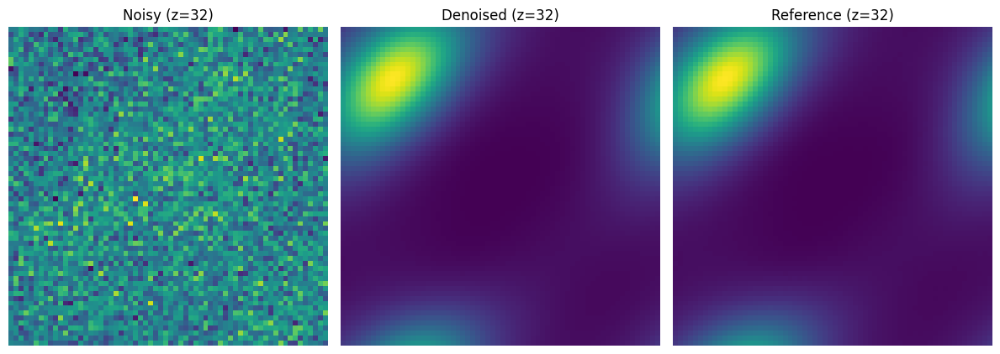


 Denoised matrix saved to /pscratch/sd/k/kberard/SCGSR/Data/diamond_1x1x1_bfd/density_data/vmc_J2/density_tot_vmc_mean_0010321920_bm3d_denoised.npy
Sample 10321920 | bm3d JSD = 0.000095
here
(64, 64, 64, 3)

>>> Evaluation Metrics 2D
2-norm (noisy vs ref):     0.1826
2-norm (denoised vs ref): 0.0006
JSD   (noisy vs ref):     2.823653
JSD   (denoised vs ref):  0.000096

>>> Evaluation Metrics 3D
2-norm (noisy vs ref):     0.1826
2-norm (denoised vs ref): 0.0006
JSD   (noisy vs ref):     2.823653
JSD   (denoised vs ref):  0.000096


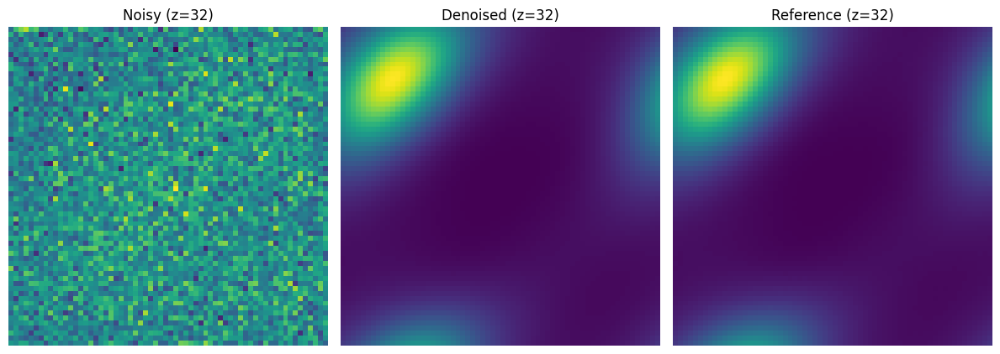


 Denoised matrix saved to /pscratch/sd/k/kberard/SCGSR/Data/diamond_1x1x1_bfd/density_data/vmc_J2/density_tot_vmc_mean_0010485760_bm3d_denoised.npy
Sample 10485760 | bm3d JSD = 0.000096
here
(64, 64, 64, 3)

>>> Evaluation Metrics 2D
2-norm (noisy vs ref):     0.1643
2-norm (denoised vs ref): 0.0006
JSD   (noisy vs ref):     2.590050
JSD   (denoised vs ref):  0.000095

>>> Evaluation Metrics 3D
2-norm (noisy vs ref):     0.1643
2-norm (denoised vs ref): 0.0006
JSD   (noisy vs ref):     2.590050
JSD   (denoised vs ref):  0.000095


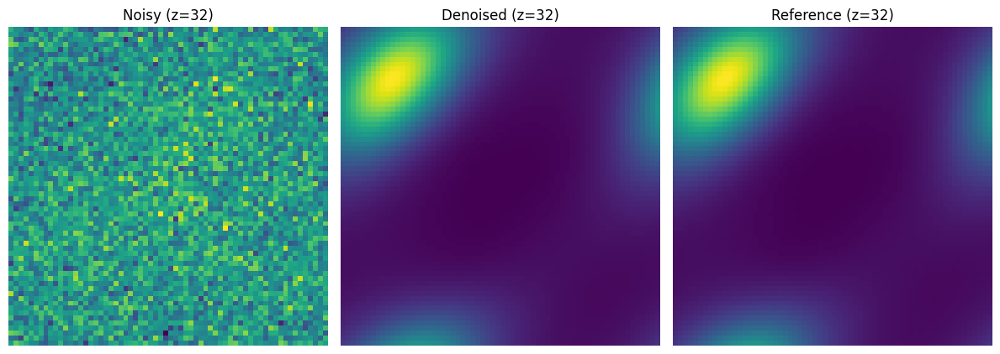


 Denoised matrix saved to /pscratch/sd/k/kberard/SCGSR/Data/diamond_1x1x1_bfd/density_data/vmc_J2/density_tot_vmc_mean_0013762560_bm3d_denoised.npy
Sample 13762560 | bm3d JSD = 0.000095
here
(64, 64, 64, 3)

>>> Evaluation Metrics 2D
2-norm (noisy vs ref):     0.1421
2-norm (denoised vs ref): 0.0006
JSD   (noisy vs ref):     2.342830
JSD   (denoised vs ref):  0.000094

>>> Evaluation Metrics 3D
2-norm (noisy vs ref):     0.1421
2-norm (denoised vs ref): 0.0006
JSD   (noisy vs ref):     2.342830
JSD   (denoised vs ref):  0.000094


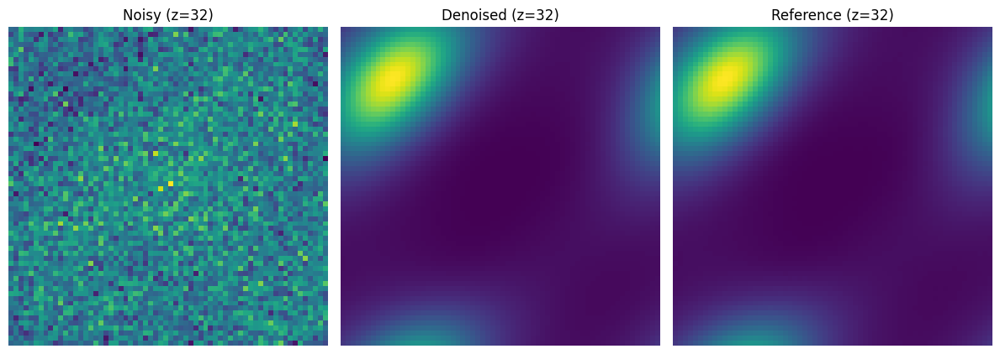


 Denoised matrix saved to /pscratch/sd/k/kberard/SCGSR/Data/diamond_1x1x1_bfd/density_data/vmc_J2/density_tot_vmc_mean_0020643840_bm3d_denoised.npy
Sample 20643840 | bm3d JSD = 0.000094
here
(64, 64, 64, 3)

>>> Evaluation Metrics 2D
2-norm (noisy vs ref):     0.1298
2-norm (denoised vs ref): 0.0006
JSD   (noisy vs ref):     2.207554
JSD   (denoised vs ref):  0.000092

>>> Evaluation Metrics 3D
2-norm (noisy vs ref):     0.1298
2-norm (denoised vs ref): 0.0006
JSD   (noisy vs ref):     2.207554
JSD   (denoised vs ref):  0.000092


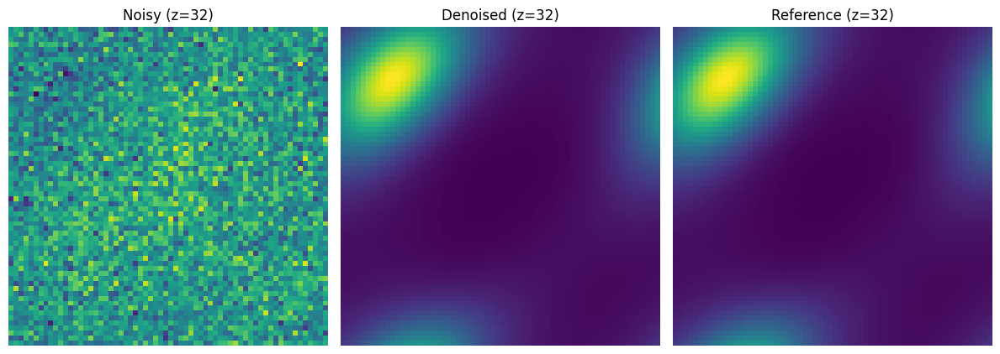


 Denoised matrix saved to /pscratch/sd/k/kberard/SCGSR/Data/diamond_1x1x1_bfd/density_data/vmc_J2/density_tot_vmc_mean_0027525120_bm3d_denoised.npy
Sample 27525120 | bm3d JSD = 0.000092
here
(64, 64, 64, 3)

>>> Evaluation Metrics 2D
2-norm (noisy vs ref):     0.1159
2-norm (denoised vs ref): 0.0006
JSD   (noisy vs ref):     2.052071
JSD   (denoised vs ref):  0.000091

>>> Evaluation Metrics 3D
2-norm (noisy vs ref):     0.1159
2-norm (denoised vs ref): 0.0006
JSD   (noisy vs ref):     2.052071
JSD   (denoised vs ref):  0.000091


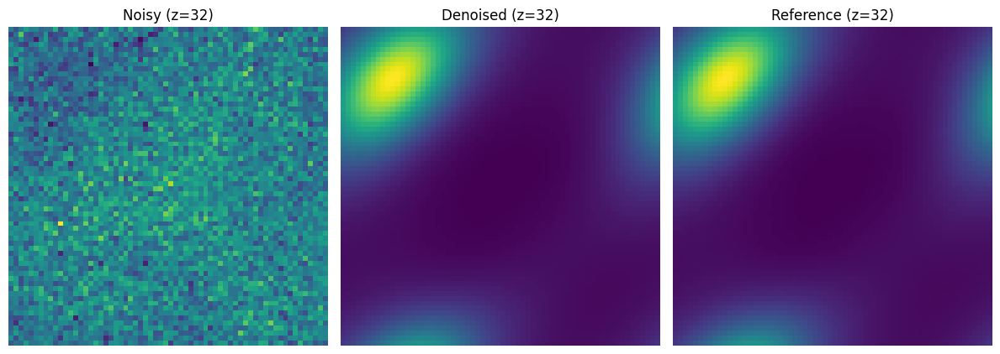


 Denoised matrix saved to /pscratch/sd/k/kberard/SCGSR/Data/diamond_1x1x1_bfd/density_data/vmc_J2/density_tot_vmc_mean_0041287680_bm3d_denoised.npy
Sample 41287680 | bm3d JSD = 0.000091
here
(64, 64, 64, 3)

>>> Evaluation Metrics 2D
2-norm (noisy vs ref):     0.1086
2-norm (denoised vs ref): 0.0006
JSD   (noisy vs ref):     1.961343
JSD   (denoised vs ref):  0.000089

>>> Evaluation Metrics 3D
2-norm (noisy vs ref):     0.1086
2-norm (denoised vs ref): 0.0006
JSD   (noisy vs ref):     1.961343
JSD   (denoised vs ref):  0.000089


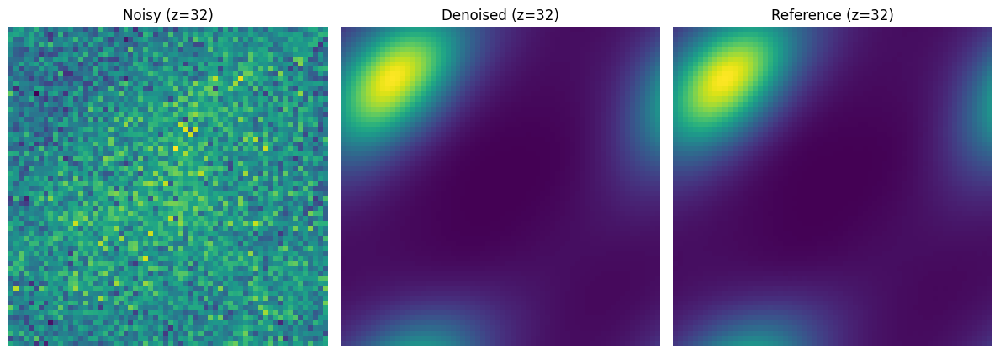


 Denoised matrix saved to /pscratch/sd/k/kberard/SCGSR/Data/diamond_1x1x1_bfd/density_data/vmc_J2/density_tot_vmc_mean_0055050240_bm3d_denoised.npy
Sample 55050240 | bm3d JSD = 0.000089
here
(64, 64, 64, 3)

>>> Evaluation Metrics 2D
2-norm (noisy vs ref):     0.1004
2-norm (denoised vs ref): 0.0006
JSD   (noisy vs ref):     1.854723
JSD   (denoised vs ref):  0.000088

>>> Evaluation Metrics 3D
2-norm (noisy vs ref):     0.1004
2-norm (denoised vs ref): 0.0006
JSD   (noisy vs ref):     1.854723
JSD   (denoised vs ref):  0.000088


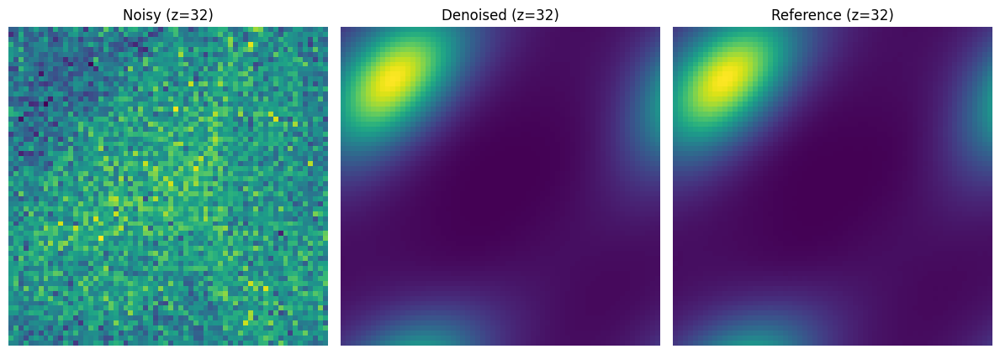


 Denoised matrix saved to /pscratch/sd/k/kberard/SCGSR/Data/diamond_1x1x1_bfd/density_data/vmc_J2/density_tot_vmc_mean_0082575360_bm3d_denoised.npy
Sample 82575360 | bm3d JSD = 0.000088
here
(64, 64, 64, 3)

>>> Evaluation Metrics 2D
2-norm (noisy vs ref):     0.0961
2-norm (denoised vs ref): 0.0006
JSD   (noisy vs ref):     1.797909
JSD   (denoised vs ref):  0.000087

>>> Evaluation Metrics 3D
2-norm (noisy vs ref):     0.0961
2-norm (denoised vs ref): 0.0006
JSD   (noisy vs ref):     1.797909
JSD   (denoised vs ref):  0.000087


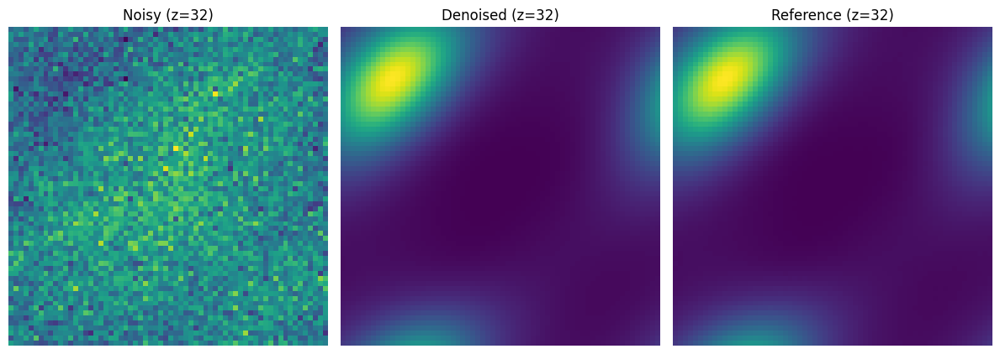


 Denoised matrix saved to /pscratch/sd/k/kberard/SCGSR/Data/diamond_1x1x1_bfd/density_data/vmc_J2/density_tot_vmc_mean_0110100480_bm3d_denoised.npy
Sample 110100480 | bm3d JSD = 0.000087
here
(64, 64, 64, 3)

>>> Evaluation Metrics 2D
2-norm (noisy vs ref):     0.0914
2-norm (denoised vs ref): 0.0006
JSD   (noisy vs ref):     1.720404
JSD   (denoised vs ref):  0.000085

>>> Evaluation Metrics 3D
2-norm (noisy vs ref):     0.0914
2-norm (denoised vs ref): 0.0006
JSD   (noisy vs ref):     1.720404
JSD   (denoised vs ref):  0.000085


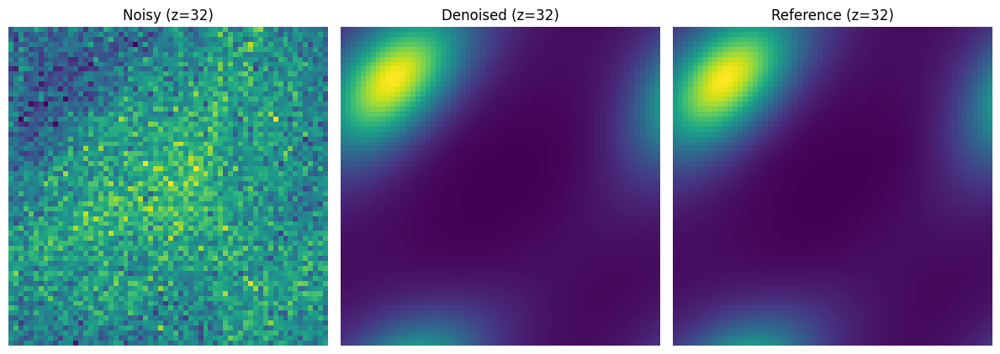


 Denoised matrix saved to /pscratch/sd/k/kberard/SCGSR/Data/diamond_1x1x1_bfd/density_data/vmc_J2/density_tot_vmc_mean_0165150720_bm3d_denoised.npy
Sample 165150720 | bm3d JSD = 0.000085
here
(64, 64, 64, 3)

>>> Evaluation Metrics 2D
2-norm (noisy vs ref):     0.0891
2-norm (denoised vs ref): 0.0006
JSD   (noisy vs ref):     1.684438
JSD   (denoised vs ref):  0.000084

>>> Evaluation Metrics 3D
2-norm (noisy vs ref):     0.0891
2-norm (denoised vs ref): 0.0006
JSD   (noisy vs ref):     1.684438
JSD   (denoised vs ref):  0.000084


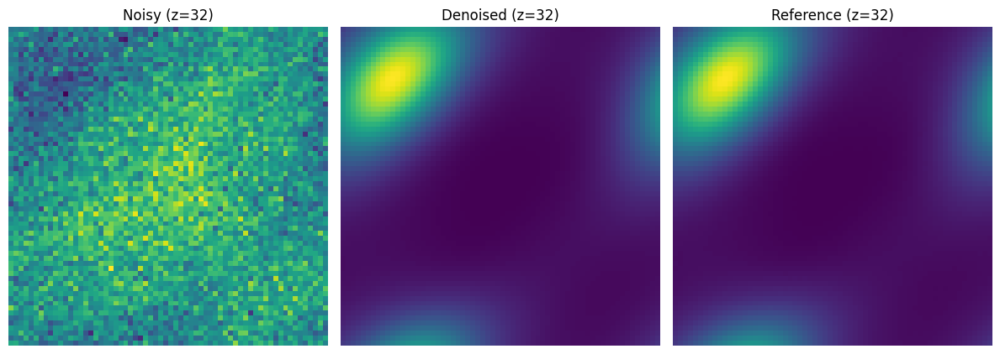


 Denoised matrix saved to /pscratch/sd/k/kberard/SCGSR/Data/diamond_1x1x1_bfd/density_data/vmc_J2/density_tot_vmc_mean_0220200960_bm3d_denoised.npy
Sample 220200960 | bm3d JSD = 0.000084
here
(64, 64, 64, 3)

>>> Evaluation Metrics 2D
2-norm (noisy vs ref):     0.0867
2-norm (denoised vs ref): 0.0005
JSD   (noisy vs ref):     1.640221
JSD   (denoised vs ref):  0.000082

>>> Evaluation Metrics 3D
2-norm (noisy vs ref):     0.0867
2-norm (denoised vs ref): 0.0005
JSD   (noisy vs ref):     1.640221
JSD   (denoised vs ref):  0.000082


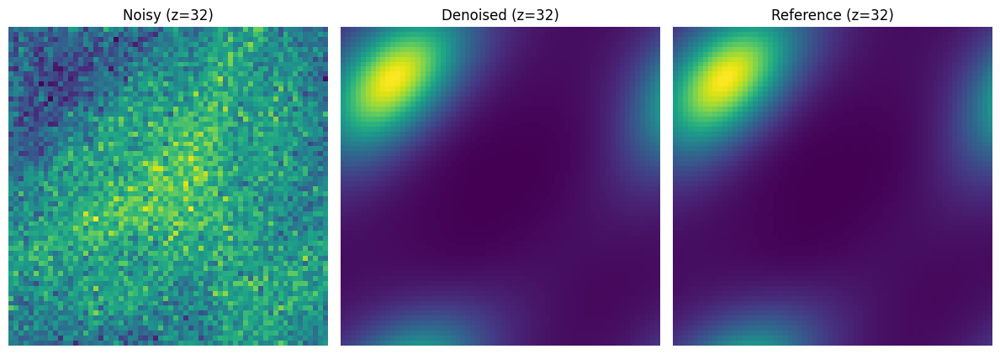


 Denoised matrix saved to /pscratch/sd/k/kberard/SCGSR/Data/diamond_1x1x1_bfd/density_data/vmc_J2/density_tot_vmc_mean_0330301440_bm3d_denoised.npy
Sample 330301440 | bm3d JSD = 0.000082
here
(64, 64, 64, 3)

>>> Evaluation Metrics 2D
2-norm (noisy vs ref):     0.0855
2-norm (denoised vs ref): 0.0005
JSD   (noisy vs ref):     1.616228
JSD   (denoised vs ref):  0.000081

>>> Evaluation Metrics 3D
2-norm (noisy vs ref):     0.0855
2-norm (denoised vs ref): 0.0005
JSD   (noisy vs ref):     1.616228
JSD   (denoised vs ref):  0.000081


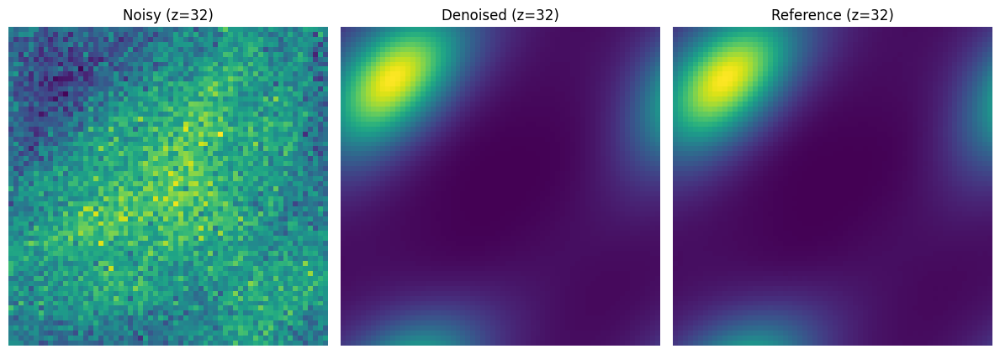


 Denoised matrix saved to /pscratch/sd/k/kberard/SCGSR/Data/diamond_1x1x1_bfd/density_data/vmc_J2/density_tot_vmc_mean_0440401920_bm3d_denoised.npy
Sample 440401920 | bm3d JSD = 0.000081
here
(64, 64, 64, 3)

>>> Evaluation Metrics 2D
2-norm (noisy vs ref):     0.0843
2-norm (denoised vs ref): 0.0005
JSD   (noisy vs ref):     1.591536
JSD   (denoised vs ref):  0.000080

>>> Evaluation Metrics 3D
2-norm (noisy vs ref):     0.0843
2-norm (denoised vs ref): 0.0005
JSD   (noisy vs ref):     1.591536
JSD   (denoised vs ref):  0.000080


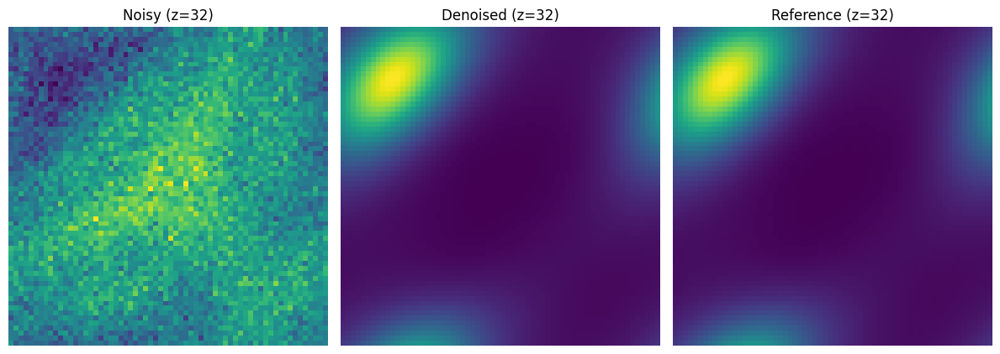


 Denoised matrix saved to /pscratch/sd/k/kberard/SCGSR/Data/diamond_1x1x1_bfd/density_data/vmc_J2/density_tot_vmc_mean_0660602880_bm3d_denoised.npy
Sample 660602880 | bm3d JSD = 0.000080
here
(64, 64, 64, 3)

>>> Evaluation Metrics 2D
2-norm (noisy vs ref):     0.0830
2-norm (denoised vs ref): 0.0005
JSD   (noisy vs ref):     1.564715
JSD   (denoised vs ref):  0.000078

>>> Evaluation Metrics 3D
2-norm (noisy vs ref):     0.0830
2-norm (denoised vs ref): 0.0005
JSD   (noisy vs ref):     1.564715
JSD   (denoised vs ref):  0.000078


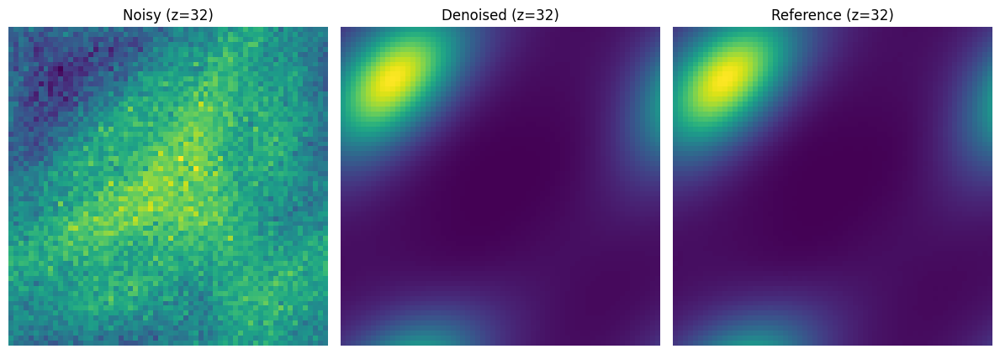


 Denoised matrix saved to /pscratch/sd/k/kberard/SCGSR/Data/diamond_1x1x1_bfd/density_data/vmc_J2/density_tot_vmc_mean_1321205760_bm3d_denoised.npy
Sample 1321205760 | bm3d JSD = 0.000078
here
(64, 64, 64, 3)

>>> Evaluation Metrics 2D
2-norm (noisy vs ref):     0.0824
2-norm (denoised vs ref): 0.0005
JSD   (noisy vs ref):     1.554853
JSD   (denoised vs ref):  0.000077

>>> Evaluation Metrics 3D
2-norm (noisy vs ref):     0.0824
2-norm (denoised vs ref): 0.0005
JSD   (noisy vs ref):     1.554853
JSD   (denoised vs ref):  0.000077


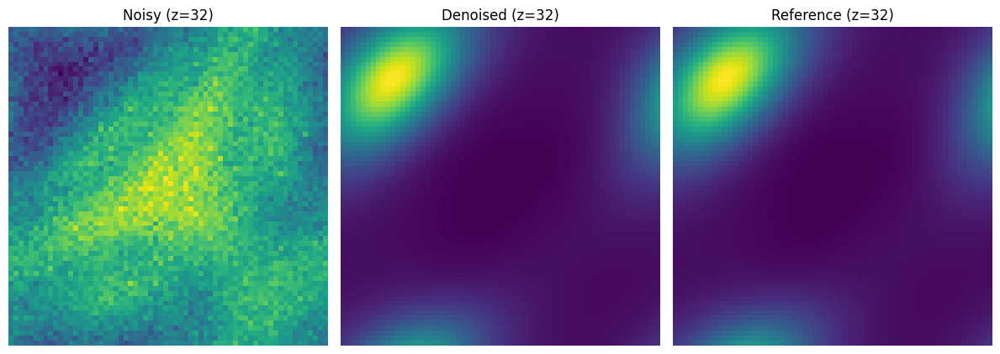


 Denoised matrix saved to /pscratch/sd/k/kberard/SCGSR/Data/diamond_1x1x1_bfd/density_data/vmc_J2/density_tot_vmc_mean_2642411520_bm3d_denoised.npy
Sample 2642411520 | bm3d JSD = 0.000077
here
(64, 64, 64, 3)

>>> Evaluation Metrics 2D
2-norm (noisy vs ref):     0.0820
2-norm (denoised vs ref): 0.0005
JSD   (noisy vs ref):     1.549535
JSD   (denoised vs ref):  0.000076

>>> Evaluation Metrics 3D
2-norm (noisy vs ref):     0.0820
2-norm (denoised vs ref): 0.0005
JSD   (noisy vs ref):     1.549535
JSD   (denoised vs ref):  0.000076


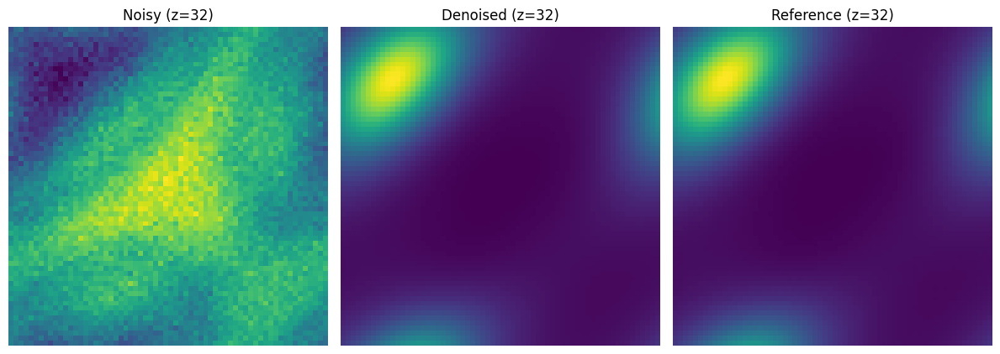


 Denoised matrix saved to /pscratch/sd/k/kberard/SCGSR/Data/diamond_1x1x1_bfd/density_data/vmc_J2/density_tot_vmc_mean_5284823040_bm3d_denoised.npy
Sample 5284823040 | bm3d JSD = 0.000076


In [22]:
import glob
import os
import re
import numpy as np
import matplotlib.pyplot as plt
import torch
import h5py

# ================= CPU-loading patch =================
_original_torch_load = torch.load
def torch_load_cpu(*args, **kwargs):
    if 'map_location' not in kwargs:
        kwargs['map_location'] = torch.device('cpu')
    return _original_torch_load(*args, **kwargs)
torch.load = torch_load_cpu

# ================= Paths & Models =================
base_dir = "/pscratch/sd/k/kberard/SCGSR/Data/diamond_1x1x1_bfd/density_data/vmc_J2"
ref_path = os.path.join(base_dir, "density_tot_ref_mean.h5")
noisy_files = sorted(glob.glob(os.path.join(base_dir, "density_tot_vmc_mean*.h5")))

models = [
    'scunet_trained',
    'scunet_pre',
    'scunet_ft',
    'nature',
    'CAE',
    'bm3d'
]

print(f"Found {len(noisy_files)} noisy files.")

# ================= Reference JSD =================
results_ref = []
for noisy_path in noisy_files:
    match = re.search(r"(\d+)\.h5$", noisy_path)
    if not match:
        continue
    sample_num = int(match.group(1))

    with h5py.File(ref_path, 'r') as file:
        ref_d = file['density'][:]
    with h5py.File(noisy_path, 'r') as file:
        test_d = file['density'][:]

    jsd = D_JS(ref_d, test_d)
    results_ref.append((sample_num, jsd))

results_array_ref = np.array(sorted(results_ref, key=lambda x: x[0]))

# ================= Run models =================
results_dict = {model: [] for model in models}

for model_name in models:
    print(f"\n=== Running model: {model_name} ===")

    for noisy_path in noisy_files:
        match = re.search(r"(\d+)\.h5$", noisy_path)
        if not match:
            continue
        sample_num = int(match.group(1))

        output_file = os.path.splitext(os.path.basename(noisy_path))[0] + f"_{model_name}_denoised.npy"
        output_path = os.path.join(base_dir, output_file)

        denoised_den, jsd = run_denoising_pipeline(
            noisy_path,
            ref_path,
            model_name,
            output_file=output_path
        )

        results_dict[model_name].append((sample_num, jsd))
        print(f"Sample {sample_num} | {model_name} JSD = {jsd:.6f}")


In [24]:
import pandas as pd
df = pd.DataFrame(results_dict)
df.to_csv('Blob_jsd_results_Full_blob.csv', index=False)

print("Dictionary saved to results.csv")

Dictionary saved to results.csv


In [25]:
# ==== Reference JSD ====
base_dir = "/pscratch/sd/k/kberard/SCGSR/Data/diamond_1x1x1_bfd/density_data/vmc_J2"
ref_path = os.path.join(base_dir, "density_tot_ref_mean.h5")
results_ref = []
with h5py.File(ref_path, 'r') as file:
    ref_d_full = file['density'][:]

In [26]:
with h5py.File('/global/u2/k/kberard/SCGSR/Research/Diamond/Data/density_tot_ref.h5', 'r') as file:
    dft_d = file['density'][:]
with h5py.File('/pscratch/sd/k/kberard/SCGSR/Data/diamond_1x1x1_bfd/density_data/vmc_J2/density_tot_ref_mean.h5', 'r') as file:
    VMC_ref = file['density'][:]
DFT_vs_VMC = D_JS(VMC_ref, dft_d)
print(DFT_vs_VMC)   

0.00012671965457473964


In [27]:
import glob
import os
import re
import numpy as np
import matplotlib.pyplot as plt
import torch
import h5py


# ================= Paths & Models =================
base_dir = "/pscratch/sd/k/kberard/SCGSR/Data/diamond_1x1x1_bfd/density_data/vmc_J2"
ref_path = os.path.join(base_dir, "density_tot_ref_mean.h5")

#print(ref_d)

noisy_files = sorted(glob.glob(os.path.join(base_dir, "density_tot_vmc_mean*.h5")))

print(f"Found {len(noisy_files)} noisy files.")





Found 33 noisy files.


In [28]:
import sys
import os
qmc_algo_path = os.path.abspath('/pscratch/sd/k/kberard/SCGSR/3D_VMC/Model_Train_dat/FFT_Jaron/qmc_algo_tools') 
dev = os.path.abspath('/pscratch/sd/k/kberard/SCGSR/3D_VMC/Model_Train_dat/FFT_Jaron/developer_tools') 

sys.path.insert(0, qmc_algo_path) 
sys.path.insert(0, dev) 

#! /usr/bin/env python3

#from qmc_algo_tools.density_data import DensityData
from qmc_algo_tools.density_denoise import DensityFourierFilterErrorCeil
#from qmc_algo_tools.density_denoise import D_JS


def div_js_dens(d1,d2):
    return D_JS(d1,d2)

model_results_FFT = []
for noisy_path in noisy_files:
    match = re.search(r"(\d+)\.h5$", noisy_path)
    if not match:
        continue
    sample_num = int(match.group(1))

    with h5py.File(noisy_path, 'r') as file:
        test_d = file['density'][:]
    dm = DensityFourierFilterErrorCeil(density_ref= ref_d_full,filter_mode='augment')

    d_denoised = dm.denoise(test_d)
    jsd_denoised = D_JS(d_denoised, VMC_ref)
    model_results_FFT.append((sample_num, jsd_denoised))
    
print(model_results_FFT)

[(10240, np.float64(0.0004958021516458999)), (20480, np.float64(0.00035785791120515126)), (40960, np.float64(0.00034091570417411486)), (81920, np.float64(0.00016652200556377863)), (163840, np.float64(0.00016514577009432493)), (327680, np.float64(0.00012410201778579536)), (430080, np.float64(0.00011393499717519147)), (655360, np.float64(5.704556673483544e-05)), (860160, np.float64(3.832958980866265e-05)), (1310720, np.float64(3.73399720451121e-05)), (1720320, np.float64(2.9594738827180698e-05)), (2621440, np.float64(2.164391797361874e-05)), (3440640, np.float64(1.994740403861775e-05)), (5160960, np.float64(1.46032036374252e-05)), (5242880, np.float64(1.4118056596091955e-05)), (6881280, np.float64(9.81757400710268e-06)), (10321920, np.float64(7.711870693292213e-06)), (10485760, np.float64(7.051194486897614e-06)), (13762560, np.float64(5.244409777187951e-06)), (20643840, np.float64(4.551259923227013e-06)), (27525120, np.float64(3.3201592676747415e-06)), (41287680, np.float64(2.44839415275

In [29]:
import sys
import os
import h5py
qmc_algo_path = os.path.abspath('/pscratch/sd/k/kberard/SCGSR/3D_VMC/Model_Train_dat/FFT_Jaron/qmc_algo_tools') 
dev = os.path.abspath('/pscratch/sd/k/kberard/SCGSR/3D_VMC/Model_Train_dat/FFT_Jaron/developer_tools') 

sys.path.insert(0, qmc_algo_path) 
sys.path.insert(0, dev) 

ref_path = '/global/u2/k/kberard/SCGSR/Research/Diamond/Data/density_tot_ref.h5' #DFT
with h5py.File('/global/u2/k/kberard/SCGSR/Research/Diamond/Data/density_tot_ref.h5', 'r') as file:
    #print("Keys: %s" % file.keys())
    ref_d = file['density'][:]

#! /usr/bin/env python3

#from qmc_algo_tools.density_data import DensityData
from qmc_algo_tools.density_denoise import DensityFourierFilterErrorCeil
#from qmc_algo_tools.density_denoise import D_JS


model_results_FFT = []
for noisy_path in noisy_files:
    match = re.search(r"(\d+)\.h5$", noisy_path)
    if not match:
        continue
    sample_num = int(match.group(1))
    with h5py.File(ref_path, 'r') as file:
        ref_d = file['density'][:]

    with h5py.File(noisy_path, 'r') as file:
        test_d = file['density'][:]
    dm = DensityFourierFilterErrorCeil(density_ref= ref_d,filter_mode='augment')

    d_denoised = dm.denoise(test_d)
    jsd_denoised = D_JS(d_denoised, VMC_ref)
    model_results_FFT.append((sample_num, jsd_denoised))
    
print(model_results_FFT)

[(10240, np.float64(0.0007716768226325421)), (20480, np.float64(0.00037949244095305054)), (40960, np.float64(0.000376594842200277)), (81920, np.float64(0.00018202493991624903)), (163840, np.float64(0.00017021310794393946)), (327680, np.float64(0.00012433696291303786)), (430080, np.float64(6.943723931875953e-05)), (655360, np.float64(5.799084731261237e-05)), (860160, np.float64(5.456354656463819e-05)), (1310720, np.float64(3.727165366458061e-05)), (1720320, np.float64(3.258676221468244e-05)), (2621440, np.float64(2.3595214312532686e-05)), (3440640, np.float64(1.8696064697238217e-05)), (5160960, np.float64(9.42484232231972e-06)), (5242880, np.float64(1.039294366000203e-05)), (6881280, np.float64(1.0892102634738487e-05)), (10321920, np.float64(6.023249811596284e-06)), (10485760, np.float64(5.93666518081904e-06)), (13762560, np.float64(6.466678428983334e-06)), (20643840, np.float64(4.444567479979796e-06)), (27525120, np.float64(4.5848401418028495e-06)), (41287680, np.float64(2.938963545350

In [30]:

with h5py.File('/global/u2/k/kberard/SCGSR/Research/Diamond/Data/density_tot_ref.h5', 'r') as file:
    dft_d = file['density'][:]
with h5py.File('/pscratch/sd/k/kberard/SCGSR/Data/diamond_1x1x1_bfd/density_data/vmc_J2/density_tot_ref_mean.h5', 'r') as file:
    VMC_ref = file['density'][:]
DFT_vs_VMC = D_JS(VMC_ref, dft_d)
print(DFT_vs_VMC)   


0.00012671965457473964


<Figure size 800x500 with 0 Axes>

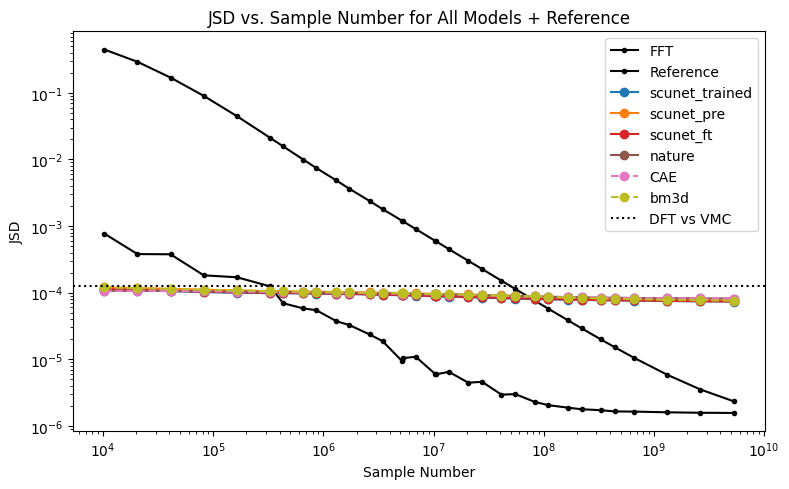

In [31]:
# ================= Plot =================
import logging
logging.getLogger('matplotlib').setLevel(logging.WARNING)
plt.figure(figsize=(8, 5))
x_values, y_values = zip(*model_results_FFT)
# === Plot ===
logging.getLogger('matplotlib').setLevel(logging.WARNING)
plt.figure(figsize=(8, 5))

plt.loglog(x_values, y_values,
           marker=".",             # Dot markers
           linestyle="-",          # Solid connecting line
           color="black", 
           label="FFT")
colors = plt.cm.tab10(np.linspace(0, 1, len(models) + 1))  # +1 for ref

# Plot reference first
plt.loglog(results_array_ref[:, 0], results_array_ref[:, 1],
           marker=".", linestyle="-", color="black", label="Reference")

# Plot each model
for color, model_name in zip(colors, models):
    results_array = np.array(sorted(results_dict[model_name], key=lambda x: x[0]))
    linestyle = "--" if model_name in ["CAE", "bm3d"] else "-"  # dotted for some
    plt.loglog(results_array[:, 0], results_array[:, 1],
               marker="o", linestyle=linestyle, label=model_name, color=color)

plt.xlabel("Sample Number")
plt.ylabel("JSD")
plt.axhline(DFT_vs_VMC, color="black", linestyle=":", label="DFT vs VMC")
plt.title("JSD vs. Sample Number for All Models + Reference")
plt.legend()
plt.tight_layout()
plt.show()


In [32]:
print("here")

here


In [33]:
import numpy as np

# Convert dict-of-pairs into dict-of-arrays so it saves cleanly
results_dict_arrays = {
    name: np.array(sorted(results_dict[name], key=lambda x: x[0]), dtype=float)
    for name in models
}

np.savez_compressed(
    "jsd_plot_data_full_range_blob.npz",
    model_results_FFT=np.array(model_results_FFT, dtype=float),
    results_array_ref=np.array(results_array_ref, dtype=float),
    models=np.array(models),
    DFT_vs_VMC=float(DFT_vs_VMC),
    **{f"results_{k}": v for k, v in results_dict_arrays.items()}
)


In [1]:
import numpy as np
import matplotlib.pyplot as plt
import logging
data = np.load("jsd_plot_data_full_range_blob.npz", allow_pickle=True)

model_results_FFT = [tuple(x) for x in data["model_results_FFT"]]
results_array_ref = data["results_array_ref"]
models = list(data["models"])
DFT_vs_VMC = float(data["DFT_vs_VMC"])

results_dict = {m: data[f"results_{m}"] for m in models}  # each is an (N,2) array

# Reconstruct variables
model_results_FFT = [tuple(x) for x in data["model_results_FFT"]]
results_array_ref = data["results_array_ref"]
models = list(data["models"])
DFT_vs_VMC = float(data["DFT_vs_VMC"])

# Rebuild results_dict (each entry is (N,2))
results_dict = {m: data[f"results_{m}"] for m in models}



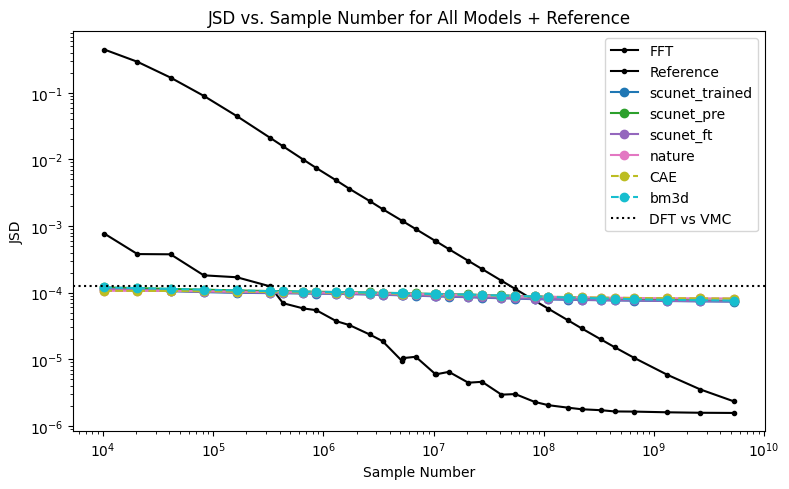

In [2]:
# ================= Plot =================
logging.getLogger('matplotlib').setLevel(logging.WARNING)

plt.figure(figsize=(8, 5))

# ---- FFT curve ----
x_values, y_values = zip(*model_results_FFT)
plt.loglog(
    x_values,
    y_values,
    marker=".",
    linestyle="-",
    color="black",
    label="FFT",
)

# ---- Reference curve ----
plt.loglog(
    results_array_ref[:, 0],
    results_array_ref[:, 1],
    marker=".",
    linestyle="-",
    color="black",
    label="Reference",
)

# ---- Model curves ----
colors = plt.cm.tab10(np.linspace(0, 1, len(models)))

for color, model_name in zip(colors, models):
    results_array = results_dict[model_name]

    # Ensure sorted by sample number
    results_array = results_array[np.argsort(results_array[:, 0])]

    linestyle = "--" if model_name in ["CAE", "bm3d"] else "-"

    plt.loglog(
        results_array[:, 0],
        results_array[:, 1],
        marker="o",
        linestyle=linestyle,
        label=model_name,
        color=color,
    )

# ---- Decorations ----
plt.axhline(
    DFT_vs_VMC,
    color="black",
    linestyle=":",
    label="DFT vs VMC",
)

plt.xlabel("Sample Number")
plt.ylabel("JSD")
plt.title("JSD vs. Sample Number for All Models + Reference")
plt.legend()
plt.tight_layout()
plt.show()


In [3]:
# To load it back later
loaded_data = np.load('/pscratch/sd/k/kberard/SCGSR/3D_VMC/Model_Train_dat/Transformed_Tests/JSD_data.npy', allow_pickle=True).item()
print(loaded_data.keys())

dict_keys(['scunet_pre', 'bm3d'])


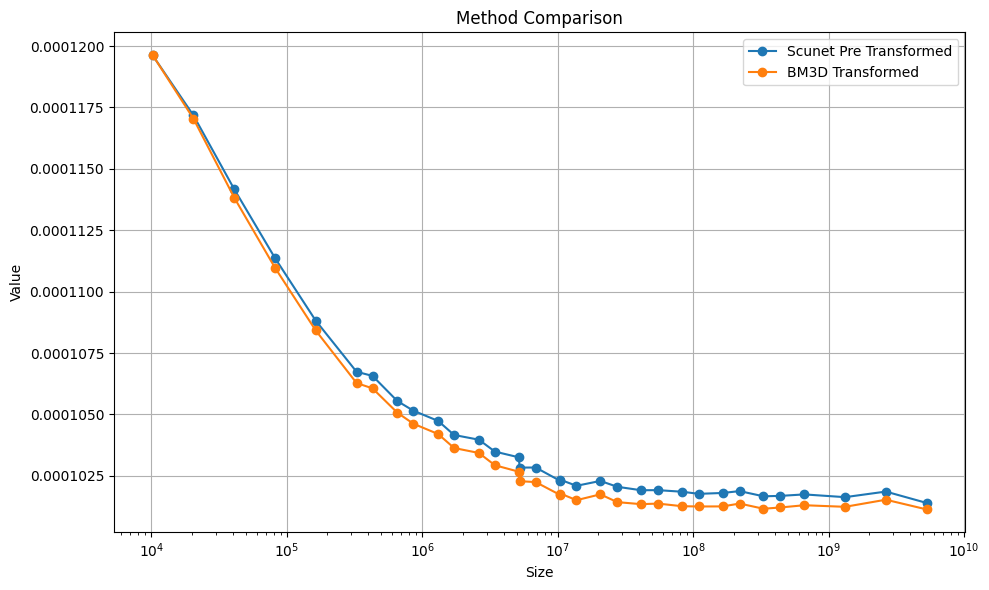

In [4]:
import matplotlib.pyplot as plt
import numpy as np



# Plot
plt.figure(figsize=(10,6))
for method, values in loaded_data.items():
    if method == 'scunet_pre':
        
        x = [v[0] for v in values]
        y = [v[1] for v in values]
        plt.plot(x, y, marker='o', label='Scunet Pre Transformed')
    else:
        x = [v[0] for v in values]
        y = [v[1] for v in values]
        plt.plot(x, y, marker='o', label='BM3D Transformed')


plt.xscale('log')
plt.xlabel('Size')
plt.ylabel('Value')
plt.title('Method Comparison')
plt.legend()
plt.grid(True)
plt.tight_layout()

# Save the figure
plt.savefig('method_comparison.png', dpi=300)
plt.show()


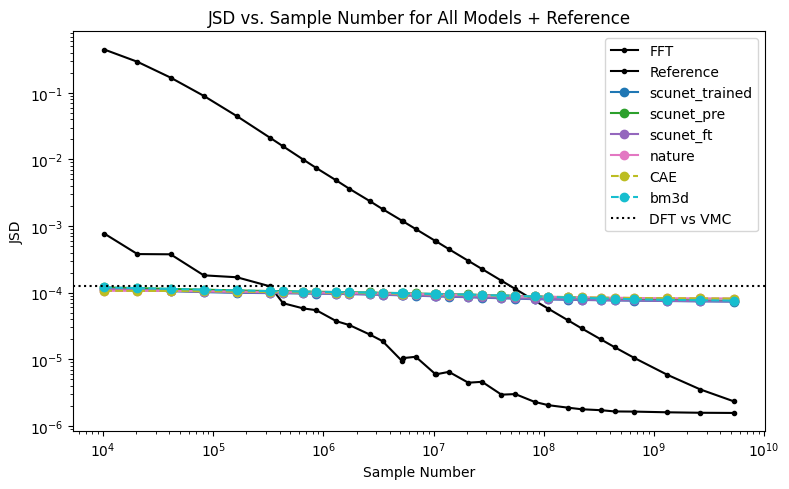

In [5]:
# ================= Plot =================
logging.getLogger('matplotlib').setLevel(logging.WARNING)

plt.figure(figsize=(8, 5))

# ---- FFT curve ----
x_values, y_values = zip(*model_results_FFT)
plt.loglog(
    x_values,
    y_values,
    marker=".",
    linestyle="-",
    color="black",
    label="FFT",
)

# ---- Reference curve ----
plt.loglog(
    results_array_ref[:, 0],
    results_array_ref[:, 1],
    marker=".",
    linestyle="-",
    color="black",
    label="Reference",
)

# ---- Model curves ----
colors = plt.cm.tab10(np.linspace(0, 1, len(models)))

for color, model_name in zip(colors, models):
    results_array = results_dict[model_name]

    # Ensure sorted by sample number
    results_array = results_array[np.argsort(results_array[:, 0])]

    linestyle = "--" if model_name in ["CAE", "bm3d"] else "-"

    plt.loglog(
        results_array[:, 0],
        results_array[:, 1],
        marker="o",
        linestyle=linestyle,
        label=model_name,
        color=color,
    )

# ---- Decorations ----
plt.axhline(
    DFT_vs_VMC,
    color="black",
    linestyle=":",
    label="DFT vs VMC",
)

plt.xlabel("Sample Number")
plt.ylabel("JSD")
plt.title("JSD vs. Sample Number for All Models + Reference")
plt.legend()
plt.tight_layout()
plt.show()


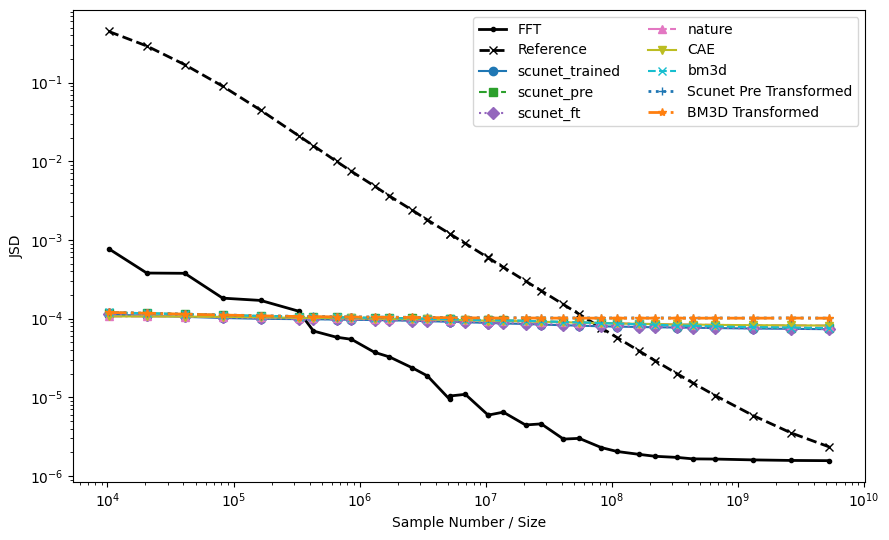

In [6]:
import matplotlib.pyplot as plt
import numpy as np
import logging

logging.getLogger('matplotlib').setLevel(logging.WARNING)

plt.figure(figsize=(9, 5.5))

# ---------------- Style pools ----------------
markers = ["o", "s", "D", "^", "v", "x", "+", "*", "P", "<", ">"]
linestyles = ["-", "--", ":", "-."]

marker_idx = 0
line_idx = 0

# ---------------- FFT ----------------
x_fft, y_fft = zip(*model_results_FFT)
plt.loglog(
    x_fft,
    y_fft,
    marker=".",
    linestyle="-",
    color="black",
    linewidth=2,
    label="FFT",
)

# ---------------- Reference ----------------
plt.loglog(
    results_array_ref[:, 0],
    results_array_ref[:, 1],
    marker="x",
    linestyle="--",
    color="black",
    linewidth=2,
    label="Reference",
)

# ---------------- Main ML models ----------------
colors = plt.cm.tab10(np.linspace(0, 1, len(models)))

for color, model_name in zip(colors, models):
    results_array = results_dict[model_name]
    results_array = results_array[np.argsort(results_array[:, 0])]

    plt.loglog(
        results_array[:, 0],
        results_array[:, 1],
        marker=markers[marker_idx % len(markers)],
        linestyle=linestyles[line_idx % len(linestyles)],
        color=color,
        label=model_name,
    )

    marker_idx += 1
    line_idx += 1

# ---------------- Transformed methods (from loaded_data) ----------------
for method, values in loaded_data.items():
    x = np.array([v[0] for v in values])
    y = np.array([v[1] for v in values])

    label = (
        "Scunet Pre Transformed"
        if method == "scunet_pre"
        else "BM3D Transformed"
    )

    plt.loglog(
        x,
        y,
        marker=markers[marker_idx % len(markers)],
        linestyle=linestyles[line_idx % len(linestyles)],
        linewidth=2,
        label=label,
    )

    marker_idx += 1
    line_idx += 1


# ---------------- Decorations ----------------
plt.xlabel("Sample Number / Size")
plt.ylabel("JSD")
plt.legend(ncol=2)
plt.tight_layout()
plt.show()


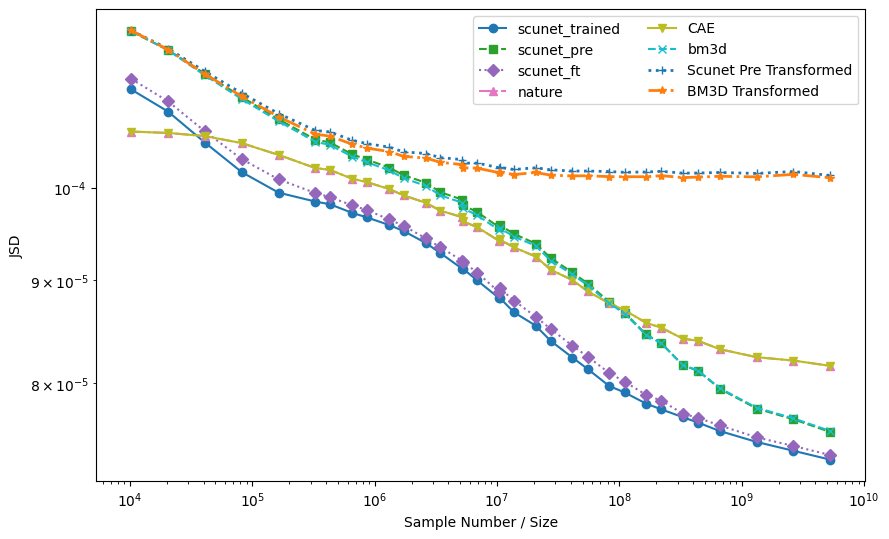

In [8]:
import matplotlib.pyplot as plt
import numpy as np
import logging

logging.getLogger('matplotlib').setLevel(logging.WARNING)

plt.figure(figsize=(9, 5.5))

# ---------------- Style pools ----------------
markers = ["o", "s", "D", "^", "v", "x", "+", "*", "P", "<", ">"]
linestyles = ["-", "--", ":", "-."]

marker_idx = 0
line_idx = 0


# ---------------- Main ML models ----------------
colors = plt.cm.tab10(np.linspace(0, 1, len(models)))

for color, model_name in zip(colors, models):
    results_array = results_dict[model_name]
    results_array = results_array[np.argsort(results_array[:, 0])]

    plt.loglog(
        results_array[:, 0],
        results_array[:, 1],
        marker=markers[marker_idx % len(markers)],
        linestyle=linestyles[line_idx % len(linestyles)],
        color=color,
        label=model_name,
    )

    marker_idx += 1
    line_idx += 1

# ---------------- Transformed methods (from loaded_data) ----------------
for method, values in loaded_data.items():
    x = np.array([v[0] for v in values])
    y = np.array([v[1] for v in values])

    label = (
        "Scunet Pre Transformed"
        if method == "scunet_pre"
        else "BM3D Transformed"
    )

    plt.loglog(
        x,
        y,
        marker=markers[marker_idx % len(markers)],
        linestyle=linestyles[line_idx % len(linestyles)],
        linewidth=2,
        label=label,
    )

    marker_idx += 1
    line_idx += 1


# ---------------- Decorations ----------------
plt.xlabel("Sample Number / Size")
plt.ylabel("JSD")
plt.legend(ncol=2)
plt.tight_layout()
plt.show()


In [7]:
# ================= Save all plot data =================
plot_data = {}

# ---- FFT ----
plot_data["FFT"] = {
    "x": np.array(x_fft),
    "y": np.array(y_fft),
}

# ---- Reference ----
plot_data["Reference"] = {
    "x": results_array_ref[:, 0],
    "y": results_array_ref[:, 1],
}

# ---- Main ML models ----
for model_name in models:
    arr = results_dict[model_name]
    arr = arr[np.argsort(arr[:, 0])]

    plot_data[model_name] = {
        "x": arr[:, 0],
        "y": arr[:, 1],
    }

# ---- Transformed methods (Scunet / BM3D) ----
for method, values in loaded_data.items():
    x = np.array([v[0] for v in values])
    y = np.array([v[1] for v in values])

    key = (
        "Scunet_Pre_Transformed"
        if method == "scunet_pre"
        else "BM3D_Transformed"
    )

    plot_data[key] = {
        "x": x,
        "y": y,
    }

# ---- DFT vs VMC threshold ----
plot_data["DFT_vs_VMC"] = {
    "value": DFT_vs_VMC
}

# ---- Save ----
np.save("image_plus_trans.npy", plot_data, allow_pickle=True)
